# Capstone project by David Fischer 

# Predicting airbnb prices in Melbourne. Do house prices, crime rates and neighbouring airbnb prices help to predict airbnb prices?

Submitted in July 2020

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression, HuberRegressor, Ridge, Lasso 
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, BaggingRegressor 
from sklearn.model_selection import PredefinedSplit
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.pipeline import FeatureUnion
from sklearn.preprocessing import FunctionTransformer
import copy
import xgboost as xgb
import statsmodels.api as sm
import os
import seaborn as sns
import pickle
from heapq import nsmallest

import warnings
warnings.filterwarnings('ignore')

# own modules
from capstone_project import airbnb_data as air
from capstone_project import housing_data as house
from capstone_project import crime_data as crime

%matplotlib inline

## 0) Set-up

### Style

In [2]:
# Plot style
#plt.style.use('seaborn-notebook')
#print(plt.style.available)

# Colors
col1 = 'royalblue'
col2 = 'crimson'

### Own and other additional packages

**Own package**  

There is an own package called `capstone_project`. The package contains of the three modules `airbnb_data`, `housing_data` and `crime_data` where functions are defined to import, clean and aggregate the data. The function `_haversine_np()` in `airbnb_data` and `housing_data` is taken from https://stackoverflow.com/questions/29545704/fast-haversine-approximation-python-pandas. All other functions in this package are my own work:

    capstone_project/:
                        airbnb_data.py
                        housing_data.py
                        crime_data.py

The most important functions are `_circle_candidates()`, `circle_observations()`, `aggregate_airbnb_data_circles()`, `the_nearest_obs()`, `the_nearest_obs_prices()`, `the_nearest_obs_housing()` and `the_nearest_obs_housing_prices()`. In these functions the whole logic of selecting observations and aggregating prices is implemented.

**Additional package**

`xgboost` is additionally installed on `exts-ml` so that we can learn models based on extreme gradient boosting (https://xgboost.readthedocs.io/en/latest/python/index.html):
     
    conda install -n exts-ml -c conda-forge --freeze-installed xgboost 
        
<!--- conda install -n exts-ml -c calex --freeze-installed sklearn-pandas (not available) --->

## 1) The problem

In real estate a often stated mantra is *location, location, location*, which highlights the fact that the location is of great importance for house prices. It is likely that this finding also holds for airbnb data. Indeed, a first look at the log airbnb prices for different suburbs in Melbourne show some differences:

In [3]:
mean = pickle.load(open("airbnb_agg_wo_outliers.p", "rb"))
var = pickle.load(open("airbnb_agg_wo_outliers_var.p", "rb"))
count = pickle.load(open("airbnb_agg_wo_outliers_count.p", "rb"))

data = mean.merge(var, left_on='Air_neighbourhood_cleansed', right_on='Air_neighbourhood_cleansed',
                 suffixes=('_mean', '_var'))

data = data.merge(count, left_on='Air_neighbourhood_cleansed', right_on='Air_neighbourhood_cleansed',
                 suffixes=('', '_count'))
data.rename(columns={'Air_log_price_Entire home/apt': 'Air_log_price_Entire home/apt_count',
                    'Air_log_price_Private room': 'Air_log_price_Private room_count',
                    'Air_log_price_Shared room': 'Air_log_price_Shared room_count'},
           inplace=True)

data['Air_log_price_Entire home/apt_std_err'] = (data['Air_log_price_Entire home/apt_var'] / \
                                                data['Air_log_price_Entire home/apt_count']).pow(0.5)
data['Air_log_price_Private room_std_err'] = (data['Air_log_price_Private room_var'] / \
                                                data['Air_log_price_Private room_count']).pow(0.5)
data['Air_log_price_Shared room_std_err'] = (data['Air_log_price_Shared room_var'] / \
                                                data['Air_log_price_Shared room_count']).pow(0.5)

data.sort_values(by='Air_log_price_Entire home/apt_mean', inplace=True)

data.loc[:, ['Air_log_price_Entire home/apt_mean', 'Air_log_price_Entire home/apt_std_err', 
            'Air_log_price_Private room_mean', 'Air_log_price_Private room_std_err',
            'Air_log_price_Shared room_mean', 'Air_log_price_Shared room_std_err']].head(5)

,Air_log_price_Entire home/apt_mean,Air_log_price_Entire home/apt_std_err,Air_log_price_Private room_mean,Air_log_price_Private room_std_err,Air_log_price_Shared room_mean,Air_log_price_Shared room_std_err
3,1.910950,0.053272,1.689408,0.025630,NaN,NaN
9,1.976709,0.048811,1.688160,0.016321,1.588046,0.110924
16,1.981036,0.038924,1.741996,0.031190,1.508717,0.042179
26,1.991422,0.060083,1.686498,0.021913,1.612655,0.068587
0,1.997895,0.022308,1.686678,0.017221,1.642748,0.112309


In [4]:
data.loc[:, ['Air_log_price_Entire home/apt_mean', 'Air_log_price_Entire home/apt_std_err', 
            'Air_log_price_Private room_mean', 'Air_log_price_Private room_std_err',
            'Air_log_price_Shared room_mean', 'Air_log_price_Shared room_std_err']].tail(5)

,Air_log_price_Entire home/apt_mean,Air_log_price_Entire home/apt_std_err,Air_log_price_Private room_mean,Air_log_price_Private room_std_err,Air_log_price_Shared room_mean,Air_log_price_Shared room_std_err
1,2.142325,0.017239,1.852359,0.019135,1.720511,0.108794
14,2.151074,0.017166,1.842334,0.018742,1.673614,0.101055
18,2.160544,0.043121,1.742659,0.027417,1.849485,0.150515
4,2.191106,0.026774,1.951160,0.034945,1.602060,NaN
29,2.261924,0.008990,2.043623,0.019825,NaN,NaN


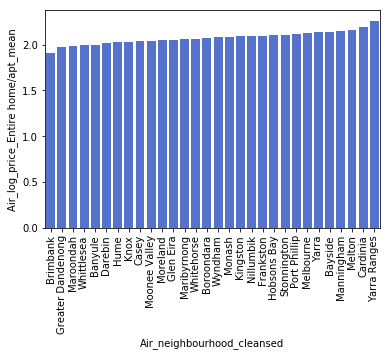

In [5]:
ax = sns.barplot(x="Air_neighbourhood_cleansed", y="Air_log_price_Entire home/apt_mean", data=data, color=col1)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

From the table above we observe that the differences between the means are small. However, the standard errors of the estimations are small too. Without using statistical tests there seems to be some evidence that airbnb prices might be differ among neighbourhoods. 

Even if we correctly assume that the prices are different between suburbs we do not know what causes these differences. Possible reasons are for example that some suburbs are located nearer to the centre - also known as the Melbourne city centre or CBD - or the seadside, or are safer. People may value these attributes and are willing to pay higher prices. 

The goal of this project is to predict airbnb prices. One question of interest is whether we can improve the accuracy of our predictions when additional data on house prices, crime rates or other information related to the neighbourhood as for example the airbnb prices within a given radius from the reference observation are taken into account. Regarding crimes, Xu, Kim and Pennington-Gray (student project) conclude that "Airbnb is positively related to property crime and negatively related to violent crime" (p. 9). A high proportion of property crimes could thus be a proxy for high demand for airbnb accommondations, which positively affects prices if supply falls short. For the City of Melbourne provides this unique set of information is available.

<!---The goal of this project is to shed light on how external data about housing prices and crime rates can be used to improve **predictions** of airbnb prices. There are two questions of interest:--->
The following research questions summarizes our goal.
<!---1. Is it possible to replace the neighbourhood and suburb variable in the airbnb dataset by external variables from either from the housing market or from the crime statistics provided by the City of Melbourne to achieve the same prediction accuracy? -->
1. Are external data as housing prices or information about crime rates helpful to predict airbnb prices?
<!---2. Can a better performance be achieved if the information about the longitude and latitude is used to aggregate the external data because aggregations could be finer and more appropriate (see the illustration)?--->
2. Can predictions be improved if data of neighbouring airbnb or house prices are aggregated in a finer way based on the exact location represented by the longitude and latitude? 

The idea behind question 2) is illustrated in Fig. 1. The aggregation can also be done w.r.t. another variable as for instance the room or the property type. In such a set-up we could end up for example in aggregating all airbnb prices of the same room type that are located within a given radius. 

<!--- https://stackoverflow.com/questions/14675913/changing-image-size-in-markdown 
https://www.w3schools.com/tags/tag_figcaption.asp
--->
<center>
<img src="/Images/Fig_1.png" alt="drawing" width="350"/>
    <figcaption> <b> Fig. 1: </b> Constructed aggregation of neighbouring accommodations. </figcaption>
</center>

<br>

Literature <br>
- XU, Yua-Hua; Kim, Jim-won; and Pennington-Gray, Lori, "Explore the Spatial Relationship between Airbnb Rental and Crime" (2017). *Travel and Tourism Research Association: Advancing Tourism Research Globally. 5.*

### Methodology

Next, we need to find a computationllay feasable way to select observations that lie within a given radius to the reference observation. A possible way is to construct a square represented by the differences in longitude and latitude from the reference observation that surrounds the circle of interest and then to select the observations that lie within the circle. Therefore, we need to find a way to derive the differences in longitude and latitude given a radius measured in meters, kilometers or another distance measure.

From the literature it is known that the distance in km between two points with longitude and latitude measured in radians is given by (https://stackoverflow.com/questions/29545704/fast-haversine-approximation-python-pandas):

$$ d = 6367 \times 2 \times  \arcsin \Big(\sqrt{\sin(d_{lat}/2 )^2 + \cos(lat_1) \times \cos(lat_2) \times \sin(d_{lon}/2)^2} \Big)$$

where $d_{lon} := lon_2 - lon_1$ and $d_{lat} := lat_2 - lat_1$.

For this project we start with a distance $d_{max}$ to then calculate:

\begin{align}
d_{lon} &= 2 \times \arcsin\Big( \sqrt{ \arcsin(a/\cos(lat_1)^2) } \Big) \\
d_{lat} &= 2 \times \arcsin\Big(\sqrt{a}\Big)
\end{align}

given that $d_{lat} = 0$ and $d_{lon} = 0$, respectively, where $a = \sin(d_{max} / (6367 \times 2))^2$ in order to extract candidates, which are then tested with the distance formula. The approach is graphically illustrated in Fig. 2.

<center>
<img src="/Images/Fig_2.png" alt="drawing" width="350"/>
    <figcaption> <b> Fig. 2: </b> The approach to select neighbouring accommodations. </figcaption>
</center>

### Uniqueness of the work and related projects

There are many projects that deal with airbnb data in general or Melbourne housing data. This work is to my knowledge unique in two ways:
1. None of the project so far focuses on additional data as we do by investigating whether airbnb prices are influenced or just correlated by house prices or crime rates.
2. We deal with alternative forms of prices aggregations, e.g by selecting neighbouring accommodations or house that lie within a circle and are of the same kind, e.g. same room, property (airbnb dataset) or house type (housing dataset).

We are going to see that idea 1) does not and idea 2) does help to improve predictions. 

**Related works w.r.t the datasets**

*housing_market:*

- https://rpubs.com/kunaljubce/mlb_housing_data

*airbnb:*

- https://medium.com/datadriveninvestor/exploratory-data-analysis-on-airbnb-properties-in-paris-bce61bd680c8
- https://medium.com/@jeffrisandy/where-to-stay-in-beijing-airbnb-795bb184acd7

## 2) The data

### (a) Clear overview of your data

In this section we inspect the data in order to get a clear understanding of the variables. This is important to decide which variables and observations can be later used in the modelling part. In particular the following points are adressed for all of the three datasets:

1. What are the variables (*I. Variables*)?
2. How are the variables distributed (*II. Distribution*)?
3. How do we deal with missing values, implausible values and outliers (*III. Cleaning*)

The actual cleaning is done in *IV. Implementation*.

<!--- The points 1), 2) and 3) are investigated for the three datasets airbnb, housing, and crime.--->

#### Airbnb data

Airbnb data as of 2018/12/07 can be downloaded from http://insideairbnb.com/get-the-data.html. This is the main dataset and the goal is to predict the airbnb price. Let's inspect this data. The function ``prepro_dataset()``cleans the variable ``smart_location``so that values from the other datasets can be merged to the airbnb dataset later. 

In [6]:
dirname = os.path.abspath('')
filename = os.path.join(dirname, "Airbnb/2018_12_07/listings.csv")

# import the data
airbnb_df = air.import_data(filename)

# preprocessing the dataset
# airbnb prices as float, cleaning smart_location to fit to the housing_market dataset
airbnb_prepro_df = air.prepro_dataset(airbnb_df, restrict=None)

airbnb_df.head(1)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,9835,https://www.airbnb.com/rooms/9835,20181207034809,2018-12-07,Beautiful Room & House,NaN,"House: Clean, New, Modern, Quite, Safe. 10Km f...","House: Clean, New, Modern, Quite, Safe. 10Km f...",none,Very safe! Family oriented. Older age group.,...,f,NaN,NaN,f,f,strict_14_with_grace_period,f,f,1,0.04


In [7]:
airbnb_df.shape # (22895, 96)

(22895, 96)

**I. Variables**

The airbnb dataset contains 96 variables. The entries of the variable ``listing_url`` are unique. The latter implies that none of the airbnb accommodation is listed twice. The data is scraped either on the 7th or 8th of December 2018.

In [8]:
# Number of features
len(airbnb_df.columns) # 96 including id, listing_url, scrape_id, last_scraped etc.

96

In [9]:
len(airbnb_df.loc[:, 'listing_url'].unique()) # 22895
airbnb_df.loc[:, 'last_scraped'].unique(); # array(['2018-12-07', '2018-12-08'], dtype=object)

**Descritption of the variables**

Next, a description of the variables is provided.

**id:** the id. <br>
**listing_url:** the url. <br>
**scrape_id:** scrape id. <br>
**last_scraped:** the date when the data was scraped. <br>
**name:** name or description of the apartment. <br>
**summary:** description of the accommodation. <br>
**space:** description of the space. <br>
**description:** another description. <br>
**experiences_offered:** no information, is always 'none'. <br>
**neighborhood_overview:** description of the neighbourhood. <br>
**notes:** additional information. <br>
**transit:** information about the nearest bus or tram stations. <br>
**access:** access to kitchen, bathrooms, wifi, pools etc. <br>
**interaction:** description of the social interactions between guests and host. <br>
**house_rules:** the house rules. <br>
**thumbnail_url:** no information, is always NaN. <br>
**medium_url:** no information, is always NaN. <br>
**picture_url:** the url to the picture. <br>
**xl_picture_url:** no information, is alwas nan. <br>
**host_id:** the host id. <br>
**host_url:** the url to the host on airbnb.com. <br>
**host_name:** the name of the host. <br>
**host_since:** date since the host started to be host. <br>
**host_location:** location of the host. <br>
**host_about:** information about the hosts. <br>
**host_response_time:** host's time to response. <br>
**host_response_rate:** the response rate of the host. <br>
**host_acceptance_rate:** no information, is always NaN. <br>
**host_is_superhost:** whether the host is superhost or not. <br>
**host_thumbnail_url:** host's thumbnail url. <br>
**host_picture_url:** host's picture url. <br>
**host_neighbourhood:** host's neighbourhood. <br>
**host_listings_count:** number of listings of the host. <br>
**host_total_listings_count:** number of listings in total of the host, not difference to 'host_listings_count'. <br>
**host_verifications:** means to verify the host e.g. email, phone, review, government_id. <br>
**host_has_profile_pic:** whether the host has a profile pic or not. <br>
**host_identity_verified:** whether the host's identity is verified or not. <br>
**street:** information about the location of the accommodation, no street names, but rather neighbourhoods. <br>
**neighbourhood:** the neighbourhood where the accommodation is located. <br>
**neighbourhood_cleansed:** the neighbourhood. <br>
**neighbourhood_group_cleansed:** no information, is always NaN. <br>
**city:** the name of the city or suburb. <br>
**state:** the state. <br>
**zipcode:** the zip code. <br>
**market:** meaning unclear. <br>
**smart_location:** the neighbourhood or suburb. <br>
**country_code:** the country code, always 'AU' for Australia. <br>
**country:** the name of the country, always 'Australia'. <br>
**latitude:** the latitude. <br>
**longitude:** the longitude. <br>
**is_location_exact:** whether the location is exact or not. <br>
**property_type:** whether it is a house, apartment, townhouse etc. <br>
**room_type:** whether the entire home/apartment or only a private room is rent. <br>
**accommodates:** number of person the home accommodates. <br>
**bathrooms:** number of bathrooms. <br>
**bedrooms:** number of bedrooms. <br>
**beds:** number of beds. <br>
**bed_type:** the bed type e.g. real bed, futon, pull-out sofa etc. <br>
**amenities:** the amenities. <br>
**square_feet:** the size of the accommodation. <br>
**price:** the price in (AUS) dollar. <br>
**weekly_price:** the weekly price in (AUS) dollar. <br>
**monthly_price:** the monthly price in (AUS) dollar. <br>
**security_deposit:** the security deposit in (AUS) dollar.<br>
**cleaning_fee:** the cleaning fee in (AUS) dollar. <br> 
**guests_included:** number of guests included. <br>
**extra_people:** how much extra people cost. <br>
**minimum_nights:** the minimum number of nights to stay. <br>
**maximum_nights:** the maximum number of nights to stay. <br>
**calendar_updated:** the last time the calendar was updated. <br>
**has_availability:** no information, always 't'. <br>
**availability_30:** the number of days the accommodation is available in the next 30 days. <br>
**availability_60:** the number of days the accommodation is available in the next 60 days. <br>
**availability_90:** the number of days the accommodation is available in the next 90 days. <br>
**availability_365:** the number of days the accommodation is available in the next 365 days. <br>
**calendar_last_scraped:** the date when the calendar was scraped for the last time. <br>
**number_of_reviews:** the number of reviews. <br>
**first_review:** the date of the first review. <br>
**last_review:** the date of the last review. <br>
**review_scores_rating:** the rating of the review score. <br>
**review_scores_accuracy:** the accuracy of the presentation of the space. <br>
**review_scores_cleanliness:** the review score for the cleanliness. <br> 
**review_scores_checkin:** the review score for the check-in. <br>
**review_scores_communication:** the review score for the communication. <br>
**review_scores_location:** the review score for the location. <br>
**review_scores_value:** the review score for the price. <br>
**requires_license:** no information, is always 'f'. <br>
**license:** no information, is always NaN. <br>
**jurisdiction_names:** noinformation, is always nan. <br>
**instant_bookable:** whether the accommodation is instantly bookable or not. <br>
**is_business_travel_ready:** no information, is always 'f'. <br>
**cancellation_policy:** information about the cancellation policy. <br>
**require_guest_profile_picture:** whether a guest profile picture is required or not. <br>
**require_guest_phone_verification:** whether a guest phone verification is required or not. <br>
**calculated_host_listings_count:** similar to 'host_listings_count' or 'host_total_listings_count'. <br>
**reviews_per_month:** number of reviews per month.

**Numerical and categorical variables**

The variables are now classified as *numerical*, *categorical* or *messy textual variables*. Dates are classified as numeric values. 

**numerical:** last_scraped, host_since, host_response_rate, host_listings_count, host_total_listings_count, latitude, longitude, accommodates, bathrooms, bedrooms, beds, square_feet, price, weekly_price, monthly_price, security_deposit, cleaning_fee, guests_included, extra_people, minimum_nights, maximum_nights, availability_30, availability_60, availability_90, availability_365, calendar_last_scraped, number_of_reviews, first_review, last_review, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_communication, review_scores_location, review_scores_value, calculated_host_listings_count, reviews_per_month

**categorical variables:** host_is_superhost, host_neighbourhood, host_has_profile_pic, host_identity_verified, street, neighbourhood, neighbourhood_cleansed, city, state, zipcode, smart_location, is_location_exact, property_type, room_type,
bed_type, instant_bookable, cancellation_policy, require_guest_profile_picture, require_guest_phone_verification

**messy textual data:**
name, summary, space, description, neighborhood_overview, notes, transit, access, interaction, house_rules, host_about, amenities, calendar_updated

In [10]:
airbnb_numeric = ['price', 'weekly_price', 'monthly_price', 'security_deposit',
                 'cleaning_fee', 'extra_people',
                 'last_scraped', 'calendar_last_scraped', 'first_review', 
                 'last_review',
                 'host_response_rate', 
                 'host_listings_count', 'host_total_listings_count',
                 'latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms',
                 'beds', 'square_feet', 'guests_included', 'minimum_nights', 
                 'maximum_nights', 'availability_30', 'availability_60',
                 'availability_90', 'availability_365', 'number_of_reviews',
                 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
                 'review_scores_checkin', 'review_scores_communication', 
                 'review_scores_location', 'review_scores_value', 'calculated_host_listings_count',
                 'reviews_per_month']
airbnb_categorical = ['host_is_superhost', 'host_neighbourhood', 'host_has_profile_pic', 
                      'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 
                      'city', 'state', 'zipcode', 'smart_location', 'is_location_exact', 'property_type', 
                      'room_type', 'bed_type', 'instant_bookable', 'cancellation_policy', 
                      'require_guest_profile_picture', 'require_guest_phone_verification']

**II. Distribution**

**Ranges of the numerical variables**

Next, the ranges of the numeric variables are inspected. We see that some of the variables have a huge range. Some of these observations might be outliers and should be removed for modelling becaused they can negatively influence the model estimation.

In [11]:
columns = ['Air_' + col_name for col_name in airbnb_numeric]
airbnb_range = pd.concat([airbnb_prepro_df.loc[:, columns].apply(np.min, axis=0),
                          airbnb_prepro_df.loc[:, columns].apply(np.max, axis=0)], axis=1)
airbnb_range.columns = ['min', 'max']
airbnb_range

,min,max
Air_price,0,12624
Air_weekly_price,91,11536
Air_monthly_price,400,54258
Air_security_deposit,0,6950
Air_cleaning_fee,0,867
Air_extra_people,0,421
Air_last_scraped,2018-12-07 00:00:00,2018-12-08 00:00:00
Air_calendar_last_scraped,2018-12-07 00:00:00,2018-12-08 00:00:00
Air_first_review,2010-08-04 00:00:00,2018-12-07 00:00:00
Air_last_review,2013-01-05 00:00:00,2018-12-07 00:00:00


**Values of categorical variables**

Next, it is checked what categories the categorical variables can take. We observe  for example that:

- For 17'248 observations the location measured as longitude and latitude is exact, and for 5'647 not. <br>
- The room type is in 14'379 cases an entire home or apartment, in 8'116 cases a private room and in 400 cases a shared room. <br>
- The bed type is almost always a bed (22'730) and only in a few cases a pull-out sofa (70), a futon (69) an airbed (17) and a couch (9).

It is clear that even if it were the case that the airbnb price for example apartments with pull-out sofa are substantially cheaper than apartments with a pull-out sofa, or a futon, the effects on the overall prediction is negligeble because the bed type is in 99% a real bed. 

In [12]:
# Previously cell 8
columns = ['Air_' + col_name for col_name in airbnb_categorical]

for name in columns:
    print(name)
    print("-------------------------------------------")
    print(airbnb_prepro_df.loc[:, name].value_counts())
    print("")

Air_host_is_superhost
-------------------------------------------
f    17519
t     5373
Name: Air_host_is_superhost, dtype: int64

Air_host_neighbourhood
-------------------------------------------
Central Business District         3537
Southbank                         1009
St Kilda                           976
South Yarra                        834
Brunswick                          625
Docklands                          517
Richmond                           506
Carlton                            459
Prahran/Windsor                    286
Northcote                          280
Abbotsford                         270
Port Melbourne                     270
East Melbourne                     251
South Melbourne                    245
Fitzroy                            237
Elwood                             230
North Melbourne                    230
Caulfield                          225
Fitzroy North                      203
Hawthorn                           199
Collingwood           

**Distribution of the airbnb price and other variables**

The distribution of the variables are shown below.

*Continuous variables*

From the boxplots and the density plots we observe that many of the continuous variables contain outliers and have a skewed distribution.

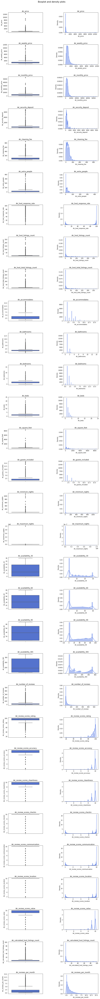

In [13]:
variables = airbnb_numeric.copy() 
variables = ['Air_' + v for v in variables if v not in ('last_scraped', 'calendar_last_scraped', 'first_review', 
                 'last_review', 'latitude', 'longitude')]
            
fig, axes = plt.subplots(nrows=len(variables), ncols=2, figsize=(12,120))

# 'top' to position the suptitle (https://stackoverflow.com/questions/8248467/
# matplotlib-tight-layout-doesnt-take-into-account-figure-suptitle)
plt.subplots_adjust(wspace=0.6, hspace=0.6, top=0.97) 
#https://stackoverflow.com/questions/7066121/how-to-set-a-single-main-title-above-all-the-subplots-with-pyplot
fig.suptitle("Boxplot and density plots", fontsize=16)   

for i,var in enumerate(variables):
    
    data = airbnb_prepro_df.loc[:, var].dropna()
    sns.boxplot(y=data, ax=axes[i,0], color=col1)
    axes[i,0].set_title(var)
    axes[i,0].set_ylabel(var)
    if var in ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms', 'Air_beds', 'Air_guests_included']:
        plot_kde = False
    else:
        plot_kde = True
    sns.distplot(data, ax=axes[i,1], kde=plot_kde, color=col1)
    axes[i,1].set_title(var)
    axes[i,1].set_ylabel("Density")

The airbnb price is skewed to the right. In such a situation a log-transformation could help to obtain a distribution with a 'nicer', i.e. more normal shape, which is done in the following.

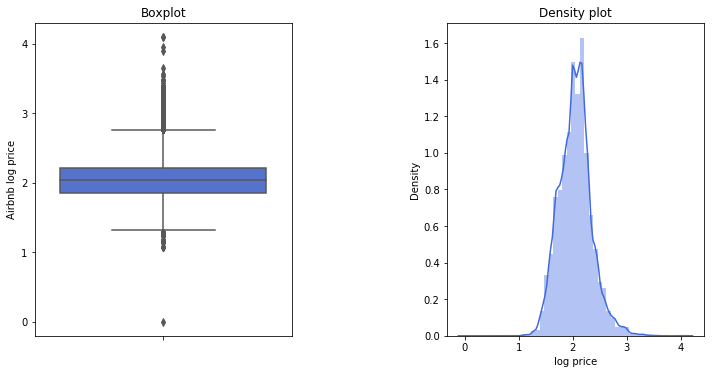

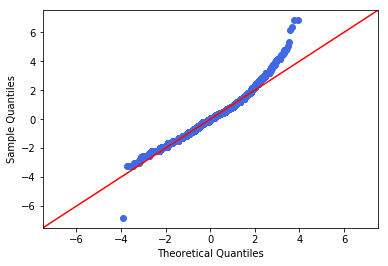

In [14]:
# modified
fig, axes = plt.subplots(1, 2, figsize=(12,6))
plt.subplots_adjust(wspace=0.6, top=0.85) 

# Boxplot
sns.boxplot(y=np.log10(airbnb_prepro_df.Air_price), ax=axes[0], color=col1)
axes[0].set_title("Boxplot")
axes[0].set_ylabel('Airbnb log price');

# Density plot
tmp = airbnb_prepro_df.loc[airbnb_prepro_df.Air_price > 0, 'Air_price']
sns.distplot(np.log10(tmp), color=col1)
axes[1].set_title("Density plot")
axes[1].set_ylabel("Density")
axes[1].set_xlabel("log price")

# QQ plot
tmp = airbnb_prepro_df.loc[airbnb_prepro_df.Air_price > 0, 'Air_price']
tmp = np.log10(tmp)
stdized = (tmp - np.mean(tmp)) / np.std(tmp)
sm.qqplot(stdized, line='45', color=col1);

*Categorical variables*

Next, we take a look at the distribution of some categorical variables. We observe that some of the categories have only a few observations. As already discussed this above these variables are not so helpful for predicting airbnb prices.

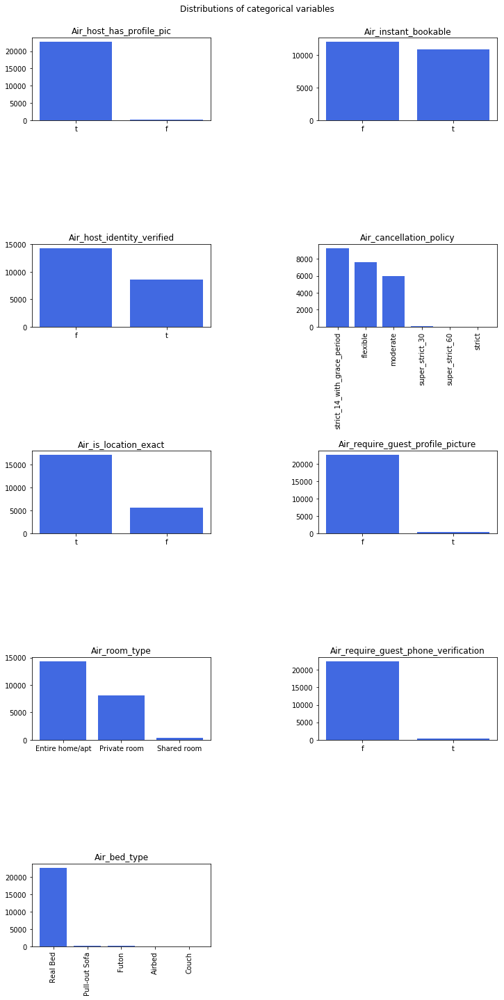

In [15]:
tmp = ['Air_host_has_profile_pic', 'Air_host_identity_verified', 'Air_is_location_exact', 'Air_room_type', 'Air_bed_type', 
'Air_instant_bookable', 'Air_cancellation_policy', 'Air_require_guest_profile_picture', 'Air_require_guest_phone_verification']
fig, axes = plt.subplots(int(np.ceil(len(tmp)/2)),2, figsize=(12, 22))
plt.suptitle("Distributions of categorical variables")
plt.subplots_adjust(wspace=0.6, hspace=1.5, top=0.95) 
for i in range(len(tmp)):
    if i < len(tmp)/2:
        h = airbnb_prepro_df.loc[:, tmp[i]].value_counts().to_list()
        names = airbnb_prepro_df.loc[:, tmp[i]].value_counts().index.to_list()
        axes[i,0].bar(x=range(len(h)), height=h, color=col1)
        axes[i,0].set_xticks(range(len(h)))
        if tmp[i] in ('Air_bed_type', 'Air_cancellation_policy'):
            r = 90
        else:
            r = 0
        axes[i,0].set_xticklabels(names, rotation=r)
        axes[i,0].set_title(tmp[i])
    else:
        j = i - int(np.ceil(len(tmp)/2))
        h = airbnb_prepro_df.loc[:, tmp[i]].value_counts().to_list()
        names = airbnb_prepro_df.loc[:, tmp[i]].value_counts().index.to_list()
        axes[j,1].bar(x=range(len(h)), height=h, color=col1)
        axes[j,1].set_xticks(range(len(h)))
        if tmp[i] in ('Air_bed_type', 'Air_cancellation_policy'):
            r = 90
        else:
            r = 0
        axes[j,1].set_xticklabels(names, rotation=r)
        axes[j,1].set_title(tmp[i])
axes[4,1].remove()

**III. Cleaning**

We have seen so far that a log-transformation can make the distribution 'nicer'. However, the log-price and the other variables still contain missing or implausible values and outliers. This is the topic of this section.

**Missing values**

Let's take a look at the missing values. The worst variable regarding missing values is `Air_square_feet` which is missing for every observation.

In [16]:
columns = ['Air_' + el for el in airbnb_numeric + airbnb_categorical if el not in 
           ['weekly_price', 'monthly_price']]

# the variable 'smart_location' is used to locate the neighbourhood, so we don't need other location variables.
unimportant_loc_vars = ['Air_city', 'Air_state', 'Air_zipcode']
for v in unimportant_loc_vars:
    columns.remove(v)
    
airbnb_sorted_non_missing = airbnb_prepro_df.loc[:, columns].isnull().sum().sort_values(ascending=True)
airbnb_sorted_non_missing

Air_price                                   0
Air_availability_30                         0
Air_availability_60                         0
Air_availability_90                         0
Air_availability_365                        0
Air_require_guest_profile_picture           0
Air_calculated_host_listings_count          0
Air_street                                  0
Air_neighbourhood_cleansed                  0
Air_smart_location                          0
Air_is_location_exact                       0
Air_property_type                           0
Air_room_type                               0
Air_bed_type                                0
Air_instant_bookable                        0
Air_cancellation_policy                     0
Air_maximum_nights                          0
Air_minimum_nights                          0
Air_number_of_reviews                       0
Air_require_guest_phone_verification        0
Air_guests_included                         0
Air_calendar_last_scraped         

*Exact location*

Airbnb provides the option to share the exact location of the accommodation. More than 75% of the hosts choose this option. The variable does not contain missing values. Exact location can be preferred when combining datasets based on latitude and longitude. We do not distinguish between exact and not exact location in order to have more observations.

Source:
https://community.withairbnb.com/t5/Hosting/Showing-exact-location-to-guests/td-p/630767

In [17]:
airbnb_prepro_df.Air_is_location_exact.value_counts()

t    17248
f     5647
Name: Air_is_location_exact, dtype: int64

*Potential model size*

How does the number of non-missing values evolve with the number of variables considered? To check this the variables are ordered in a decreasing manner according to the number of non-missing values. We observe that the best 35 variables in terms of the number of non-missing values do not substantially decrease the number of observations when considered. Hence, we could use these 35 variables without losing a lot of observations later in a model.

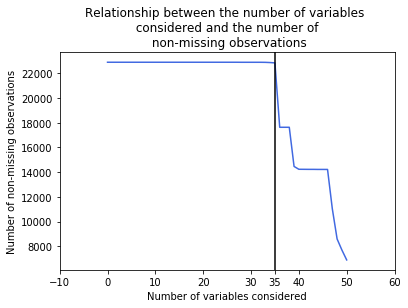

In [18]:
# previously cell 22
non_missing_obs = []

for i,c in enumerate(airbnb_sorted_non_missing.index):
    cols = airbnb_sorted_non_missing.index[:i]
    non_missing_obs.append(airbnb_prepro_df.loc[:, cols].dropna(how='any').shape[0])

plt.plot(non_missing_obs, color=col1)
plt.title("Number of non-missing values in relation \n to the number of variables considered")
plt.axvline(x=len(non_missing_obs)-16, color='black')
plt.xticks(list(plt.xticks()[0]) + [len(non_missing_obs)-16])
plt.ylabel("Number of non-missing observations")
plt.xlabel("Number of variables considered")
plt.title("Relationship between the number of variables \n considered and the number of \n non-missing observations");

**Implausible values**

There are some implausible values. The price is for example zero for 21 observations and there are 7 observations where the price for one night is larger than the price for a week or month. These observations will be excluded later.

In [19]:
airbnb_prepro_df.loc[airbnb_prepro_df.Air_price == 0, ['Air_name', 'Air_price', 'Air_weekly_price', 
                                                       'Air_monthly_price', 'Air_security_deposit', 
                                                       'Air_cleaning_fee', 'Air_extra_people', 
                                                       'Air_minimum_nights']].head(5)

,Air_name,Air_price,Air_weekly_price,Air_monthly_price,Air_security_deposit,Air_cleaning_fee,Air_extra_people,Air_minimum_nights
9875,Loongana Room,0.0,NaN,NaN,0.0,80.0,0.0,1.0
10109,Central Healesville loft apartment,0.0,NaN,NaN,135.0,35.0,0.0,1.0
10962,Ellia Apartments - Doncaster ( LG5 - N ),0.0,NaN,NaN,200.0,75.0,0.0,2.0
10965,Ellia Apartments - Doncaster ( LG6 - N ),0.0,NaN,NaN,200.0,75.0,0.0,2.0
10966,Ellia Apartments - Doncaster ( LG7-N ),0.0,NaN,NaN,200.0,75.0,0.0,2.0


In [20]:
impl_obs = airbnb_prepro_df.loc[(airbnb_prepro_df.Air_price >= airbnb_prepro_df.Air_weekly_price) |
                                (airbnb_prepro_df.Air_price >= airbnb_prepro_df.Air_monthly_price), 
                                ['Air_price', 'Air_weekly_price', 'Air_monthly_price']]
impl_obs

,Air_price,Air_weekly_price,Air_monthly_price
376,500.0,500.0,1800.0
1583,860.0,500.0,2000.0
2331,150.0,150.0,NaN
2584,550.0,NaN,550.0
4672,440.0,280.0,NaN
5168,999.0,290.0,990.0
6704,999.0,599.0,2199.0


**Outliers**

*Numerical variables (continuous or discrete)*

We see that there are only a few accommodations with very high prices above 500 and 1'000 dollar.

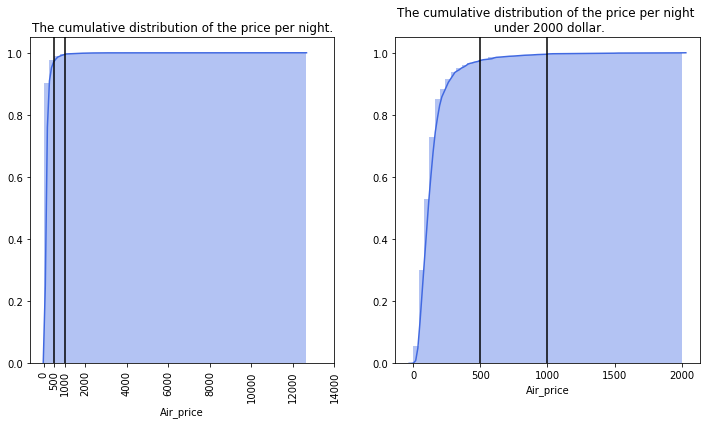

In [21]:
#https://stackoverflow.com/questions/39297523/plot-cdf-cumulative-histogram-using-seaborn-python
fig, axes = plt.subplots(1,2, figsize=(12, 6))

sns.distplot(airbnb_prepro_df.Air_price, hist_kws=dict(cumulative=True), kde_kws=dict(cumulative=True),
            ax=axes[0], color=col1)
axes[0].axvline(x=500, color='black')
axes[0].axvline(x=1000, color='black')
ticks = [int(t) for t in list(axes[0].get_xticks()) if t >= 0] # to get rid of negative ticks
axes[0].set_xticks(ticks + [500, 1000]);
axes[0].set_xticklabels(ticks + [500, 1000], rotation=90)
axes[0].set_title('The cumulative distribution of the price per night.')

sns.distplot(airbnb_prepro_df.loc[airbnb_prepro_df.Air_price <= 2000, 'Air_price'], 
                                   hist_kws=dict(cumulative=True), kde_kws=dict(cumulative=True),
            ax=axes[1], color=col1)
axes[1].axvline(x=500, color='black')
axes[1].axvline(x=1000, color='black')
axes[1].set_title('The cumulative distribution of the price per night \n under 2000 dollar.');

To detect outliers in a more automatic way and not only restricted to the airbnb price variable, observations are defined as outliers if they lie outside of the interval [Q1 - 1.5\*IQR, Q3 + 1.5\*IQR]. Another approach (not followed here) is to use Z-scores, i.e. to standardize the data so that it has mean zero and a standard deviation of one, and to define observations with e.g |Z-score| > 3 as outliers (https://towardsdatascience.com/ways-to-detect-and-remove-the-outliers-404d16608dba).

In [22]:
variables = airbnb_numeric.copy() 
variables = ['Air_' + v for v in variables if v not in ('last_scraped', 'calendar_last_scraped', 'first_review', 
                 'last_review', 'latitude', 'longitude', 'weekly_price', 'monthly_price', 'security_deposit',
                                                       'cleaning_fee', 'square_feet')]

tmp = airbnb_prepro_df.loc[:, variables]

tmp['Air_log_price'] = np.log10(tmp.Air_price)
tmp.drop(columns='Air_price', inplace=True)
quantiles = tmp.quantile([.25, .75])
iqr = quantiles.iloc[1, :] - quantiles.iloc[0, :]
upper_bounds = quantiles.iloc[1, :] + 1.5*iqr
lower_bounds = quantiles.iloc[0, :] - 1.5*iqr
upper_bounds

airbnb_prepro_df_wo_out = tmp.loc[(tmp.Air_extra_people >= lower_bounds.iloc[0]) & (tmp.Air_extra_people <= upper_bounds.iloc[0]) & 
                                  (tmp.Air_host_response_rate >= lower_bounds.iloc[1]) & (tmp.Air_host_response_rate <= upper_bounds.iloc[1]) &
                                  (tmp.Air_host_listings_count >= lower_bounds.iloc[2]) & (tmp.Air_host_listings_count <= upper_bounds.iloc[2]) &
                                  (tmp.Air_host_total_listings_count >= lower_bounds.iloc[3]) & (tmp.Air_host_total_listings_count <= upper_bounds.iloc[3]) &
                                  (tmp.Air_accommodates >= lower_bounds.iloc[4]) & (tmp.Air_accommodates <= upper_bounds.iloc[4]) &
                                  (tmp.Air_bathrooms >= lower_bounds.iloc[5]) & (tmp.Air_bathrooms <= upper_bounds.iloc[5]) &
                                  (tmp.Air_bedrooms >= lower_bounds.iloc[6]) & (tmp.Air_bedrooms <= upper_bounds.iloc[6]) &
                                  (tmp.Air_beds >= lower_bounds.iloc[7]) & (tmp.Air_beds <= upper_bounds.iloc[7]) &
                                  (tmp.Air_guests_included >= lower_bounds.iloc[8]) & (tmp.Air_guests_included <= upper_bounds.iloc[8]) &
                                  (tmp.Air_minimum_nights >= lower_bounds.iloc[9]) & (tmp.Air_minimum_nights <= upper_bounds.iloc[9]) &
                                  (tmp.Air_maximum_nights >= lower_bounds.iloc[10]) & (tmp.Air_maximum_nights <= upper_bounds.iloc[10]) &
                                  (tmp.Air_availability_30 >= lower_bounds.iloc[11]) & (tmp.Air_availability_30 <= upper_bounds.iloc[11]) &
                                  (tmp.Air_availability_60 >= lower_bounds.iloc[12]) & (tmp.Air_availability_60 <= upper_bounds.iloc[12]) &
                                  (tmp.Air_availability_90 >= lower_bounds.iloc[13]) & (tmp.Air_availability_90 <= upper_bounds.iloc[13]) &
                                  (tmp.Air_availability_365 >= lower_bounds.iloc[14]) & (tmp.Air_availability_365 <= upper_bounds.iloc[14]) &
                                  (tmp.Air_number_of_reviews >= lower_bounds.iloc[15]) & (tmp.Air_number_of_reviews <= upper_bounds.iloc[15]) &
                                  (tmp.Air_review_scores_rating >= lower_bounds.iloc[16]) & (tmp.Air_review_scores_rating <= upper_bounds.iloc[16]) &
                                  (tmp.Air_review_scores_accuracy >= lower_bounds.iloc[17]) & (tmp.Air_review_scores_accuracy <= upper_bounds.iloc[17]) &
                                  (tmp.Air_review_scores_cleanliness >= lower_bounds.iloc[18]) & (tmp.Air_review_scores_cleanliness <= upper_bounds.iloc[18]) &
                                  (tmp.Air_review_scores_checkin >= lower_bounds.iloc[19]) & (tmp.Air_review_scores_checkin <= upper_bounds.iloc[19]) &
                                  (tmp.Air_review_scores_communication >= lower_bounds.iloc[20]) & (tmp.Air_review_scores_communication <= upper_bounds.iloc[20]) &
                                  (tmp.Air_review_scores_location >= lower_bounds.iloc[21]) & (tmp.Air_review_scores_location <= upper_bounds.iloc[21]) &
                                  (tmp.Air_review_scores_value >= lower_bounds.iloc[22]) & (tmp.Air_review_scores_value <= upper_bounds.iloc[22]) &
                                  (tmp.Air_calculated_host_listings_count >= lower_bounds.iloc[23]) & (tmp.Air_calculated_host_listings_count <= upper_bounds.iloc[23]) &
                                  (tmp.Air_reviews_per_month >= lower_bounds.iloc[24]) & (tmp.Air_reviews_per_month <= upper_bounds.iloc[24]) &
                                  (tmp.Air_log_price >= lower_bounds.iloc[25]) & (tmp.Air_log_price <= upper_bounds.iloc[25]), :]

airbnb_prepro_df_wo_out.head(5)

,Air_extra_people,Air_host_response_rate,Air_host_listings_count,Air_host_total_listings_count,Air_accommodates,Air_bathrooms,Air_bedrooms,Air_beds,Air_guests_included,Air_minimum_nights,...,Air_review_scores_rating,Air_review_scores_accuracy,Air_review_scores_cleanliness,Air_review_scores_checkin,Air_review_scores_communication,Air_review_scores_location,Air_review_scores_value,Air_calculated_host_listings_count,Air_reviews_per_month,Air_log_price
9,20.0,100.0,5.0,5.0,2.0,1.0,1.0,1.0,1.0,3.0,...,99.0,10.0,10.0,10.0,10.0,10.0,10.0,5.0,0.29,1.778151
21,50.0,100.0,1.0,1.0,4.0,1.0,1.0,2.0,2.0,2.0,...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,0.03,2.255273
22,0.0,100.0,5.0,5.0,1.0,1.0,1.0,1.0,1.0,2.0,...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,5.0,0.45,1.778151
43,0.0,100.0,3.0,3.0,2.0,1.0,1.0,1.0,1.0,1.0,...,96.0,10.0,10.0,10.0,10.0,10.0,9.0,2.0,0.31,2.206826
54,10.0,100.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,3.0,...,95.0,10.0,9.0,10.0,10.0,10.0,10.0,2.0,0.24,1.763428


Outliers of independent variables can lead to problems in a OLS estimation because they can heavily influence the slope of the regression line. Such points are also callied influential points. There are at least two ways to deal with such points. First, we can remove them, or second, we can use a robust regression method as e.g. the Huber regression (https://www.stat.cmu.edu/~cshalizi/mreg/15/lectures/20/lecture-20.pdf). Removing all outliers would result in our case in a very small dataset with only 3'101 observations, which is not practical. Hence, we remove only outliers of the price variable so far and estimate later also a Huber regression in the modelling part.

In [23]:
airbnb_prepro_df_wo_out.shape # (3101, 26)
airbnb_prepro_df_wo_out = airbnb_prepro_df.loc[(tmp.Air_log_price >= lower_bounds.iloc[25]) & (tmp.Air_log_price <= upper_bounds.iloc[25]),:]
airbnb_prepro_df_wo_out.shape

(22335, 97)

Next, we take a look at the distribution of the log prices without the outliers and see that the distribution has still fat tails. However, since the distribution looks better we will focus on log-transformed prices.

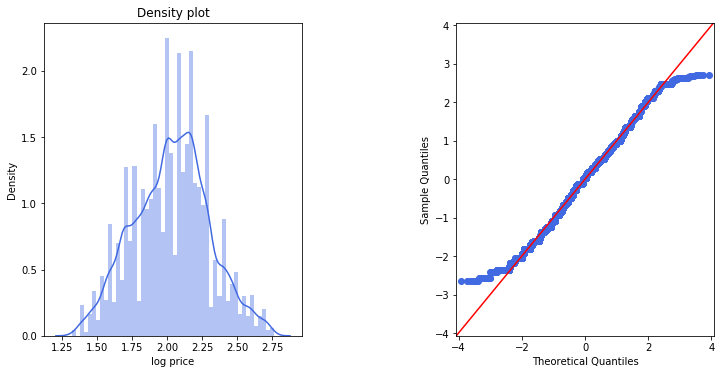

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(12,6))
plt.subplots_adjust(wspace=0.6, top=0.85) 

# Density plot
tmp = airbnb_prepro_df_wo_out.loc[airbnb_prepro_df_wo_out.Air_price > 0, 'Air_price']
sns.distplot(np.log10(tmp), ax=axes[0], color=col1)
axes[0].set_title("Density plot")
axes[0].set_ylabel("Density")
axes[0].set_xlabel("log price")

# QQ plot
tmp = airbnb_prepro_df_wo_out.loc[airbnb_prepro_df_wo_out.Air_price > 0, 'Air_price']
tmp = np.log10(tmp)
stdized = (tmp - np.mean(tmp)) / np.std(tmp)
sm.qqplot(stdized, line='45', ax=axes[1], color=col1);

*Categorical variables*

For the categorical variables we first take a look at the number of different categories and then at the number of observations of the smallest and largest category. We observe that some categories are not much populated and may have to be regrouped with other categories in a later step.

In [25]:
# modified
columns = ['Air_' + el for el in airbnb_categorical]
columns;
airbnb_prepro_df.loc[:, columns].apply(lambda x: len(x.unique()))

Air_host_is_superhost                     3
Air_host_neighbourhood                  115
Air_host_has_profile_pic                  3
Air_host_identity_verified                3
Air_street                              639
Air_neighbourhood                        60
Air_neighbourhood_cleansed               30
Air_city                                572
Air_state                                28
Air_zipcode                             253
Air_smart_location                      572
Air_is_location_exact                     2
Air_property_type                        35
Air_room_type                             3
Air_bed_type                              5
Air_instant_bookable                      2
Air_cancellation_policy                   6
Air_require_guest_profile_picture         2
Air_require_guest_phone_verification      2
dtype: int64

These are the numbers of observations for the least populated categories ...

In [26]:
airbnb_prepro_df.loc[:, columns].apply(lambda x: min(pd.value_counts(x)))

Air_host_is_superhost                    5373
Air_host_neighbourhood                      1
Air_host_has_profile_pic                   46
Air_host_identity_verified               8571
Air_street                                  1
Air_neighbourhood                          18
Air_neighbourhood_cleansed                 88
Air_city                                    1
Air_state                                   1
Air_zipcode                                 1
Air_smart_location                          1
Air_is_location_exact                    5647
Air_property_type                           1
Air_room_type                             400
Air_bed_type                                9
Air_instant_bookable                    10854
Air_cancellation_policy                     1
Air_require_guest_profile_picture         266
Air_require_guest_phone_verification      323
dtype: int64

... and these the numbers for the most populated categories. 

In [27]:
airbnb_prepro_df.loc[:, columns].apply(lambda x: max(pd.value_counts(x)))

Air_host_is_superhost                   17519
Air_host_neighbourhood                   3537
Air_host_has_profile_pic                22846
Air_host_identity_verified              14321
Air_street                               4221
Air_neighbourhood                        3726
Air_neighbourhood_cleansed               7368
Air_city                                 4237
Air_state                               21858
Air_zipcode                              3367
Air_smart_location                       4237
Air_is_location_exact                   17248
Air_property_type                       12469
Air_room_type                           14379
Air_bed_type                            22730
Air_instant_bookable                    12041
Air_cancellation_policy                  9282
Air_require_guest_profile_picture       22629
Air_require_guest_phone_verification    22572
dtype: int64

**IV. Implementation**

In this section the discussed adaptions are implemented. We first get rid of the implausible values, i.e. observations with an airbnb price of zero and observations where the price for one night is higher than the price for several nights.

In [28]:
airbnb_cleaned_df = airbnb_prepro_df.loc[(airbnb_prepro_df.Air_price != 0) &
                                          ~airbnb_prepro_df.index.isin(impl_obs.index), :]
airbnb_cleaned_df.shape

(22867, 97)

Next, the dataset is restricted to observations with a non-outlier log-price.

In [29]:
# modified
airbnb_cleaned_df['Air_log_price'] = np.log10(airbnb_cleaned_df.Air_price)
airbnb_cleaned_df['Air_log_price_per_acc'] = airbnb_cleaned_df.Air_log_price / airbnb_cleaned_df.Air_accommodates
airbnb_cleaned_df['Air_log_price_per_bedroom'] = airbnb_cleaned_df.Air_log_price / airbnb_cleaned_df.Air_bedrooms
airbnb_cleaned_df = airbnb_cleaned_df.loc[(airbnb_cleaned_df.Air_log_price >= lower_bounds.iloc[25]) & 
                                                     (airbnb_cleaned_df.Air_log_price <= upper_bounds.iloc[25]),:]
airbnb_cleaned_df.shape # (22331, 100)

(22331, 100)

**Spatial distribution of the prices**

To finish, the log-transformed airbnb prices per accommodate and per bedroom are plotted on a longitude-latitude grid. Accommodations that are located near the center (CBD) are more expensive than those that are in the periphery. The data is sorted in increasing order so that the observations with the highest prices were plotted on top.

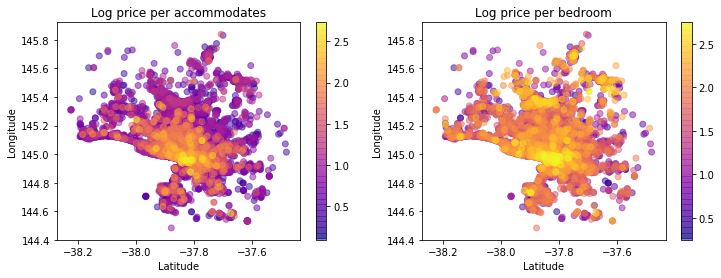

In [30]:
# modified
tmp = airbnb_cleaned_df.sort_values(by='Air_log_price_per_acc')
fig, ax = plt.subplots(1, 2, figsize=(12,4))
im = ax[0].scatter(tmp.Air_latitude, tmp.Air_longitude, 
                   c=tmp.Air_log_price_per_acc, cmap='plasma',
                   alpha=0.5)
fig.colorbar(im, ax=ax[0])
ax[0].set_title("Log price per accommodates")
ax[0].set_ylabel("Longitude")
ax[0].set_xlabel("Latitude")

tmp = airbnb_cleaned_df.sort_values(by='Air_log_price_per_bedroom')
im= ax[1].scatter(tmp.Air_latitude, tmp.Air_longitude, 
                  c=tmp.Air_log_price_per_bedroom, cmap='plasma',
                  alpha=0.5)
fig.colorbar(im, ax=ax[1])
ax[1].set_title("Log price per bedroom")
ax[1].set_ylabel("Longitude")
ax[1].set_xlabel("Latitude");

#### Housing market

The housing market dataset stores information about housess that are sold, going to be sold or are tried to be sold (https://www.kaggle.com/anthonypino/melbourne-housing-market). One goal of this project is to utilize this data to improve the prediction of airbnb prices. The funtion `clean_dataset()` corrects the misspelt variable names concerning the longitude and latitude, appends 'House_' as prefix, converts suburbs names to lower case and casts dates to datetime objects. We start by applying this function on our housing market dataset.

In [31]:
dirname = os.path.abspath('')
filename = os.path.join(dirname, "Housing_market/Melbourne_housing_FULL.csv")

# import the data
housing_df = house.import_data(filename)

# clean dataset
housing_prepro_df = house.prepro_dataset(housing_df)

housing_df.head(1)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067.0,...,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019.0


The dataset contains 34'857 observations.

In [32]:
housing_df.shape # (34857, 21)

(34857, 21)

**I. Variables**

21 variables about house prices, house types, locations and other characteristics of houses are part of the dataset.  

In [33]:
len(housing_df.columns)

21

**Description of the variables**

Again, we first describe the variables that are part of the dataset. The descriptions are gathered from https://www.kaggle.com/anthonypino/melbourne-housing-market. For the later usage of the dataset it is worth noting that transaction for which realized prices are available are labeled as 'S', 'SP' and 'SA'.

**Suburb:** the suburb. <br>
**Address:** the address. <br>
**Rooms:** the number of rooms. <br>
**Price:** the price in (AUS) dollars. <br>
**Method:** S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN - sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed. N/A - price or highest bid not available. <br>
**Type:** h - house, cottage, villa, semi, terrace; u - unit, duplex; t - townhouse. <br>
**SellerG:** the real estate agent. <br>
**Date:** the date sold. <br>
**Distance:** the distance from CBD in kilometers. <br>
**Regionname:** the general region (West, North West, North, North east ...etc). <br>
**Propertycount:** the number of properties that exist in the suburb. <br>
**Bedroom2:** scraped # of bedrooms (from different source). <br>
**Bathroom:** the number of bathrooms. <br>
**Car:** the number of carspots. <br>
**Landsize:** the land size in square metres. <br>
**BuildingArea:** the building size in square metres. <br>
**YearBuilt:** the year the house was built. <br>
**CouncilArea:** the governing council for the area. <br>
**Lattitude:** the latitude. <br>
**Longtitude:** the longitude.

**Numerical and categorical variables**

Variables are classified as numerical or categorical. As in the case of the airbnb dataset dates are interpreted as numerical values. 

**numerical**: Rooms, Price, Date, Distance, Propertycount, Bedroom2, Bathroom, Car, Landsize, BuildingArea, YearBuilt, Lattitude (sic!), Longtitude (sic!).

**categorical**: Suburb, Address, Method, Type, SellerG, Regionname, CouncilArea

In [34]:
housing_numeric = ['rooms', 'price', 'date', 'distance', 'propertycount', 'bedroom2', 'bathroom', 'car',
                  'landsize', 'buildingarea', 'yearbuilt', 'latitude', 'longitude']
housing_categorical = ['suburb', 'address', 'method', 'type', 'sellerg', 'regionname', 'councilarea']

**II. Distribtuion**

**Ranges of the numerical data**

Again, we take a look at the ranges of the continuous variables.

In [35]:
columns = ['House_' + col_name for col_name in housing_numeric]
housing_range = pd.concat([housing_prepro_df.loc[:, columns].apply(np.min, axis=0),
                          housing_prepro_df.loc[:, columns].apply(np.max, axis=0)], axis=1)
housing_range.columns = ['min', 'max']
housing_range

,min,max
House_rooms,1,16
House_price,85000,1.12e+07
House_date,2016-01-28 00:00:00,2018-03-17 00:00:00
House_distance,0,48.1
House_propertycount,83,21650
House_bedroom2,0,30
House_bathroom,0,12
House_car,0,26
House_landsize,0,433014
House_buildingarea,0,44515


**Values of categorical variables**

Now, we take a look at the categorical variables. From the output we can see that there are different house types and different methods how the price of the house is obtained. Most of the homes are of type 'h' (house) and the method is in most cases 'S' (property sold) or 'SP' (property sold prior) which means that the house was sold prior to the auction.

In [36]:
columns = ['House_' + col_name for col_name in housing_categorical]

for name in columns:
    print(name)
    print("-------------------------------------------")
    print(housing_prepro_df.loc[:, name].value_counts())
    print("")

House_suburb
-------------------------------------------
reservoir             844
bentleigh east        583
richmond              552
glen iris             491
preston               485
kew                   467
brighton              456
brunswick             444
south yarra           435
hawthorn              428
northcote             424
camberwell            423
balwyn north          420
essendon              409
coburg                405
glenroy               400
brighton east         393
pascoe vale           378
st kilda              374
port melbourne        371
malvern east          369
prahran               336
thornbury             322
balwyn                319
bentleigh             319
yarraville            304
surrey hills          293
elwood                288
moonee ponds          285
hawthorn east         284
                     ... 
wattle glen             2
plenty                  2
beaconsfield upper      2
healesville             2
lynbrook                2
hurstbr

**Distribution of the airbnb price and other variables**

The distributions of the variables are inspected below.

*Numerical variables (continuous or discrete)*

We plot the distribution of the continuous variables. The variable `landsize` contains many zeros (2'437 observation) and the variable `buildingarea` has some extreme values.

In [37]:
(housing_prepro_df.House_landsize == 0).sum(); # 2437 observations
(housing_prepro_df.House_buildingarea == 0).sum(); # 76
housing_prepro_df.House_buildingarea.max(); # 44515.0
housing_prepro_df.sort_values('House_buildingarea', ascending=False).loc[:, 'House_buildingarea'].head(5)

22632    44515.0
2466      6791.0
33405     6178.0
15003     4645.0
14387     3647.0
Name: House_buildingarea, dtype: float64

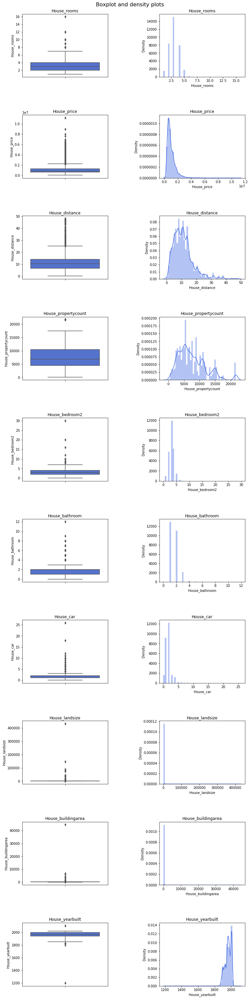

In [38]:
variables = housing_numeric.copy() 
variables = ['House_' + v for v in variables if v not in ('date', 'latitude', 'longitude')]
            
fig, axes = plt.subplots(nrows=len(variables), ncols=2, figsize=(12,48))

# 'top' to position the suptitle (https://stackoverflow.com/questions/8248467/
# matplotlib-tight-layout-doesnt-take-into-account-figure-suptitle)
plt.subplots_adjust(wspace=0.6, hspace=0.6, top=0.97) 
#https://stackoverflow.com/questions/7066121/how-to-set-a-single-main-title-above-all-the-subplots-with-pyplot
fig.suptitle("Boxplot and density plots", fontsize=16)   

for i,var in enumerate(variables):
    
    data = housing_prepro_df.loc[:, var].dropna()
    sns.boxplot(y=data, ax=axes[i,0], color=col1)
    axes[i,0].set_title(var)
    axes[i,0].set_ylabel(var)
    
    if var in ['House_rooms', 'House_bedroom2', 'House_bathroom', 'House_car']:
        plot_kde = False
    else:
        plot_kde = True
    
    sns.distplot(data, ax=axes[i,1], kde=plot_kde, color=col1)
    axes[i,1].set_title(var)
    axes[i,1].set_ylabel("Density")

Again, we get a 'nicer' distribution if the price is log-transformed. After the transformation the log house price is (almost) normally distributed as the quantile-quantile plot shows.

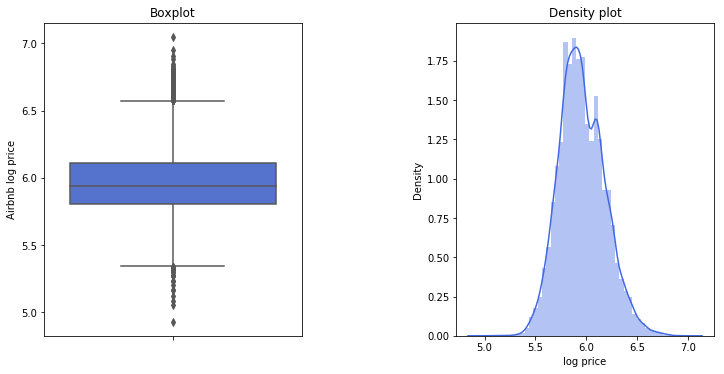

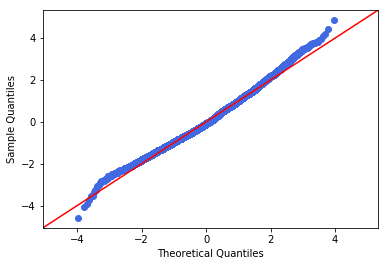

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(12,6))
plt.subplots_adjust(wspace=0.6, top=0.85) 

# Boxplot
sns.boxplot(y=np.log10(housing_prepro_df.House_price), ax=axes[0], color=col1)
axes[0].set_title("Boxplot")
axes[0].set_ylabel('Airbnb log price');

# Density plot
tmp = housing_prepro_df.loc[housing_prepro_df.House_price > 0, 'House_price']
sns.distplot(np.log10(tmp), color=col1)
axes[1].set_title("Density plot")
axes[1].set_ylabel("Density")
axes[1].set_xlabel("log price")

# QQ plot
tmp = housing_prepro_df.loc[housing_prepro_df.House_price > 0, 'House_price']
tmp = np.log10(tmp)
stdized = (tmp - np.mean(tmp)) / np.std(tmp)
sm.qqplot(stdized, line='45', color=col1);

*Categorical variables*

As it was already mentionned the method 'S' (property sold) is the most frequent method and most properties are houses ('h').

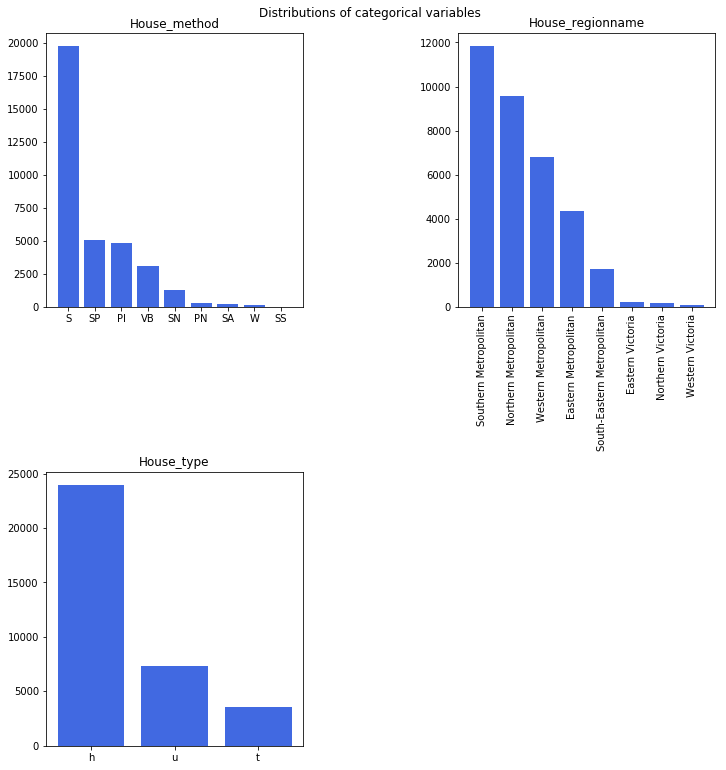

In [40]:
tmp = ['House_method', 'House_type', 'House_regionname']
fig, axes = plt.subplots(int(np.ceil(len(tmp)/2)),2, figsize=(12, 12))
plt.suptitle("Distributions of categorical variables")
plt.subplots_adjust(wspace=0.6, hspace=0.6, top=0.95) 
for i in range(len(tmp)):
    if i < len(tmp)/2:
        # The values are sorted in descending order
        h = housing_prepro_df.loc[:, tmp[i]].value_counts().to_list()
        names = housing_prepro_df.loc[:, tmp[i]].value_counts().index.to_list()
        axes[i,0].bar(x=range(len(h)), height=h, color=col1)
        axes[i,0].set_xticks(range(len(h)))
        if tmp[i] == 'House_regionname':
            r = 90
        else:
            r = 0
        axes[i,0].set_xticklabels(names, rotation=r)
        axes[i,0].set_title(tmp[i])
    else:
        j = i - int(np.ceil(len(tmp)/2))
        # The values are sorted in descending order
        h = housing_prepro_df.loc[:, tmp[i]].value_counts().to_list()
        names = housing_prepro_df.loc[:, tmp[i]].value_counts().index.to_list()
        axes[j,1].bar(x=range(len(h)), height=h, color=col1)
        axes[j,1].set_xticks(range(len(h)))
        if tmp[i] == 'House_regionname':
            r = 90
        else:
            r = 0
        axes[j,1].set_xticklabels(names, rotation=r)
        axes[j,1].set_title(tmp[i])
axes[1,1].remove()

**III. Cleaning**

**Missing Values**

The property price - the most important variable of this dataset with respect to our project - is missing for 7'610 observations. `bathroom` and `bedroom2`, which define the size of an accommodation, is missing for 8'226 and 8'217 observations respectively.

In [41]:
columns = ['House_' + el for el in housing_numeric + housing_categorical]
    
housing_sorted_missing = housing_prepro_df.loc[:, columns].isnull().sum().sort_values(ascending=True)
housing_sorted_missing

House_rooms                0
House_sellerg              0
House_date                 0
House_type                 0
House_method               0
House_address              0
House_suburb               0
House_distance             1
House_regionname           3
House_councilarea          3
House_propertycount        3
House_price             7610
House_latitude          7976
House_longitude         7976
House_bedroom2          8217
House_bathroom          8226
House_car               8728
House_landsize         11810
House_yearbuilt        19306
House_buildingarea     21115
dtype: int64

Next, we take a look at the missing values for the different methods. The methods 'S', 'SP' and 'SA' are realized prices. Some missing values can be observed for these types.

In [42]:
a = pd.DataFrame({'nobs': housing_prepro_df.loc[:, ['House_method']].groupby('House_method').size()})
a = a.reset_index()
a
b = housing_prepro_df.loc[:, ['House_method', 'House_price']].groupby('House_method').agg('count')
b = b.reset_index()
b.rename(columns={'House_price': 'non_missing_nobs'}, inplace=True)
obs_by_method = a.merge(b, left_on='House_method', right_on='House_method', how='inner')
obs_by_method

,House_method,nobs,non_missing_nobs
0,PI,4850,3255
1,PN,308,0
2,S,19744,17515
3,SA,226,190
4,SN,1317,0
5,SP,5095,3603
6,SS,36,0
7,VB,3108,2684
8,W,173,0


**Implausible values**

All prices are strictly positive and thus plausible. However, implausible values are observed for `yearbuilt` which takes also the values 1196, 2019 and 2106. These values are removed later.

In [43]:
# price
(housing_prepro_df.House_price <= 0).sum(); # 0 observations

# yearbuilt
(housing_prepro_df.House_yearbuilt == 2019).sum()
housing_prepro_df.House_yearbuilt.max(); # 2106
housing_prepro_df.House_yearbuilt.min() # 1196
nsmallest(2, housing_prepro_df.House_yearbuilt.dropna()) # [1196.0, 1800.0]

[1196.0, 1800.0]

**Outliers**

Next, we take a look at outliers.

*Numerical variables (continuous or discrete)*

The dataset `housing_prepro_df_wo_out` is cleaned from outliers.

In [44]:
variables = housing_numeric.copy() 
variables = ['House_' + v for v in variables if v not in ('latitude', 'longitude')]

tmp = housing_prepro_df.loc[:, variables]

tmp['House_log_price'] = np.log10(tmp.House_price)
tmp.drop(columns='House_price', inplace=True)
quantiles = tmp.quantile([.25, .75])
iqr = quantiles.iloc[1, :] - quantiles.iloc[0, :]
upper_bounds = quantiles.iloc[1, :] + 1.5*iqr
lower_bounds = quantiles.iloc[0, :] - 1.5*iqr
upper_bounds

housing_prepro_df_wo_out = tmp.loc[(tmp.House_rooms >= lower_bounds.iloc[0]) & (tmp.House_rooms <= upper_bounds.iloc[0]) & 
                                  (tmp.House_distance >= lower_bounds.iloc[1]) & (tmp.House_distance <= upper_bounds.iloc[1]) &
                                  (tmp.House_propertycount >= lower_bounds.iloc[2]) & (tmp.House_propertycount <= upper_bounds.iloc[2]) &
                                  (tmp.House_bedroom2 >= lower_bounds.iloc[3]) & (tmp.House_bedroom2 <= upper_bounds.iloc[3]) &
                                  (tmp.House_bathroom >= lower_bounds.iloc[4]) & (tmp.House_bathroom <= upper_bounds.iloc[4]) &
                                  (tmp.House_car >= lower_bounds.iloc[5]) & (tmp.House_car <= upper_bounds.iloc[5]) &
                                  (tmp.House_landsize >= lower_bounds.iloc[6]) & (tmp.House_landsize <= upper_bounds.iloc[6]) &
                                  (tmp.House_buildingarea >= lower_bounds.iloc[7]) & (tmp.House_buildingarea <= upper_bounds.iloc[7]) &
                                  (tmp.House_yearbuilt >= lower_bounds.iloc[8]) & (tmp.House_yearbuilt <= upper_bounds.iloc[8]) &
                                  (tmp.House_log_price >= lower_bounds.iloc[9]) & (tmp.House_log_price <= upper_bounds.iloc[9]), :]
                                  
housing_prepro_df_wo_out.head(5)

,House_rooms,House_date,House_distance,House_propertycount,House_bedroom2,House_bathroom,House_car,House_landsize,House_buildingarea,House_yearbuilt,House_log_price
2,2,2016-02-04,2.5,4019.0,2.0,1.0,0.0,156.0,79.0,1900.0,6.014940
4,3,2017-03-04,2.5,4019.0,3.0,2.0,0.0,134.0,150.0,1900.0,6.165838
6,4,2016-06-04,2.5,4019.0,3.0,1.0,2.0,120.0,142.0,2014.0,6.204120
11,3,2016-05-07,2.5,4019.0,4.0,2.0,0.0,245.0,210.0,1910.0,6.273233
14,2,2016-10-08,2.5,4019.0,2.0,1.0,2.0,256.0,107.0,1890.0,6.213783


Removing the outliers would result in a dataset of 27'033 observations.

In [45]:
housing_prepro_df_wo_out.shape # (27033, 21)
housing_prepro_df_wo_out_tmp = housing_prepro_df.loc[(tmp.House_log_price >= lower_bounds.iloc[9]) & (tmp.House_log_price <= upper_bounds.iloc[9]),:]
housing_prepro_df_wo_out_tmp.shape # (27033, 21)

(27033, 21)

*Categorical variables*

Some categories of the categorical variables do not contain a lot of observations.

In [46]:
columns = ['House_' + el for el in housing_categorical]
columns;
housing_prepro_df.loc[:, columns].apply(lambda x: len(x.unique()))

House_suburb           349
House_address        34009
House_method             9
House_type               3
House_sellerg          388
House_regionname         9
House_councilarea       34
dtype: int64

The numbers of observations for the least populated categories are shown below ...

In [47]:
housing_prepro_df.loc[:, columns].apply(lambda x: min(pd.value_counts(x)))

House_suburb            1
House_address           1
House_method           36
House_type           3580
House_sellerg           1
House_regionname      115
House_councilarea       7
dtype: int64

... and also for the maximum populated. 

In [48]:
housing_prepro_df.loc[:, columns].apply(lambda x: max(pd.value_counts(x)))

House_suburb           844
House_address            6
House_method         19744
House_type           23980
House_sellerg         3359
House_regionname     11836
House_councilarea     3675
dtype: int64

**IV. Implementation**

The dataset is restricted to the methods 'S', 'SP', 'SA' because only these prices are realized. 25'065 observations are left.

In [49]:
housing_cleaned_df = housing_prepro_df.loc[housing_prepro_df.House_method.isin(['S', 'SP', 'SA']),:]
housing_cleaned_df.shape # (25065, 21)

(25065, 21)

Implausible values are deleted.

In [50]:
# deleting the two observations
housing_cleaned_df = housing_cleaned_df.loc[(housing_cleaned_df.House_yearbuilt <= 2018) & 
                                            (housing_cleaned_df.House_yearbuilt != 1196), :]
housing_cleaned_df.shape; # (15548, 21)

The price is log-transformed and outliers of log-prices are deleted. 

In [51]:
housing_cleaned_df['House_log_price'] = np.log10(housing_cleaned_df.House_price)
housing_cleaned_df['House_log_price_per_room'] = housing_cleaned_df.House_log_price / housing_cleaned_df.House_rooms
housing_cleaned_df = housing_cleaned_df.loc[(housing_cleaned_df.House_log_price >= lower_bounds.iloc[9]) & 
                                           (housing_cleaned_df.House_log_price <= upper_bounds.iloc[9]),:]
housing_cleaned_df.shape # (9386, 23)

(9386, 23)

Finally, the spatial distribution of the log house price per room is plotted. Again, we observe that houses that are located nearby the CBD are more expensive. Again, the most expensive accommodations are plotted on top.

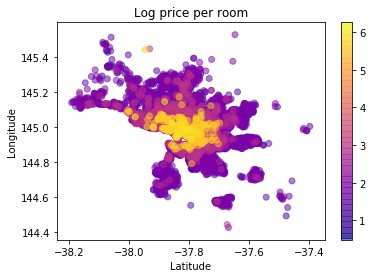

In [52]:
# modified
tmp = housing_cleaned_df.sort_values(by='House_log_price_per_room')
fig, ax = plt.subplots(figsize=(6,4))
im = ax.scatter(tmp.House_latitude, tmp.House_longitude, 
                c=tmp.House_log_price /tmp.House_rooms, 
                cmap='plasma', alpha=0.5)

fig.colorbar(im, ax=ax)
ax.set_title("Log price per room")
ax.set_ylabel("Longitude")
ax.set_xlabel("Latitude");

#### Crime data

The last dataset of interest is a dataset about crimes. It stores
information about crimes in Melbourne (https://www.crimestatistics.vic.gov.au/crime-statisticshistorical-crime-datayear-ending-31-december-2018/recorded-criminal-incidents). We inspect this dataset because crimes rates might be related to prevalence of airbnb accommodates.

In [53]:
dirname = os.path.abspath('')
filename = os.path.join(dirname, 'Crimes/Data_tables_Criminal_Incidents_Visualisation_year_ending_December_2018.xlsx')
sheet = 'T05-06 and T12-13'

crime_df = crime.import_data(filename, sheet)
crime_df.head(1)

,Year ending December,Police Service Area,Local Government Area,Offence Division,Offence Subdivision,Offence Subgroup,Incidents Recorded,"PSA Rate per 100,000 population","LGA Rate per 100,000 population"
0,2009,BALLARAT,BALLARAT,A Crimes against the person,A10 Homicide and related offences,A10 Homicide and related offences,2,2.038507,2.188423


Next, the dataset is preprocessed. Particularly, the column names are changed and the values of the police service area and the local government area are converted to lowercase.

In [54]:
# modified
crime_prepro_df = crime.prepro_dataset(crime_df)
crime_prepro_df.head(1)

,Crime_year_ending_december,Crime_police_service_area,Crime_local_government_area,Crime_offence_division,Crime_offence_subdivision,Crime_offence_subgroup,Crime_incidents_recorded,Crime_psa_rate_per_100000_population,Crime_lga_rate_per_100000_population
0,2009,ballarat,ballarat,A Crimes against the person,A10 Homicide and related offences,A10 Homicide and related offences,2,2.038507,2.188423


In [55]:
# modified
crime_prepro_df.dtypes

Crime_year_ending_december                int64
Crime_police_service_area                object
Crime_local_government_area              object
Crime_offence_division                   object
Crime_offence_subdivision                object
Crime_offence_subgroup                   object
Crime_incidents_recorded                  int64
Crime_psa_rate_per_100000_population    float64
Crime_lga_rate_per_100000_population    float64
dtype: object

**I. Variables**

The dataset has 9 variables. A description of the variables is provided below.

In [56]:
len(crime_df.columns)

9

**Year ending December:** The year. 2009 - 2018 <br>
**Police Service Area:** The police service area: BALLARAT, BANYULE ...<br>
**Local Government Area:** The government area: BALLARANT, BANYULE ... <br>
**Offence Division:** Offence division: A Crimes against the person, B Property and deception offences,
    C Drug offences, D Public order and security offences, E Justice procedures offences, F Other offences. <br>
**Offence Subdivision:** Offence subdivision: A10 Homicide and related offences, A20 Homicide and related offences ... <br>
**Offence Subgroup:** Offence subgroup: A10 Homicide and related offences, A232 Non-FV Common assault ... <br>
**Incidents Recorded:** Number of incidents recorded: 2, 4, 6, ... <br>
**PSA Rate per 100,000 population:** Incidents per Police Service Area <br>
**LGA Rate per 100,000 population:** Incidents per Local Government Area <br>

**Numerical and categorical variables**

Next, variables to numerical and which are categorical are defined.

In [57]:
crime_numeric = ['Crime_year_ending_december', 'Crime_incidents_recorded', 'Crime_psa_rate_per_100000_population',
                'Crime_lga_rate_per_100000_population']
crime_categorical = ['Crime_police_service_area', 'Crime_local_government_area', 'Crime_offence_division',
                    'Crime_offence_subdivision', 'Crime_offence_subgroup']

In [58]:
crime_df.dtypes

Year ending December                 int64
Police Service Area                 object
Local Government Area               object
Offence Division                    object
Offence Subdivision                 object
Offence Subgroup                    object
Incidents Recorded                   int64
PSA Rate per 100,000 population    float64
LGA Rate per 100,000 population    float64
dtype: object

**II. Distribution**

In this section the range and distribution of the crime variables are inspected.

**Ranges of the numerical data**

We start by looking at the ranges of the numerical variables.

In [59]:
columns = crime_numeric.copy()
crime_range = pd.concat([crime_prepro_df.loc[:, columns].apply(np.min, axis=0),
                         crime_prepro_df.loc[:, columns].apply(np.max, axis=0)], axis=1)
crime_range.columns = ['min', 'max']
crime_range

,min,max
Crime_year_ending_december,2009.000000,2018.000000
Crime_incidents_recorded,1.000000,5260.000000
Crime_psa_rate_per_100000_population,0.293385,5581.079504
Crime_lga_rate_per_100000_population,0.293385,5581.079504


**Values of categorical variables**

The number of observations for the different categories are printed below.

In [60]:
columns = [col_name for col_name in crime_categorical]

for name in columns:
    print(name)
    print("-------------------------------------------")
    print(crime_prepro_df.loc[:, name].value_counts())
    print("")

Crime_police_service_area
-------------------------------------------
wangaratta              1668
warrnambool             1609
northern grampians      1549
benalla                 1521
moorabool               1515
swan hill               1478
wodonga                 1455
glen eira               1348
horsham                 1288
bass coast              1215
macedon ranges          1210
southern grampians      1155
ballarat                1148
mitchell                1136
surf coast              1101
geelong                 1033
central goldfields       979
melbourne                885
hume                     825
greater dandenong        823
casey                    816
brimbank                 796
kingston                 792
frankston                786
whittlesea               782
darebin                  778
port phillip             774
wyndham                  773
knox                     770
latrobe                  770
mornington peninsula     769
moreland                 763
ya

**Distribution of variables**

Next, we take a look at the distribution of the variables.

*Numerical variables (continuous or discrete)*

The number of observations are evenly distributed for the years 2009 - 2018. The variables `Crime_incidents_recorded`, `Crime_psa_rate_per_100000_population` and `Crime_lga_rate_per_100000_population` are skewed to the right.

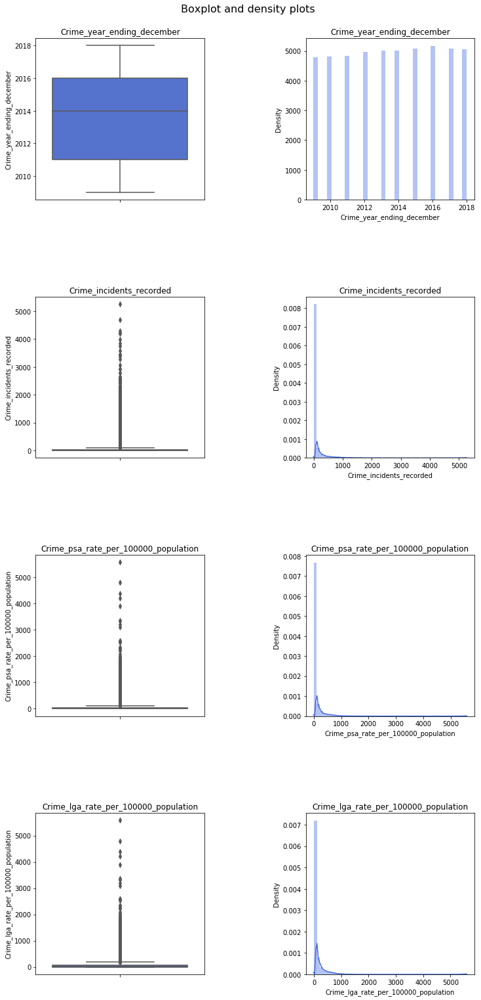

In [61]:
variables = crime_numeric.copy() 
# variables = [v for v in variables if v not in ('date', 'latitude', 'longitude')]
            
fig, axes = plt.subplots(nrows=len(variables), ncols=2, figsize=(12,24))

# 'top' to position the suptitle (https://stackoverflow.com/questions/8248467/
# matplotlib-tight-layout-doesnt-take-into-account-figure-suptitle)
plt.subplots_adjust(wspace=0.6, hspace=0.6, top=0.95) 
#https://stackoverflow.com/questions/7066121/how-to-set-a-single-main-title-above-all-the-subplots-with-pyplot
fig.suptitle("Boxplot and density plots", fontsize=16)   

for i,var in enumerate(variables):
    
    data = crime_prepro_df.loc[:, var].dropna()
    if var == 'Crime_year_ending_december':
        plot_kde = False
    else:
        plot_kde = True
    
    sns.boxplot(y=data, ax=axes[i,0], color=col1)
    axes[i,0].set_title(var)
    axes[i,0].set_ylabel(var)
    
    sns.distplot(data, ax=axes[i,1], kde=plot_kde, color=col1)
    axes[i,1].set_title(var)
    axes[i,1].set_ylabel("Density")

*Categorical variables*

No plots are provided in this section since all the categorical values contain too many categories.

**III. Cleaning**

Now, it is inspected whether there are missing or implausible values, or outliers.

**Missing values**

There are no missing values.

In [62]:
columns = crime_numeric + crime_categorical
    
crime_sorted_missing = crime_prepro_df.loc[:, columns].isnull().sum().sort_values(ascending=True)
crime_sorted_missing

Crime_year_ending_december              0
Crime_incidents_recorded                0
Crime_psa_rate_per_100000_population    0
Crime_lga_rate_per_100000_population    0
Crime_police_service_area               0
Crime_local_government_area             0
Crime_offence_division                  0
Crime_offence_subdivision               0
Crime_offence_subgroup                  0
dtype: int64

**Implausible values**

The entries of `Crime_psa_rate_per_100000_population` and `Crime_lga_rate_per_100000_population` are lying between (0.29, 5581.1) and thus substantially below 100'000 as expected. The number of crimes reported (`Crime_incidents_recorded`) is always greater than zero. No implausible values are observed.

In [63]:
(crime_prepro_df.Crime_psa_rate_per_100000_population.min(), crime_prepro_df.Crime_psa_rate_per_100000_population.max())

(0.2933846120844113, 5581.079503856887)

In [64]:
(crime_prepro_df.Crime_psa_rate_per_100000_population < 0).sum() # 0
(crime_prepro_df.Crime_lga_rate_per_100000_population < 0).sum() # 0
(crime_prepro_df.Crime_incidents_recorded < 0).sum() # 0

0

**Outliers**

Outliers are removed.

*Numerical variables (continuous or discrete)*

In [65]:
variables = ['Crime_psa_rate_per_100000_population', 
            'Crime_lga_rate_per_100000_population',
            'Crime_incidents_recorded']

tmp = crime_prepro_df.loc[:, variables]

quantiles = tmp.quantile([.25, .75])
iqr = quantiles.iloc[1, :] - quantiles.iloc[0, :]
upper_bounds = quantiles.iloc[1, :] + 1.5*iqr
lower_bounds = quantiles.iloc[0, :] - 1.5*iqr
upper_bounds

crime_prepro_df_wo_out = tmp.loc[(tmp.Crime_psa_rate_per_100000_population >= lower_bounds.iloc[0]) & (tmp.Crime_psa_rate_per_100000_population <= upper_bounds.iloc[0]) & 
                                (tmp.Crime_lga_rate_per_100000_population >= lower_bounds.iloc[1]) & (tmp.Crime_lga_rate_per_100000_population <= upper_bounds.iloc[1]) &
                                (tmp.Crime_incidents_recorded >= lower_bounds.iloc[2]) & (tmp.Crime_incidents_recorded <= upper_bounds.iloc[2]), :]
                                  
crime_prepro_df_wo_out.head(5)

,Crime_psa_rate_per_100000_population,Crime_lga_rate_per_100000_population,Crime_incidents_recorded
0,2.038507,2.188423,2
1,3.272037,3.272037,4
2,3.605943,7.002556,2
3,4.936321,4.936321,2
4,5.730331,14.979029,2


The original dataset contains 49'828 observations. After removing the outliers of all the three variables the dataset has 40'283 observations and if we remove only the outliers of `crime_lga_rate_per_100000_population` we end up with 43'560 observations. 

In [66]:
crime_prepro_df.shape # (49828, 9)
crime_prepro_df_wo_out.shape # (40283, 3)
crime_prepro_df_wo_out_tmp = crime_prepro_df.loc[(tmp.Crime_lga_rate_per_100000_population >= lower_bounds.iloc[1]) & (tmp.Crime_lga_rate_per_100000_population <= upper_bounds.iloc[1]),:]
crime_prepro_df_wo_out_tmp.shape; # (43560, 9)

*Categorical variables*

Next, we take a look at the categorical variables.

In [67]:
columns = crime_categorical.copy()
crime_prepro_df.loc[:, columns].apply(lambda x: len(x.unique()))

Crime_police_service_area       54
Crime_local_government_area     79
Crime_offence_division           6
Crime_offence_subdivision       28
Crime_offence_subgroup         112
dtype: int64

In [68]:
crime_prepro_df.loc[:, columns].apply(lambda x: min(pd.value_counts(x)))

Crime_police_service_area       588
Crime_local_government_area     224
Crime_offence_division         3562
Crime_offence_subdivision        64
Crime_offence_subgroup            1
dtype: int64

In [69]:
crime_prepro_df.loc[:, columns].apply(lambda x: max(pd.value_counts(x)))

Crime_police_service_area       1668
Crime_local_government_area      885
Crime_offence_division         14724
Crime_offence_subdivision       4892
Crime_offence_subgroup           790
dtype: int64

**IV. Implementation**

The outliers in the variable `Crime_lga_per_100000_population` are deleted.

In [70]:
crime_cleaned_df = crime_prepro_df.loc[(tmp.Crime_lga_rate_per_100000_population >= lower_bounds.iloc[1]) & (tmp.Crime_lga_rate_per_100000_population <= upper_bounds.iloc[1]),:]

#### Sights data (not covered)

It might be the case that the distance to sights has an effect on airbnb prices. Sights in Melbourne can be found e.g. on https://www.planetware.com/tourist-attractions-/melbourne-aus-vic-m.htm. However, it's difficult to collect many sights and most of the sights are located near the center of Melbourne so that the distance to site is not included in the analysis. <br>

- Federation Square: -37.817798 144.968714 (latitude.to)
- Royal Botanic Gardens: -37.8334 144.98033 (latitude.to)
- Melbourne Cricket Ground and the National Sports Museum: -37.818663392 144.9833294 (latitude.to)
- Southbank and Arts Centre Melbourne: -37.818830058 144.967662796 (latitude.to)
- National Gallery of Victoria: -37.809811, 144.965195 (latlong.net)
- Eureka Tower: -37.819663388 144.958662832 (latitude.to)
- Arcades and Laneways / Royal Arcade: -37.8145 144.9641 (latitude.to)
- Melbourne Museum and Royal Exhibition Building: -37.803337 144.971445 (latitude.to)
- Parliament House: -37.811055 144.97329 (latitude.to)
- Old Treasury Building: -37.813153 144.974121 (latitude.to)
- Princess Theatre: -37.810725 144.972169 (latitude.to)
- Windsor Hotel: -37.854 144.988 (latitude.to)
- Melbourne Zoo: -37.784762 144.952095 (latitude.to)
- Captain Cook's Cottage, Fitzroy Gardens: -37.8086900986 144.9749511 (latitude.to)
- Yarra River Cruise / Birrarung Marr: -37.817663396 144.970162786 (latitude.to)
- Melbourne Cricket Ground: -37.818663392 144.9833294 (latitude.to)
- National Tennis Centre: -37.819663388 144.973662772 (latitude.to)
- Alexandra Gardens: -37.82037 144.971938 (latitude.to)
- Melbourne Star: -37.8110723 144.9368763 (latitude.to)
- Etihad Stadium: -37.809830094 144.941829566 (latitude.to)
- Queen Victora Market: -37.806966 144.956693 (latitude.to)
- Immigration Museum: -37.8191403 144.9603969 (latitude.to)

- The City of Melbourne (CBD): -37.814 144.963 (wikipedia.org)

### (b) Approach to manage and process the data

The housing market dataset provide the name of the neighbourhood as well as the latitude and longitude of the observations. Hence, aggregated housing market data on the neighbourhood level can be merged to the airbnb dataset. To get a finer granularity we are going to define circles of a given distance and to **aggregate the housing market data** within a circle or extract the information of the **the nearest neighbour**. The crime data and the airbnb data can only be merged by the neighbourhood. <br>

The following dataset are created: <br>

**Airbnb** <br>
A ``DataFrame`` with the columns `Air_accommodates`, `Air_bathrooms`, `Air_bedrooms`, `Air_beds`, `Air_guests_inluded` and `Air_log_price` without outliers is the basis for the aggregation. After removing the observations that have at least one outlier 17'360 observation remains from originally 22'331 observations. 
- *airbnb_agg_suburbs_wo_outliers_XX*: Average, sum or number of observations of airbnb data without outliers either aggregated by neighbourhood and room type or by neighbourhood and property type.
- *airbnb_agg_XXm_wo_outliers_XX*: Dictionary of `DataFrames` with keys 'mean', 'median' and 'count'. The log airbnb prices and the other variables are aggregated by the method indicated as 'key'. The aggregation is done either for house type or property type.
- *airbnb_nearest_wo_outliers_XX*: The extracted log airbnb price and the values of the other variables of the nearest neighbours. The aggregation is done either for room type or property type. <br>

**Housing**
The variables of interest are `House_log_price`, `House_rooms`, `House_distance`, `House_bedroom2`, `House_bathroom`, and `House_landsize`. From originally 9'386 observations (after cleaning) 7'677 observations are left after removing outliers.
- *housing_agg_wo_outliers*: Averaged housing market data without outliers by suburb.
- *housing_agg_XXm_wo_outliers*: Dictionary of `DataFrames` with keys 'mean', 'median' and 'count'. The log airbnb prices and the other variables are aggregated by the method indicated as 'key'.
- *airbnb_nearest_wo_outliers*: The extracted log house prices and the values of the other variables of the nearest neighbours. <br>

**Crimes**
`Crime_lga_rate_per_100000_population`,`Crime_local_government_area` and `Crime_offence_division` are aggregated by the local government area.
- *crimes_agg*: Averaged values.
- *crimes_agg_median*: Median of the aggregated values. 

In a first step the property type is re-grouped so that the information from the house dataset can be later merged to it.

In [71]:
tmp = airbnb_cleaned_df.loc[:, ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                               'Air_beds', 'Air_guests_included', 'Air_log_price',
                               'Air_latitude', 'Air_longitude', 'Air_room_type',
                               'Air_id', 'Air_neighbourhood_cleansed',
                               'Air_property_type']]

tmp['Air_property_type_2'] = 'Other'
tmp.loc[tmp.Air_property_type.isin(['House', 'Cottage', 'Villa']), 'Air_property_type_2'] = 'House_Cottage_Villa'
tmp.loc[tmp.Air_property_type.isin(['Apartment', 'Condominium']), 'Air_property_type_2'] = 'Apartment_Condominium'
tmp.loc[tmp.Air_property_type.isin(['Townhouse']), 'Air_property_type_2'] = 'Townhouse'

quantiles = tmp.quantile([.25, .75])
iqr = quantiles.iloc[1, :] - quantiles.iloc[0, :]
upper_bounds = quantiles.iloc[1, :] + 1.5*iqr
lower_bounds = quantiles.iloc[0, :] - 1.5*iqr
upper_bounds

airbnb_sub_wo_outliers = tmp.loc[(tmp.Air_accommodates <= upper_bounds[0]) & (tmp.Air_accommodates >= lower_bounds[0]) &
                        (tmp.Air_bathrooms <= upper_bounds[1]) & (tmp.Air_bathrooms >= lower_bounds[1]) & 
                        (tmp.Air_bedrooms <= upper_bounds[2]) & (tmp.Air_bedrooms >= lower_bounds[2]) & 
                        (tmp.Air_beds <= upper_bounds[3]) & (tmp.Air_beds >= lower_bounds[3]) & 
                        (tmp.Air_guests_included <= upper_bounds[4]) & (tmp.Air_guests_included >= lower_bounds[4]) &
                        (tmp.Air_log_price <= upper_bounds[5]) & (tmp.Air_log_price >= lower_bounds[5]), :]
airbnb_sub_wo_outliers.shape

(17360, 13)

In [72]:
tmp = housing_cleaned_df.loc[:, ['House_log_price', 'House_rooms', 'House_distance', 'House_bedroom2', 
                                 'House_bathroom', 'House_landsize',
                                'House_suburb', 'House_type', 'House_latitude', 'House_longitude']]
quantiles = tmp.quantile([.25, .75])
iqr = quantiles.iloc[1, :] - quantiles.iloc[0, :]
upper_bounds = quantiles.iloc[1, :] + 1.5*iqr
lower_bounds = quantiles.iloc[0, :] - 1.5*iqr
upper_bounds

housing_sub_wo_outliers = tmp.loc[(tmp.House_log_price <= upper_bounds[0]) & (tmp.House_log_price >= lower_bounds[0]) &
                        (tmp.House_rooms <= upper_bounds[1]) & (tmp.House_rooms >= lower_bounds[1]) & 
                        (tmp.House_distance <= upper_bounds[2]) & (tmp.House_distance >= lower_bounds[2]) & 
                        (tmp.House_bedroom2 <= upper_bounds[3]) & (tmp.House_bedroom2 >= lower_bounds[3]) & 
                        (tmp.House_bathroom <= upper_bounds[4]) & (tmp.House_bathroom >= lower_bounds[4]) &
                        (tmp.House_landsize <= upper_bounds[5]) & (tmp.House_landsize >= lower_bounds[5]), :]
housing_sub_wo_outliers.shape

(7677, 10)

In [73]:
housing_cleaned_df.shape

(9386, 23)

In [74]:
# previously cell 12
def polynomial(x, y, deg):
    
    """
    args:
        x: ``DataFrame``
            The endogeneous variable(s)
        y: ``Series``
            The exogeneous variable
        deg: ``int``
            The degree of the polynomial
    
    returns:
         A dictionary containing the DataFrame with he predicted y and x^1 sorted by x^1 (key 'data') and
         a the coefficients as a string (key 'coef').
    """
    
    data = pd.DataFrame({'y': y, 'x': x})
    data.dropna(how='any', inplace=True)
    
    polynomial_features= PolynomialFeatures(degree=deg)
    x_poly = polynomial_features.fit_transform(data.loc[:, 'x'].values.reshape(-1,1))

    model = LinearRegression(fit_intercept=False)
    model.fit(x_poly, data.loc[:, 'y'])
    y_poly_pred = model.predict(x_poly)
    values = pd.DataFrame(np.c_[y_poly_pred, x_poly])
    values.columns = ['y_pred'] + ['x_' + str(i) for i in range(deg+1)] 
    values.sort_values(by='x_1', inplace=True)
    r2 = r2_score(data.loc[:, 'y'], y_poly_pred)
    
    return {'data': values.loc[:, ['y_pred', 'x_1']], 
            'coef': str([round(el,1) for el in model.coef_]).strip('[]'),
            'r2': r2}

**Reindexing the datasets**

We have to reindex the datasets so that everything works fine.

In [75]:
# modified
airbnb_cleaned_df.index = range(airbnb_cleaned_df.shape[0])
airbnb_sub_wo_outliers.index = range(airbnb_sub_wo_outliers.shape[0])
housing_cleaned_df.index = range(housing_cleaned_df.shape[0])
housing_sub_wo_outliers.index = range(housing_sub_wo_outliers.shape[0])

**AIRBNB DATA**

We start by aggregating the airbnb data. We aggregate / prepare the data in three ways as already explained above:
- by suburbs
- w.r.t a defined radius
- the nearest neighbour (no aggregation)

**Aggregation by suburbs**

*Room type*

First, we distinguish between the different room types 'Entire home/apt', 'Private room' and 'Shared room'.

In [76]:
airbnb_agg_wo_outliers = air.aggregate_data(airbnb_sub_wo_outliers, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='mean',
                                            classifier='Air_room_type')
airbnb_agg_wo_outliers

,Air_neighbourhood_cleansed,Air_accommodates_Entire home/apt,Air_accommodates_Private room,Air_accommodates_Shared room,Air_bathrooms_Entire home/apt,Air_bathrooms_Private room,Air_bathrooms_Shared room,Air_bedrooms_Entire home/apt,Air_bedrooms_Private room,Air_bedrooms_Shared room,Air_beds_Entire home/apt,Air_beds_Private room,Air_beds_Shared room,Air_guests_included_Entire home/apt,Air_guests_included_Private room,Air_guests_included_Shared room,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,Banyule,2.925373,1.885057,1.600000,1.164179,1.143678,1.000000,1.358209,1.068966,1.0,1.611940,1.206897,1.600000,1.417910,1.068966,1.000000,1.997895,1.686678,1.642748
1,Bayside,3.368852,1.777778,2.166667,1.278689,1.156566,1.500000,1.614754,0.979798,1.0,1.819672,1.181818,1.666667,1.319672,1.141414,1.166667,2.142325,1.852359,1.720511
2,Boroondara,3.157407,1.897887,1.888889,1.164352,1.117958,1.000000,1.435185,1.031690,1.0,1.662037,1.151408,1.000000,1.300926,1.133803,1.111111,2.069867,1.777664,1.613774
3,Brimbank,3.785714,1.826087,NaN,1.178571,1.188406,NaN,1.357143,1.043478,NaN,1.857143,1.159420,NaN,1.357143,1.072464,NaN,1.910950,1.689408,NaN
4,Cardinia,3.000000,2.326087,2.000000,1.081395,1.054348,1.000000,1.348837,1.130435,1.0,1.651163,1.326087,2.000000,1.465116,1.152174,1.000000,2.191106,1.951160,1.602060
5,Casey,3.722222,2.065217,4.000000,1.277778,1.086957,1.000000,1.555556,1.141304,1.0,2.333333,1.271739,2.000000,1.611111,1.086957,2.000000,2.035412,1.797124,1.778151
6,Darebin,3.200704,1.836806,1.666667,1.128521,1.140625,1.666667,1.514085,1.006944,1.0,1.686620,1.125000,1.666667,1.327465,1.069444,1.000000,2.021560,1.723722,1.647764
7,Frankston,3.372549,2.147059,2.000000,1.176471,1.191176,1.000000,1.627451,1.132353,1.0,1.843137,1.338235,1.000000,1.431373,1.250000,2.000000,2.097017,1.810519,1.414973
8,Glen Eira,3.246154,1.804348,1.200000,1.200000,1.146739,1.100000,1.594872,1.007246,1.0,1.717949,1.137681,1.000000,1.225641,1.083333,1.000000,2.053272,1.751547,1.547515
9,Greater Dandenong,3.555556,1.930000,2.500000,1.111111,1.035000,1.250000,1.555556,1.070000,1.0,2.222222,1.270000,1.500000,1.111111,1.070000,1.000000,1.976709,1.688160,1.588046


In [77]:
airbnb_agg_wo_outliers.loc[:, ['Air_log_price_Entire home/apt', 'Air_log_price_Private room', 'Air_log_price_Shared room']].head(5)

,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,1.997895,1.686678,1.642748
1,2.142325,1.852359,1.720511
2,2.069867,1.777664,1.613774
3,1.910950,1.689408,NaN
4,2.191106,1.951160,1.602060


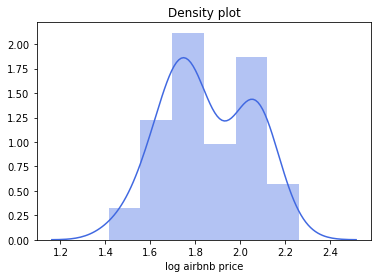

In [78]:
tmp = pd.concat([airbnb_agg_wo_outliers.loc[:, 'Air_log_price_Entire home/apt'],
                airbnb_agg_wo_outliers.loc[:, 'Air_log_price_Private room'],
                airbnb_agg_wo_outliers.loc[:, 'Air_log_price_Shared room']],
               ignore_index=True)
tmp.dropna(inplace=True)
ax = sns.distplot(tmp, color=col1)
ax.set_xlabel("log airbnb price")
ax.set_title("Density plot");

In [79]:
airbnb_agg_wo_outliers_sum = air.aggregate_data(airbnb_sub_wo_outliers, 
                                                ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                                 'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                                ['Air_neighbourhood_cleansed'], agg_fun ='sum',
                                                classifier='Air_room_type')
airbnb_agg_wo_outliers_sum.head(1)

,Air_neighbourhood_cleansed,Air_accommodates_Entire home/apt,Air_accommodates_Private room,Air_accommodates_Shared room,Air_bathrooms_Entire home/apt,Air_bathrooms_Private room,Air_bathrooms_Shared room,Air_bedrooms_Entire home/apt,Air_bedrooms_Private room,Air_bedrooms_Shared room,Air_beds_Entire home/apt,Air_beds_Private room,Air_beds_Shared room,Air_guests_included_Entire home/apt,Air_guests_included_Private room,Air_guests_included_Shared room,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,Banyule,196.0,164.0,8.0,78.0,99.5,5.0,91.0,93.0,5.0,108.0,105.0,8.0,95.0,93.0,5.0,133.858944,146.740989,8.213741


In [80]:
airbnb_agg_wo_outliers_count = air.aggregate_data(airbnb_sub_wo_outliers, 
                                                  ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                                   'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                                  ['Air_neighbourhood_cleansed'], agg_fun ='count',
                                                  classifier='Air_room_type')
airbnb_agg_wo_outliers_count.head(1)

,Air_neighbourhood_cleansed,Air_accommodates_Entire home/apt,Air_accommodates_Private room,Air_accommodates_Shared room,Air_bathrooms_Entire home/apt,Air_bathrooms_Private room,Air_bathrooms_Shared room,Air_bedrooms_Entire home/apt,Air_bedrooms_Private room,Air_bedrooms_Shared room,Air_beds_Entire home/apt,Air_beds_Private room,Air_beds_Shared room,Air_guests_included_Entire home/apt,Air_guests_included_Private room,Air_guests_included_Shared room,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,Banyule,67.0,87.0,5.0,67.0,87.0,5.0,67.0,87.0,5.0,67.0,87.0,5.0,67.0,87.0,5.0,67.0,87.0,5.0


In [81]:
133.858944/67 # this is what we have in airbnb_agg_wo_outliers in the correspondant column -> check passsed

1.9978946865671643

In [82]:
airbnb_agg_wo_outliers_var = air.aggregate_data(airbnb_sub_wo_outliers, 
                                                  ['Air_log_price'], 
                                                  ['Air_neighbourhood_cleansed'], agg_fun ='var',
                                                  classifier='Air_room_type')
airbnb_agg_wo_outliers_var.head(1)

,Air_neighbourhood_cleansed,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,Banyule,0.033342,0.0258,0.063067


In [83]:
pickle.dump(airbnb_agg_wo_outliers, open("airbnb_agg_wo_outliers.p", "wb"))
pickle.dump(airbnb_agg_wo_outliers_sum, open("airbnb_agg_wo_outliers_sum.p", "wb"))
pickle.dump(airbnb_agg_wo_outliers_count, open("airbnb_agg_wo_outliers_count.p", "wb"))
pickle.dump(airbnb_agg_wo_outliers_var, open("airbnb_agg_wo_outliers_var.p", "wb"))

In [84]:
airbnb_agg_wo_outliers = pickle.load(open("airbnb_agg_wo_outliers.p", "rb"))
airbnb_agg_wo_outliers_sum = pickle.load(open("airbnb_agg_wo_outliers_sum.p", "rb"))
airbnb_agg_wo_outliers_count = pickle.load(open("airbnb_agg_wo_outliers_count.p", "rb"))
airbnb_agg_wo_outliers_var = pickle.load(open("airbnb_agg_wo_outliers_var.p", "rb"))

*Property type*

Next, we distinguish between the different property types

In [85]:
airbnb_agg_wo_outliers_prop = air.aggregate_data(airbnb_sub_wo_outliers, 
                                                 ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                                 'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                                 ['Air_neighbourhood_cleansed'], agg_fun ='mean',
                                                 classifier = 'Air_property_type_2')
airbnb_agg_wo_outliers_prop 

,Air_neighbourhood_cleansed,Air_accommodates_Apartment_Condominium,Air_accommodates_House_Cottage_Villa,Air_accommodates_Other,Air_accommodates_Townhouse,Air_bathrooms_Apartment_Condominium,Air_bathrooms_House_Cottage_Villa,Air_bathrooms_Other,Air_bathrooms_Townhouse,Air_bedrooms_Apartment_Condominium,...,Air_beds_Other,Air_beds_Townhouse,Air_guests_included_Apartment_Condominium,Air_guests_included_House_Cottage_Villa,Air_guests_included_Other,Air_guests_included_Townhouse,Air_log_price_Apartment_Condominium,Air_log_price_House_Cottage_Villa,Air_log_price_Other,Air_log_price_Townhouse
0,Banyule,2.688889,2.087500,2.333333,2.400000,1.144444,1.150000,1.041667,1.400000,1.333333,...,1.375000,1.300000,1.311111,1.125000,1.416667,1.000000,1.960543,1.725312,1.875414,1.755435
1,Bayside,2.675000,2.606742,2.156250,3.269231,1.168750,1.337079,1.000000,1.346154,1.312500,...,1.218750,1.730769,1.200000,1.258427,1.343750,1.153846,2.035590,1.968721,1.963081,2.084166
2,Boroondara,2.458015,2.363128,2.452381,2.615385,1.095420,1.187151,1.095238,1.250000,1.179389,...,1.404762,1.615385,1.190840,1.184358,1.238095,1.423077,1.916158,1.855915,1.953877,1.929499
3,Brimbank,1.400000,2.105263,2.750000,2.111111,1.000000,1.245614,1.083333,1.055556,1.000000,...,1.583333,1.111111,1.200000,1.070175,1.333333,1.111111,1.771031,1.696429,1.822246,1.767104
4,Cardinia,2.000000,2.585366,2.790698,NaN,1.000000,1.036585,1.104651,NaN,1.000000,...,1.581395,NaN,1.000000,1.317073,1.325581,NaN,2.109008,1.932142,2.179095,NaN
5,Casey,3.000000,2.297619,2.250000,2.875000,1.000000,1.125000,1.031250,1.250000,1.333333,...,1.562500,1.625000,1.000000,1.166667,1.187500,1.375000,2.064753,1.811491,1.851419,1.971088
6,Darebin,2.518519,2.543103,2.250000,2.577465,1.087963,1.165948,1.035714,1.274648,1.208333,...,1.267857,1.394366,1.259259,1.150862,1.178571,1.169014,1.922047,1.821812,1.865129,1.876456
7,Frankston,2.571429,2.753623,2.416667,3.000000,1.047619,1.246377,1.104167,1.250000,1.190476,...,1.458333,1.833333,1.476190,1.260870,1.416667,1.333333,2.034363,1.859422,2.023561,1.981820
8,Glen Eira,2.469027,2.316667,2.090909,2.513514,1.101770,1.227778,1.121212,1.324324,1.269912,...,1.181818,1.297297,1.146018,1.144444,1.090909,1.135135,1.891682,1.846359,1.859811,1.900383
9,Greater Dandenong,1.666667,2.162500,2.333333,1.750000,1.222222,1.018750,0.916667,1.125000,1.222222,...,1.666667,1.312500,1.000000,1.100000,1.000000,1.000000,1.698004,1.696717,1.753280,1.765216


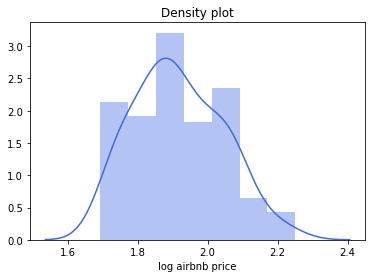

In [86]:
tmp = pd.concat([airbnb_agg_wo_outliers_prop.loc[:, 'Air_log_price_Apartment_Condominium'],
                airbnb_agg_wo_outliers_prop.loc[:, 'Air_log_price_House_Cottage_Villa'],
                airbnb_agg_wo_outliers_prop.loc[:, 'Air_log_price_Other'],
                airbnb_agg_wo_outliers_prop.loc[:, 'Air_log_price_Townhouse']],
               ignore_index=True)
tmp.dropna(inplace=True)
ax = sns.distplot(tmp, color=col1)
ax.set_xlabel("log airbnb price")
ax.set_title("Density plot");

In [87]:
airbnb_agg_wo_outliers_prop_sum = air.aggregate_data(airbnb_sub_wo_outliers, 
                                                     ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                                      'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                                     ['Air_neighbourhood_cleansed'], agg_fun ='sum',
                                                     classifier = 'Air_property_type_2')
airbnb_agg_wo_outliers_prop_sum.head(1) 

,Air_neighbourhood_cleansed,Air_accommodates_Apartment_Condominium,Air_accommodates_House_Cottage_Villa,Air_accommodates_Other,Air_accommodates_Townhouse,Air_bathrooms_Apartment_Condominium,Air_bathrooms_House_Cottage_Villa,Air_bathrooms_Other,Air_bathrooms_Townhouse,Air_bedrooms_Apartment_Condominium,...,Air_beds_Other,Air_beds_Townhouse,Air_guests_included_Apartment_Condominium,Air_guests_included_House_Cottage_Villa,Air_guests_included_Other,Air_guests_included_Townhouse,Air_log_price_Apartment_Condominium,Air_log_price_House_Cottage_Villa,Air_log_price_Other,Air_log_price_Townhouse
0,Banyule,121.0,167.0,56.0,24.0,51.5,92.0,25.0,14.0,60.0,...,33.0,13.0,59.0,90.0,34.0,10.0,88.224429,138.024947,45.009943,17.554355


In [88]:
airbnb_agg_wo_outliers_prop_count = air.aggregate_data(airbnb_sub_wo_outliers, 
                                                       ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                                        'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                                       ['Air_neighbourhood_cleansed'], agg_fun ='count',
                                                       classifier = 'Air_property_type_2')
airbnb_agg_wo_outliers_prop_count.head(1)

,Air_neighbourhood_cleansed,Air_accommodates_Apartment_Condominium,Air_accommodates_House_Cottage_Villa,Air_accommodates_Other,Air_accommodates_Townhouse,Air_bathrooms_Apartment_Condominium,Air_bathrooms_House_Cottage_Villa,Air_bathrooms_Other,Air_bathrooms_Townhouse,Air_bedrooms_Apartment_Condominium,...,Air_beds_Other,Air_beds_Townhouse,Air_guests_included_Apartment_Condominium,Air_guests_included_House_Cottage_Villa,Air_guests_included_Other,Air_guests_included_Townhouse,Air_log_price_Apartment_Condominium,Air_log_price_House_Cottage_Villa,Air_log_price_Other,Air_log_price_Townhouse
0,Banyule,45.0,80.0,24.0,10.0,45.0,80.0,24.0,10.0,45.0,...,24.0,10.0,45.0,80.0,24.0,10.0,45.0,80.0,24.0,10.0


In [89]:
88.224429/45 # check passed

1.9605428666666667

In [90]:
airbnb_agg_wo_outliers_prop_var = air.aggregate_data(airbnb_sub_wo_outliers, 
                                                       ['Air_log_price'], 
                                                       ['Air_neighbourhood_cleansed'], agg_fun ='var',
                                                       classifier = 'Air_property_type_2')
airbnb_agg_wo_outliers_prop_var.head(1)

,Air_neighbourhood_cleansed,Air_log_price_Apartment_Condominium,Air_log_price_House_Cottage_Villa,Air_log_price_Other,Air_log_price_Townhouse
0,Banyule,0.048341,0.044267,0.040141,0.025176


In [91]:
pickle.dump(airbnb_agg_wo_outliers_prop, open("airbnb_agg_wo_outliers_prop.p", "wb"))
pickle.dump(airbnb_agg_wo_outliers_prop_sum, open("airbnb_agg_wo_outliers_prop_sum.p", "wb"))
pickle.dump(airbnb_agg_wo_outliers_prop_count, open("airbnb_agg_wo_outliers_prop_count.p", "wb"))
pickle.dump(airbnb_agg_wo_outliers_prop_var, open("airbnb_agg_wo_outliers_prop_var.p", "wb"))

In [92]:
airbnb_agg_wo_outliers_prop = pickle.load(open("airbnb_agg_wo_outliers_prop.p", "rb"))
airbnb_agg_wo_outliers_prop_sum = pickle.load(open("airbnb_agg_wo_outliers_prop_sum.p", "rb"))
airbnb_agg_wo_outliers_prop_count = pickle.load(open("airbnb_agg_wo_outliers_prop_count.p", "rb"))
airbnb_agg_wo_outliers_prop_var = pickle.load(open("airbnb_agg_wo_outliers_prop_var.p", "rb"))

**Circle with radius of 50, 100 and 500 meters**

Before aggregating the data, we store the values as numpy arrays.

In [93]:
airbnb_lat_long = airbnb_cleaned_df.loc[:, ['Air_latitude', 'Air_longitude']].values
airbnb_lat_long_2 = airbnb_sub_wo_outliers.loc[:, ['Air_latitude', 'Air_longitude']].values

In [94]:
airbnb_lat_long_2

array([[-37.77268393, 145.09213285],
       [-37.76650512, 144.9807361 ],
       [-37.85975502, 144.97736913],
       ...,
       [-37.87525158, 145.16275659],
       [-37.8277951 , 144.95498687],
       [-37.80518635, 144.9623991 ]])

To aggregate airbnb data around circles with respect to a dictionary storing the the observations, the function `aggregate_airbnb_data_circles()` is defined. In what follows, (1) the observations that are within a circle with radius of 50, 100 and 500 meters are selected and then (2) aggregated.

*This step is time-consuming and the cells are thus set to raw.*

In [95]:
airbnb_obs_50m_wo_outliers = pickle.load(open("airbnb_obs_50m_wo_outliers.p", "rb"))
airbnb_obs_100m_wo_outliers = pickle.load(open("airbnb_obs_100m_wo_outliers.p", "rb"))
airbnb_obs_500m_wo_outliers = pickle.load(open("airbnb_obs_500m_wo_outliers.p", "rb"))

In [96]:
len(airbnb_obs_500m_wo_outliers.keys()) # 22331

22331

*Check*

We check whether the selection of the observations went well by inspecting the distance to the reference object. The reference object is included but will be later removed for the aggregation. For the examples tested the distances are all below 500 meters (0.5 km), which means that the selection works.

In [97]:
airbnb_obs_500m_wo_outliers['0']

array([   0, 6667, 7080, 7081, 7097])

In [98]:
lat1, lon1 = airbnb_lat_long[0,]
for i in airbnb_obs_500m_wo_outliers['0']:
    lat2, lon2 = airbnb_lat_long_2[i,]
    print(air._haversine_np(lon1, lat1, lon2, lat2))

0.0
0.471731206906071
0.3628758582743597
0.3481227018582127
0.20352851422727503


In [99]:
airbnb_obs_500m_wo_outliers['1']

array([    1,   827,   906,  1578,  1812,  2422,  3628,  4185,  7920,
        9251,  9848, 10562, 11235, 14774, 17137])

In [100]:
lat1, lon1 = airbnb_lat_long[1,]
for i in airbnb_obs_500m_wo_outliers['1']:
    lat2, lon2 = airbnb_lat_long_2[i,]
    print(air._haversine_np(lon1, lat1, lon2, lat2))

0.0
0.18188448413633493
0.09037634655077148
0.26217340415297613
0.36917543155597216
0.290517372829226
0.23993239170653569
0.35729930507287405
0.037726305254716985
0.30272278976071454
0.2509458861195018
0.3454966593939581
0.42731186854567355
0.4951383686970796
0.4975254668419996


*Room type - extraction*

The information as e.g. the log price, number of accommodations or number of beds related to the observations are now aggreagated. The information related to the reference observations is not considered. The aggregations are done for the different room types.

*This step is time-consuming and the cells are thus set to raw.*

Save the results

Load the results

In [101]:
airbnb_agg_50m_wo_outliers = pickle.load(open("airbnb_agg_50m_wo_outliers.p", "rb"))
airbnb_agg_100m_wo_outliers = pickle.load(open("airbnb_agg_100m_wo_outliers.p", "rb"))
airbnb_agg_500m_wo_outliers = pickle.load(open("airbnb_agg_500m_wo_outliers.p", "rb"))

In [102]:
airbnb_agg_500m_wo_outliers['mean'].shape

(22066, 19)

*Property type - extraction*

We do the same for the different property types.

*This step is time-consuming and the cells are thus set to raw.*

In [103]:
airbnb_agg_50m_wo_outliers_prop = pickle.load(open("airbnb_agg_50m_wo_outliers_prop.p", "rb"))
airbnb_agg_100m_wo_outliers_prop = pickle.load(open("airbnb_agg_100m_wo_outliers_prop.p", "rb"))
airbnb_agg_500m_wo_outliers_prop = pickle.load(open("airbnb_agg_500m_wo_outliers_prop.p", "rb"))

**The price of the nearest accommodation**

Next, we want to select the price and other information of the nearest accommodation w.r.t the reference observation. Again, we do this for the room types and for the property types. First, the nearest neighbours are selected. The basis for the selection are the accommodations that are located within a radius of 500 meters to the reference object.

In [104]:
airbnb_lat_long = airbnb_cleaned_df.loc[:, ['Air_latitude', 'Air_longitude', 'Air_id']]
airbnb_lat_long_type = airbnb_sub_wo_outliers.loc[:, ['Air_latitude', 'Air_longitude', 
                                                      'Air_room_type', 'Air_property_type_2',
                                                      'Air_id']]

In [105]:
airbnb_lat_long.head(5)

,Air_latitude,Air_longitude,Air_id
0,-37.772684,145.092133,9835
1,-37.766505,144.980736,10803
2,-37.859755,144.977369,12936
3,-37.758971,144.989228,15246
4,-37.864530,144.992238,16760


In [106]:
airbnb_lat_long_type.head(5)

,Air_latitude,Air_longitude,Air_room_type,Air_property_type_2,Air_id
0,-37.772684,145.092133,Private room,House_Cottage_Villa,9835
1,-37.766505,144.980736,Private room,Apartment_Condominium,10803
2,-37.859755,144.977369,Entire home/apt,Apartment_Condominium,12936
3,-37.758971,144.989228,Private room,House_Cottage_Villa,15246
4,-37.864530,144.992238,Private room,House_Cottage_Villa,16760


*The next steps are time-consuming and the cells are thus set to raw.*

*Room type - selection*

We now select the nearest neigbours by taking into account the different room types.

In [107]:
airbnb_nearest_obs_wo_outliers = pickle.load(open("airbnb_nearest_obs_wo_outliers.p", "rb"))

*Check*

The checks below gives a hint that the procedure is working properly. We see that for the first obseration in the dataset we only have an accommodation with a private room. This is correct as the next cell shows.

In [108]:
airbnb_nearest_obs_wo_outliers['0']

{'Entire home/apt': None, 'Private room': 7097, 'Shared room': None}

In [109]:
airbnb_sub_wo_outliers.loc[airbnb_obs_500m_wo_outliers['0'], 'Air_room_type']

0       Private room
6667    Private room
7080    Private room
7081    Private room
7097    Private room
Name: Air_room_type, dtype: object

To be more sure we also do the check for the second observation on our dataset. Three room types are present and thus show up in `airbnb_nearest_obs_wo_outliers['1']`

In [110]:
airbnb_nearest_obs_wo_outliers['1']

{'Entire home/apt': 906, 'Private room': 7920, 'Shared room': 9251}

In [111]:
airbnb_sub_wo_outliers.loc[airbnb_obs_500m_wo_outliers['1'], 'Air_room_type']

1           Private room
827         Private room
906      Entire home/apt
1578     Entire home/apt
1812        Private room
2422        Private room
3628     Entire home/apt
4185     Entire home/apt
7920        Private room
9251         Shared room
9848     Entire home/apt
10562       Private room
11235       Private room
14774    Entire home/apt
17137       Private room
Name: Air_room_type, dtype: object

*Property type - selection*

The selection is done w.r.t the property types

In [112]:
airbnb_nearest_obs_wo_outliers_prop = pickle.load(open("airbnb_nearest_obs_wo_outliers_prop.p", "rb"))

In [113]:
airbnb_nearest_obs_wo_outliers_prop['0']

{'Other': None,
 'House_Cottage_Villa': 7097,
 'Apartment_Condominium': None,
 'Townhouse': None}

*Room type - extraction*

Next, the datasets with the prices of the nearest neighbours are created. We start with the room types. The distance to the reference observation is also extracted.

In [114]:
airbnb_nearest_price_wo_outliers = air.the_nearest_obs_prices(airbnb_cleaned_df, 
                                                              airbnb_sub_wo_outliers,
                                                              airbnb_nearest_obs_wo_outliers, 
                                                              ['Air_log_price', 'Air_accommodates', 
                                                               'Air_bathrooms', 'Air_bedrooms',
                                                               'Air_beds', 'Air_guests_included'],
                                                              classifier='Air_room_type',
                                                              distance=True)

In [115]:
airbnb_nearest_price_wo_outliers.head(5)

,Air_group,Air_log_price_Entire home/apt,Air_accommodates_Entire home/apt,Air_bathrooms_Entire home/apt,Air_bedrooms_Entire home/apt,Air_beds_Entire home/apt,Air_guests_included_Entire home/apt,Air_log_price_Private room,Air_accommodates_Private room,Air_bathrooms_Private room,...,Air_guests_included_Private room,Air_log_price_Shared room,Air_accommodates_Shared room,Air_bathrooms_Shared room,Air_bedrooms_Shared room,Air_beds_Shared room,Air_guests_included_Shared room,dist_Entire home/apt,dist_Private Room,dist_Shared Room
0,0,NaN,NaN,NaN,NaN,NaN,NaN,2.477121,1.0,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.203529,NaN
1,1,2.342423,4.0,1.0,2.0,2.0,1.0,1.662758,2.0,1.0,...,1.0,1.778151,2.0,1.5,1.0,1.0,1.0,0.090376,0.037726,0.302723
2,2,2.139879,2.0,1.0,1.0,1.0,1.0,1.633468,2.0,1.0,...,1.0,1.462398,1.0,1.0,1.0,1.0,1.0,0.009089,0.043751,0.493991
3,3,2.146128,4.0,1.5,3.0,3.0,3.0,1.698970,1.0,1.5,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,0.040289,0.031024,NaN
4,4,2.389166,4.0,1.0,2.0,2.0,1.0,1.623249,1.0,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,0.016198,0.025602,NaN


In [116]:
airbnb_nearest_price_wo_outliers.tail(5)

,Air_group,Air_log_price_Entire home/apt,Air_accommodates_Entire home/apt,Air_bathrooms_Entire home/apt,Air_bedrooms_Entire home/apt,Air_beds_Entire home/apt,Air_guests_included_Entire home/apt,Air_log_price_Private room,Air_accommodates_Private room,Air_bathrooms_Private room,...,Air_guests_included_Private room,Air_log_price_Shared room,Air_accommodates_Shared room,Air_bathrooms_Shared room,Air_bedrooms_Shared room,Air_beds_Shared room,Air_guests_included_Shared room,dist_Entire home/apt,dist_Private Room,dist_Shared Room
22326,22326,2.113943,3.0,1.0,1.0,1.0,3.0,1.903090,2.0,1.0,...,2.0,1.681241,1.0,1.0,1.0,1.0,1.0,0.125486,0.023809,0.107223
22327,22327,NaN,NaN,NaN,NaN,NaN,NaN,1.851258,2.0,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.237938,NaN
22328,22328,2.146128,5.0,1.0,3.0,3.0,1.0,1.556303,2.0,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,0.344546,0.075165,NaN
22329,22329,2.139879,3.0,1.0,2.0,2.0,3.0,1.924279,2.0,1.0,...,1.0,2.544068,1.0,2.0,1.0,1.0,1.0,0.055510,0.032023,0.114885
22330,22330,2.146128,4.0,1.0,2.0,2.0,1.0,1.698970,1.0,1.0,...,1.0,1.892095,1.0,1.0,1.0,1.0,1.0,0.020007,0.019543,0.103503


Let's check that there are no or only a few observations with distance zero. A lot of observations with a distance of zero would be a hint that the reference observations was not removed. We see that there are no zeros, so everything went fine.

In [117]:
(airbnb_nearest_price_wo_outliers['dist_Entire home/apt'] == 0).sum()

0

Next, we save the results to disk.

In [118]:
pickle.dump(airbnb_nearest_price_wo_outliers, open("airbnb_nearest_price_wo_outliers.p", "wb"))

In [119]:
airbnb_nearest_price_wo_outliers = pickle.load(open("airbnb_nearest_price_wo_outliers.p", "rb"))
airbnb_nearest_price_wo_outliers.head(5)

,Air_group,Air_log_price_Entire home/apt,Air_accommodates_Entire home/apt,Air_bathrooms_Entire home/apt,Air_bedrooms_Entire home/apt,Air_beds_Entire home/apt,Air_guests_included_Entire home/apt,Air_log_price_Private room,Air_accommodates_Private room,Air_bathrooms_Private room,...,Air_guests_included_Private room,Air_log_price_Shared room,Air_accommodates_Shared room,Air_bathrooms_Shared room,Air_bedrooms_Shared room,Air_beds_Shared room,Air_guests_included_Shared room,dist_Entire home/apt,dist_Private Room,dist_Shared Room
0,0,NaN,NaN,NaN,NaN,NaN,NaN,2.477121,1.0,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.203529,NaN
1,1,2.342423,4.0,1.0,2.0,2.0,1.0,1.662758,2.0,1.0,...,1.0,1.778151,2.0,1.5,1.0,1.0,1.0,0.090376,0.037726,0.302723
2,2,2.139879,2.0,1.0,1.0,1.0,1.0,1.633468,2.0,1.0,...,1.0,1.462398,1.0,1.0,1.0,1.0,1.0,0.009089,0.043751,0.493991
3,3,2.146128,4.0,1.5,3.0,3.0,3.0,1.698970,1.0,1.5,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,0.040289,0.031024,NaN
4,4,2.389166,4.0,1.0,2.0,2.0,1.0,1.623249,1.0,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,0.016198,0.025602,NaN


*Property type - selection*

The selection is also done for the property types.

In [120]:
airbnb_nearest_price_wo_outliers_prop = air.the_nearest_obs_prices(airbnb_cleaned_df, 
                                                          airbnb_sub_wo_outliers,
                                                          airbnb_nearest_obs_wo_outliers_prop, 
                                                          ['Air_log_price', 'Air_accommodates', 
                                                           'Air_bathrooms', 'Air_bedrooms',
                                                           'Air_beds', 'Air_guests_included'],
                                                          classifier='Air_property_type_2',
                                                          distance=True)

In [121]:
airbnb_nearest_price_wo_outliers_prop.head(5)

,Air_group,Air_log_price_Other,Air_accommodates_Other,Air_bathrooms_Other,Air_bedrooms_Other,Air_beds_Other,Air_guests_included_Other,Air_log_price_House_Cottage_Villa,Air_accommodates_House_Cottage_Villa,Air_bathrooms_House_Cottage_Villa,...,Air_log_price_Townhouse,Air_accommodates_Townhouse,Air_bathrooms_Townhouse,Air_bedrooms_Townhouse,Air_beds_Townhouse,Air_guests_included_Townhouse,dist_Other,dist_House_Cottage_Villa,dist_Apartment_Condominium,dist_Townhouse
0,0,NaN,NaN,NaN,NaN,NaN,NaN,2.477121,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.203529,NaN,NaN
1,1,1.949390,2.0,1.0,0.0,1.0,1.0,2.342423,4.0,1.0,...,1.662758,2.0,1.0,1.0,1.0,1.0,0.495138,0.090376,0.239932,0.037726
2,2,2.298853,3.0,1.0,1.0,2.0,1.0,1.954243,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,0.069935,0.193637,0.009089,NaN
3,3,1.698970,1.0,1.5,1.0,1.0,1.0,2.146128,4.0,1.5,...,1.851258,2.0,1.0,1.0,1.0,1.0,0.031024,0.040289,0.249163,0.114271
4,4,1.812913,2.0,1.0,1.0,1.0,1.0,2.389166,4.0,1.0,...,1.623249,1.0,1.0,1.0,1.0,1.0,0.222255,0.016198,0.034103,0.025602


We also save these results to disk.

In [122]:
pickle.dump(airbnb_nearest_price_wo_outliers_prop, open("airbnb_nearest_price_wo_outliers_prop.p", "wb"))

In [123]:
airbnb_nearest_price_wo_outliers_prop = pickle.load(open("airbnb_nearest_price_wo_outliers_prop.p", "rb"))
airbnb_nearest_price_wo_outliers_prop.head(5)

,Air_group,Air_log_price_Other,Air_accommodates_Other,Air_bathrooms_Other,Air_bedrooms_Other,Air_beds_Other,Air_guests_included_Other,Air_log_price_House_Cottage_Villa,Air_accommodates_House_Cottage_Villa,Air_bathrooms_House_Cottage_Villa,...,Air_log_price_Townhouse,Air_accommodates_Townhouse,Air_bathrooms_Townhouse,Air_bedrooms_Townhouse,Air_beds_Townhouse,Air_guests_included_Townhouse,dist_Other,dist_House_Cottage_Villa,dist_Apartment_Condominium,dist_Townhouse
0,0,NaN,NaN,NaN,NaN,NaN,NaN,2.477121,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.203529,NaN,NaN
1,1,1.949390,2.0,1.0,0.0,1.0,1.0,2.342423,4.0,1.0,...,1.662758,2.0,1.0,1.0,1.0,1.0,0.495138,0.090376,0.239932,0.037726
2,2,2.298853,3.0,1.0,1.0,2.0,1.0,1.954243,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,0.069935,0.193637,0.009089,NaN
3,3,1.698970,1.0,1.5,1.0,1.0,1.0,2.146128,4.0,1.5,...,1.851258,2.0,1.0,1.0,1.0,1.0,0.031024,0.040289,0.249163,0.114271
4,4,1.812913,2.0,1.0,1.0,1.0,1.0,2.389166,4.0,1.0,...,1.623249,1.0,1.0,1.0,1.0,1.0,0.222255,0.016198,0.034103,0.025602


**HOUSING MARKET**

Next, the housing log prices are aggregated in the same way as the airbnb log prices before.

**Aggregated by 'House_suburb'**

First, the house prices are aggregated by the suburbs.

In [124]:
housing_agg_wo_outliers = house.aggregate_data(housing_sub_wo_outliers, 
                                               ['House_log_price', 'House_rooms', 
                                                'House_distance', 'House_bedroom2',
                                                'House_bathroom', 'House_landsize'], 
                                               ['House_suburb'], agg_fun ='mean')
housing_agg_wo_outliers.head(5)

,House_suburb,House_log_price_h,House_log_price_t,House_log_price_u,House_rooms_h,House_rooms_t,House_rooms_u,House_distance_h,House_distance_t,House_distance_u,House_bedroom2_h,House_bedroom2_t,House_bedroom2_u,House_bathroom_h,House_bathroom_t,House_bathroom_u,House_landsize_h,House_landsize_t,House_landsize_u
0,abbotsford,6.077959,5.954243,5.773378,2.516129,3.000,1.800000,2.677419,2.500000,2.600000,2.548387,3.00,1.800000,1.290323,2.000000,1.400000,168.161290,0.000000,120.200000
1,aberfeldie,6.142158,6.048484,5.776457,3.500000,3.000,2.200000,8.500000,8.566667,8.780000,3.187500,3.00,2.200000,2.000000,2.333333,1.200000,567.562500,344.666667,302.800000
2,airport west,5.907171,5.848116,5.761186,3.103448,2.875,2.428571,11.896552,11.950000,12.171429,3.103448,2.75,2.428571,1.517241,1.750000,1.142857,493.586207,231.750000,169.142857
3,albanvale,5.732211,NaN,NaN,3.333333,NaN,NaN,14.000000,NaN,NaN,3.333333,NaN,NaN,1.000000,NaN,NaN,552.000000,NaN,NaN
4,albert park,6.229841,NaN,5.645913,2.640000,NaN,1.000000,3.228000,NaN,3.300000,2.520000,NaN,1.000000,1.400000,NaN,1.000000,137.400000,NaN,0.000000


In [125]:
housing_agg_wo_outliers_counts = house.aggregate_data(housing_sub_wo_outliers, 
                                                      ['House_log_price', 'House_rooms', 
                                                       'House_distance', 'House_bedroom2',
                                                       'House_bathroom', 'House_landsize'], 
                                                      ['House_suburb'], agg_fun ='count')
housing_agg_wo_outliers_counts.head(5)

,House_suburb,House_log_price_h,House_log_price_t,House_log_price_u,House_rooms_h,House_rooms_t,House_rooms_u,House_distance_h,House_distance_t,House_distance_u,House_bedroom2_h,House_bedroom2_t,House_bedroom2_u,House_bathroom_h,House_bathroom_t,House_bathroom_u,House_landsize_h,House_landsize_t,House_landsize_u
0,abbotsford,31.0,1.0,5.0,31.0,1.0,5.0,31.0,1.0,5.0,31.0,1.0,5.0,31.0,1.0,5.0,31.0,1.0,5.0
1,aberfeldie,16.0,3.0,5.0,16.0,3.0,5.0,16.0,3.0,5.0,16.0,3.0,5.0,16.0,3.0,5.0,16.0,3.0,5.0
2,airport west,29.0,8.0,7.0,29.0,8.0,7.0,29.0,8.0,7.0,29.0,8.0,7.0,29.0,8.0,7.0,29.0,8.0,7.0
3,albanvale,3.0,NaN,NaN,3.0,NaN,NaN,3.0,NaN,NaN,3.0,NaN,NaN,3.0,NaN,NaN,3.0,NaN,NaN
4,albert park,25.0,NaN,1.0,25.0,NaN,1.0,25.0,NaN,1.0,25.0,NaN,1.0,25.0,NaN,1.0,25.0,NaN,1.0


We save it to disk and then load the dataset.

In [126]:
pickle.dump(housing_agg_wo_outliers, open("housing_agg_wo_outliers.p", "wb"))
housing_agg_wo_outliers = pickle.load(open("housing_agg_wo_outliers.p", "rb"))

The most frequent `house_type` is 'h'. The log prices of the different house types are (linearly) related to each other so it might be possible to take into account only the prices of house type 'h' in our subsequent analysis and in order not to reduce the number of observations too much if needed. However, we will later try to match the information from the housing market such that the house type and the airbnb property type fit to each other. The house prices of townhouses (blue) and units/duplexes (orange) of different suburbs are related to the prices of houses, cottages/villas/terraces of the same suburbs as it is illustrated in the plot. 

In [127]:
housing_agg_wo_outliers.shape # (268, 19)
housing_agg_wo_outliers_sub = housing_agg_wo_outliers.dropna(how='any')
housing_agg_wo_outliers_sub.shape # (128, 19)

(128, 19)

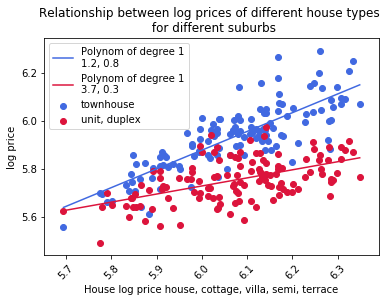

In [128]:
y1 = housing_agg_wo_outliers_sub.House_log_price_t
y2 = housing_agg_wo_outliers_sub.House_log_price_u
x = housing_agg_wo_outliers_sub.House_log_price_h
deg = 1
res1 = polynomial(x, y1, deg)
res2 = polynomial(x, y2, deg)

plt.scatter(housing_agg_wo_outliers_sub.House_log_price_h, housing_agg_wo_outliers_sub.House_log_price_t, 
            label='townhouse', color=col1)
plt.plot(res1['data'].x_1, res1['data'].y_pred, color=col1, label="Polynom of degree " + str(deg) + 
            '\n' + res1['coef'])
plt.legend()

plt.scatter(housing_agg_wo_outliers_sub.House_log_price_h, housing_agg_wo_outliers_sub.House_log_price_u, 
            label='unit, duplex', color=col2)
plt.plot(res2['data'].x_1, res2['data'].y_pred, color=col2, label="Polynom of degree " + str(deg) + 
            '\n' + res2['coef'])
plt.legend()
plt.xlabel('House log price house, cottage, villa, semi, terrace')
plt.ylabel('log price')
plt.title('Relationship between log prices of different house types \n for different suburbs')
plt.xticks(rotation=45)
plt.legend();

**Aggregated housing data around airbnb accommodations**

We want to aggregate the housing prices around airbnb accommodations in a similar way as we have already aggregated the airbnb accommodations.

In [129]:
airbnb_lat_long = airbnb_cleaned_df.loc[:, ['Air_latitude', 'Air_longitude']].values
housing_lat_long = housing_sub_wo_outliers.loc[:, ['House_latitude', 'House_longitude']].values

**Circle with radius of 0.5, 1 and 5 km**

Next, the observations that are going to be aggregated in a later step are selected.

*This step is time-consuming and the cells are thus set to Raw.*

We load the datasets again.

In [130]:
housing_obs_500m_wo_outliers = pickle.load(open("housing_obs_500m_wo_outliers.p", "rb"))
housing_obs_1km_wo_outliers = pickle.load(open("housing_obs_1km_wo_outliers.p", "rb"))
housing_obs_5km_wo_outliers = pickle.load(open("housing_obs_5km_wo_outliers.p", "rb"))

In a next step, the data is aggregated based on the information in `housing_obs_500m_wo_outliers`, `housing_obs_1km_wo_outliers` and `housing_obs_5km_wo_outliers`.

*This step is time-consuming and the cells are thus set to Raw.*

In [131]:
housing_agg_500m_wo_outliers = pickle.load(open("housing_agg_500m_wo_outliers.p", "rb"))
housing_agg_1km_wo_outliers = pickle.load(open("housing_agg_1km_wo_outliers.p", "rb"))
housing_agg_5km_wo_outliers = pickle.load(open("housing_agg_5km_wo_outliers.p", "rb"))

In [132]:
housing_agg_5km_wo_outliers['mean'].head(5)

,Air_group,House_log_price_h,House_log_price_t,House_log_price_u,House_rooms_h,House_rooms_t,House_rooms_u,House_distance_h,House_distance_t,House_distance_u,House_bedroom2_h,House_bedroom2_t,House_bedroom2_u,House_bathroom_h,House_bathroom_t,House_bathroom_u,House_landsize_h,House_landsize_t,House_landsize_u
0,0,6.142970,5.989953,5.810940,3.608833,2.897959,2.228571,10.881703,10.179592,10.228571,3.555205,2.918367,2.242857,1.876972,1.734694,1.185714,666.823344,217.530612,225.728571
1,1,6.074204,5.909904,5.721474,2.974811,2.629213,1.818584,5.791184,5.741573,4.725221,2.944584,2.617978,1.823009,1.403023,1.595506,1.115044,348.482368,163.426966,126.694690
2,2,6.198379,6.104796,5.792660,2.814136,2.678571,1.847701,4.676440,4.707143,4.942241,2.790576,2.678571,1.841954,1.531414,1.857143,1.209770,241.486911,144.535714,131.071839
3,3,6.052395,5.902187,5.700610,2.972940,2.623529,1.797980,6.449815,6.288235,5.861616,2.948339,2.611765,1.803030,1.380074,1.600000,1.065657,376.191882,140.835294,147.000000
4,4,6.209912,6.077968,5.784843,2.856410,2.676471,1.847262,5.361026,6.073529,5.310086,2.835897,2.676471,1.844380,1.564103,1.735294,1.184438,279.305128,139.294118,128.074928


In [133]:
housing_agg_5km_wo_outliers['mean'].tail(5)

,Air_group,House_log_price_h,House_log_price_t,House_log_price_u,House_rooms_h,House_rooms_t,House_rooms_u,House_distance_h,House_distance_t,House_distance_u,House_bedroom2_h,House_bedroom2_t,House_bedroom2_u,House_bathroom_h,House_bathroom_t,House_bathroom_u,House_landsize_h,House_landsize_t,House_landsize_u
21305,22325,6.141625,6.005488,5.773539,2.733202,2.500000,1.785933,3.098814,2.898276,3.047706,2.699605,2.482759,1.785933,1.430830,1.672414,1.262997,192.887352,186.465517,75.314985
21306,22326,6.122250,5.972390,5.757321,2.842713,2.556962,1.792398,3.755267,3.530380,3.223392,2.805195,2.544304,1.804094,1.417027,1.696203,1.228070,239.756133,174.189873,99.640351
21307,22328,6.100730,5.928096,5.891823,3.681481,3.000000,2.500000,14.798519,13.427273,14.307143,3.651852,3.000000,2.500000,1.748148,1.818182,1.214286,672.711111,285.181818,266.928571
21308,22329,6.145255,6.024018,5.782202,2.706150,2.509434,1.791798,3.053986,2.875472,3.071293,2.676538,2.509434,1.788644,1.441913,1.679245,1.258675,185.289294,175.056604,90.564669
21309,22330,6.128658,5.974416,5.765363,2.828909,2.551282,1.804665,3.649115,3.478205,3.168513,2.792035,2.538462,1.816327,1.415929,1.692308,1.241983,235.423304,174.038462,94.638484


**The price of the nearest house sold**

The selection of the nearest house sold is implemented next.

In [134]:
housing_lat_long = housing_cleaned_df.loc[:, ['House_latitude', 'House_longitude']]
housing_lat_long_type = housing_sub_wo_outliers.loc[:, ['House_latitude', 'House_longitude', 'House_type']]

*This step is time-consuming and the cells are thus set to Raw.*

In [135]:
housing_nearest_obs_wo_outliers = pickle.load(open("housing_nearest_obs_wo_outliers.p", "rb"))

In [136]:
housing_nearest_price_wo_outliers = house.the_nearest_obs_housing_prices(airbnb_cleaned_df,
                                                                         housing_sub_wo_outliers, 
                                                                         housing_nearest_obs_wo_outliers, 
                                                                         ['House_log_price', 'House_rooms', 
                                                                          'House_distance', 'House_bedroom2',
                                                                          'House_bathroom', 'House_landsize'])

In [137]:
housing_nearest_price_wo_outliers.head(5)

,Air_group,House_log_price_h,House_rooms_h,House_distance_h,House_bedroom2_h,House_bathroom_h,House_landsize_h,House_log_price_u,House_rooms_u,House_distance_u,...,House_landsize_u,House_log_price_t,House_rooms_t,House_distance_t,House_bedroom2_t,House_bathroom_t,House_landsize_t,dist_h,dist_u,dist_t
0,0,6.325926,3.0,7.3,3.0,2.0,664.0,5.781755,2.0,7.5,...,0.0,6.100371,3.0,7.5,3.0,2.0,284.0,4.836398,4.497558,4.699588
1,1,6.012837,2.0,2.5,2.0,1.0,172.0,5.875061,2.0,2.5,...,0.0,5.954243,3.0,2.5,3.0,2.0,0.0,4.833653,4.793180,4.938525
2,2,6.181844,3.0,2.6,3.0,1.0,248.0,5.640978,1.0,2.6,...,778.0,6.130334,2.0,1.3,2.0,2.0,87.0,4.798061,4.986905,4.751524
3,3,6.213518,3.0,3.0,3.0,1.0,142.0,5.698970,2.0,2.5,...,0.0,5.916454,3.0,3.4,3.0,3.0,67.0,4.987677,4.777657,4.049423
4,4,6.191730,3.0,2.6,3.0,2.0,189.0,5.799341,2.0,2.4,...,0.0,6.155336,2.0,2.6,2.0,2.0,153.0,4.980823,4.984765,4.986148


We also save these results to disk and re-load them.

In [138]:
pickle.dump(housing_nearest_price_wo_outliers, open("housing_nearest_price_wo_outliers.p", "wb"))

In [139]:
housing_nearest_price_wo_outliers = pickle.load(open("housing_nearest_price_wo_outliers.p", "rb"))
housing_nearest_price_wo_outliers.head(5)

,Air_group,House_log_price_h,House_rooms_h,House_distance_h,House_bedroom2_h,House_bathroom_h,House_landsize_h,House_log_price_u,House_rooms_u,House_distance_u,...,House_landsize_u,House_log_price_t,House_rooms_t,House_distance_t,House_bedroom2_t,House_bathroom_t,House_landsize_t,dist_h,dist_u,dist_t
0,0,6.325926,3.0,7.3,3.0,2.0,664.0,5.781755,2.0,7.5,...,0.0,6.100371,3.0,7.5,3.0,2.0,284.0,4.836398,4.497558,4.699588
1,1,6.012837,2.0,2.5,2.0,1.0,172.0,5.875061,2.0,2.5,...,0.0,5.954243,3.0,2.5,3.0,2.0,0.0,4.833653,4.793180,4.938525
2,2,6.181844,3.0,2.6,3.0,1.0,248.0,5.640978,1.0,2.6,...,778.0,6.130334,2.0,1.3,2.0,2.0,87.0,4.798061,4.986905,4.751524
3,3,6.213518,3.0,3.0,3.0,1.0,142.0,5.698970,2.0,2.5,...,0.0,5.916454,3.0,3.4,3.0,3.0,67.0,4.987677,4.777657,4.049423
4,4,6.191730,3.0,2.6,3.0,2.0,189.0,5.799341,2.0,2.4,...,0.0,6.155336,2.0,2.6,2.0,2.0,153.0,4.980823,4.984765,4.986148


##### Crimes data 

Lastly, the crime dataset is aggregated. The aggregation is done according to the variable `local_government_area`.

In [140]:
crimes_agg = crime.aggregate_data(crime_cleaned_df, 
                                  ['Crime_lga_rate_per_100000_population'], 
                                  ['Crime_local_government_area'], 
                                   'Crime_offence_division', 
                                  agg_fun ='mean')
crimes_agg.head(5)

,Crime_local_government_area,Crime_lga_rate_per_100000_population_A Crimes against the person,Crime_lga_rate_per_100000_population_B Property and deception offences,Crime_lga_rate_per_100000_population_C Drug offences,Crime_lga_rate_per_100000_population_D Public order and security offences,Crime_lga_rate_per_100000_population_E Justice procedures offences,Crime_lga_rate_per_100000_population_F Other offences
0,alpine,43.445771,53.218761,52.839712,45.959223,35.907003,15.800766
1,ararat,46.929150,59.552030,49.278554,60.350185,53.386668,14.460237
2,ballarat,34.360020,43.748209,36.257205,25.038832,36.016893,2.420531
3,banyule,31.869290,40.475767,29.231876,14.929186,25.204392,1.677447
4,bass coast,47.467709,49.145052,45.218913,33.932810,36.492349,9.023037


In [141]:
crimes_agg_median = crime.aggregate_data(crime_cleaned_df, 
                                         ['Crime_lga_rate_per_100000_population'], 
                                         ['Crime_local_government_area'], 
                                         'Crime_offence_division', 
                                         agg_fun ='median')
crimes_agg_median.head(5)

,Crime_local_government_area,Crime_lga_rate_per_100000_population_A Crimes against the person,Crime_lga_rate_per_100000_population_B Property and deception offences,Crime_lga_rate_per_100000_population_C Drug offences,Crime_lga_rate_per_100000_population_D Public order and security offences,Crime_lga_rate_per_100000_population_E Justice procedures offences,Crime_lga_rate_per_100000_population_F Other offences
0,alpine,24.671053,40.873048,39.952058,24.646327,16.572754,8.271983
1,ararat,34.056800,51.085201,26.487727,43.308792,43.009141,8.829242
2,ballarat,15.012460,13.130539,16.362954,9.160871,18.615763,1.970327
3,banyule,15.269384,27.128381,9.277801,6.515719,11.383687,0.816237
4,bass coast,26.298104,33.472193,32.479132,19.335146,15.700066,3.501278


We save and load this dataset.

In [142]:
pickle.dump(crimes_agg, open("crimes_agg.p", "wb"))
pickle.dump(crimes_agg_median, open("crimes_agg_median.p", "wb"))
crimes_agg = pickle.load(open("crimes_agg.p", "rb"))
crimes_agg_median = pickle.load(open("crimes_agg_median.p", "rb"))

#### Merging the datasets

Now, the datasets have to be merged. We load the data as a first step.

In [143]:
airbnb_agg_50m_wo_outliers = pickle.load(open("airbnb_agg_50m_wo_outliers.p", "rb"))
airbnb_agg_100m_wo_outliers = pickle.load(open("airbnb_agg_100m_wo_outliers.p", "rb"))
airbnb_agg_500m_wo_outliers = pickle.load(open("airbnb_agg_500m_wo_outliers.p", "rb"))
airbnb_nearest_price_wo_outliers = pickle.load(open("airbnb_nearest_price_wo_outliers.p", "rb"))
airbnb_agg_wo_outliers = pickle.load(open("airbnb_agg_wo_outliers.p", "rb"))
airbnb_agg_wo_outliers_sum = pickle.load(open("airbnb_agg_wo_outliers_sum.p", "rb"))
airbnb_agg_wo_outliers_count = pickle.load(open("airbnb_agg_wo_outliers_count.p", "rb"))
airbnb_agg_50m_wo_outliers_prop = pickle.load(open("airbnb_agg_50m_wo_outliers_prop.p", "rb"))
airbnb_agg_100m_wo_outliers_prop = pickle.load(open("airbnb_agg_100m_wo_outliers_prop.p", "rb"))
airbnb_agg_500m_wo_outliers_prop = pickle.load(open("airbnb_agg_500m_wo_outliers_prop.p", "rb"))
airbnb_nearest_price_wo_outliers_prop = pickle.load(open("airbnb_nearest_price_wo_outliers_prop.p", "rb"))
airbnb_agg_wo_outliers_prop = pickle.load(open("airbnb_agg_wo_outliers_prop.p", "rb"))
airbnb_agg_wo_outliers_prop_sum = pickle.load(open("airbnb_agg_wo_outliers_prop_sum.p", "rb"))
airbnb_agg_wo_outliers_prop_count = pickle.load(open("airbnb_agg_wo_outliers_prop_count.p", "rb"))
housing_agg_500m_wo_outliers = pickle.load(open("housing_agg_500m_wo_outliers.p", "rb"))
housing_agg_1km_wo_outliers = pickle.load(open("housing_agg_1km_wo_outliers.p", "rb"))
housing_agg_5km_wo_outliers = pickle.load(open("housing_agg_5km_wo_outliers.p", "rb"))
housing_nearest_price_wo_outliers = pickle.load(open("housing_nearest_price_wo_outliers.p", "rb"))
housing_agg_wo_outliers = pickle.load(open("housing_agg_wo_outliers.p", "rb"))
crimes_agg = pickle.load(open("crimes_agg.p", "rb"))
crimes_agg_median = pickle.load(open("crimes_agg_median.p", "rb"))

The number of obervations for the different datasets are presented below.

In [144]:
# new cell
airbnb_agg_50m_wo_outliers['mean'].shape[0] # 20144
airbnb_agg_100m_wo_outliers['mean'].shape[0] # 20874
airbnb_agg_500m_wo_outliers['mean'].shape[0] # 22066
airbnb_nearest_price_wo_outliers.shape[0] # 22331
airbnb_agg_wo_outliers.shape[0] # 30
airbnb_agg_wo_outliers_sum.shape[0] # 30
airbnb_agg_wo_outliers_count.shape[0] # 30
airbnb_agg_50m_wo_outliers_prop['mean'].shape[0] # 19956
airbnb_agg_100m_wo_outliers_prop['mean'].shape[0] # 20803
airbnb_agg_500m_wo_outliers_prop['mean'].shape[0] # 22061
airbnb_nearest_price_wo_outliers_prop.shape[0] # 22331
airbnb_agg_wo_outliers_prop.shape[0] # 30
airbnb_agg_wo_outliers_prop_sum.shape[0] # 30
airbnb_agg_wo_outliers_prop_count.shape[0] # 30
housing_agg_500m_wo_outliers['mean'].shape[0] # 19073
housing_agg_1km_wo_outliers['mean'].shape[0] # 20707
housing_agg_5km_wo_outliers['mean'].shape[0] # 21310
housing_nearest_price_wo_outliers.shape[0] # 22331
housing_agg_wo_outliers.shape[0] # 266
crimes_agg.shape[0] # 79
crimes_agg_median.shape[0] # 79

79

The following datasets are merged to the airbnb dataset `airbnb_cleaned_df`:

- from `airbnb_agg_50m_wo_outliers` the dataset with the mean is taken.
- "--" `airbnb_agg_100m_wo_outliers` "--" 
- "--" `airbnb_agg_500m_wo_outliers` "--"
- "--" `airbnb_agg_50m_wo_outliers_prop` "--"
- "--" `airbnb_agg_100m_wo_outliers_prop` "--"
- "--" `airbnb_agg_500m_wo_outliers_prop` "--"
- "--" `housing_agg_500m_wo_outliers` "--"
- "--" `housing_agg_1km_wo_outliers` "--"
- "--" `housing_agg_5km_wo_outliers` "--"
- `airbnb_nearest_price_wo_outliers`
- `airbnb_nearest_price_wo_outliers_prop`
- `airbnb_agg_wo_outliers`
- `airbnb_agg_wo_outliers_sum`
- `airbnb_agg_wo_outliers_count`
- `airbnb_agg_wo_outliers_prop` 
- `airbnb_agg_wo_outliers_prop_sum`
- `airbnb_agg_wo_outliers_prop_count`
- `housing_nearest_price_wo_outliers`
- `housing_agg_wo_outliers`
- `crimes_agg`
- `crimes_agg_median`

The procedure is as follows:
- `airbnb_cleaned_df` and `housing_agg_wo_outliers` are linked by `Air_smart_location` and `House_suburb`, respectively. 
- `airbnb_cleaned_df` and `crimes_agg` are linked by `Air_neighbourhood_cleansed` and `Crime_local_government_area`, respectively.
- `airbnb_cleaned_df` and `airbnb_agg_wo_outliers` are linked by `Air_neighbourhood_cleansed`.
- The other dataset are linked by `Air_group`.

In *I. Preparation* the variables are prepared for the merge and in *II. Merge* the datasets are merged.

**I. Preparation**

First, the variable `Air_group` is added to the `airbnb_cleaned_df` dataset.

In [145]:
airbnb_cleaned_df.index
airbnb_cleaned_df['Air_group'] = range(airbnb_cleaned_df.shape[0])

The variable `Air_neighbourhood_cleansed` is transformed to lowercase so that it can be merged to `Crime_local_government_area` later.

In [146]:
np.sort(airbnb_cleaned_df.Air_neighbourhood_cleansed.unique())

array(['Banyule', 'Bayside', 'Boroondara', 'Brimbank', 'Cardinia',
       'Casey', 'Darebin', 'Frankston', 'Glen Eira', 'Greater Dandenong',
       'Hobsons Bay', 'Hume', 'Kingston', 'Knox', 'Manningham',
       'Maribyrnong', 'Maroondah', 'Melbourne', 'Melton', 'Monash',
       'Moonee Valley', 'Moreland', 'Nillumbik', 'Port Phillip',
       'Stonnington', 'Whitehorse', 'Whittlesea', 'Wyndham', 'Yarra',
       'Yarra Ranges'], dtype=object)

In [147]:
np.sort(crime_cleaned_df.Crime_local_government_area.unique())

array(['alpine', 'ararat', 'ballarat', 'banyule', 'bass coast', 'baw baw',
       'bayside', 'benalla', 'boroondara', 'brimbank', 'buloke',
       'campaspe', 'cardinia', 'casey', 'central goldfields',
       'colac-otway', 'corangamite', 'darebin', 'east gippsland',
       'frankston', 'gannawarra', 'glen eira', 'glenelg', 'golden plains',
       'greater bendigo', 'greater dandenong', 'greater geelong',
       'greater shepparton', 'hepburn', 'hindmarsh', 'hobsons bay',
       'horsham', 'hume', 'indigo', 'kingston', 'knox', 'latrobe',
       'loddon', 'macedon ranges', 'manningham', 'mansfield',
       'maribyrnong', 'maroondah', 'melbourne', 'melton', 'mildura',
       'mitchell', 'moira', 'monash', 'moonee valley', 'moorabool',
       'moreland', 'mornington peninsula', 'mount alexander', 'moyne',
       'murrindindi', 'nillumbik', 'northern grampians', 'port phillip',
       'pyrenees', 'queenscliffe', 'south gippsland',
       'southern grampians', 'stonnington', 'strathbogie', 

In [148]:
airbnb_cleaned_df.loc[:, 'Air_neighbourhood_cleansed'] = \
        airbnb_cleaned_df.Air_neighbourhood_cleansed.str.lower()

airbnb_agg_wo_outliers.loc[:, 'Air_neighbourhood_cleansed'] = \
        airbnb_agg_wo_outliers.Air_neighbourhood_cleansed.str.lower()
airbnb_agg_wo_outliers_sum.loc[:, 'Air_neighbourhood_cleansed'] = \
        airbnb_agg_wo_outliers_sum.Air_neighbourhood_cleansed.str.lower()
airbnb_agg_wo_outliers_count.loc[:, 'Air_neighbourhood_cleansed'] = \
        airbnb_agg_wo_outliers_count.Air_neighbourhood_cleansed.str.lower()

airbnb_agg_wo_outliers_prop.loc[:, 'Air_neighbourhood_cleansed'] = \
        airbnb_agg_wo_outliers_prop.Air_neighbourhood_cleansed.str.lower()
airbnb_agg_wo_outliers_prop_sum.loc[:, 'Air_neighbourhood_cleansed'] = \
        airbnb_agg_wo_outliers_prop_sum.Air_neighbourhood_cleansed.str.lower()
airbnb_agg_wo_outliers_prop_count.loc[:, 'Air_neighbourhood_cleansed'] = \
        airbnb_agg_wo_outliers_prop_count.Air_neighbourhood_cleansed.str.lower()

In [149]:
airbnb_agg_wo_outliers_prop.head(5)

,Air_neighbourhood_cleansed,Air_accommodates_Apartment_Condominium,Air_accommodates_House_Cottage_Villa,Air_accommodates_Other,Air_accommodates_Townhouse,Air_bathrooms_Apartment_Condominium,Air_bathrooms_House_Cottage_Villa,Air_bathrooms_Other,Air_bathrooms_Townhouse,Air_bedrooms_Apartment_Condominium,...,Air_beds_Other,Air_beds_Townhouse,Air_guests_included_Apartment_Condominium,Air_guests_included_House_Cottage_Villa,Air_guests_included_Other,Air_guests_included_Townhouse,Air_log_price_Apartment_Condominium,Air_log_price_House_Cottage_Villa,Air_log_price_Other,Air_log_price_Townhouse
0,banyule,2.688889,2.087500,2.333333,2.400000,1.144444,1.150000,1.041667,1.400000,1.333333,...,1.375000,1.300000,1.311111,1.125000,1.416667,1.000000,1.960543,1.725312,1.875414,1.755435
1,bayside,2.675000,2.606742,2.156250,3.269231,1.168750,1.337079,1.000000,1.346154,1.312500,...,1.218750,1.730769,1.200000,1.258427,1.343750,1.153846,2.035590,1.968721,1.963081,2.084166
2,boroondara,2.458015,2.363128,2.452381,2.615385,1.095420,1.187151,1.095238,1.250000,1.179389,...,1.404762,1.615385,1.190840,1.184358,1.238095,1.423077,1.916158,1.855915,1.953877,1.929499
3,brimbank,1.400000,2.105263,2.750000,2.111111,1.000000,1.245614,1.083333,1.055556,1.000000,...,1.583333,1.111111,1.200000,1.070175,1.333333,1.111111,1.771031,1.696429,1.822246,1.767104
4,cardinia,2.000000,2.585366,2.790698,NaN,1.000000,1.036585,1.104651,NaN,1.000000,...,1.581395,NaN,1.000000,1.317073,1.325581,NaN,2.109008,1.932142,2.179095,NaN


Next, the dataset `airbnb_agg_XXX_wo_outliers_mean`, `airbnb_agg_XXX_wo_outliers_prop_mean`, `housing_agg_XXX_wo_outliers_mean`, `airbnb_agg_XXX_wo_outliers_count` and `airbnb_agg_XXX_wo_outliers_prop_count` are created by extracting the values from the dictionaries (key `mean` and `count`, respectively).

In [150]:
airbnb_agg_50m_wo_outliers_mean = airbnb_agg_50m_wo_outliers['mean']
airbnb_agg_100m_wo_outliers_mean = airbnb_agg_100m_wo_outliers['mean']
airbnb_agg_500m_wo_outliers_mean = airbnb_agg_500m_wo_outliers['mean']
airbnb_agg_50m_wo_outliers_prop_mean = airbnb_agg_50m_wo_outliers_prop['mean']
airbnb_agg_100m_wo_outliers_prop_mean = airbnb_agg_100m_wo_outliers_prop['mean']
airbnb_agg_500m_wo_outliers_prop_mean = airbnb_agg_500m_wo_outliers_prop['mean']

airbnb_agg_50m_wo_outliers_count = airbnb_agg_50m_wo_outliers['count']
airbnb_agg_100m_wo_outliers_count = airbnb_agg_100m_wo_outliers['count']
airbnb_agg_500m_wo_outliers_count = airbnb_agg_500m_wo_outliers['count']
airbnb_agg_50m_wo_outliers_prop_count = airbnb_agg_50m_wo_outliers_prop['count']
airbnb_agg_100m_wo_outliers_prop_count = airbnb_agg_100m_wo_outliers_prop['count']
airbnb_agg_500m_wo_outliers_prop_count = airbnb_agg_500m_wo_outliers_prop['count']

housing_agg_500m_wo_outliers_mean = housing_agg_500m_wo_outliers['mean']
housing_agg_1km_wo_outliers_mean = housing_agg_1km_wo_outliers['mean']
housing_agg_5km_wo_outliers_mean = housing_agg_5km_wo_outliers['mean']

Next, we have to label the variable names differently so that we can distinguish between them in the merged dataset.

In [151]:
# room type
cols = [e + '_50m' for e in airbnb_agg_50m_wo_outliers_mean.columns if e != 'Air_group']
airbnb_agg_50m_wo_outliers_mean.columns = ['Air_group'] + cols
cols = [e + '_100m' for e in airbnb_agg_100m_wo_outliers_mean.columns if e != 'Air_group']
airbnb_agg_100m_wo_outliers_mean.columns = ['Air_group'] + cols
cols = [e + '_500m' for e in airbnb_agg_500m_wo_outliers_mean.columns if e != 'Air_group']
airbnb_agg_500m_wo_outliers_mean.columns = ['Air_group'] + cols
# property type
cols = [e + '_50m' for e in airbnb_agg_50m_wo_outliers_prop_mean.columns if e != 'Air_group']
airbnb_agg_50m_wo_outliers_prop_mean.columns = ['Air_group'] + cols
cols = [e + '_100m' for e in airbnb_agg_100m_wo_outliers_prop_mean.columns if e != 'Air_group']
airbnb_agg_100m_wo_outliers_prop_mean.columns = ['Air_group'] + cols
cols = [e + '_500m' for e in airbnb_agg_500m_wo_outliers_prop_mean.columns if e != 'Air_group']
airbnb_agg_500m_wo_outliers_prop_mean.columns = ['Air_group'] + cols
# room type
cols = [e + '_nearest' for e in airbnb_nearest_price_wo_outliers.columns if e != 'Air_group']
airbnb_nearest_price_wo_outliers.columns = ['Air_group'] + cols
# property type
cols = [e + '_nearest' for e in airbnb_nearest_price_wo_outliers_prop.columns if e != 'Air_group']
airbnb_nearest_price_wo_outliers_prop.columns = ['Air_group'] + cols
# room type: mean, sum, count
cols = [e + '_suburb' for e in airbnb_agg_wo_outliers.columns if e != 'Air_neighbourhood_cleansed']
airbnb_agg_wo_outliers.columns = ['Air_neighbourhood_cleansed'] + cols
cols = [e + '_suburb_sum' for e in airbnb_agg_wo_outliers_sum.columns if e != 'Air_neighbourhood_cleansed']
airbnb_agg_wo_outliers_sum.columns = ['Air_neighbourhood_cleansed'] + cols
cols = [e + '_suburb_count' for e in airbnb_agg_wo_outliers_count.columns if e != 'Air_neighbourhood_cleansed']
airbnb_agg_wo_outliers_count.columns = ['Air_neighbourhood_cleansed'] + cols
# property type: mean, sum, count
cols = [e + '_suburb' for e in airbnb_agg_wo_outliers_prop.columns if e != 'Air_neighbourhood_cleansed']
airbnb_agg_wo_outliers_prop.columns = ['Air_neighbourhood_cleansed'] + cols
cols = [e + '_suburb_sum' for e in airbnb_agg_wo_outliers_prop_sum.columns if e != 'Air_neighbourhood_cleansed']
airbnb_agg_wo_outliers_prop_sum.columns = ['Air_neighbourhood_cleansed'] + cols
cols = [e + '_suburb_count' for e in airbnb_agg_wo_outliers_prop_count.columns if e != 'Air_neighbourhood_cleansed']
airbnb_agg_wo_outliers_prop_count.columns = ['Air_neighbourhood_cleansed'] + cols
# room type: count
cols = [e + '_50m_count' for e in airbnb_agg_50m_wo_outliers_count.columns if e != 'Air_group']
airbnb_agg_50m_wo_outliers_count.columns = ['Air_group'] + cols
cols = [e + '_100m_count' for e in airbnb_agg_100m_wo_outliers_count.columns if e != 'Air_group']
airbnb_agg_100m_wo_outliers_count.columns = ['Air_group'] + cols
cols = [e + '_500m_count' for e in airbnb_agg_500m_wo_outliers_count.columns if e != 'Air_group']
airbnb_agg_500m_wo_outliers_count.columns = ['Air_group'] + cols
# property type: count
cols = [e + '_50m_count' for e in airbnb_agg_50m_wo_outliers_prop_count.columns if e != 'Air_group']
airbnb_agg_50m_wo_outliers_prop_count.columns = ['Air_group'] + cols
cols = [e + '_100m_count' for e in airbnb_agg_100m_wo_outliers_prop_count.columns if e != 'Air_group']
airbnb_agg_100m_wo_outliers_prop_count.columns = ['Air_group'] + cols
cols = [e + '_500m_count' for e in airbnb_agg_500m_wo_outliers_prop_count.columns if e != 'Air_group']
airbnb_agg_500m_wo_outliers_prop_count.columns = ['Air_group'] + cols

cols = [e + '_500m' for e in housing_agg_500m_wo_outliers_mean.columns if e != 'Air_group']
housing_agg_500m_wo_outliers_mean.columns = ['Air_group'] + cols
cols = [e + '_1km' for e in housing_agg_1km_wo_outliers_mean.columns if e != 'Air_group']
housing_agg_1km_wo_outliers_mean.columns = ['Air_group'] + cols
cols = [e + '_5km' for e in housing_agg_5km_wo_outliers_mean.columns if e != 'Air_group']
housing_agg_5km_wo_outliers_mean.columns = ['Air_group'] + cols
cols = [e + '_nearest' for e in housing_nearest_price_wo_outliers.columns if e != 'Air_group']
housing_nearest_price_wo_outliers.columns = ['Air_group'] + cols
#cols = [e + '_suburb' for e in housing_agg_wo_outliers.columns if e != 'House_suburb']
#housing_agg_wo_outliers.columns = ['House_suburb'] + cols

cols = [e + '_median' for e in crimes_agg_median.columns]
crimes_agg_median.columns = cols

**II. Merge**

Now, the datasets are ready to be merged. The merge is done in the next cell.

In [152]:
merged = airbnb_cleaned_df.merge(airbnb_agg_50m_wo_outliers_mean, left_on='Air_group', right_on='Air_group',
                                 how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_100m_wo_outliers_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_500m_wo_outliers_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_50m_wo_outliers_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_100m_wo_outliers_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_500m_wo_outliers_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_50m_wo_outliers_prop_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_100m_wo_outliers_prop_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_500m_wo_outliers_prop_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_50m_wo_outliers_prop_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_100m_wo_outliers_prop_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_500m_wo_outliers_prop_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_nearest_price_wo_outliers, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_nearest_price_wo_outliers_prop, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_wo_outliers, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_wo_outliers_sum, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_wo_outliers_count, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_wo_outliers_prop, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_wo_outliers_prop_sum, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged.shape)
merged = merged.merge(airbnb_agg_wo_outliers_prop_count, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged.shape)
merged = merged.merge(housing_agg_500m_wo_outliers_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(housing_agg_1km_wo_outliers_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(housing_agg_5km_wo_outliers_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(housing_nearest_price_wo_outliers, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged.shape)
merged = merged.merge(housing_agg_wo_outliers, left_on='Air_smart_location_cleaned', 
                      right_on='House_suburb', how='left')
print(merged.shape)
merged = merged.merge(crimes_agg, left_on='Air_neighbourhood_cleansed',
                     right_on='Crime_local_government_area', how='left')
print(merged.shape)
merged = merged.merge(crimes_agg_median, left_on='Air_neighbourhood_cleansed',
                     right_on='Crime_local_government_area_median', how='left')
print(merged.shape)
merged.drop(columns='Crime_local_government_area_median', inplace=True)
merged.columns

(22331, 119)
(22331, 137)
(22331, 155)
(22331, 173)
(22331, 191)
(22331, 209)
(22331, 233)
(22331, 257)
(22331, 281)
(22331, 305)
(22331, 329)
(22331, 353)
(22331, 374)
(22331, 402)
(22331, 420)
(22331, 438)
(22331, 456)
(22331, 480)
(22331, 504)
(22331, 528)
(22331, 546)
(22331, 564)
(22331, 582)
(22331, 603)
(22331, 622)
(22331, 629)
(22331, 636)


Index(['Air_id', 'Air_listing_url', 'Air_scrape_id', 'Air_last_scraped',
       'Air_name', 'Air_summary', 'Air_space', 'Air_description',
       'Air_experiences_offered', 'Air_neighborhood_overview',
       ...
       'Crime_lga_rate_per_100000_population_C Drug offences',
       'Crime_lga_rate_per_100000_population_D Public order and security offences',
       'Crime_lga_rate_per_100000_population_E Justice procedures offences',
       'Crime_lga_rate_per_100000_population_F Other offences',
       'Crime_lga_rate_per_100000_population_A Crimes against the person_median',
       'Crime_lga_rate_per_100000_population_B Property and deception offences_median',
       'Crime_lga_rate_per_100000_population_C Drug offences_median',
       'Crime_lga_rate_per_100000_population_D Public order and security offences_median',
       'Crime_lga_rate_per_100000_population_E Justice procedures offences_median',
       'Crime_lga_rate_per_100000_population_F Other offences_median'],
      dtype=

Let's check the result by inspecting the first 5 rows of this dataset.

In [153]:
merged.head(5)

,Air_id,Air_listing_url,Air_scrape_id,Air_last_scraped,Air_name,Air_summary,Air_space,Air_description,Air_experiences_offered,Air_neighborhood_overview,...,Crime_lga_rate_per_100000_population_C Drug offences,Crime_lga_rate_per_100000_population_D Public order and security offences,Crime_lga_rate_per_100000_population_E Justice procedures offences,Crime_lga_rate_per_100000_population_F Other offences,Crime_lga_rate_per_100000_population_A Crimes against the person_median,Crime_lga_rate_per_100000_population_B Property and deception offences_median,Crime_lga_rate_per_100000_population_C Drug offences_median,Crime_lga_rate_per_100000_population_D Public order and security offences_median,Crime_lga_rate_per_100000_population_E Justice procedures offences_median,Crime_lga_rate_per_100000_population_F Other offences_median
0,9835,https://www.airbnb.com/rooms/9835,20181207034809,2018-12-07,Beautiful Room & House,NaN,"House: Clean, New, Modern, Quite, Safe. 10Km f...","House: Clean, New, Modern, Quite, Safe. 10Km f...",none,Very safe! Family oriented. Older age group.,...,18.058480,7.227045,19.077651,1.290725,7.714991,10.444646,6.361083,4.117302,4.841032,0.850810
1,10803,https://www.airbnb.com/rooms/10803,20181207034809,2018-12-07,Room in Cool Deco Apartment in Brunswick,A large air conditioned room with queen spring...,The apartment is Deco/Edwardian in style and h...,A large air conditioned room with queen spring...,none,This hip area is a crossroads between two grea...,...,28.834864,16.668551,30.394937,1.758895,13.463723,5.548695,10.064027,5.784335,10.193550,1.218940
2,12936,https://www.airbnb.com/rooms/12936,20181207034809,2018-12-07,St Kilda 1BR APT+BEACHSIDE+VIEWS+PARKING+WIFI+AC,RIGHT IN THE HEART OF ST KILDA! It doesn't get...,FREE WiFi FREE in-building remote controlled g...,RIGHT IN THE HEART OF ST KILDA! It doesn't get...,none,A stay at our apartment means you can enjoy so...,...,24.360705,25.672314,25.511191,7.682415,12.732057,12.336034,8.614831,9.033523,7.347384,1.049626
3,15246,https://www.airbnb.com/rooms/15246,20181207034809,2018-12-07,Large private room-close to city,"Comfortable, relaxed house, a home away from ...",The atmosphere is relaxed and easy going. You ...,"Comfortable, relaxed house, a home away from ...",none,"This is a great neighbourhood – it is quiet, y...",...,34.498681,20.530726,21.952751,1.419375,15.309284,6.347863,9.266585,6.361184,7.095767,1.242506
4,16760,https://www.airbnb.com/rooms/16760,20181207034809,2018-12-07,Melbourne BnB near City & Sports,NaN,We offer comfortable accommodation in Inner Me...,We offer comfortable accommodation in Inner Me...,none,NaN,...,24.360705,25.672314,25.511191,7.682415,12.732057,12.336034,8.614831,9.033523,7.347384,1.049626


In [154]:
merged.shape # (22331, 635)

(22331, 635)

Let's check the variable `Air_log_price_House_Cottage_Villa_suburb` more carefully. The suffixes `House_Cottage_Villa` and `suburb` mean that the values from observations with property type `House_Cottage_Villa` were aggregated by `suburb` before they were merged to `airbnb_cleaned_df` on `Air_neighbourhood_cleansed`. 

In [155]:
merged.loc[:, ['Air_neighbourhood_cleansed', 'Air_log_price_House_Cottage_Villa_suburb']].head(5)

,Air_neighbourhood_cleansed,Air_log_price_House_Cottage_Villa_suburb
0,manningham,1.847959
1,moreland,1.784803
2,port phillip,2.071960
3,darebin,1.821812
4,port phillip,2.071960


A next check shows that the information in the `merged` dataset is the same as in the `airbnb_agg_wo_outliers_prop` dataset.

In [156]:
airbnb_agg_wo_outliers_prop.loc[airbnb_agg_wo_outliers_prop.Air_neighbourhood_cleansed.isin(['manningham', 'moreland', 'port phillip',
                                                                 'darebin']),
                                ['Air_neighbourhood_cleansed', 'Air_log_price_House_Cottage_Villa_suburb']].head(5)

,Air_neighbourhood_cleansed,Air_log_price_House_Cottage_Villa_suburb
6,darebin,1.821812
14,manningham,1.847959
21,moreland,1.784803
23,port phillip,2.071960


In [157]:
pickle.dump(merged, open("merged.p", "wb" ))

In [158]:
merged = pickle.load(open("merged.p", "rb"))

#### Additional variables

To finish the data preparation section, additional variables are defined.

**Distance to the Melbourne City Centre**

The latitude and longitude of the Melbourne City Centre is added to the dataset because this is an import variable in the house market dataset. The distance to CBD might be important to predict airbnb prices as well.

In [159]:
merged['latitude_CBD'] = -37.814
merged['longitude_CBD'] = 144.963

merged['Air_distance_to_CBD'] = air._haversine_np(merged.Air_longitude, merged.Air_latitude,
                                                merged.longitude_CBD, merged.latitude_CBD)

**Property type**

The regrouping of the property type has to be reimplemented on the merged dataset. 

In [160]:
merged['Air_property_type_2'] = 'Other'
merged.loc[merged.Air_property_type.isin(['House', 'Cottage', 'Villa']), 'Air_property_type_2'] = 'House_Cottage_Villa'
merged.loc[merged.Air_property_type.isin(['Apartment', 'Condominium']), 'Air_property_type_2'] = 'Apartment_Condominium'
merged.loc[merged.Air_property_type.isin(['Townhouse']), 'Air_property_type_2'] = 'Townhouse'

**Airbnb and house prices of the same kind**

The following variables are created to store the price data of the airbnb accommodation and houses that are of the same/similar kind as the reference object:

**Airbnb suburbs - averages**

*Room type*
- `airbnb_log_price_suburb_same_room_type`
- `airbnb_accommodates_suburb_same_room_type`
- `airbnb_bathrooms_suburb_same_room_type`
- `airbnb_bedrooms_suburb_same_room_type`
- `airbnb_beds_suburb_same_room_type`
- `airbnb_guests_included_suburb_same_room_type`

*Property type*
- `airbnb_log_price_suburb_property_type`
- `airbnb_accommodates_suburb_same_property_type`
- `airbnb_bathrooms_suburb_same_property_type`
- `airbnb_bedrooms_suburb_same_property_type`
- `airbnb_beds_suburb_same_property_type`
- `airbnb_guests_included_suburb_same_property_type` 
                                                           
**Airbnb other forms of aggregation - averages**

*Room type*
- `airbnb_log_price_50m_same_room_type`
- `airbnb_accommodates_50m_same_room_type`
- `airbnb_bathrooms_50m_same_room_type`
- `airbnb_bedrooms_50m_same_room_type`
- `airbnb_beds_50m_same_room_type`
- `airbnb_guests_included_50m_same_room_type`
- `airbnb_log_price_100m_same_room_type`
- `airbnb_accommodates_100m_same_room_type`
- `airbnb_bathrooms_100m_same_room_type`
- `airbnb_bedrooms_100m_same_room_type`
- `airbnb_beds_100m_same_room_type`
- `airbnb_guests_included_100m_same_room_type`
- `airbnb_log_price_500m_same_room_type`
- `airbnb_accommodates_500m_same_room_type`
- `airbnb_bathrooms_500m_same_room_type`
- `airbnb_bedrooms_500m_same_room_type`
- `airbnb_beds_500m_same_room_type`
- `airbnb_guests_included_500m_same_room_type`

*Property type*
- `airbnb_log_price_50m_same_property_type`
- `airbnb_accommodates_50m_same_property_type`
- `airbnb_bathrooms_50m_same_property_type`
- `airbnb_bedrooms_50m_same_property_type`
- `airbnb_beds_50m_same_property_type`
- `airbnb_guests_included_50m_same_property_type`
- `airbnb_log_price_100m_same_property_type`
- `airbnb_accommodates_100m_same_property_type`
- `airbnb_bathrooms_100m_same_property_type`
- `airbnb_bedrooms_100m_same_property_type`
- `airbnb_beds_100m_same_property_type`
- `airbnb_guests_included_100m_same_property_type`
- `airbnb_log_price_500m_same_property_type`
- `airbnb_accommodates_500m_same_property_type`
- `airbnb_bathrooms_500m_same_property_type`
- `airbnb_bedrooms_500m_same_property_type`
- `airbnb_beds_500m_same_property_type`
- `airbnb_guests_included_500m_same_property_type`

*Room and property type*
- `airbnb_nearest_room_type`
- `airbnb_nearest_property_type`

**Housing**
- `housing_suburb_house_type`
- `housing_500m_house_type`
- `housing_1km_house_type`
- `housing_5km_house_type`
- `housing_nearest_house_type`

For instance `airbnb_log_price_suburb_same_room_type` stores the aggregated log airbnb prices by suburb that have the same room type as the reference object.

*Implementation*

In [161]:
# AIRBNB SUBURBS
# Averages
merged['Air_log_price_suburb_same_room_type'] = np.nan
merged['Air_accommodates_suburb_same_room_type'] = np.nan
merged['Air_bathrooms_suburb_same_room_type'] = np.nan
merged['Air_bedrooms_suburb_same_room_type'] = np.nan
merged['Air_beds_suburb_same_room_type'] = np.nan
merged['Air_guests_included_suburb_same_room_type'] = np.nan

merged['Air_log_price_suburb_same_property_type'] = np.nan
merged['Air_accommodates_suburb_same_property_type'] = np.nan
merged['Air_bathrooms_suburb_same_property_type'] = np.nan
merged['Air_bedrooms_suburb_same_property_type'] = np.nan
merged['Air_beds_suburb_same_property_type'] = np.nan
merged['Air_guests_included_suburb_same_property_type'] = np.nan

# Sums (needed to correct the suburbs averages later)
merged['Air_log_price_suburb_same_room_type_sum'] = np.nan
merged['Air_accommodates_suburb_same_room_type_sum'] = np.nan
merged['Air_bathrooms_suburb_same_room_type_sum'] = np.nan
merged['Air_bedrooms_suburb_same_room_type_sum'] = np.nan
merged['Air_beds_suburb_same_room_type_sum'] = np.nan
merged['Air_guests_included_suburb_same_room_type_sum'] = np.nan

merged['Air_log_price_suburb_same_property_type_sum'] = np.nan
merged['Air_accommodates_suburb_same_property_type_sum'] = np.nan
merged['Air_bathrooms_suburb_same_property_type_sum'] = np.nan
merged['Air_bedrooms_suburb_same_property_type_sum'] = np.nan
merged['Air_beds_suburb_same_property_type_sum'] = np.nan
merged['Air_guests_included_suburb_same_property_type_sum'] = np.nan

# Counts
merged['Air_suburb_same_room_type_count'] = np.nan
merged['Air_suburb_same_property_type_count'] = np.nan

# AIRBNB OTHER FORMS OF AGGREGATION
# Averages
merged['Air_log_price_50m_same_room_type'] = np.nan
merged['Air_accommodates_50m_same_room_type'] = np.nan
merged['Air_bathrooms_50m_same_room_type'] = np.nan
merged['Air_bedrooms_50m_same_room_type'] = np.nan
merged['Air_beds_50m_same_room_type'] = np.nan
merged['Air_guests_included_50m_same_room_type'] = np.nan

merged['Air_log_price_100m_same_room_type'] = np.nan
merged['Air_accommodates_100m_same_room_type'] = np.nan
merged['Air_bathrooms_100m_same_room_type'] = np.nan
merged['Air_bedrooms_100m_same_room_type'] = np.nan
merged['Air_beds_100m_same_room_type'] = np.nan
merged['Air_guests_included_100m_same_room_type'] = np.nan

merged['Air_log_price_500m_same_room_type'] = np.nan
merged['Air_accommodates_500m_same_room_type'] = np.nan
merged['Air_bathrooms_500m_same_room_type'] = np.nan
merged['Air_bedrooms_500m_same_room_type'] = np.nan
merged['Air_beds_500m_same_room_type'] = np.nan
merged['Air_guests_included_500m_same_room_type'] = np.nan

merged['Air_log_price_50m_same_property_type'] = np.nan
merged['Air_accommodates_50m_same_property_type'] = np.nan
merged['Air_bathrooms_50m_same_property_type'] = np.nan
merged['Air_bedrooms_50m_same_propertym_type'] = np.nan
merged['Air_beds_50m_same_property_type'] = np.nan
merged['Air_guests_included_50m_same_property_type'] = np.nan

merged['Air_log_price_100m_same_property_type'] = np.nan
merged['Air_accommodates_100m_same_property_type'] = np.nan
merged['Air_bathrooms_100m_same_property_type'] = np.nan
merged['Air_bedrooms_100m_same_property_type'] = np.nan
merged['Air_beds_100m_same_property_type'] = np.nan
merged['Air_guests_included_100m_same_property_type'] = np.nan

merged['Air_log_price_500m_same_property_type'] = np.nan
merged['Air_accommodates_500m_same_property_type'] = np.nan
merged['Air_bathrooms_500m_same_property_type'] = np.nan
merged['Air_bedrooms_500m_same_property_type'] = np.nan
merged['Air_beds_500m_same_property_type'] = np.nan
merged['Air_guests_included_500m_same_property_type'] = np.nan

merged['Air_log_price_nearest_same_room_type'] = np.nan
merged['Air_log_price_nearest_same_property_type'] = np.nan

# Counts
merged['Air_50m_same_room_type_count'] = np.nan
merged['Air_100m_same_room_type_count'] = np.nan
merged['Air_500m_same_room_type_count'] = np.nan

merged['Air_50m_same_porperty_type_count'] = np.nan
merged['Air_100m_same_property_type_count'] = np.nan
merged['Air_500m_same_property_type_count'] = np.nan

merged['Air_nearest_same_room_type_count'] = np.nan
merged['Air_nearest_same_property_type_count'] = np.nan

# HOUSING
merged['House_log_price_suburb_same_house_type'] = np.nan
merged['House_log_price_500m_same_house_type'] = np.nan
merged['House_log_price_1km_same_house_type'] = np.nan
merged['House_log_price_5km_same_house_type'] = np.nan
merged['House_log_price_nearest_same_shouse_type'] = np.nan

In [162]:
# AIRBNB SUBURBS
# Sums
# ####
# Same room type
# -------------
# log price
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_suburb_sum']
merged.loc[merged.Air_room_type == 'Private room', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_log_price_Private room_suburb_sum']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_suburb_sum']
# accommodates
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_suburb_sum']
merged.loc[merged.Air_room_type == 'Private room', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_accommodates_Private room_suburb_sum']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_suburb_sum']
# bathrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_suburb_sum']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_bathrooms_Private room_suburb_sum']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_suburb_sum']
# bedrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_suburb_sum']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_bedrooms_Private room_suburb_sum']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_suburb_sum']
# beds
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_suburb_sum']
merged.loc[merged.Air_room_type == 'Private room', 'Air_beds_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_beds_Private room_suburb_sum']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_beds_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_beds_Shared room_suburb_sum']
# guests_included
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_suburb_sum']
merged.loc[merged.Air_room_type == 'Private room', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_guests_included_Private room_suburb_sum']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_suburb_sum']

# Same property type
# ------------------
# log price
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_Other_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_House_Cottage_Villa_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_Apartment_Condominium_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_Townhouse_suburb_sum']
# accommodates
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_Other_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_same_suburb_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_House_Cottage_Villa_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_Apartment_Condominium_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_Townhouse_suburb_sum']
# bathrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_Other_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bathrooms_House_Cottage_Villa_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_Apartment_Condominium_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_Townhouse_suburb_sum']
# bedrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_Other_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_House_Cottage_Villa_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_Apartment_Condominium_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_Townhouse_suburb_sum']
# beds
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_Other_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_House_Cottage_Villa_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_Apartment_Condominium_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_Townhouse_suburb_sum']
# guests_included
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_Other_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_House_Cottage_Villa_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_Apartment_Condominium_suburb_sum']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_suburb_same_property_type_sum'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_Townhouse_suburb_sum']


# Counts
# #####
# Same room type
# --------------
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_suburb_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_suburb_count']
merged.loc[merged.Air_room_type == 'Private room', 'Air_suburb_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_log_price_Private room_suburb_count']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_suburb_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_suburb_count']


# Same property type
# ------------------
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_suburb_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_Other_suburb_count']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_suburb_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_House_Cottage_Villa_suburb_count']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_suburb_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_Apartment_Condominium_suburb_count']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_suburb_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_Townhouse_suburb_count']


# Means
# #####
# Same room type
# -------------
# log price
merged['Air_log_price_suburb_same_room_type'] = (merged.Air_log_price_suburb_same_room_type_sum - \
                                                 merged.Air_log_price) / \
                                                (merged.Air_suburb_same_room_type_count - 1)
# accommodates
merged['Air_accommodates_suburb_same_room_type'] = (merged.Air_accommodates_suburb_same_room_type_sum - \
                                                    merged.Air_accommodates) / \
                                                   (merged.Air_suburb_same_room_type_count - 1)
# bathrooms
merged['Air_bathrooms_suburb_same_room_type'] = (merged.Air_bathrooms_suburb_same_room_type_sum - \
                                                 merged.Air_bathrooms) / \
                                                (merged.Air_suburb_same_room_type_count - 1)
# bedrooms
merged['Air_bedrooms_suburb_same_room_type'] = (merged.Air_bedrooms_suburb_same_room_type_sum - \
                                                merged.Air_bedrooms) / \
                                               (merged.Air_suburb_same_room_type_count - 1)
# beds
merged['Air_beds_suburb_same_room_type'] = (merged.Air_beds_suburb_same_room_type_sum - \
                                            merged.Air_beds) / \
                                           (merged.Air_suburb_same_room_type_count - 1)
# guests_included
merged['Air_guests_included_suburb_same_room_type'] = (merged.Air_guests_included_suburb_same_room_type_sum - \
                                                       merged.Air_guests_included) / \
                                                      (merged.Air_suburb_same_room_type_count - 1)

# Same property type
# ------------------
# log price
merged['Air_log_price_suburb_same_property_type'] = (merged.Air_log_price_suburb_same_property_type_sum - \
                                                     merged.Air_log_price) / \
                                                    (merged.Air_suburb_same_property_type_count - 1)
# accommodates
merged['Air_accommodates_suburb_same_property_type'] = (merged.Air_accommodates_suburb_same_property_type_sum - \
                                                        merged.Air_accommodates) / \
                                                       (merged.Air_suburb_same_property_type_count - 1)
# bathrooms
merged['Air_bathrooms_suburb_same_property_type'] = (merged.Air_bathrooms_suburb_same_property_type_sum - \
                                                     merged.Air_bathrooms) / \
                                                    (merged.Air_suburb_same_property_type_count - 1)
# bedrooms
merged['Air_bedrooms_suburb_same_property_type'] = (merged.Air_bedrooms_suburb_same_property_type_sum - \
                                                    merged.Air_bedrooms) / \
                                                   (merged.Air_suburb_same_property_type_count - 1)
# beds
merged['Air_beds_suburb_same_property_type'] = (merged.Air_beds_suburb_same_property_type_sum - \
                                                merged.Air_beds) / \
                                               (merged.Air_suburb_same_property_type_count - 1)
# guests_included
merged['Air_guests_included_suburb_same_property_type'] = (merged.Air_guests_included_suburb_same_property_type_sum - \
                                                           merged.Air_guests_included) / \
                                                          (merged.Air_suburb_same_property_type_count - 1)

In [163]:
merged.loc[:, ['Air_accommodates_suburb_same_room_type']].head(5)

,Air_accommodates_suburb_same_room_type
0,2.085106
1,1.819222
2,3.104478
3,1.839721
4,1.908546


In [164]:
# AIRBNB OTHER FORMS OF AGGREGATION
# Means
# #####
# Same room type - 50m
# --------------------
# log price
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_50m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_log_price_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_log_price_Private room_50m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_50m']
# accommodates
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_50m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_accommodates_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_accommodates_Private room_50m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_50m']
# bathrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_50m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bathrooms_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_bathrooms_Private room_50m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_50m']
# bedrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_50m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bedrooms_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_bedrooms_Private room_50m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_50m']
# beds
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_50m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_beds_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_beds_Private room_50m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_beds_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_50m']
# guests_included
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_50m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_guests_included_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_guests_included_Private room_50m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_50m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_50m']

# Same room type - 100m
# ---------------------
# log price
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_100m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_log_price_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_log_price_Private room_100m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_100m']
# accommodates
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_100m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_accommodates_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_accommodates_Private room_100m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_100m']
# bathrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_100m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bathrooms_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_bathrooms_Private room_100m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_100m']
# bedrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_100m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bedrooms_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_bedrooms_Private room_100m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_100m']
# beds
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_100m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_beds_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_beds_Private room_100m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_beds_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_100m']
# guests_included
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_100m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_guests_included_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_guests_included_Private room_100m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_100m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_100m']

# Same room type - 500m
# ---------------------
# log price
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_500m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_log_price_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_log_price_Private room_500m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_500m']
# accommodates
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_500m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_accommodates_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_accommodates_Private room_500m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_500m']
# bathrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_500m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bathrooms_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_bathrooms_Private room_500m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_500m']
# bedrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_500m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bedrooms_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_bedrooms_Private room_500m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_500m']
# beds
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_500m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_beds_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_beds_Private room_500m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_beds_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_500m']
# guests_included
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_500m']
merged.loc[merged.Air_room_type == 'Private room', 'Air_guests_included_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_guests_included_Private room_500m']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_500m_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_500m']

# Same room type - nearest
# ------------------------
# log price
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_nearest']
merged.loc[merged.Air_room_type == 'Private room', 'Air_log_price_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room', 'Air_log_price_Private room_nearest']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_nearest']
# accommodates
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_nearest']
merged.loc[merged.Air_room_type == 'Private room', 'Air_accommodates_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room', 'Air_accommodates_Private room_nearest']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_nearest']
# bathrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_nearest']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bathrooms_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room', 'Air_bathrooms_Private room_nearest']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_nearest']
# bedrooms
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_nearest']
merged.loc[merged.Air_room_type == 'Private room', 'Air_bedrooms_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room', 'Air_bedrooms_Private room_nearest']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_nearest']
# beds
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_nearest']
merged.loc[merged.Air_room_type == 'Private room', 'Air_beds_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room', 'Air_beds_Private room_nearest']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_beds_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_beds_Shared room_nearest']
# guests_included
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_nearest']
merged.loc[merged.Air_room_type == 'Private room', 'Air_guests_included_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Private room', 'Air_guests_included_Private room_nearest']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_nearest_same_room_type'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_nearest']

# Same property type - 50m
# -------------------------
# log price
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_Other_50m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_House_Cottage_Villa_50m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_Apartment_Condominium_50m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_Townhouse_50m']
# accommodates
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_Other_50m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_House_Cottage_Villa_50m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_Apartment_Condominium_50m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_Townhouse_50m']
# bathrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_Other_50m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bathrooms_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bathrooms_House_Cottage_Villa_50m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_Apartment_Condominium_50m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_Townhouse_50m']
# bedrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_Other_50m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_House_Cottage_Villa_50m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_Apartment_Condominium_50m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_Townhouse_50m']
# beds
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_Other_50m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_House_Cottage_Villa_50m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_Apartment_Condominium_50m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_Townhouse_50m']
# guests_included
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_Other_50m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_House_Cottage_Villa_50m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_Apartment_Condominium_50m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_50m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_Townhouse_50m']

# Same property type - 100m
# --------------------------
# log price
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_Other_100m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_House_Cottage_Villa_100m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_Apartment_Condominium_100m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_Townhouse_100m']
# accommodates
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_Other_100m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_House_Cottage_Villa_100m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_Apartment_Condominium_100m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_Townhouse_100m']
# bathrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_Other_100m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bathrooms_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bathrooms_House_Cottage_Villa_100m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_Apartment_Condominium_100m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_Townhouse_100m']
# bedrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_Other_100m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_House_Cottage_Villa_100m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_Apartment_Condominium_100m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_Townhouse_100m']
# beds
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_Other_100m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_House_Cottage_Villa_100m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_Apartment_Condominium_100m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_Townhouse_100m']
# guests_included
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_Other_100m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_House_Cottage_Villa_100m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_Apartment_Condominium_100m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_100m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_Townhouse_100m']

# Same property type - 500m
# -------------------------
# log price
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_Other_500m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_House_Cottage_Villa_500m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_Apartment_Condominium_500m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_Townhouse_500m']
# accommodates
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_Other_500m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_House_Cottage_Villa_500m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_Apartment_Condominium_500m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_Townhouse_500m']
# bathrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_Other_500m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bathrooms_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bathrooms_House_Cottage_Villa_500m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_Apartment_Condominium_500m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_Townhouse_500m']
# bedrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_Other_500m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_House_Cottage_Villa_500m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_Apartment_Condominium_500m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_Townhouse_500m']
# beds
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_Other_500m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_House_Cottage_Villa_500m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_Apartment_Condominium_500m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_Townhouse_500m']
# guests_included
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_Other_500m']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_House_Cottage_Villa_500m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_Apartment_Condominium_500m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_500m_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_Townhouse_500m']

# Same property type - nearest
# ----------------------------
# log price
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_Other_nearest']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_House_Cottage_Villa_nearest']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_Apartment_Condominium_nearest']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_Townhouse_nearest']
# accommodates
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_accommodates_Other_nearest']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_accommodates_House_Cottage_Villa_nearest']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_accommodates_Apartment_Condominium_nearest']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_accommodates_Townhouse_nearest']
# bathrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bathrooms_Other_nearest']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bathrooms_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bathrooms_House_Cottage_Villa_nearest']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bathrooms_Apartment_Condominium_nearest']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bathrooms_Townhouse_nearest']
# bedrooms
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_bedrooms_Other_nearest']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_bedrooms_House_Cottage_Villa_nearest']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_bedrooms_Apartment_Condominium_nearest']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_bedrooms_Townhouse_nearest']
# beds
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_beds_Other_nearest']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_beds_House_Cottage_Villa_nearest']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_beds_Apartment_Condominium_nearest']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_beds_Townhouse_nearest']
# guests_included
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_guests_included_Other_nearest']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_guests_included_House_Cottage_Villa_nearest']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_guests_included_Apartment_Condominium_nearest']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_nearest_same_property_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_guests_included_Townhouse_nearest']

# Counts
# ######
# Same property type
# -------------------
# 50m
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_50m_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_50m_count']
merged.loc[merged.Air_room_type == 'Private room', 'Air_50m_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_log_price_Private room_50m_count']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_50m_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_50m_count']
# 100m
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_100m_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_100m_count']
merged.loc[merged.Air_room_type == 'Private room', 'Air_100m_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_log_price_Private room_100m_count']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_100m_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_100m_count']
# 500m
merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_500m_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_500m_count']
merged.loc[merged.Air_room_type == 'Private room', 'Air_500m_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Private room','Air_log_price_Private room_500m_count']
merged.loc[merged.Air_room_type == 'Shared room', 'Air_500m_same_room_type_count'] = \
            merged.loc[merged.Air_room_type == 'Shared room', 'Air_log_price_Shared room_500m_count']

# Same property type
# -------------------
# 50m
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_50m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_Other_50m_count']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_50m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_House_Cottage_Villa_50m_count']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_50m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_Apartment_Condominium_50m_count']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_50m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_Townhouse_50m_count']
# 100m
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_100m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_Other_100m_count']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_100m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_House_Cottage_Villa_100m_count']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_100m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_Apartment_Condominium_100m_count']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_100m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_Townhouse_100m_count']
# 500m
merged.loc[merged.Air_property_type_2 == 'Other', 'Air_500m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Other', 'Air_log_price_Other_500m_count']
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_500m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'Air_log_price_House_Cottage_Villa_500m_count']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_500m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'Air_log_price_Apartment_Condominium_500m_count']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_500m_same_property_type_count'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'Air_log_price_Townhouse_500m_count']

In [165]:
# HOUSING

# suburb
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_suburb_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_h']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_suburb_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_u']
merged.loc[merged.Air_property_type == 'Townhouse', 'House_log_price_suburb_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'House_log_price_t']
# 500m
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_500m_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_h_500m']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_500m_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_u_500m']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'House_log_price_500m_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'House_log_price_t_500m']
# 1km
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_1km_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_h_1km']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_1km_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_u_1km']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'House_log_price_1km_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'House_log_price_t_1km']
# 5km
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_5km_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_h_5km']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_5km_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_u_5km']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'House_log_price_5km_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'House_log_price_t_5km']
# nearest
merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_nearest_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'House_Cottage_Villa', 'House_log_price_h_nearest']
merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_nearest_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Apartment_Condominium', 'House_log_price_u_nearest']
merged.loc[merged.Air_property_type_2 == 'Townhouse', 'House_log_price_nearest_same_house_type'] = \
            merged.loc[merged.Air_property_type_2 == 'Townhouse', 'House_log_price_t_nearest']

*Corrections*

The averages by suburbs have to be corrected because they include the reference object. This is done below.

In [166]:
merged.loc[:, ['Air_log_price_suburb_same_room_type', 'Air_log_price_suburb_same_property_type', 
               'Air_log_price_50m_same_room_type', 'Air_log_price_50m_same_property_type',
               'Air_log_price_100m_same_room_type', 'Air_log_price_100m_same_property_type',
               'Air_log_price_500m_same_room_type', 'Air_log_price_500m_same_property_type',
               'Air_log_price_nearest_same_room_type', 'Air_log_price_nearest_same_property_type',
               'House_log_price_suburb_same_house_type', 'House_log_price_500m_same_house_type',
               'House_log_price_1km_same_house_type', 'House_log_price_5km_same_house_type',
               'House_log_price_nearest_same_house_type']].head(5)

,Air_log_price_suburb_same_room_type,Air_log_price_suburb_same_property_type,Air_log_price_50m_same_room_type,Air_log_price_50m_same_property_type,Air_log_price_100m_same_room_type,Air_log_price_100m_same_property_type,Air_log_price_500m_same_room_type,Air_log_price_500m_same_property_type,Air_log_price_nearest_same_room_type,Air_log_price_nearest_same_property_type,House_log_price_suburb_same_house_type,House_log_price_500m_same_house_type,House_log_price_1km_same_house_type,House_log_price_5km_same_house_type,House_log_price_nearest_same_house_type
0,1.842789,1.125922,NaN,NaN,NaN,NaN,1.995703,NaN,2.477121,2.477121,6.105411,6.077114,6.084878,6.142970,6.325926
1,1.731617,1.931424,1.662758,NaN,1.662758,2.255273,1.781025,2.043445,1.662758,1.982271,5.728063,5.755875,5.684895,5.721474,5.875061
2,2.115072,2.021956,2.050400,1.995976,2.103644,2.030001,2.096862,2.015833,2.139879,2.139879,5.724589,5.721832,5.708450,5.792660,5.640978
3,1.723808,1.163641,1.698970,NaN,1.698970,NaN,1.743313,1.708526,1.698970,2.146128,6.074183,6.048454,6.061978,6.052395,6.213518
4,1.848617,1.158240,1.612655,NaN,1.699634,1.880506,1.799947,1.941879,1.623249,2.389166,NaN,6.151763,6.153453,6.209912,6.191730


## 3) Exploratory data analysis (EDA)

### (a) Preliminary EDA

The `merged` dataset contains 22'331 rows and 595 variables. To start, we take a look at the number of outliers of the variable `Air_log_price`. We see that there are only 37 observations that do not lie within [q1 - 1.5IQR, q3 + 1.5IQR].

In [167]:
merged.shape # (22331, 730)

(22331, 730)

In [168]:
quantiles = merged.Air_log_price.quantile([.25, .75])
iqr = quantiles.iloc[1] - quantiles.iloc[0]
upper_bounds = quantiles.iloc[1] + 1.5*iqr
lower_bounds = quantiles.iloc[0] - 1.5*iqr

merged_wo_outliers = merged.loc[(merged.Air_log_price <= upper_bounds) & 
                                (merged.Air_log_price >= lower_bounds), :]
merged_wo_outliers.shape # (22294, 730) 

(22294, 730)

The dataset without the outliers is plotted below. The `Air_log_price` is heavy-tailed.

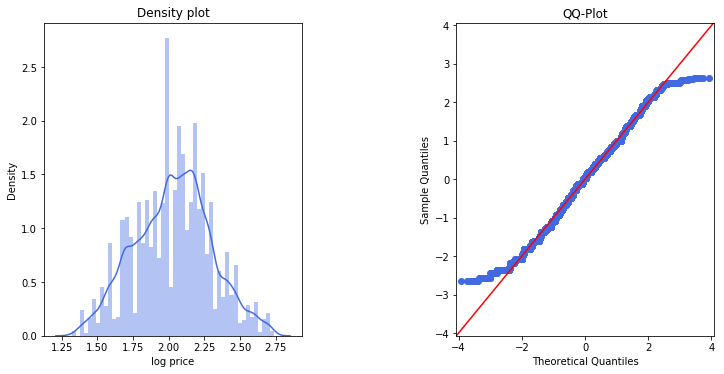

In [169]:
fig, axes = plt.subplots(1, 2, figsize=(12,6))
plt.subplots_adjust(wspace=0.6, top=0.85) 

y = merged_wo_outliers.Air_log_price

# Density plot
sns.distplot(y, ax=axes[0], color=col1)
axes[0].set_title("Density plot")
axes[0].set_ylabel("Density")
axes[0].set_xlabel("log price")

# QQ plot
stdized = (y - np.mean(y)) / np.std(y)
sm.qqplot(stdized, line='45', ax=axes[1], color=col1)
axes[1].set_title("QQ-Plot");

#### Airbnb prices: Size and location

Next, we take a look at the relationship between the log airbnb prices and the aggregated log airbnb prices. 

**Airbnb price and suburbs**

*Summary statistics*

To start we take a look at the mean, median and standard deviations of the log airbnb prices, bedrooms and log prices per bedrooms. Some differences between the suburbs can be observed, irrespective of whether the log price is taken or the log price is divided by the number of bedrooms.

In [170]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_neighbourhood_cleansed']]
tmp['Air_log_price_by_bedroom'] = tmp.Air_log_price / tmp.Air_bedrooms
tmp = tmp.replace([np.inf, -np.inf], np.nan).dropna(how='all')
tmp_agg = tmp.groupby(by='Air_neighbourhood_cleansed').agg(['mean', 'median', np.std, 'count'])
tmp_agg
tmp_agg.sort_values(by=[('Air_log_price_by_bedroom', 'median')])

Air_log_price                            \
                                    mean    median       std count   
Air_neighbourhood_cleansed                                           
bayside                         2.121149  2.113943  0.293879   340   
yarra ranges                    2.250385  2.255273  0.229276   717   
frankston                       2.030197  2.008517  0.290892   172   
maroondah                       1.902195  1.875061  0.303675   115   
whittlesea                      1.804714  1.698970  0.292812   136   
brimbank                        1.775058  1.724276  0.272786   105   
manningham                      2.027857  2.037426  0.283175   295   
banyule                         1.891279  1.875061  0.273019   198   
hume                            1.884764  1.778151  0.335742   167   
wyndham                         1.885300  1.812913  0.303469   421   
maribyrnong                     1.940806  1.949390  0.277978   432   
hobsons bay                     2.018927  2.000000  0.288412   236   
melton                          1.887076  1.851258  0.321886    95   
greater dandenong               1.809842  1.703270  0.274704   142   
knox                            1.898144  1.863323  0.264018   173   
whitehorse                      1.899529  1.903090  0.264791   609   
kingston                        2.009164  2.000000  0.279281   304   
glen eira                       1.961247  1.929389  0.280349   622   
casey                           1.940390  1.875061  0.302238   146   
monash                          1.869782  1.778151  0.288490   557   
darebin                         1.919059  1.903090  0.255561   681   
moreland                        1.907004  1.903090  0.263840   947   
moonee valley                   1.915594  1.897627  0.259950   333   
boroondara                      1.958773  1.949390  0.264298   626   
cardinia                        2.130519  2.176091  0.264310   121   
melbourne                       2.082248  2.096910  0.233782  7210   
port phillip                    2.084399  2.079181  0.241634  2726   
yarra                           2.053429  2.060698  0.248421  2012   
stonnington                     2.056527  2.056905  0.240172  1569   
nillumbik                       2.071006  2.079181  0.209036    87   

                           Air_bedrooms                         \
                                   mean median       std count   
Air_neighbourhood_cleansed                                       
bayside                        1.879412    2.0  1.099820   340   
yarra ranges                   1.782427    1.0  1.202917   717   
frankston                      1.877907    1.0  1.200478   172   
maroondah                      1.695652    1.0  1.069300   115   
whittlesea                     1.522059    1.0  1.074740   136   
brimbank                       1.580952    1.0  1.166693   105   
manningham                     1.745763    1.0  1.172143   295   
banyule                        1.616162    1.0  1.155056   198   
hume                           1.862275    1.0  1.455841   167   
wyndham                        1.859524    1.0  1.365018   420   
maribyrnong                    1.620370    1.0  0.979773   432   
hobsons bay                    1.673729    1.0  1.001864   236   
melton                         1.505263    1.0  1.174858    95   
greater dandenong              1.514085    1.0  1.036469   142   
knox                           1.653179    1.0  1.149294   173   
whitehorse                     1.556650    1.0  0.973578   609   
kingston                       1.766447    1.0  1.138028   304   
glen eira                      1.566828    1.0  0.952481   621   
casey                          1.828767    1.0  1.304420   146   
monash                         1.551167    1.0  1.131460   557   
darebin                        1.462555    1.0  0.823635   681   
moreland                       1.375924    1.0  0.758442   947   
moonee valley                  1.450450    1.0  0.811128   333   


In [171]:
# previously cell 97
pickle.dump(tmp_agg, open("airbnb_price_suburbs.p", "wb"))
tmp_agg = pickle.load(open("airbnb_price_suburbs.p", "rb"))

*Plots*

The relationship are plotted next. We first start by plotting the prices merged according to the room type and and then switch to the property type.

*Room type*

We plot the values of `Air_log_price_suburb_same_room_type` against the log price of the reference objects of the same room type. A positive relationship between `Air_log_price_suburb_same_room_type` and the log price of the reference object is observed.

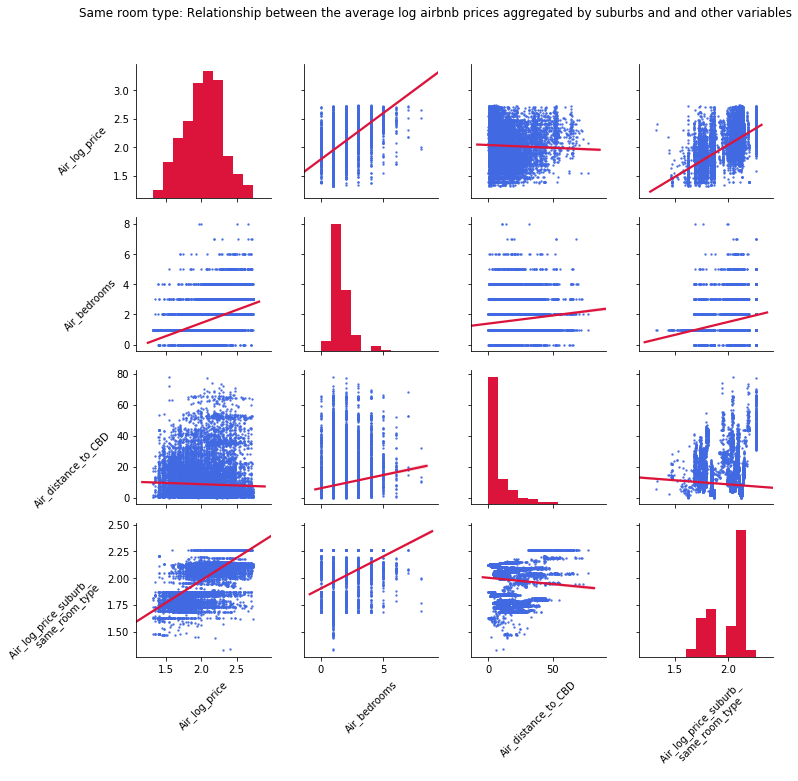

In [172]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_distance_to_CBD', 
                     'Air_log_price_suburb_same_room_type']]
tmp.replace([np.inf, -np.inf], np.nan, inplace=True)
tmp.rename(columns={'Air_log_price_suburb_same_room_type': 'Air_log_price_suburb_ \n same_room_type'},
          inplace=True)
g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})
#g = sns.PairGrid(tmp)
#g.map_diag(sns.kdeplot)
#g.map_offdiag(sns.kdeplot, n_levels=6)
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Same room type: Relationship between the average log airbnb prices aggregated by suburbs and and other variables")
g.fig.subplots_adjust(top=0.9);

A closer look at the relationship between `Air_log_price` and `Air_log_price_suburb_same_room_type` is taken in the next plot.

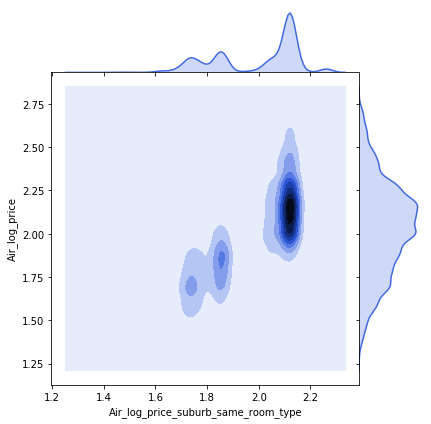

In [173]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_distance_to_CBD', 
                     'Air_log_price_suburb_same_room_type']]
tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='Air_log_price_suburb_same_room_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1);

In [174]:
tmp.dropna().shape # 22280

(22280, 4)

*Property type*

Now, we create the same plots for equal property types. The effect of the variable `Air_log_price_suburb_same_property_type` is smaller than for `Air_log_price_suburb_same_room_type`.

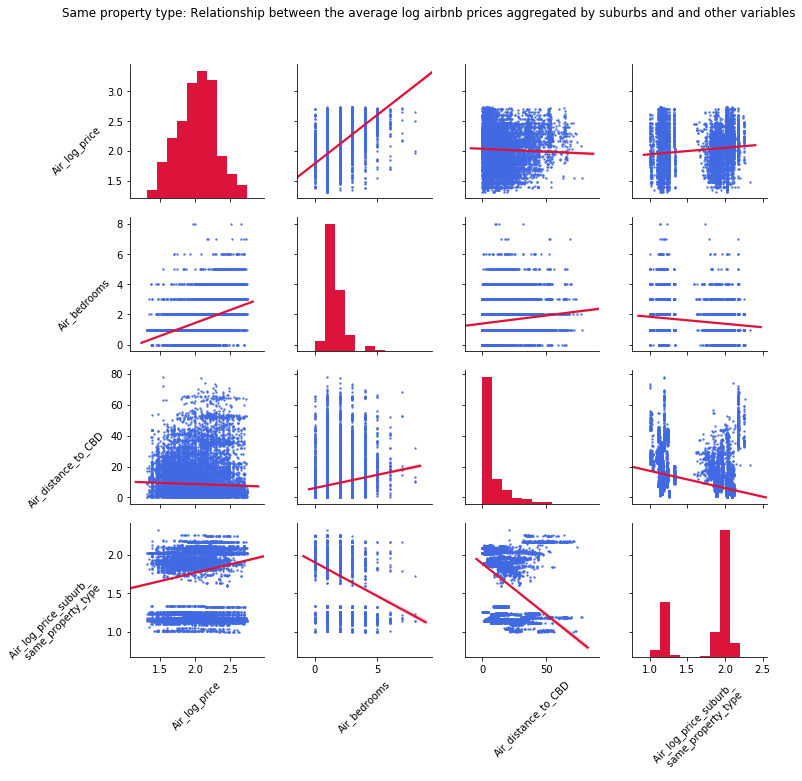

In [175]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_distance_to_CBD', 
                     'Air_log_price_suburb_same_property_type']]
tmp.rename(columns={'Air_log_price_suburb_same_property_type': 'Air_log_price_suburb_ \n same_property_type'},
          inplace=True)
tmp.replace([np.inf, -np.inf], np.nan, inplace=True)
g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})

new_labels = 'Air_log_price Air_bedrooms Air_distance_to_CBD Air_log_price_suburb_ \n same_property_type'

for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Same property type: Relationship between the average log airbnb prices aggregated by suburbs and and other variables")
g.fig.subplots_adjust(top=0.9);

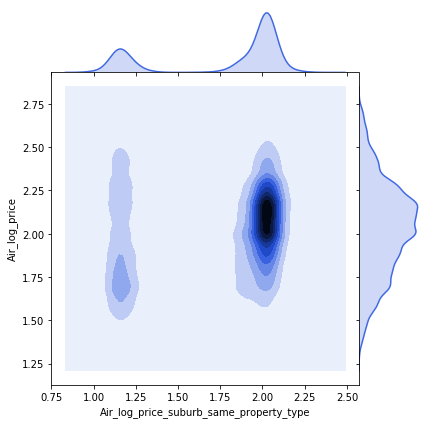

In [176]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_distance_to_CBD', 
                     'Air_log_price_suburb_same_property_type']]
tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='Air_log_price_suburb_same_property_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1);

In [177]:
tmp.dropna().shape # 22286

(22286, 4)

**Airbnb price and constructed airbnb price variables** 

In this section, the constructed airbnb price variables are inspected. Since the effect might be different w.r.t the average distance of the nearest neighbour, we also create buckets related to the distance to the reference observation and analyze the relationships separately. We do this only for the room type.

*Room type*

We start with the room type and create the buckets. Below the distribution of the distance to the nearest neighbour is plotted. The distance is at most 500 meters because the nearest neighbour was selected from the set of observations that are at most 500 meters away from the reference object. In many cases the distance is below 50 meters.

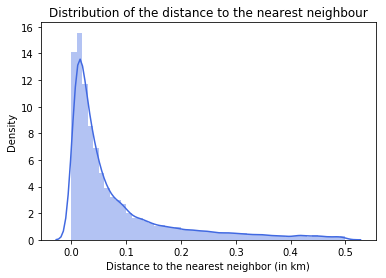

In [178]:
tmp = merged_wo_outliers.loc[:, 'dist_Entire home/apt_nearest']
tmp.shape # (22331, )
tmp.dropna(inplace=True)
tmp.shape # 19948
fig, ax = plt.subplots(1,1)
sns.distplot(tmp, ax=ax, color=col1);
ax.set_title("Distribution of the distance to the nearest neighbour")
ax.set_xlabel("Distance to the nearest neighbor (in km)")
ax.set_ylabel("Density");

Then, we create 3 buckets for the distance and store it in the variable `Air_dist_group` according of the distance of the nearest neighbour. The following groups are defined: 
- Group 1: [0; 0.05]
- Group 2: (0.05; 0.1]
- Group 3: (0.1; 0.5]

In [179]:
merged_wo_outliers['Air_dist_group'] = 1
merged_wo_outliers.loc[merged_wo_outliers['dist_Entire home/apt_nearest'] > 0.05, 'Air_dist_group'] = 2
merged_wo_outliers.loc[merged_wo_outliers['dist_Entire home/apt_nearest'] > 0.1, 'Air_dist_group'] = 3
merged_wo_outliers.loc[pd.isna(merged_wo_outliers['dist_Entire home/apt_nearest']) == True, 'Air_dist_group'] = np.nan

tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_distance_to_CBD', 
                     'Air_log_price_Entire home/apt_nearest',
                    'Air_log_price_Entire home/apt_500m', 'dist_Entire home/apt_nearest']]
tmp.head(5)

,Air_log_price,Air_bedrooms,Air_distance_to_CBD,Air_log_price_Entire home/apt_nearest,Air_log_price_Entire home/apt_500m,dist_Entire home/apt_nearest
0,1.778151,1.0,12.233874,NaN,NaN,NaN
1,1.544068,1.0,5.502899,2.342423,2.100247,0.090376
2,2.201397,1.0,5.238583,2.139879,2.096862,0.009089
3,1.698970,1.0,6.534561,2.146128,2.058340,0.040289
4,1.838849,1.0,6.173667,2.389166,2.066405,0.016198


Now, we inspect how neighbouring log airbnb prices are related to airbnb prices when they are matched by the same room type and check in the subsequent cell whether the effect of `Air_log_price_nearest_same_room_type` depends on the distance to the reference observation.

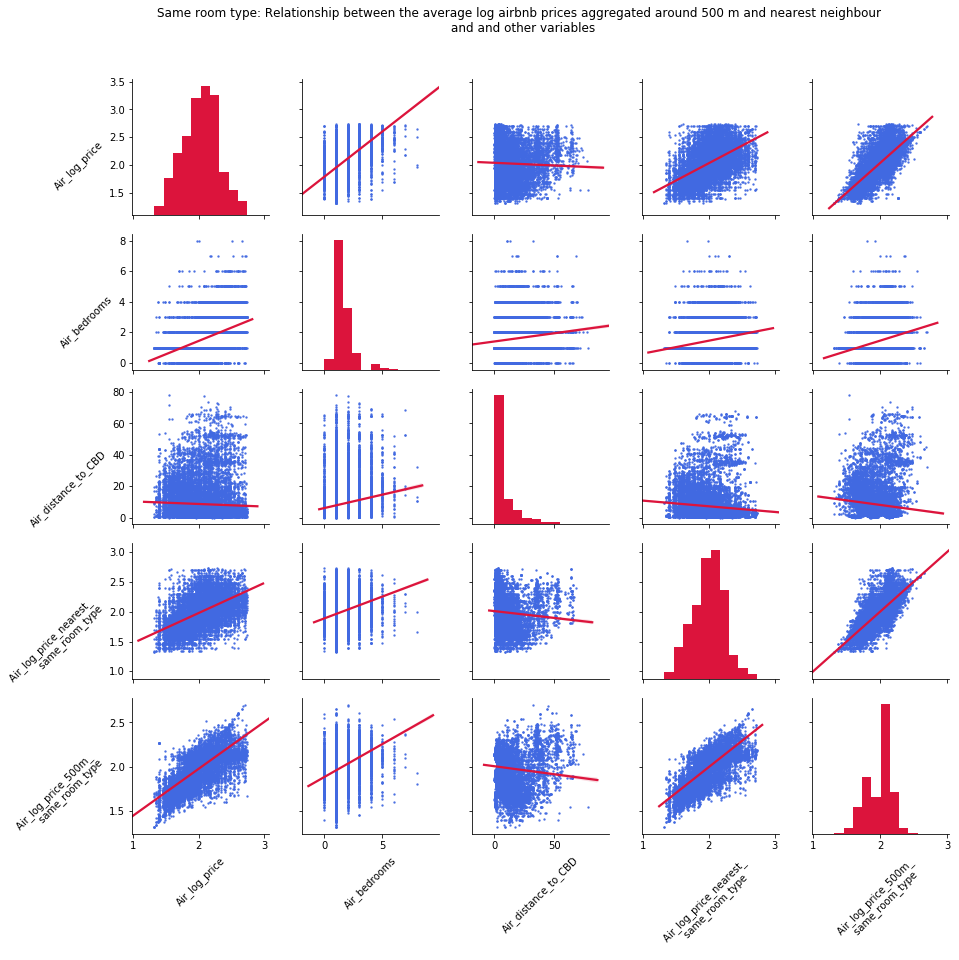

In [180]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_distance_to_CBD', 
                     'Air_log_price_nearest_same_room_type', 'Air_log_price_500m_same_room_type']]

tmp.rename(columns={'Air_log_price_nearest_same_room_type': 'Air_log_price_nearest_ \n same_room_type',
                   'Air_log_price_500m_same_room_type': 'Air_log_price_500m_ \n same_room_type'},
                    inplace=True)
tmp.replace([np.inf, -np.inf], np.nan, inplace=True)
g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Same room type: Relationship between the average log airbnb prices aggregated around 500 m and nearest neighbour \n and and other variables")
g.fig.subplots_adjust(top=0.9);

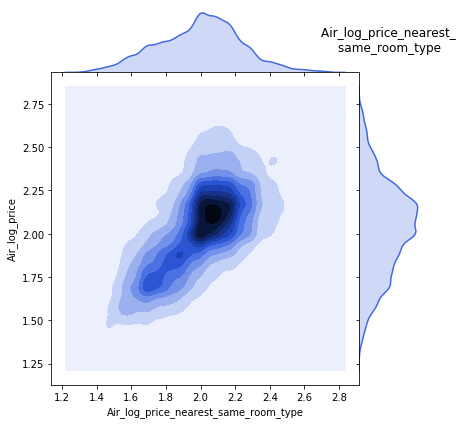

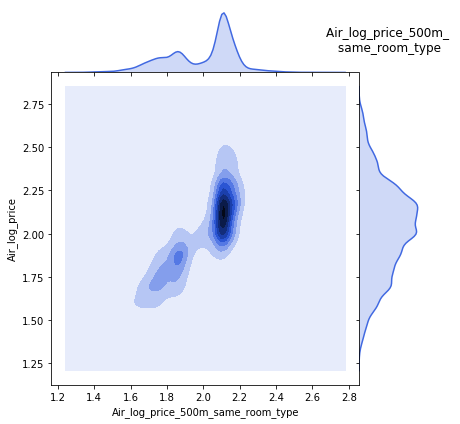

In [181]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_distance_to_CBD', 
                     'Air_log_price_nearest_same_room_type', 'Air_log_price_500m_same_room_type']]

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='Air_log_price_nearest_same_room_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_nearest_ \n same_room_type \n')

sns.jointplot(x='Air_log_price_500m_same_room_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_500m_ \n same_room_type \n');

In [182]:
tmp.dropna().shape # 20669

(20669, 5)

The effect of the nearest airbnb accommodations is not influenced by the distance as the following plots show.

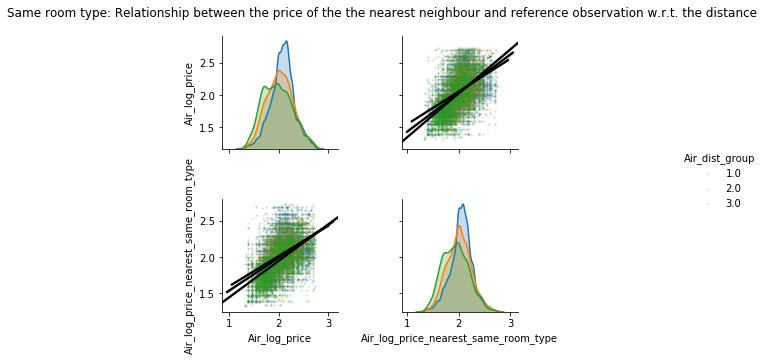

In [183]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_log_price_nearest_same_room_type',
                    'Air_dist_group']]
tmp.replace([np.inf, -np.inf], np.nan, inplace=True)
g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws': {'color':'black'}, 'scatter_kws': {'alpha':0.15, 's': 2}},
            hue='Air_dist_group',
            vars=['Air_log_price', 'Air_log_price_nearest_same_room_type']);
g.fig.suptitle("Same room type: Relationship between the price of the the nearest neighbour and reference observation w.r.t. the distance")
g.fig.subplots_adjust(top=0.9);

The two other variants of the aggregation, i.e. with radius 100 m and 50 m, show a very similar relationship as the plots below show. The pairplots also illustrate that the different price measures are correlated to each other. This was to some extent clear from the beginning on since the information used in the measures is not completely new. However, the alternative measures (i.e. `Air_log_price_50m_same_room_type`, `Air_log_price_100m_same_room_type` and `Air_log_price_500m_same_room_type`) seems to show a stronger effect and a higher correlation.  

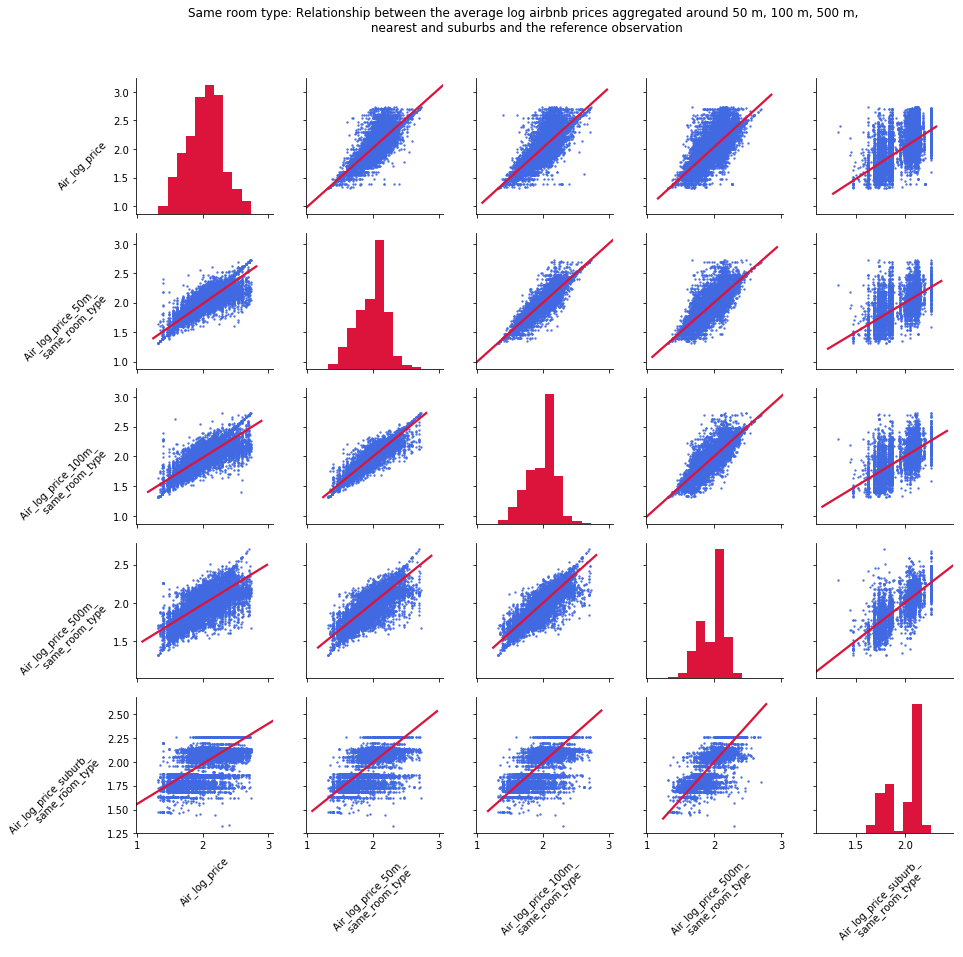

In [184]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                     'Air_log_price_50m_same_room_type',
                     'Air_log_price_100m_same_room_type',
                     'Air_log_price_500m_same_room_type',
                     'Air_log_price_suburb_same_room_type']]

tmp.rename(columns={'Air_log_price_50m_same_room_type': 'Air_log_price_50m_ \n same_room_type',
                    'Air_log_price_100m_same_room_type': 'Air_log_price_100m_ \n same_room_type',
                    'Air_log_price_500m_same_room_type': 'Air_log_price_500m_ \n same_room_type',
                    'Air_log_price_suburb_same_room_type': 'Air_log_price_suburb_ \n same_room_type'},
                    inplace=True)

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})

#https://stackoverflow.com/questions/60843085/how-to-rotate-labels-in-a-seaborn-pairgrid
#p.set_xticklabels(p.get_xticklabels(), rotation=45, horizontalalignment='right')
#p.set_yticklabels(p.get_yticklabels(), rotation=45, horizontalalignment='right')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Same room type: Relationship between the average log airbnb prices aggregated around 50 m, 100 m, 500 m, \n nearest and suburbs and the reference observation")
g.fig.subplots_adjust(top=0.9);

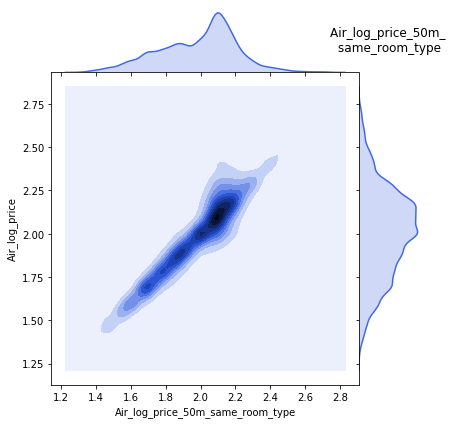

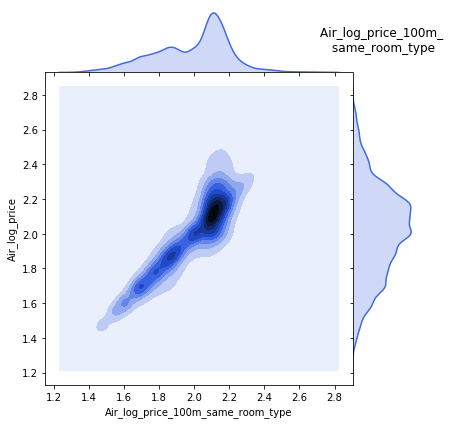

In [185]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                     'Air_log_price_50m_same_room_type',
                     'Air_log_price_100m_same_room_type',
                     'Air_log_price_500m_same_room_type',
                     'Air_log_price_suburb_same_room_type']]

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='Air_log_price_50m_same_room_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_50m_ \n same_room_type \n')

sns.jointplot(x='Air_log_price_100m_same_room_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_100m_ \n same_room_type \n');

In [186]:
tmp.dropna().shape # 19836

(19836, 5)

*Property type*

We take a look at the effects when the property type of the reference observation and the property type of the observations whose prices are aggregated are the same. The effects are weaker than for the same room types (see above).

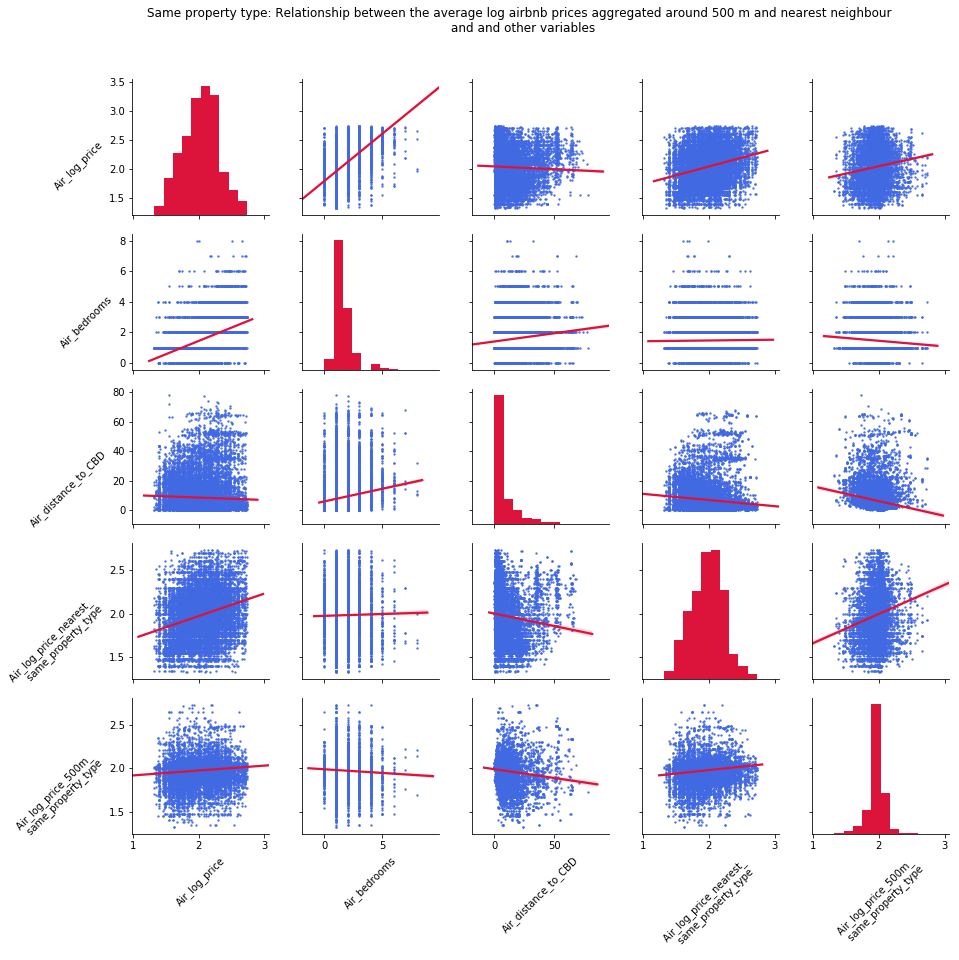

In [187]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_distance_to_CBD', 
                     'Air_log_price_nearest_same_property_type', 'Air_log_price_500m_same_property_type']]

tmp.rename(columns={'Air_log_price_nearest_same_property_type': 'Air_log_price_nearest_ \n same_property_type',
                    'Air_log_price_500m_same_property_type': 'Air_log_price_500m_ \n same_property_type'},
                    inplace=True)

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})

for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Same property type: Relationship between the average log airbnb prices aggregated around 500 m and nearest neighbour \n and and other variables")
g.fig.subplots_adjust(top=0.9);

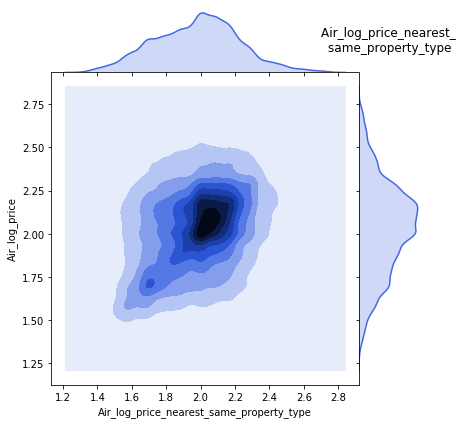

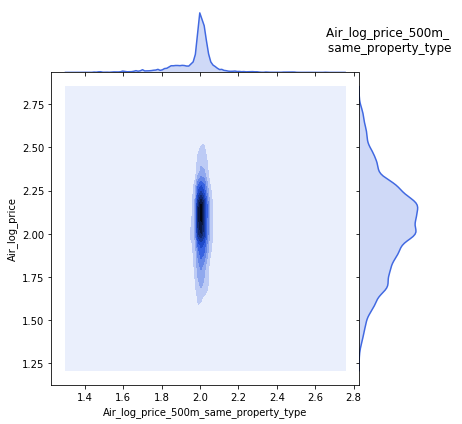

In [188]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price', 'Air_bedrooms', 'Air_distance_to_CBD', 
                     'Air_log_price_nearest_same_property_type', 'Air_log_price_500m_same_property_type']]

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='Air_log_price_nearest_same_property_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_nearest_ \n same_property_type \n')

sns.jointplot(x='Air_log_price_500m_same_property_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_500m_ \n same_property_type \n');

In [189]:
tmp.dropna().shape # 18464

(18464, 5)

In the next pairplot the different types of aggregation `Air_log_price_50m_same_property_type`, `Air_log_price_100m_same_property_type`, `Air_log_price_500m_same_property_type`, `Air_log_price_nearest_same_property_type` and `Air_log_price_suburb_same_property_type` are plotted. As already mentioned, the constructed price measures are positively correlated to the airbnb price of the reference object. However, the effects are less pronounced than in the case of considering prices of the same room type.

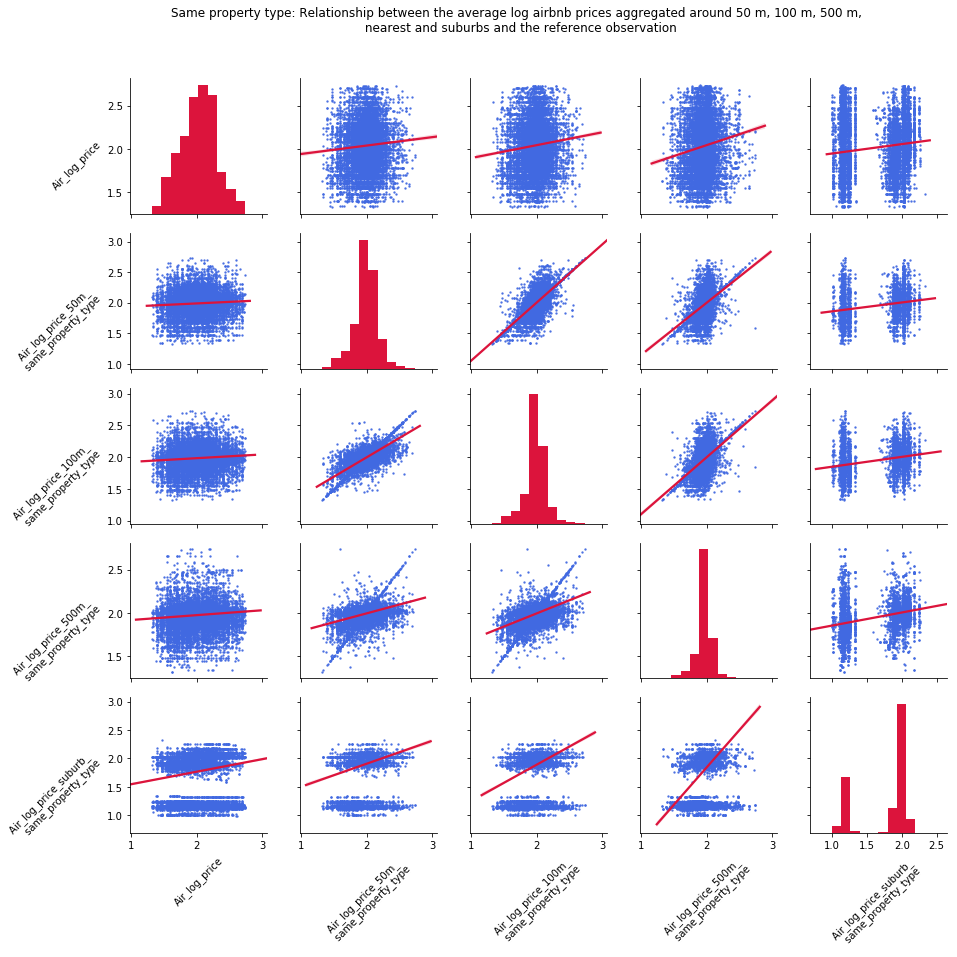

In [190]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                     'Air_log_price_50m_same_property_type',
                     'Air_log_price_100m_same_property_type',
                     'Air_log_price_500m_same_property_type',
                     'Air_log_price_suburb_same_property_type']]

tmp.rename(columns={'Air_log_price_50m_same_property_type': 'Air_log_price_50m_ \n same_property_type',
                    'Air_log_price_100m_same_property_type': 'Air_log_price_100m_ \n same_property_type',
                    'Air_log_price_500m_same_property_type': 'Air_log_price_500m_ \n same_property_type',
                    'Air_log_price_suburb_same_property_type': 'Air_log_price_suburb_ \n same_property_type'},
                    inplace=True)

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})
#https://stackoverflow.com/questions/60843085/how-to-rotate-labels-in-a-seaborn-pairgrid
#p.set_xticklabels(p.get_xticklabels(), rotation=45, horizontalalignment='right')
#p.set_yticklabels(p.get_yticklabels(), rotation=45, horizontalalignment='right')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Same property type: Relationship between the average log airbnb prices aggregated around 50 m, 100 m, 500 m, \n nearest and suburbs and the reference observation")
g.fig.subplots_adjust(top=0.9);

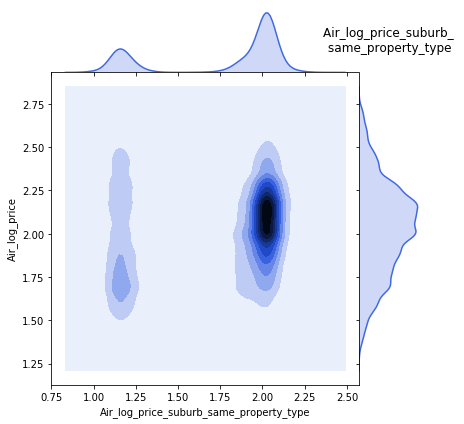

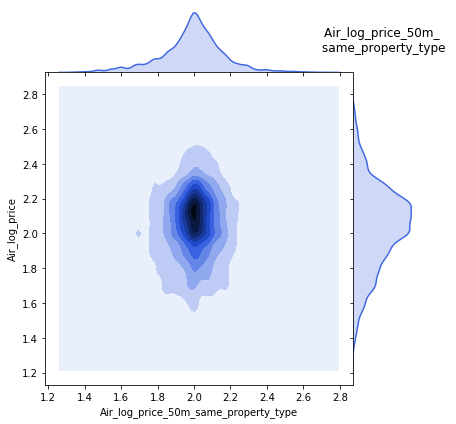

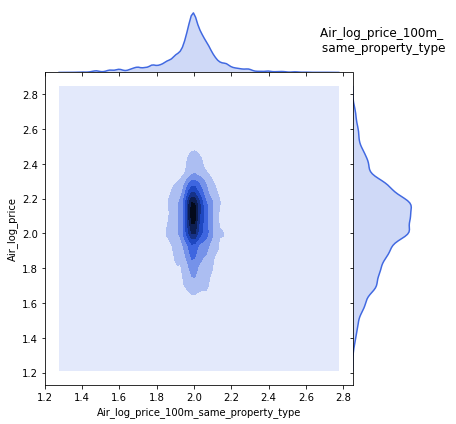

In [191]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                     'Air_log_price_50m_same_property_type',
                     'Air_log_price_100m_same_property_type',
                     'Air_log_price_500m_same_property_type',
                     'Air_log_price_suburb_same_property_type']]

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='Air_log_price_suburb_same_property_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_suburb_ \n same_property_type \n')

sns.jointplot(x='Air_log_price_50m_same_property_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_50m_ \n same_property_type \n')

sns.jointplot(x='Air_log_price_100m_same_property_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_100m_ \n same_property_type \n');

In [192]:
tmp.dropna().shape # 12730

(12730, 5)

#### Airbnb prices and housing market 

From a theoretical point of view it seems reasonable that house prices and airbnb prices are positively correlated because both are the result of a suburb's attractiveness. The house types `h`, `u` and `t` are linked to `House_Cottage_Villa`, `Apartment_Condominium` and `Townhouse`, respectively.

**Aggregation by suburbs**

The first step is to inspect the average house prices aggregated by suburbs. No positive relationship between airbnb prices and housing prices that are aggregated by suburbs can be observed.

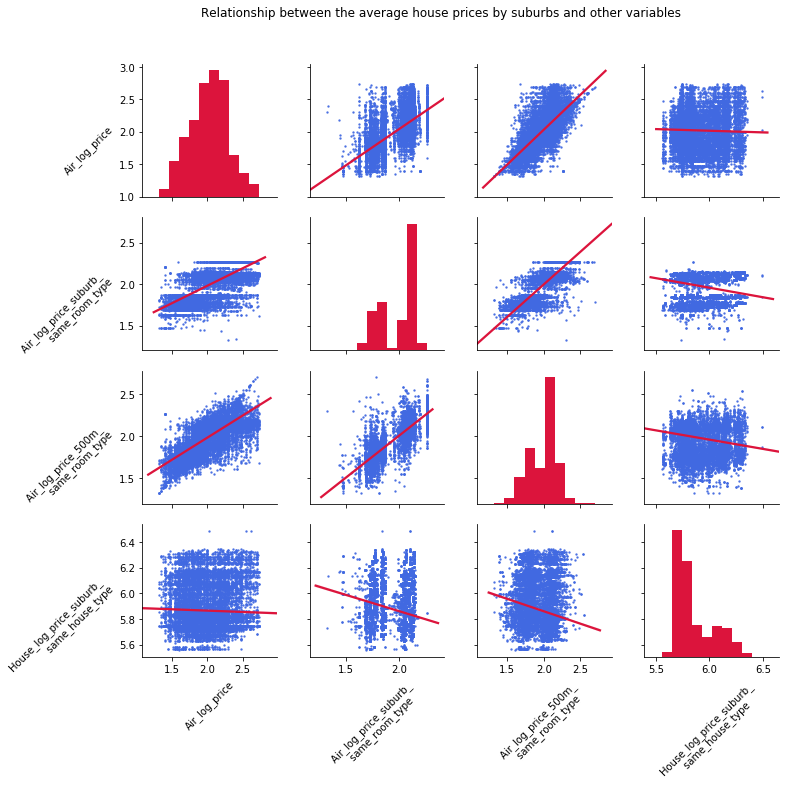

In [193]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                     'Air_log_price_suburb_same_room_type',
                     'Air_log_price_500m_same_room_type',
                     'House_log_price_suburb_same_house_type']]

tmp.rename(columns={'Air_log_price_suburb_same_room_type': 'Air_log_price_suburb_ \n same_room_type',
                    'Air_log_price_500m_same_room_type': 'Air_log_price_500m_ \n same_room_type',
                    'House_log_price_suburb_same_house_type': 'House_log_price_suburb_ \n same_house_type'},
                    inplace=True)

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})
#https://stackoverflow.com/questions/60843085/how-to-rotate-labels-in-a-seaborn-pairgrid
#p.set_xticklabels(p.get_xticklabels(), rotation=45, horizontalalignment='right')
#p.set_yticklabels(p.get_yticklabels(), rotation=45, horizontalalignment='right')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Relationship between the average house prices by suburbs and other variables")
g.fig.subplots_adjust(top=0.9);

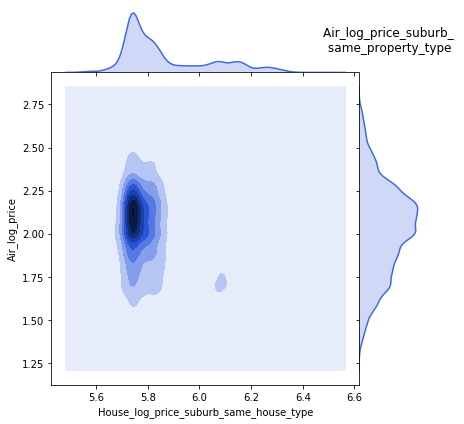

In [194]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                     'Air_log_price_suburb_same_room_type',
                     'Air_log_price_500m_same_room_type',
                     'House_log_price_suburb_same_house_type']]

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='House_log_price_suburb_same_house_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_log_price_suburb_ \n same_property_type \n');

In [195]:
tmp.dropna().shape # 17602

(17602, 4)

**Constructed aggregations**

The variables `House_log_price_500m_same_house_type`, `House_log_price_1km_same_house_type` and `House_log_price_5km_same_house_type` do not show a positive relationship with log airbnb prices. Hence, none of the house price variables tested seem to be a model candidate for predicting airbnb prices.

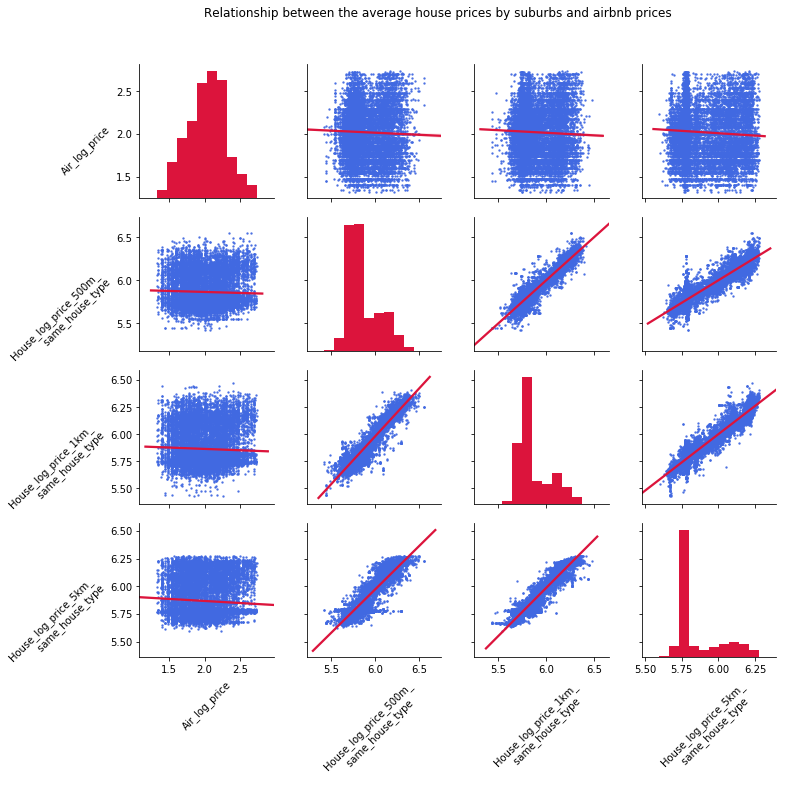

In [196]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                     'House_log_price_500m_same_house_type',
                     'House_log_price_1km_same_house_type',
                     'House_log_price_5km_same_house_type']]

tmp.rename(columns={'House_log_price_500m_same_house_type': 'House_log_price_500m_ \n same_house_type',
                    'House_log_price_1km_same_house_type': 'House_log_price_1km_ \n same_house_type',
                    'House_log_price_5km_same_house_type': 'House_log_price_5km_ \n same_house_type'},
                    inplace=True)

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})

#https://stackoverflow.com/questions/60843085/how-to-rotate-labels-in-a-seaborn-pairgrid
#p.set_xticklabels(p.get_xticklabels(), rotation=45, horizontalalignment='right')
#p.set_yticklabels(p.get_yticklabels(), rotation=45, horizontalalignment='right')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Relationship between the average house prices by suburbs and airbnb prices")
g.fig.subplots_adjust(top=0.9);

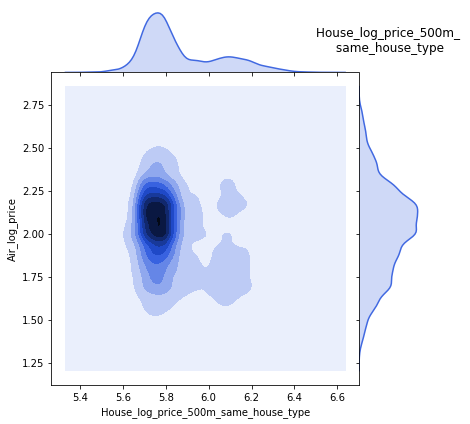

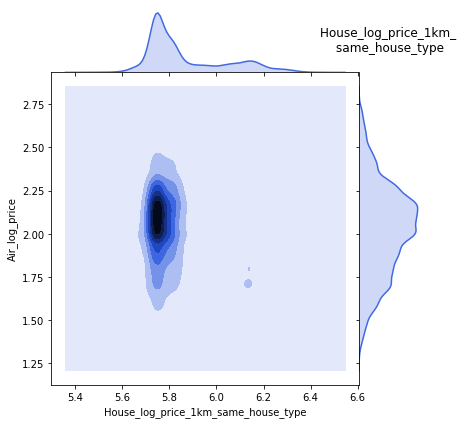

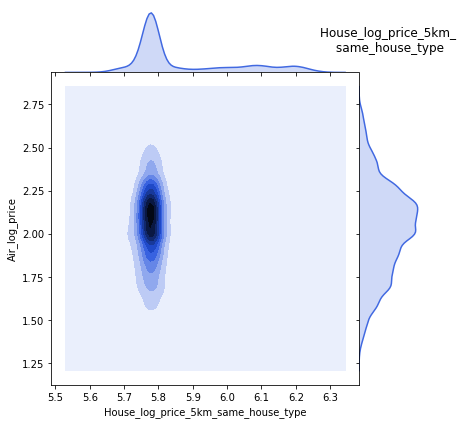

In [197]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                     'House_log_price_500m_same_house_type',
                     'House_log_price_1km_same_house_type',
                     'House_log_price_5km_same_house_type']]

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='House_log_price_500m_same_house_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('House_log_price_500m_ \n same_house_type \n')

sns.jointplot(x='House_log_price_1km_same_house_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('House_log_price_1km_ \n same_house_type \n')

sns.jointplot(x='House_log_price_5km_same_house_type', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('House_log_price_5km_ \n same_house_type \n');

In [198]:
tmp.dropna().shape # 16421

(16421, 4)

#### Crimes

Xu, Kim and Pennington-Gray conclude in their paper that "Airbnb is positively related with property crime and negatively related with violent crime" (p. 9). Hence, it might be interesting to analyze how crime activity is related to the number of competitors and to airbnb prices.

*Airbnb prices*

We first start with the airbnb prices. We observe very weak relationships. For instance, `crimes against the person` is weakly positively and `property and deception offences` is weakly negatively correlated to airbnb prices. The effects are the opposite of what we expected by arguing that high airbnb activity simultaneously results in a high property crime rate and higher prices.

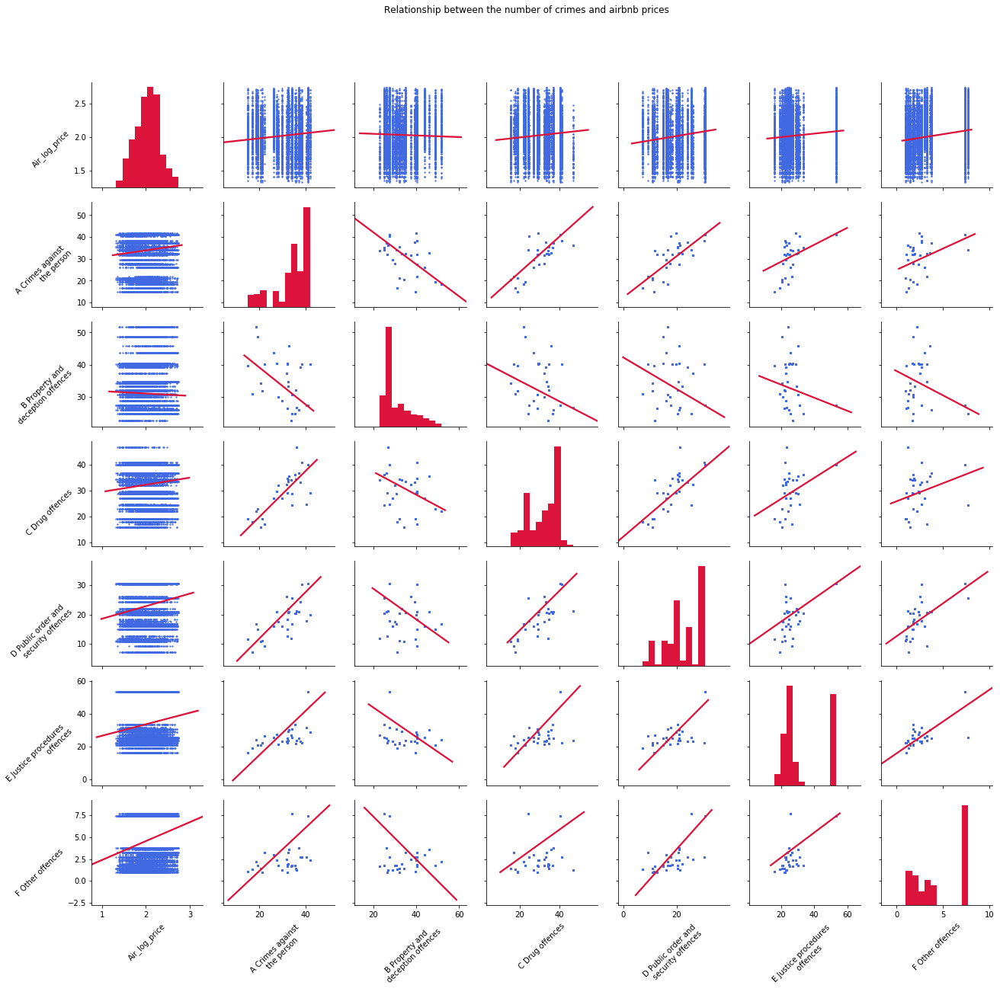

In [199]:
tmp = merged_wo_outliers.loc[:, 
                 ['Air_log_price',
                  'Crime_lga_rate_per_100000_population_A Crimes against the person',
                  'Crime_lga_rate_per_100000_population_B Property and deception offences',
                  'Crime_lga_rate_per_100000_population_C Drug offences',
                  'Crime_lga_rate_per_100000_population_D Public order and security offences',
                  'Crime_lga_rate_per_100000_population_E Justice procedures offences',
                  'Crime_lga_rate_per_100000_population_F Other offences']]

tmp.rename(columns={'Crime_lga_rate_per_100000_population_A Crimes against the person':'A Crimes against \n the person',
                   'Crime_lga_rate_per_100000_population_B Property and deception offences': 'B Property and \n deception offences',
                   'Crime_lga_rate_per_100000_population_C Drug offences': 'C Drug offences',
                   'Crime_lga_rate_per_100000_population_D Public order and security offences': 'D Public order and \n security offences',
                   'Crime_lga_rate_per_100000_population_E Justice procedures offences': 'E Justice procedures \n offences',
                   'Crime_lga_rate_per_100000_population_F Other offences': 'F Other offences'}
           , inplace=True)

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})

#https://stackoverflow.com/questions/60843085/how-to-rotate-labels-in-a-seaborn-pairgrid
#p.set_xticklabels(p.get_xticklabels(), rotation=45, horizontalalignment='right')
#p.set_yticklabels(p.get_yticklabels(), rotation=45, horizontalalignment='right')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Relationship between the number of crimes and airbnb prices")
g.fig.subplots_adjust(top=0.9);

In [200]:
tmp.dropna().shape # 22294

(22294, 7)

*Competition*

Let's assume that airbnb actvity can be measured properly by the number of airbnb accommodations within a given radius. According to the study of Xu, Kim and Pennington-Gray 'crimes against the person' should be low and 'property crimes' should be high, but this does not hold for our dataset as it is shown by the pairplots.

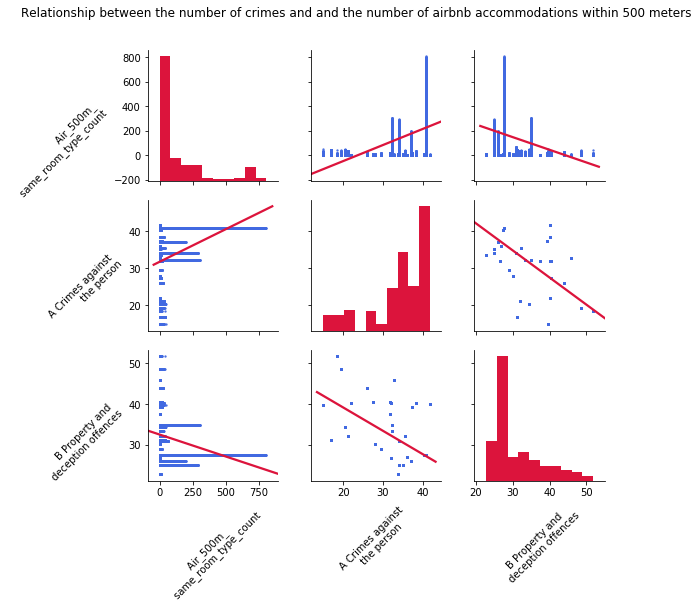

In [201]:
tmp = merged_wo_outliers.loc[:, ['Air_500m_same_room_type_count',
                                 'Crime_lga_rate_per_100000_population_A Crimes against the person',
                                 'Crime_lga_rate_per_100000_population_B Property and deception offences']]

tmp.rename(columns={'Air_500m_same_room_type_count': 'Air_500m_ \n same_room_type_count',
                    'Crime_lga_rate_per_100000_population_A Crimes against the person':'A Crimes against \n the person',
                    'Crime_lga_rate_per_100000_population_B Property and deception offences': 'B Property and \n deception offences'}
           , inplace=True)

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})

#https://stackoverflow.com/questions/60843085/how-to-rotate-labels-in-a-seaborn-pairgrid
#p.set_xticklabels(p.get_xticklabels(), rotation=45, horizontalalignment='right')
#p.set_yticklabels(p.get_yticklabels(), rotation=45, horizontalalignment='right')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Relationship between the number of crimes and and the number of airbnb accommodations within 500 meters")
g.fig.subplots_adjust(top=0.9);

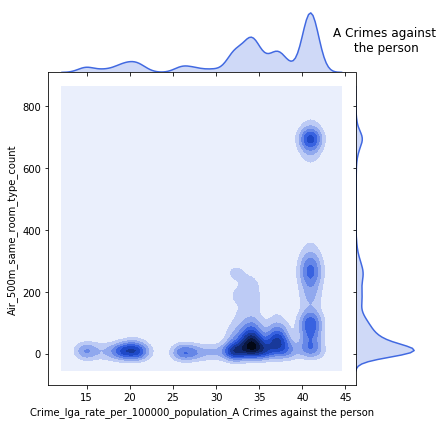

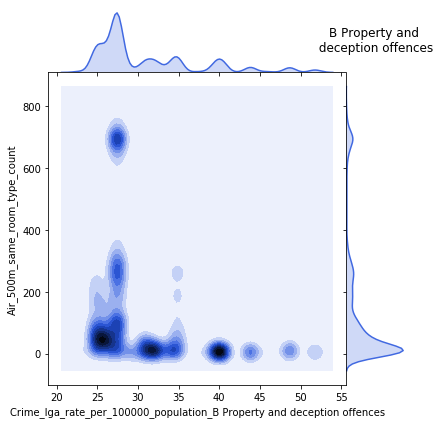

In [202]:
tmp = merged_wo_outliers.loc[:, ['Air_500m_same_room_type_count',
                                 'Crime_lga_rate_per_100000_population_A Crimes against the person',
                                 'Crime_lga_rate_per_100000_population_B Property and deception offences']]

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='Crime_lga_rate_per_100000_population_A Crimes against the person', y='Air_500m_same_room_type_count', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('A Crimes against \n the person \n')

sns.jointplot(x='Crime_lga_rate_per_100000_population_B Property and deception offences', y='Air_500m_same_room_type_count', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('B Property and \n deception offences \n');

In [203]:
tmp.dropna().shape # 21658

(21658, 3)

#### Airbnb prices and competition

Airbnb competition might affect the prices for accommodations. The plots are shown below. No clear relationship can be observed.

*Room type*

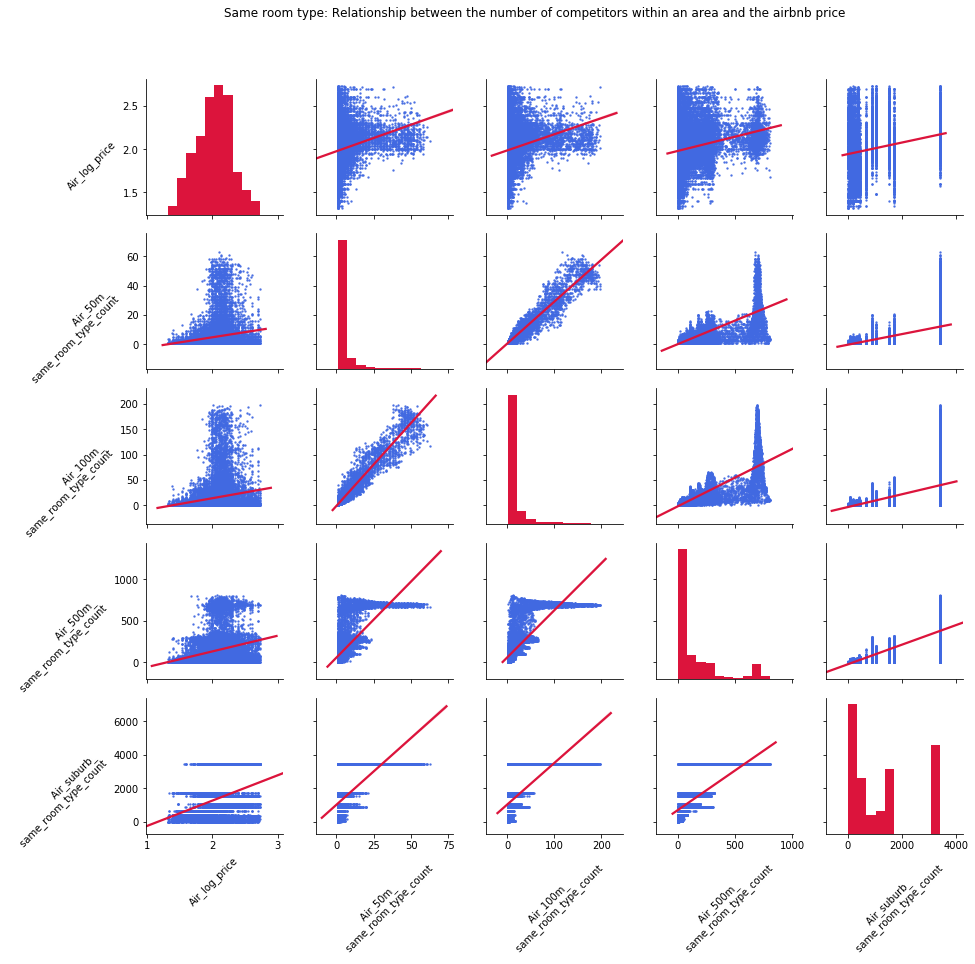

In [204]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                                 'Air_50m_same_room_type_count',
                                 'Air_100m_same_room_type_count',
                                 'Air_500m_same_room_type_count',
                                 'Air_suburb_same_room_type_count']]

tmp.rename(columns={'Air_50m_same_room_type_count': 'Air_50m_ \n same_room_type_count',
                    'Air_100m_same_room_type_count': 'Air_100m_ \n same_room_type_count',
                    'Air_500m_same_room_type_count': 'Air_500m_ \n same_room_type_count',
                    'Air_suburb_same_room_type_count': 'Air_suburb_ \n same_room_type_count'},
                    inplace=True)

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})

#https://stackoverflow.com/questions/60843085/how-to-rotate-labels-in-a-seaborn-pairgrid
#p.set_xticklabels(p.get_xticklabels(), rotation=45, horizontalalignment='right')
#p.set_yticklabels(p.get_yticklabels(), rotation=45, horizontalalignment='right')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Same room type: Relationship between the number of competitors within an area and the airbnb price")
g.fig.subplots_adjust(top=0.9);

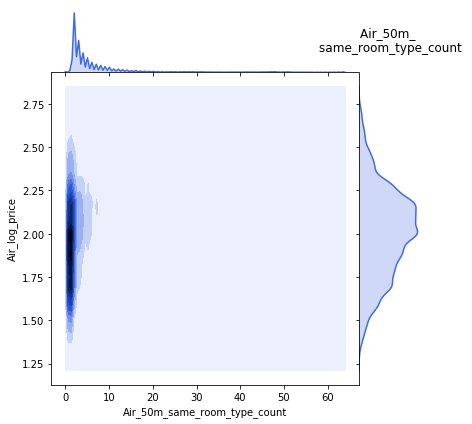

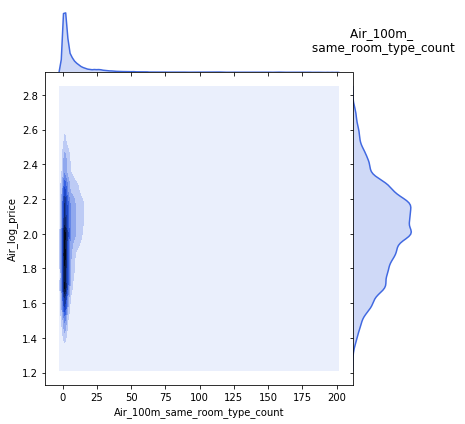

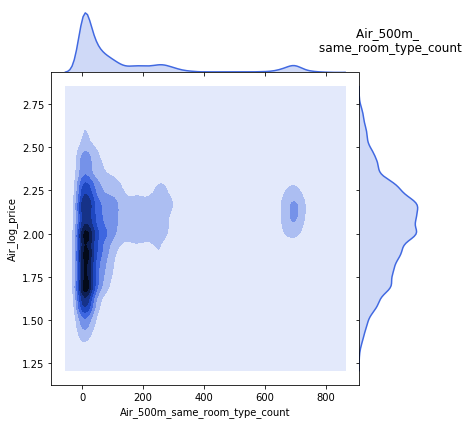

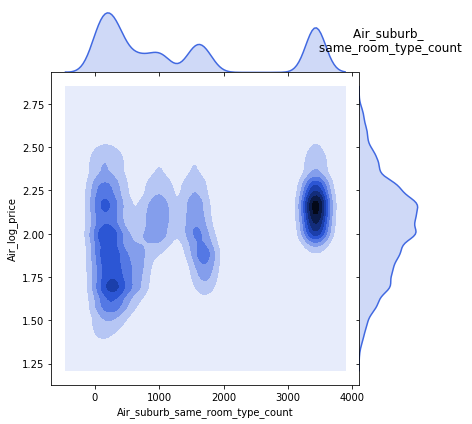

In [205]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                                 'Air_50m_same_room_type_count',
                                 'Air_100m_same_room_type_count',
                                 'Air_500m_same_room_type_count',
                                 'Air_suburb_same_room_type_count']]

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='Air_50m_same_room_type_count', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_50m_ \n same_room_type_count \n')

sns.jointplot(x='Air_100m_same_room_type_count', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_100m_ \n same_room_type_count \n')

sns.jointplot(x='Air_500m_same_room_type_count', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_500m_ \n same_room_type_count \n')

sns.jointplot(x='Air_suburb_same_room_type_count', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_suburb_ \n same_room_type_count \n');

In [206]:
tmp.dropna().shape # 19842

(19842, 5)

*Property type*

The same holds when the aggregated airbnb prices are matched by the same property. However, the effect is even less pronounced in this case.

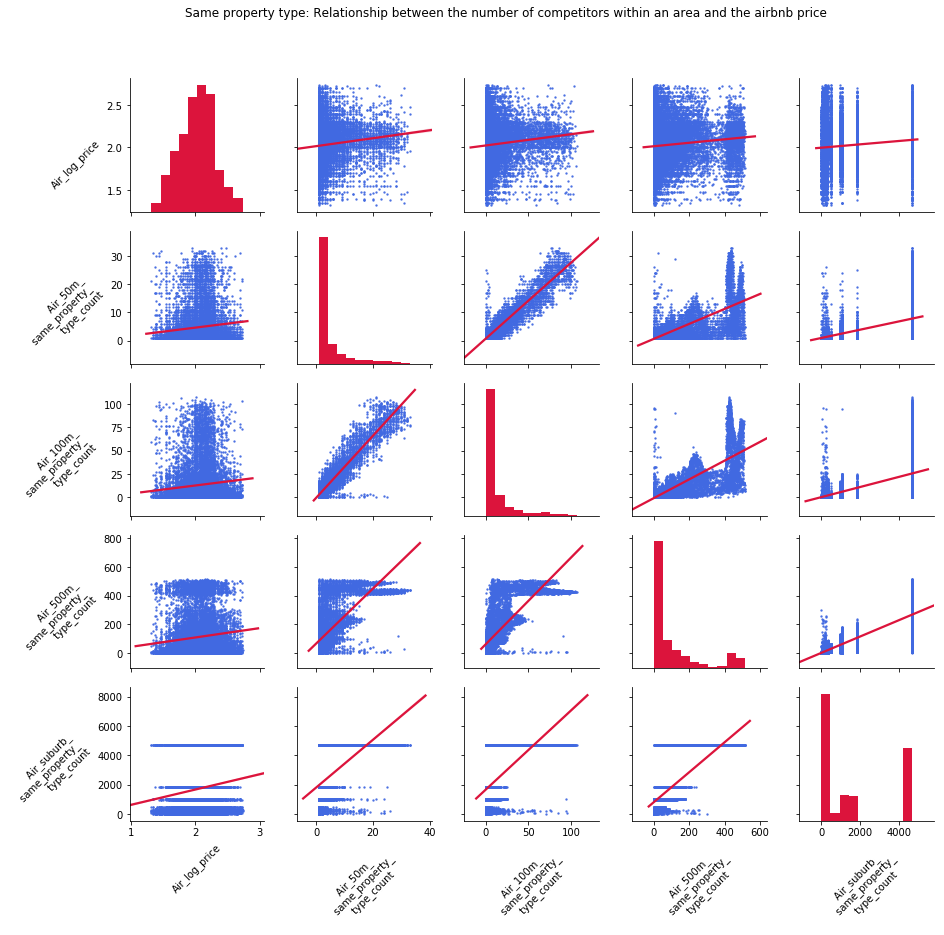

In [207]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                     'Air_50m_same_property_type_count',
                     'Air_100m_same_property_type_count',
                     'Air_500m_same_property_type_count',
                     'Air_suburb_same_property_type_count']]

tmp.rename(columns={'Air_50m_same_property_type_count': 'Air_50m_ \n same_property_ \n type_count',
                    'Air_100m_same_property_type_count': 'Air_100m_ \n same_property_ \n type_count',
                    'Air_500m_same_property_type_count': 'Air_500m_ \n same_property_ \n type_count',
                    'Air_suburb_same_property_type_count': 'Air_suburb_ \n same_property_ \n type_count'},
                    inplace=True)

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

g = sns.pairplot(tmp, kind="reg", plot_kws={'line_kws':{'color':col2}, 'scatter_kws': {'color': col1, 's': 2}},
    diag_kws = {'color': col2})

#https://stackoverflow.com/questions/60843085/how-to-rotate-labels-in-a-seaborn-pairgrid
#p.set_xticklabels(p.get_xticklabels(), rotation=45, horizontalalignment='right')
#p.set_yticklabels(p.get_yticklabels(), rotation=45, horizontalalignment='right')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 45)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 45)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
g.fig.suptitle("Same property type: Relationship between the number of competitors within an area and the airbnb price")
g.fig.subplots_adjust(top=0.9);

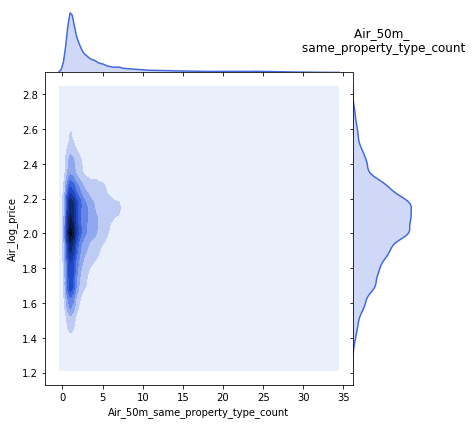

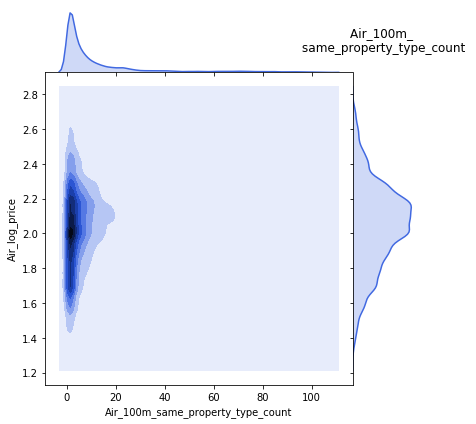

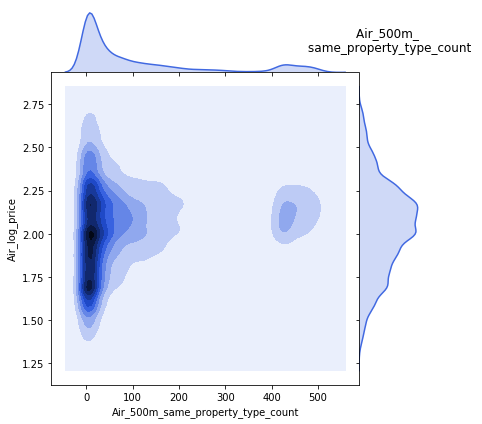

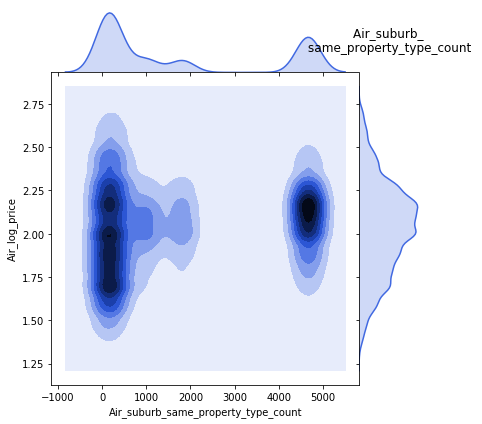

In [208]:
tmp = merged_wo_outliers.loc[:, ['Air_log_price',
                                 'Air_50m_same_property_type_count',
                                 'Air_100m_same_property_type_count',
                                 'Air_500m_same_property_type_count',
                                 'Air_suburb_same_property_type_count']]

tmp.replace([np.inf, -np.inf], np.nan, inplace=True)

sns.jointplot(x='Air_50m_same_property_type_count', y='Air_log_price', 
              data=tmp, kind="kde", 
              space=0, color=col1)
plt.title('Air_50m_ \n same_property_type_count \n')

sns.jointplot(x='Air_100m_same_property_type_count', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_100m_ \n same_property_type_count \n')

sns.jointplot(x='Air_500m_same_property_type_count', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_500m_ \n same_property_type_count \n')

sns.jointplot(x='Air_suburb_same_property_type_count', y='Air_log_price', 
              data=tmp, kind="kde",
              space=0, color=col1)
plt.title('Air_suburb_ \n same_property_type_count \n');

#### Variables

Now, we focus on the 35 variables (inclusive the target variable) with the lowest number of missing values. The variables are stored in `airbnb_vars`.

In [209]:
tmp = pd.DataFrame({'obs': airbnb_sorted_non_missing})
tmp.reset_index(level=0, inplace=True)
tmp.rename(columns={'index': 'variable'}, inplace=True)
airbnb_vars = tmp.loc[range(35), :].variable
airbnb_vars

0                                Air_price
1                      Air_availability_30
2                      Air_availability_60
3                      Air_availability_90
4                     Air_availability_365
5        Air_require_guest_profile_picture
6       Air_calculated_host_listings_count
7                               Air_street
8               Air_neighbourhood_cleansed
9                       Air_smart_location
10                   Air_is_location_exact
11                       Air_property_type
12                           Air_room_type
13                            Air_bed_type
14                    Air_instant_bookable
15                 Air_cancellation_policy
16                      Air_maximum_nights
17                      Air_minimum_nights
18                   Air_number_of_reviews
19    Air_require_guest_phone_verification
20                     Air_guests_included
21               Air_calendar_last_scraped
22                        Air_extra_people
23         

##### Categorical variables

Some of the 35 variables are categorical.

In [210]:
s = ['Air_' + el for el in ['host_is_superhost', 'host_neighbourhood', 'host_has_profile_pic', 
                      'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 
                      'city', 'state', 'zipcode', 'smart_location', 'is_location_exact', 'property_type', 
                      'room_type', 'bed_type', 'instant_bookable', 'cancellation_policy', 
                      'require_guest_profile_picture', 'require_guest_phone_verification']]
s = set(s)
airbnb_cat_vars = set(airbnb_vars).intersection(s)
airbnb_cat_vars

{'Air_bed_type',
 'Air_cancellation_policy',
 'Air_host_has_profile_pic',
 'Air_host_identity_verified',
 'Air_host_is_superhost',
 'Air_instant_bookable',
 'Air_is_location_exact',
 'Air_neighbourhood_cleansed',
 'Air_property_type',
 'Air_require_guest_phone_verification',
 'Air_require_guest_profile_picture',
 'Air_room_type',
 'Air_smart_location',
 'Air_street'}

In [211]:
merged_cat_target = merged_wo_outliers.loc[:, ['Air_log_price'] + list(airbnb_cat_vars)]
merged_cat_target.head(5)

,Air_log_price,Air_require_guest_phone_verification,Air_instant_bookable,Air_bed_type,Air_smart_location,Air_neighbourhood_cleansed,Air_require_guest_profile_picture,Air_host_has_profile_pic,Air_property_type,Air_room_type,Air_is_location_exact,Air_host_is_superhost,Air_street,Air_cancellation_policy,Air_host_identity_verified
0,1.778151,f,f,Real Bed,"Bulleen, Australia",manningham,f,f,House,Private room,f,f,"Bulleen, VIC, Australia",strict_14_with_grace_period,f
1,1.544068,t,t,Futon,"Brunswick East, Australia",moreland,t,t,Apartment,Private room,t,f,"Brunswick East, VIC, Australia",moderate,t
2,2.201397,f,f,Real Bed,"St Kilda, Australia",port phillip,f,t,Apartment,Entire home/apt,t,t,"St Kilda, VIC, Australia",strict_14_with_grace_period,t
3,1.698970,f,f,Real Bed,"Thornbury, Australia",darebin,f,t,House,Private room,t,f,"Thornbury, VIC, Australia",moderate,t
4,1.838849,f,f,Real Bed,"St Kilda East, Australia",port phillip,f,t,House,Private room,t,f,"St Kilda East, VIC, Australia",moderate,t


The variables `Air_smart_location` and `Air_street` are excluded for now because they have a lot of different values, which is a problem for the plotting.

In [212]:
airbnb_cat_vars.remove('Air_smart_location') # too many values
airbnb_cat_vars.remove('Air_street') # too many values

Next, we create boxplots to see whether some values of the variables coincide show higher log airbnb prices. Differences can be observed for the variables `Air_cancellation_policy`, `Air_bed_type`, `Air_neighbourhood_cleansed`, `Air_property_type` and `Air_room_type`. The variables `Air_neighbourhood_cleansed`, `Air_property_type` and `Air_room_type` were already part of the analyses of the aggregated airbnb prices. 

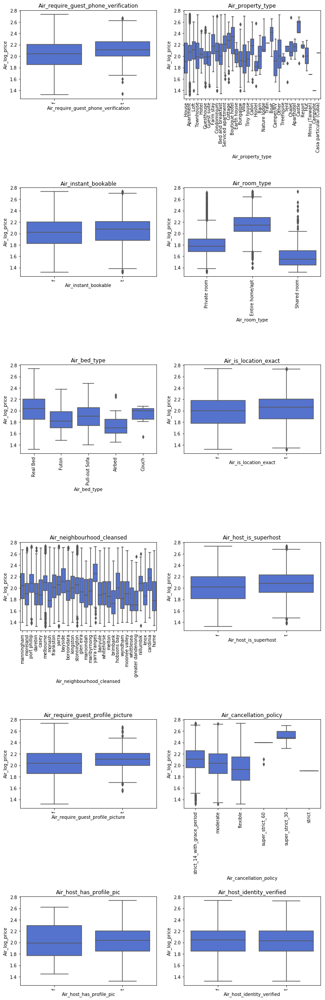

In [213]:
fig, axes = plt.subplots(6, 2, figsize=(12, 40))

fig.subplots_adjust(hspace=1)

n = int(np.ceil(len(airbnb_cat_vars)/2))

for i,v in enumerate(airbnb_cat_vars):
    if i <= n-1:
        ax = sns.boxplot(y='Air_log_price', x=v, data=merged_cat_target, ax=axes[i,0], color=col1)
        ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
        ax.set_title(v)
    else:
        i = i - n
        ax = sns.boxplot(y='Air_log_price', x=v, data=merged_cat_target, ax=axes[i,1], color=col1)
        ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
        ax.set_title(v)

To finish, we take a look at the number of observations that the different categories have. We see that for some values the number of observations is very small, which lowers the predictive power of these variables.

In [214]:
for v in ['Air_cancellation_policy', 'Air_bed_type', 'Air_neighbourhood_cleansed', 'Air_property_type',
         'Air_room_type']:
    print(merged_wo_outliers[v].value_counts())
    print('')

strict_14_with_grace_period    8957
flexible                       7444
moderate                       5854
super_strict_30                  28
super_strict_60                  10
strict                            1
Name: Air_cancellation_policy, dtype: int64

Real Bed         22132
Pull-out Sofa       68
Futon               68
Airbed              17
Couch                9
Name: Air_bed_type, dtype: int64

melbourne            7210
port phillip         2726
yarra                2012
stonnington          1569
moreland              947
yarra ranges          717
darebin               681
boroondara            626
glen eira             622
whitehorse            609
monash                557
maribyrnong           432
wyndham               421
bayside               340
moonee valley         333
kingston              304
manningham            295
hobsons bay           236
banyule               198
knox                  173
frankston             172
hume                  167
casey             

##### Continuous variables

Next, we inspect the continuous variables.

In [215]:
s = ['Air_' + el for el in ['price', 'weekly_price', 'monthly_price', 'security_deposit',
                 'cleaning_fee', 'extra_people',
                 'last_scraped', 'calendar_last_scraped', 'first_review', 
                 'last_review',
                 'host_response_rate', 
                 'host_listings_count', 'host_total_listings_count',
                 'latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms',
                 'beds', 'square_feet', 'guests_included', 'minimum_nights', 
                 'maximum_nights', 'availability_30', 'availability_60',
                 'availability_90', 'availability_365', 'number_of_reviews',
                 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
                 'review_scores_checkin', 'review_scores_communication', 
                 'review_scores_location', 'review_scores_value', 'calculated_host_listings_count',
                 'reviews_per_month']]
s = set(s)
airbnb_cont_vars = set(airbnb_vars).intersection(s)
airbnb_cont_vars

{'Air_accommodates',
 'Air_availability_30',
 'Air_availability_365',
 'Air_availability_60',
 'Air_availability_90',
 'Air_bathrooms',
 'Air_bedrooms',
 'Air_beds',
 'Air_calculated_host_listings_count',
 'Air_calendar_last_scraped',
 'Air_extra_people',
 'Air_guests_included',
 'Air_host_listings_count',
 'Air_host_total_listings_count',
 'Air_last_scraped',
 'Air_latitude',
 'Air_longitude',
 'Air_maximum_nights',
 'Air_minimum_nights',
 'Air_number_of_reviews',
 'Air_price'}

We remove some variables that are not informative. Noninformative variables are `Air_calendar_last_scraped`, `Air_last_scraped`, `Air_latitude` and `Air_longitude`. The variable `Air_price` is also excluded because the `Air_log_price` is the target variable in this project.

In [216]:
airbnb_cont_vars.remove('Air_calendar_last_scraped') # Either 2018-12-07 or 2018-12-08
airbnb_cont_vars.remove('Air_last_scraped') # Either 2018-12-07 or 2018-12-08
airbnb_cont_vars.remove('Air_latitude')
airbnb_cont_vars.remove('Air_longitude')
airbnb_cont_vars.remove('Air_price')

In [217]:
merged_cont_target = merged_wo_outliers.loc[:, ['Air_log_price'] + list(airbnb_cont_vars)]
merged_cont_target.head(5)

,Air_log_price,Air_minimum_nights,Air_calculated_host_listings_count,Air_extra_people,Air_availability_30,Air_availability_60,Air_bathrooms,Air_availability_90,Air_guests_included,Air_accommodates,Air_availability_365,Air_host_listings_count,Air_maximum_nights,Air_number_of_reviews,Air_host_total_listings_count,Air_beds,Air_bedrooms
0,1.778151,1.0,1.0,22.0,30.0,60.0,1.0,90.0,1.0,2.0,365.0,1.0,365.0,4.0,1.0,2.0,1.0
1,1.544068,3.0,1.0,15.0,4.0,9.0,1.0,33.0,1.0,2.0,213.0,1.0,45.0,108.0,1.0,1.0,1.0
2,2.201397,3.0,17.0,28.0,10.0,26.0,1.0,51.0,2.0,3.0,326.0,17.0,28.0,15.0,17.0,2.0,1.0
3,1.698970,2.0,3.0,20.0,0.0,0.0,1.5,0.0,1.0,1.0,0.0,3.0,200.0,29.0,3.0,1.0,1.0
4,1.838849,1.0,1.0,20.0,2.0,30.0,1.0,60.0,1.0,2.0,328.0,1.0,90.0,63.0,1.0,2.0,1.0


The continuous variables are inspected in the next cell. The effects are rather weak but in many cases the effects are reasonable. Plausible effects are for expample the positive relationship between the airbnb log price and the follwing variables:
- `Air_calculated_host_listings_count`
- `Air_host_total_listings_count`
- `Air_host_listings_count`
- `Air_extra_people`
- `Air_guests_included`
- `Air_bathrooms`
- `Air_beds`
- `Air_bedrooms`
- `Air_accommodates`

It makes perfectly sense that better rated apartments or apartments with more beds or bedrooms cost more than smaller and downrated ones. The pairplots are shown below.

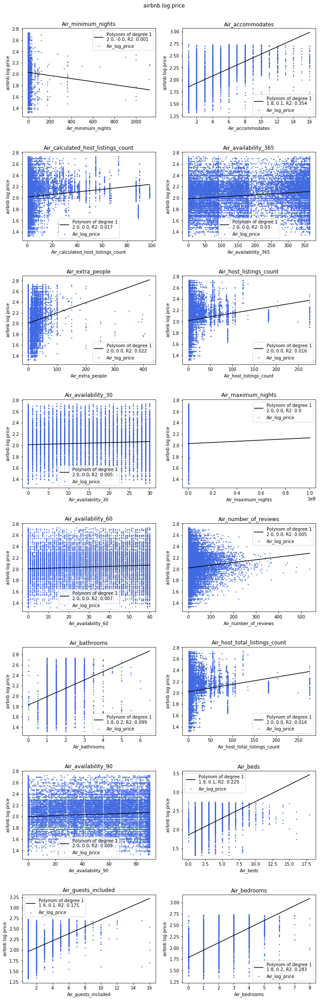

In [218]:
fig, axes = plt.subplots(8, 2, figsize=(12, 40))

fig.subplots_adjust(hspace=0.4)
fig.suptitle("airbnb log price", y=0.9)

n = int(np.ceil(len(airbnb_cont_vars)/2))
deg1 = 1
#deg2 = 3

for i,v in enumerate(airbnb_cont_vars):
    
    y = merged_cont_target.loc[:, 'Air_log_price']
    x = merged_cont_target.loc[:, v]

    res1 = polynomial(x, y, deg1)
    #res2 = polynomial(y, x, deg2)
    
    if i <= n-1:
        j = 0
        
    else:
        i = i - n
        j = 1
        
    axes[i,j].scatter(x,y, color=col1, s=2)
    axes[i,j].plot(res1['data'].x_1, res1['data'].y_pred, color="black", label="Polynom of degree " + str(deg1) + 
                    '\n' + res1['coef'] + ', R2: ' + str(round(res1['r2'], 3)))
    #axes[i,j].plot(res2['data'].x_1, res2['data'].y_pred, color="black", label="Polynom of degree " + str(deg2) + 
    #                '\n' + res2['coef'] + ', R2: ' + str(round(res2['r2'], 3)), linestyle='--')
    axes[i,j].set_ylabel("airbnb log price")
    axes[i,j].set_xlabel(v)
    axes[i,j].set_title(v)
    axes[i,j].legend()

#### Additional variables

Without reducing the size of the dataset too much the following variables can also be part of the model to predict airbnb prices:

- Air_reviews_per_month                   
- Air_cleaning_fee
- Air_security_deposit
- Air_review_scores_rating                
- Air_review_scores_cleanliness            
- Air_review_scores_communication          
- Air_review_scores_accuracy               
- Air_review_scores_location               
- Air_review_scores_checkin                
- Air_review_scores_value                                      
- Air_host_response_rate                  

`Air_review_scores_rating` is a summary of `Air_review_scores_cleanliness`, `Air_review_scores_communication`, `Air_review_scores_accuracy`, `Air_review_scores_location`, `Air_review_scores_checkin` or `Air_review_scores_value`.

Let's take a look at these variables.

In [219]:
add_vars = ['Air_reviews_per_month', 'Air_cleaning_fee', 'Air_security_deposit', 'Air_review_scores_rating',
           'Air_review_scores_cleanliness', 'Air_review_scores_communication', 'Air_review_scores_accuracy',
           'Air_review_scores_location', 'Air_review_scores_checkin', 'Air_review_scores_value',
           'Air_host_response_rate']

merged_add_vars_target = merged_wo_outliers.loc[:, ['Air_log_price'] + list(add_vars)]
merged_add_vars_target.head(5)

,Air_log_price,Air_reviews_per_month,Air_cleaning_fee,Air_security_deposit,Air_review_scores_rating,Air_review_scores_cleanliness,Air_review_scores_communication,Air_review_scores_accuracy,Air_review_scores_location,Air_review_scores_checkin,Air_review_scores_value,Air_host_response_rate
0,1.778151,0.04,NaN,NaN,90.0,10.0,10.0,9.0,9.0,10.0,9.0,0.0
1,1.544068,1.50,9.0,0.0,87.0,8.0,9.0,9.0,9.0,9.0,9.0,NaN
2,2.201397,0.15,100.0,450.0,94.0,10.0,9.0,9.0,9.0,9.0,9.0,100.0
3,1.698970,0.30,15.0,200.0,94.0,9.0,10.0,9.0,9.0,10.0,9.0,NaN
4,1.838849,0.74,15.0,NaN,90.0,9.0,10.0,9.0,10.0,10.0,9.0,100.0


From the plots below we see that especially `Air_cleaning_fee` and to some extent `Air_review_scores_location` are informative. The other variables are not informative.

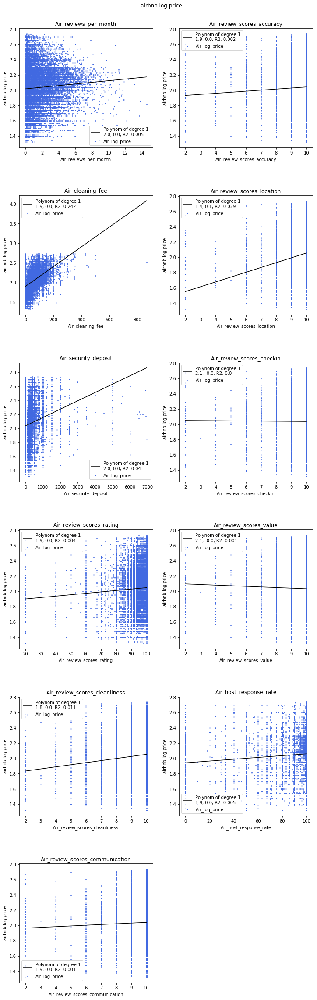

In [220]:
fig, axes = plt.subplots(6, 2, figsize=(12, 40))

fig.subplots_adjust(hspace=0.4)
fig.suptitle("airbnb log price", y=0.9)

n = int(np.ceil(len(add_vars)/2))
deg1 = 1
#deg2 = 3

for i,v in enumerate(add_vars):
    
    y = merged_add_vars_target.loc[:, 'Air_log_price']
    x = merged_add_vars_target.loc[:, v]

    res1 = polynomial(x, y, deg1)
    #res2 = polynomial(y, x, deg2)
    
    if i <= n-1:
        j = 0
        
    else:
        i = i - n
        j = 1
        
    axes[i,j].scatter(x,y, color=col1, s=2)
    axes[i,j].plot(res1['data'].x_1, res1['data'].y_pred, color="black", label="Polynom of degree " + str(deg1) + 
                    '\n' + res1['coef'] + ', R2: ' + str(round(res1['r2'], 3)))
    #axes[i,j].plot(res2['data'].x_1, res2['data'].y_pred, color="black", label="Polynom of degree " + str(deg2) + 
    #                '\n' + res2['coef'] + ', R2: ' + str(round(res2['r2'], 3)), linestyle='--')
    axes[i,j].set_ylabel("airbnb log price")
    axes[i,j].set_xlabel(v)
    axes[i,j].set_title(v)
    axes[i,j].legend()
    
axes[5,1].remove()

### (b) Findings from the EDA

The goal of the EDA was to find variables that could be part of a model to predict airbnb prices. We investigated the relationships between airbnb prices, aggregated airbnb and housing prices, crime rates and other variables as e.g. the number of bedrooms or the number of accommodates. The variables in the list below seem to be useful to predict airbnb prices. The placeholder X stands for `suburb`, `500m`, `100m`, `50m` or `nearest`. The price variables regarding neighbouring accommodations are further investigated in the next sections when we evaluate different models. `Air_bed_type ` is not considered because almost every accommodation has a real bed.

**prices and other information of neighbouring accommmodations**
- `Air_log_price_XX_same_room_type`
- `Air_accommodates_XX_same_room_type` / `Air_bathrooms_XX_same_room_type` / `Air_bedrooms_XX_same_room_type` / `Air_beds_XX_same_room_type` / `Air_guests_XX_included_same_room_type` (not used in the models)


**additional costs / additional information about the accommodation**
- `Air_cleaning_fee`

**competition**
- `Air_XX_same_room_type_count` (not used in the models)

**quality/convenience of the accommodation**
- `Air_property_type_2` 
- `Air_room_type`
- `Air_cancellation_policy` (will be regrouped later)             
- `Air_review_scores_location`               

**quality of the host**
- `Air_calculated_host_listings_count` / `Air_host_total_listings_count` / `Air_host_listings_count` (not considered)

**'hidden' information about the neighbourhood**
- `Air_neighbourhood_cleansed` 

**size of the accommodation and scope of the service**
- `Air_bathrooms` / `Air_beds` / `Air_bedrooms` / `Air_accommodates` 
- `Air_extra_people`
- `Air_guests_included`

## 4) Machine learning 

### (a) Machine learning question

The goal is now to predict airbnb prices by utilizing prices from neighbouring airbnb data aggregated in different ways and the other variables discussed and finally selected as potentially helpful in the EDA section. Prices from the housing market and data crime data did not show significant and large effects in the EDA part and are thus not considered in any model. 

Predicting airbnb prices is a regression problem. The following models are implemented in the following as they usually show a good performance on tabular data:
 
1. Linear models as linear regression, Huber, Lasso and Ridge
2. Random Forest (a bagging approach)
3. Boosting algorithms as `XGBoost` and `AdaBoost`

The idea is to test smaller and larger models. The baseline model is a linear model.

All algorithms are trained on training sets and tested on test sets. Grid search is applied to find hyper-parameters. Stratified random sampling is performed to create training, validation and test sets. A validation set is used instead of cross-validation in order to not mix up information from other datasets when using the aggregated price information. The performance is measured by r2, MAE (mean absolute error) and RMSE (root mean square error).

### (b) Training, validation and test data

The preprocessing and the aggregations needs to be done separately on the training, validation and test set.

*Renaming variables*

In [221]:
# clean some variables
airbnb_prepro_df = air.prepro_dataset(airbnb_df, restrict=None)
airbnb_prepro_df.head(1)

,Air_id,Air_listing_url,Air_scrape_id,Air_last_scraped,Air_name,Air_summary,Air_space,Air_description,Air_experiences_offered,Air_neighborhood_overview,...,Air_license,Air_jurisdiction_names,Air_instant_bookable,Air_is_business_travel_ready,Air_cancellation_policy,Air_require_guest_profile_picture,Air_require_guest_phone_verification,Air_calculated_host_listings_count,Air_reviews_per_month,Air_smart_location_cleaned
0,9835,https://www.airbnb.com/rooms/9835,20181207034809,2018-12-07,Beautiful Room & House,NaN,"House: Clean, New, Modern, Quite, Safe. 10Km f...","House: Clean, New, Modern, Quite, Safe. 10Km f...",none,Very safe! Family oriented. Older age group.,...,NaN,NaN,f,f,strict_14_with_grace_period,f,f,1.0,0.04,bulleen


*Log airbnb prices*

In [222]:
airbnb_prepro_df['Air_log_price'] = np.log10(airbnb_prepro_df.Air_price)

*Other adaptions* 

*Split into a training, validation and testing set*

In [223]:
train, test = train_test_split(airbnb_prepro_df, test_size=0.2, random_state=1)
train, valid = train_test_split(train, test_size=0.2, random_state=1)
train.head(1)

,Air_id,Air_listing_url,Air_scrape_id,Air_last_scraped,Air_name,Air_summary,Air_space,Air_description,Air_experiences_offered,Air_neighborhood_overview,...,Air_jurisdiction_names,Air_instant_bookable,Air_is_business_travel_ready,Air_cancellation_policy,Air_require_guest_profile_picture,Air_require_guest_phone_verification,Air_calculated_host_listings_count,Air_reviews_per_month,Air_smart_location_cleaned,Air_log_price
9718,18132900,https://www.airbnb.com/rooms/18132900,20181207034809,2018-12-07,PRIVATE BEDROOM & BATHROOM in SOUTHBANK,This is a 2 bedroom 2 bathroom/toilet apartmen...,Private room with queen size bed Own bathroom/...,This is a 2 bedroom 2 bathroom/toilet apartmen...,none,"Not far to Crown Casino, Flinders Station, Fed...",...,NaN,f,f,moderate,f,f,1.0,7.42,southbank,1.954243


In [224]:
valid.head(1)

,Air_id,Air_listing_url,Air_scrape_id,Air_last_scraped,Air_name,Air_summary,Air_space,Air_description,Air_experiences_offered,Air_neighborhood_overview,...,Air_jurisdiction_names,Air_instant_bookable,Air_is_business_travel_ready,Air_cancellation_policy,Air_require_guest_profile_picture,Air_require_guest_phone_verification,Air_calculated_host_listings_count,Air_reviews_per_month,Air_smart_location_cleaned,Air_log_price
14141,22286586,https://www.airbnb.com/rooms/22286586,20181207034809,2018-12-07,墨尔本CBD 两室合租 独立房间 The fifth,"交通便利,楼下有多条市区免费巴士,距离Southen cross station 步行仅有三...",NaN,"交通便利,楼下有多条市区免费巴士,距离Southen cross station 步行仅有三...",none,NaN,...,NaN,t,f,flexible,f,f,1.0,NaN,melbourne,1.832509


*Remove outliers and implausible values*

In [225]:
# Implausible values
# ------------------
# Train
impl_obs_train = train.loc[(train.Air_price >= train.Air_weekly_price) |
                                (train.Air_price >= train.Air_monthly_price), 
                                ['Air_price', 'Air_weekly_price', 'Air_monthly_price']]

# Validation
impl_obs_valid = valid.loc[(valid.Air_price >= valid.Air_weekly_price) |
                                (valid.Air_price >= valid.Air_monthly_price), 
                                ['Air_price', 'Air_weekly_price', 'Air_monthly_price']]

# Test
impl_obs_test = test.loc[(test.Air_price >= test.Air_weekly_price) |
                                (test.Air_price >= test.Air_monthly_price), 
                                ['Air_price', 'Air_weekly_price', 'Air_monthly_price']]

# Outliers
# --------
# Train
quantiles = train.Air_log_price.quantile([.25, 0.75])
iqr = quantiles.iloc[1] - quantiles.iloc[0]
upper_bounds = quantiles.iloc[1] + 1.5*iqr
lower_bounds = quantiles.iloc[0] - 1.5*iqr

train_wo_out = train.loc[(train.Air_log_price >= lower_bounds) & (train.Air_log_price <= upper_bounds),:]
#print(train_wo_out.shape)

# Validation
quantiles = valid.Air_log_price.quantile([.25, 0.75])
iqr = quantiles.iloc[1] - quantiles.iloc[0]
upper_bounds = quantiles.iloc[1] + 1.5*iqr
lower_bounds = quantiles.iloc[0] - 1.5*iqr

valid_wo_out = valid.loc[(valid.Air_log_price >= lower_bounds) & (valid.Air_log_price <= upper_bounds),:]
#print(valid_wo_out.shape)

# Test
quantiles = test.Air_log_price.quantile([.25, 0.75])
iqr = quantiles.iloc[1] - quantiles.iloc[0]
upper_bounds = quantiles.iloc[1] + 1.5*iqr
lower_bounds = quantiles.iloc[0] - 1.5*iqr

test_wo_out = test.loc[(test.Air_log_price >= lower_bounds) & (test.Air_log_price <= upper_bounds),:]
#print(train_wo_out.shape)

# Implementation
# --------------
# Train
train_cleaned = train_wo_out.loc[(train_wo_out.Air_price != 0) &
                                          ~train_wo_out.index.isin(impl_obs_train.index), :]
print(train_cleaned.shape)

# Validation
valid_cleaned = valid_wo_out.loc[(valid_wo_out.Air_price != 0) &
                                          ~valid_wo_out.index.isin(impl_obs_valid.index), :]
print(valid_cleaned.shape)

# Test
test_cleaned = test_wo_out.loc[(test_wo_out.Air_price != 0) &
                                          ~test_wo_out.index.isin(impl_obs_test.index), :]
print(test_cleaned.shape)

(14296, 98)
(3574, 98)
(4465, 98)


#### Aggregated prices

We aggregate the information about neighbouring observations.

In [226]:
train_cleaned.index = range(train_cleaned.shape[0])
valid_cleaned.index = range(valid_cleaned.shape[0])
test_cleaned.index = range(test_cleaned.shape[0])

**Suburbs**

*Mean*

In [227]:
# Test
train_airbnb_agg = air.aggregate_data(train_cleaned, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='mean',
                                            classifier='Air_room_type')
train_airbnb_agg;

# Validation
valid_airbnb_agg = air.aggregate_data(valid_cleaned, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='mean',
                                            classifier='Air_room_type')
valid_airbnb_agg;

# Train
test_airbnb_agg = air.aggregate_data(test_cleaned, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='mean',
                                            classifier='Air_room_type')
test_airbnb_agg;

*Sum*

In [228]:
# Train
train_airbnb_agg_sum = air.aggregate_data(train_cleaned, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='sum',
                                            classifier='Air_room_type')

# Validation
valid_airbnb_agg_sum = air.aggregate_data(valid_cleaned, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='sum',
                                            classifier='Air_room_type')

# Test
test_airbnb_agg_sum = air.aggregate_data(test_cleaned, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='sum',
                                            classifier='Air_room_type')

*Count*

In [229]:
# Train
train_airbnb_agg_count = air.aggregate_data(train_cleaned, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='count',
                                            classifier='Air_room_type')

# Validation
valid_airbnb_agg_count = air.aggregate_data(valid_cleaned, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='count',
                                            classifier='Air_room_type')

# Test
test_airbnb_agg_count = air.aggregate_data(test_cleaned, 
                                            ['Air_accommodates', 'Air_bathrooms', 'Air_bedrooms',
                                            'Air_beds', 'Air_guests_included', 'Air_log_price'], 
                                            ['Air_neighbourhood_cleansed'], agg_fun ='count',
                                            classifier='Air_room_type')

In [230]:
train_airbnb_agg.head(5)

,Air_neighbourhood_cleansed,Air_accommodates_Entire home/apt,Air_accommodates_Private room,Air_accommodates_Shared room,Air_bathrooms_Entire home/apt,Air_bathrooms_Private room,Air_bathrooms_Shared room,Air_bedrooms_Entire home/apt,Air_bedrooms_Private room,Air_bedrooms_Shared room,Air_beds_Entire home/apt,Air_beds_Private room,Air_beds_Shared room,Air_guests_included_Entire home/apt,Air_guests_included_Private room,Air_guests_included_Shared room,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,Banyule,4.537313,2.265625,2.000000,1.358209,1.187500,1.166667,2.000000,1.187500,1.0,2.955224,1.578125,2.0,2.477612,1.281250,1.000000,2.093758,1.718233,1.817773
1,Bayside,4.688742,1.901408,2.428571,1.692053,1.232394,1.571429,2.205298,1.056338,1.0,2.735099,1.239437,2.0,1.801325,1.239437,1.285714,2.239540,1.874226,1.683638
2,Boroondara,4.283582,1.892857,1.750000,1.400498,1.139896,1.000000,1.930348,1.040816,1.0,2.437811,1.205128,1.0,1.920398,1.132653,1.250000,2.154398,1.780887,1.681580
3,Brimbank,8.066667,2.000000,NaN,1.566667,1.163462,NaN,2.600000,1.173077,NaN,5.733333,1.250000,NaN,3.466667,1.519231,NaN,2.040816,1.647705,NaN
4,Cardinia,4.878049,2.468750,2.000000,1.390244,1.046875,1.000000,2.000000,1.343750,1.0,2.815789,1.375000,2.0,1.926829,1.125000,1.000000,2.268909,1.939552,1.602060


In [231]:
train_airbnb_agg_sum.head(5)

,Air_neighbourhood_cleansed,Air_accommodates_Entire home/apt,Air_accommodates_Private room,Air_accommodates_Shared room,Air_bathrooms_Entire home/apt,Air_bathrooms_Private room,Air_bathrooms_Shared room,Air_bedrooms_Entire home/apt,Air_bedrooms_Private room,Air_bedrooms_Shared room,Air_beds_Entire home/apt,Air_beds_Private room,Air_beds_Shared room,Air_guests_included_Entire home/apt,Air_guests_included_Private room,Air_guests_included_Shared room,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,Banyule,304.0,145.0,6.0,91.0,76.0,3.5,134.0,76.0,3.0,198.0,101.0,6.0,166.0,82.0,3.0,140.281813,109.966911,5.453318
1,Bayside,708.0,135.0,17.0,255.5,87.5,11.0,333.0,75.0,7.0,413.0,88.0,14.0,272.0,88.0,9.0,338.170479,133.070053,11.785464
2,Boroondara,861.0,371.0,7.0,281.5,220.0,3.0,388.0,204.0,4.0,490.0,235.0,3.0,386.0,222.0,5.0,433.033970,349.053947,6.726320
3,Brimbank,121.0,104.0,NaN,23.5,60.5,NaN,39.0,61.0,NaN,86.0,65.0,NaN,52.0,79.0,NaN,30.612233,85.680662,NaN
4,Cardinia,200.0,79.0,2.0,57.0,33.5,1.0,82.0,43.0,1.0,107.0,44.0,2.0,79.0,36.0,1.0,93.025282,62.065663,1.602060


In [232]:
train_airbnb_agg_count.head(5)

,Air_neighbourhood_cleansed,Air_accommodates_Entire home/apt,Air_accommodates_Private room,Air_accommodates_Shared room,Air_bathrooms_Entire home/apt,Air_bathrooms_Private room,Air_bathrooms_Shared room,Air_bedrooms_Entire home/apt,Air_bedrooms_Private room,Air_bedrooms_Shared room,Air_beds_Entire home/apt,Air_beds_Private room,Air_beds_Shared room,Air_guests_included_Entire home/apt,Air_guests_included_Private room,Air_guests_included_Shared room,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,Banyule,67.0,64.0,3.0,67.0,64.0,3.0,67.0,64.0,3.0,67.0,64.0,3.0,67.0,64.0,3.0,67.0,64.0,3.0
1,Bayside,151.0,71.0,7.0,151.0,71.0,7.0,151.0,71.0,7.0,151.0,71.0,7.0,151.0,71.0,7.0,151.0,71.0,7.0
2,Boroondara,201.0,196.0,4.0,201.0,193.0,3.0,201.0,196.0,4.0,201.0,195.0,3.0,201.0,196.0,4.0,201.0,196.0,4.0
3,Brimbank,15.0,52.0,NaN,15.0,52.0,NaN,15.0,52.0,NaN,15.0,52.0,NaN,15.0,52.0,NaN,15.0,52.0,NaN
4,Cardinia,41.0,32.0,1.0,41.0,32.0,1.0,41.0,32.0,1.0,38.0,32.0,1.0,41.0,32.0,1.0,41.0,32.0,1.0


Save to disk

In [233]:
# Train
pickle.dump(train_airbnb_agg, open("train_airbnb_agg.p", "wb"))
pickle.dump(train_airbnb_agg_sum, open("train_airbnb_agg_sum.p", "wb"))
pickle.dump(train_airbnb_agg_count, open("train_airbnb_agg_count.p", "wb"))

# Validation
pickle.dump(valid_airbnb_agg, open("valid_airbnb_agg.p", "wb"))
pickle.dump(valid_airbnb_agg_sum, open("valid_airbnb_agg_sum.p", "wb"))
pickle.dump(valid_airbnb_agg_count, open("valid_airbnb_agg_count.p", "wb"))

# Test
pickle.dump(test_airbnb_agg, open("test_airbnb_agg.p", "wb"))
pickle.dump(test_airbnb_agg_sum, open("test_airbnb_agg_sum.p", "wb"))
pickle.dump(test_airbnb_agg_count, open("test_airbnb_agg_count.p", "wb"))

Load files

In [234]:
# Train
train_airbnb_agg = pickle.load(open("train_airbnb_agg.p", "rb"))
train_airbnb_agg_sum = pickle.load(open("train_airbnb_agg_sum.p", "rb"))
train_airbnb_agg_count = pickle.load(open("train_airbnb_agg_count.p", "rb"))

# Validation
valid_airbnb_agg = pickle.load(open("valid_airbnb_agg.p", "rb"))
valid_airbnb_agg_sum = pickle.load(open("valid_airbnb_agg_sum.p", "rb"))
valid_airbnb_agg_count = pickle.load(open("valid_airbnb_agg_count.p", "rb"))

# Test
test_airbnb_agg = pickle.load(open("test_airbnb_agg.p", "rb"))
test_airbnb_agg_sum = pickle.load(open("test_airbnb_agg_sum.p", "rb"))
test_airbnb_agg_count = pickle.load(open("test_airbnb_agg_count.p", "rb"))

**50, 100 and 500 meters**

*These steps are time consuming and thus set to Raw*

Open the files

In [235]:
# Train
train_airbnb_obs_50m = pickle.load(open("train_airbnb_obs_50m.p", "rb"))
train_airbnb_obs_100m = pickle.load(open("train_airbnb_obs_100m.p", "rb"))
train_airbnb_obs_500m = pickle.load(open("train_airbnb_obs_500m.p", "rb"))

# Validation
valid_airbnb_obs_50m = pickle.load(open("valid_airbnb_obs_50m.p", "rb"))
valid_airbnb_obs_100m = pickle.load(open("valid_airbnb_obs_100m.p", "rb"))
valid_airbnb_obs_500m = pickle.load(open("valid_airbnb_obs_500m.p", "rb"))

# Test
test_airbnb_obs_50m = pickle.load(open("test_airbnb_obs_50m.p", "rb"))
test_airbnb_obs_100m = pickle.load(open("test_airbnb_obs_100m.p", "rb"))
test_airbnb_obs_500m = pickle.load(open("test_airbnb_obs_500m.p", "rb"))

Extract the values

*These steps are time consuming and thus set to Raw*

Save the results

Open the files

In [236]:
# Train
train_airbnb_agg_50m = pickle.load(open("train_airbnb_agg_50m.p", "rb"))
train_airbnb_agg_100m = pickle.load(open("train_airbnb_agg_100m.p", "rb"))
train_airbnb_agg_500m = pickle.load(open("train_airbnb_agg_500m.p", "rb"))

# Validation
valid_airbnb_agg_50m = pickle.load(open("valid_airbnb_agg_50m.p", "rb"))
valid_airbnb_agg_100m = pickle.load(open("valid_airbnb_agg_100m.p", "rb"))
valid_airbnb_agg_500m = pickle.load(open("valid_airbnb_agg_500m.p", "rb"))

# Test
test_airbnb_agg_50m = pickle.load(open("test_airbnb_agg_50m.p", "rb"))
test_airbnb_agg_100m = pickle.load(open("test_airbnb_agg_100m.p", "rb"))
test_airbnb_agg_500m = pickle.load(open("test_airbnb_agg_500m.p", "rb"))

**Nearest neighbour**

In [237]:
# Train
train_lat_long = train_cleaned.loc[:, ['Air_latitude', 'Air_longitude', 'Air_id']]
train_lat_long_type = train_cleaned.loc[:, ['Air_latitude', 'Air_longitude', 
                                            'Air_room_type', 'Air_property_type_2',
                                            'Air_id']]

# Validation
valid_lat_long = valid_cleaned.loc[:, ['Air_latitude', 'Air_longitude', 'Air_id']]
valid_lat_long_type = valid_cleaned.loc[:, ['Air_latitude', 'Air_longitude', 
                                            'Air_room_type', 'Air_property_type_2',
                                            'Air_id']]

# Test
test_lat_long = test_cleaned.loc[:, ['Air_latitude', 'Air_longitude', 'Air_id']]
test_lat_long_type = test_cleaned.loc[:, ['Air_latitude', 'Air_longitude', 
                                          'Air_room_type', 'Air_property_type_2',
                                          'Air_id']]

First, we select the observations ...

*These steps are time consuming and thus set to Raw*

Save the results

Load the results

In [238]:
train_airbnb_obs_nearest = pickle.load(open("train_airbnb_obs_nearest.p", "rb"))
valid_airbnb_obs_nearest = pickle.load(open("valid_airbnb_obs_nearest.p", "rb"))
test_airbnb_obs_nearest = pickle.load(open("test_airbnb_obs_nearest.p", "rb"))

... then we select the values.

In [239]:
# Train
train_airbnb_agg_nearest = air.the_nearest_obs_prices(train_cleaned, 
                                                      train_cleaned,
                                                      train_airbnb_obs_nearest, 
                                                      ['Air_log_price', 'Air_accommodates', 
                                                       'Air_bathrooms', 'Air_bedrooms',
                                                       'Air_beds', 'Air_guests_included'],
                                                      classifier='Air_room_type',
                                                      distance=True)

In [240]:
# Validation
valid_airbnb_agg_nearest = air.the_nearest_obs_prices(valid_cleaned, 
                                                      valid_cleaned,
                                                      valid_airbnb_obs_nearest, 
                                                      ['Air_log_price', 'Air_accommodates', 
                                                       'Air_bathrooms', 'Air_bedrooms',
                                                       'Air_beds', 'Air_guests_included'],
                                                      classifier='Air_room_type',
                                                      distance=True)

In [241]:
# Test
test_airbnb_agg_nearest = air.the_nearest_obs_prices(test_cleaned, 
                                                     test_cleaned,
                                                     test_airbnb_obs_nearest, 
                                                     ['Air_log_price', 'Air_accommodates', 
                                                     'Air_bathrooms', 'Air_bedrooms',
                                                     'Air_beds', 'Air_guests_included'],
                                                     classifier='Air_room_type',
                                                     distance=True)

Save to disk

In [242]:
pickle.dump(train_airbnb_agg_nearest, open("train_airbnb_agg_nearest.p", "wb"))
pickle.dump(valid_airbnb_agg_nearest, open("valid_airbnb_agg_nearest.p", "wb"))
pickle.dump(test_airbnb_agg_nearest, open("test_airbnb_agg_nearest.p", "wb"))

Load the file

In [243]:
train_airbnb_agg_nearest = pickle.load(open("train_airbnb_agg_nearest.p", "rb"))
valid_airbnb_agg_nearest = pickle.load(open("valid_airbnb_agg_nearest.p", "rb"))
test_airbnb_agg_nearest = pickle.load(open("test_airbnb_agg_nearest.p", "rb"))

**Merge**

We first load the files.

In [244]:
# 50, 100 and 500 meters
train_airbnb_agg_50m = pickle.load(open("train_airbnb_agg_50m.p", "rb"))
train_airbnb_agg_100m = pickle.load(open("train_airbnb_agg_100m.p", "rb"))
train_airbnb_agg_500m = pickle.load(open("train_airbnb_agg_500m.p", "rb"))

valid_airbnb_agg_50m = pickle.load(open("valid_airbnb_agg_50m.p", "rb"))
valid_airbnb_agg_100m = pickle.load(open("valid_airbnb_agg_100m.p", "rb"))
valid_airbnb_agg_500m = pickle.load(open("valid_airbnb_agg_500m.p", "rb"))

test_airbnb_agg_50m = pickle.load(open("test_airbnb_agg_50m.p", "rb"))
test_airbnb_agg_100m = pickle.load(open("test_airbnb_agg_100m.p", "rb"))
test_airbnb_agg_500m = pickle.load(open("test_airbnb_agg_500m.p", "rb"))

# nearest
train_airbnb_agg_nearest = pickle.load(open("train_airbnb_agg_nearest.p", "rb"))
valid_airbnb_agg_nearest = pickle.load(open("valid_airbnb_agg_nearest.p", "rb"))
test_airbnb_agg_nearest = pickle.load(open("test_airbnb_agg_nearest.p", "rb"))

# suburbs
train_airbnb_agg = pickle.load(open("train_airbnb_agg.p", "rb"))
train_airbnb_agg_sum = pickle.load(open("train_airbnb_agg_sum.p", "rb"))
train_airbnb_agg_count = pickle.load(open("train_airbnb_agg_count.p", "rb"))

valid_airbnb_agg = pickle.load(open("valid_airbnb_agg.p", "rb"))
valid_airbnb_agg_sum = pickle.load(open("valid_airbnb_agg_sum.p", "rb"))
valid_airbnb_agg_count = pickle.load(open("valid_airbnb_agg_count.p", "rb"))

test_airbnb_agg = pickle.load(open("test_airbnb_agg.p", "rb"))
test_airbnb_agg_sum = pickle.load(open("test_airbnb_agg_sum.p", "rb"))
test_airbnb_agg_count = pickle.load(open("test_airbnb_agg_count.p", "rb"))

In [245]:
# Train
train_airbnb_agg_50m_mean = train_airbnb_agg_50m['mean']
train_airbnb_agg_100m_mean = train_airbnb_agg_100m['mean']
train_airbnb_agg_500m_mean = train_airbnb_agg_500m['mean']

train_airbnb_agg_50m_count = train_airbnb_agg_50m['count']
train_airbnb_agg_100m_count = train_airbnb_agg_100m['count']
train_airbnb_agg_500m_count = train_airbnb_agg_500m['count']

# Validation
valid_airbnb_agg_50m_mean = valid_airbnb_agg_50m['mean']
valid_airbnb_agg_100m_mean = valid_airbnb_agg_100m['mean']
valid_airbnb_agg_500m_mean = valid_airbnb_agg_500m['mean']

valid_airbnb_agg_50m_count = valid_airbnb_agg_50m['count']
valid_airbnb_agg_100m_count = valid_airbnb_agg_100m['count']
valid_airbnb_agg_500m_count = valid_airbnb_agg_500m['count']

# Test
test_airbnb_agg_50m_mean = test_airbnb_agg_50m['mean']
test_airbnb_agg_100m_mean = test_airbnb_agg_100m['mean']
test_airbnb_agg_500m_mean = test_airbnb_agg_500m['mean']

test_airbnb_agg_50m_count = test_airbnb_agg_50m['count']
test_airbnb_agg_100m_count = test_airbnb_agg_100m['count']
test_airbnb_agg_500m_count = test_airbnb_agg_500m['count']

In [246]:
train_airbnb_agg_50m_mean.head(1)

,Air_group,Air_accommodates_Entire home/apt,Air_accommodates_Private room,Air_accommodates_Shared room,Air_bathrooms_Entire home/apt,Air_bathrooms_Private room,Air_bathrooms_Shared room,Air_bedrooms_Entire home/apt,Air_bedrooms_Private room,Air_bedrooms_Shared room,Air_beds_Entire home/apt,Air_beds_Private room,Air_beds_Shared room,Air_guests_included_Entire home/apt,Air_guests_included_Private room,Air_guests_included_Shared room,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,0,5.0,2.0,NaN,1.333333,1.0,NaN,2.0,1.0,NaN,2.666667,1.0,NaN,2.0,1.5,NaN,2.274274,1.864316,NaN


In [247]:
train_airbnb_agg_100m_mean.head(1)

,Air_group,Air_accommodates_Entire home/apt,Air_accommodates_Private room,Air_accommodates_Shared room,Air_bathrooms_Entire home/apt,Air_bathrooms_Private room,Air_bathrooms_Shared room,Air_bedrooms_Entire home/apt,Air_bedrooms_Private room,Air_bedrooms_Shared room,Air_beds_Entire home/apt,Air_beds_Private room,Air_beds_Shared room,Air_guests_included_Entire home/apt,Air_guests_included_Private room,Air_guests_included_Shared room,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,0,4.647059,1.928571,1.0,1.411765,1.214286,1.0,1.823529,1.071429,1.0,2.588235,1.071429,1.0,2.176471,1.5,1.0,2.237612,1.849264,1.665714


In [248]:
train_airbnb_agg_500m_mean.head(1)

,Air_group,Air_accommodates_Entire home/apt,Air_accommodates_Private room,Air_accommodates_Shared room,Air_bathrooms_Entire home/apt,Air_bathrooms_Private room,Air_bathrooms_Shared room,Air_bedrooms_Entire home/apt,Air_bedrooms_Private room,Air_bedrooms_Shared room,Air_beds_Entire home/apt,Air_beds_Private room,Air_beds_Shared room,Air_guests_included_Entire home/apt,Air_guests_included_Private room,Air_guests_included_Shared room,Air_log_price_Entire home/apt,Air_log_price_Private room,Air_log_price_Shared room
0,0,4.693237,1.848684,1.222222,1.426329,1.078947,1.166667,1.864734,1.019737,1.0,2.620773,1.072848,1.222222,2.702899,1.203947,1.111111,2.263383,1.887373,1.629927


We rename the variable so that we can distinguish between them.

In [249]:
# Train
# -----
# 50m, 100m and 500m - mean
cols = [e + '_50m' for e in train_airbnb_agg_50m_mean.columns if e != 'Air_group']
train_airbnb_agg_50m_mean.columns = ['Air_group'] + cols
cols = [e + '_100m' for e in train_airbnb_agg_100m_mean.columns if e != 'Air_group']
train_airbnb_agg_100m_mean.columns = ['Air_group'] + cols
cols = [e + '_500m' for e in test_airbnb_agg_500m_mean.columns if e != 'Air_group']
train_airbnb_agg_500m_mean.columns = ['Air_group'] + cols

# 50m, 100m and 500m - count
cols = [e + '_50m_count' for e in train_airbnb_agg_50m_count.columns if e != 'Air_group']
train_airbnb_agg_50m_count.columns = ['Air_group'] + cols
cols = [e + '_100m_count' for e in train_airbnb_agg_100m_count.columns if e != 'Air_group']
train_airbnb_agg_100m_count.columns = ['Air_group'] + cols
cols = [e + '_500m_count' for e in train_airbnb_agg_500m_count.columns if e != 'Air_group']
train_airbnb_agg_500m_count.columns = ['Air_group'] + cols

# nearest
cols = [e + '_nearest' for e in train_airbnb_agg_nearest.columns if e != 'Air_group']
train_airbnb_agg_nearest.columns = ['Air_group'] + cols

# suburbs - sum
cols = [e + '_suburb_sum' for e in train_airbnb_agg_sum.columns if e != 'Air_neighbourhood_cleansed']
train_airbnb_agg_sum.columns = ['Air_neighbourhood_cleansed'] + cols

# suburbs - count
cols = [e + '_suburb_count' for e in train_airbnb_agg_count.columns if e != 'Air_neighbourhood_cleansed']
train_airbnb_agg_count.columns = ['Air_neighbourhood_cleansed'] + cols


# Validation
# ----------
# 50m, 100m and 500m - mean
cols = [e + '_50m' for e in valid_airbnb_agg_50m_mean.columns if e != 'Air_group']
valid_airbnb_agg_50m_mean.columns = ['Air_group'] + cols
cols = [e + '_100m' for e in valid_airbnb_agg_100m_mean.columns if e != 'Air_group']
valid_airbnb_agg_100m_mean.columns = ['Air_group'] + cols
cols = [e + '_500m' for e in valid_airbnb_agg_500m_mean.columns if e != 'Air_group']
valid_airbnb_agg_500m_mean.columns = ['Air_group'] + cols

# 50m, 100m and 500m - count
cols = [e + '_50m_count' for e in valid_airbnb_agg_50m_count.columns if e != 'Air_group']
valid_airbnb_agg_50m_count.columns = ['Air_group'] + cols
cols = [e + '_100m_count' for e in valid_airbnb_agg_100m_count.columns if e != 'Air_group']
valid_airbnb_agg_100m_count.columns = ['Air_group'] + cols
cols = [e + '_500m_count' for e in valid_airbnb_agg_500m_count.columns if e != 'Air_group']
valid_airbnb_agg_500m_count.columns = ['Air_group'] + cols

# nearest
cols = [e + '_nearest' for e in valid_airbnb_agg_nearest.columns if e != 'Air_group']
valid_airbnb_agg_nearest.columns = ['Air_group'] + cols

# suburbs - sum
cols = [e + '_suburb_sum' for e in valid_airbnb_agg_sum.columns if e != 'Air_neighbourhood_cleansed']
valid_airbnb_agg_sum.columns = ['Air_neighbourhood_cleansed'] + cols

# suburbs - count
cols = [e + '_suburb_count' for e in valid_airbnb_agg_count.columns if e != 'Air_neighbourhood_cleansed']
valid_airbnb_agg_count.columns = ['Air_neighbourhood_cleansed'] + cols


# Test
# ----
# 50m, 100m and 500m - mean
cols = [e + '_50m' for e in test_airbnb_agg_50m_mean.columns if e != 'Air_group']
test_airbnb_agg_50m_mean.columns = ['Air_group'] + cols
cols = [e + '_100m' for e in test_airbnb_agg_100m_mean.columns if e != 'Air_group']
test_airbnb_agg_100m_mean.columns = ['Air_group'] + cols
cols = [e + '_500m' for e in test_airbnb_agg_500m_mean.columns if e != 'Air_group']
test_airbnb_agg_500m_mean.columns = ['Air_group'] + cols

# 50m, 100m and 500m - count
cols = [e + '_50m_count' for e in test_airbnb_agg_50m_count.columns if e != 'Air_group']
test_airbnb_agg_50m_count.columns = ['Air_group'] + cols
cols = [e + '_100m_count' for e in test_airbnb_agg_100m_count.columns if e != 'Air_group']
test_airbnb_agg_100m_count.columns = ['Air_group'] + cols
cols = [e + '_500m_count' for e in test_airbnb_agg_500m_count.columns if e != 'Air_group']
test_airbnb_agg_500m_count.columns = ['Air_group'] + cols

# nearest
cols = [e + '_nearest' for e in test_airbnb_agg_nearest.columns if e != 'Air_group']
test_airbnb_agg_nearest.columns = ['Air_group'] + cols

# suburbs - sum
cols = [e + '_suburb_sum' for e in test_airbnb_agg_sum.columns if e != 'Air_neighbourhood_cleansed']
test_airbnb_agg_sum.columns = ['Air_neighbourhood_cleansed'] + cols

# suburbs - count
cols = [e + '_suburb_count' for e in test_airbnb_agg_count.columns if e != 'Air_neighbourhood_cleansed']
test_airbnb_agg_count.columns = ['Air_neighbourhood_cleansed'] + cols

Let's check one dataset.

In [250]:
train_airbnb_agg_50m_mean.head(1)

,Air_group,Air_accommodates_Entire home/apt_50m,Air_accommodates_Private room_50m,Air_accommodates_Shared room_50m,Air_bathrooms_Entire home/apt_50m,Air_bathrooms_Private room_50m,Air_bathrooms_Shared room_50m,Air_bedrooms_Entire home/apt_50m,Air_bedrooms_Private room_50m,Air_bedrooms_Shared room_50m,Air_beds_Entire home/apt_50m,Air_beds_Private room_50m,Air_beds_Shared room_50m,Air_guests_included_Entire home/apt_50m,Air_guests_included_Private room_50m,Air_guests_included_Shared room_50m,Air_log_price_Entire home/apt_50m,Air_log_price_Private room_50m,Air_log_price_Shared room_50m
0,0,5.0,2.0,NaN,1.333333,1.0,NaN,2.0,1.0,NaN,2.666667,1.0,NaN,2.0,1.5,NaN,2.274274,1.864316,NaN


Now, the datasets can be merged.

In [251]:
train_cleaned['Air_group'] = range(train_cleaned.shape[0])
valid_cleaned['Air_group'] = range(valid_cleaned.shape[0])
test_cleaned['Air_group'] = range(test_cleaned.shape[0])

Let's print again the shapes of the different datasets so that we can check whether the merge is performed correctly. 

In [252]:
print(train_cleaned.shape)
print(valid_cleaned.shape)
print(test_cleaned.shape)

(14296, 99)
(3574, 99)
(4465, 99)


In [253]:
# Train
merged_train = train_cleaned.merge(train_airbnb_agg_50m_mean, left_on='Air_group', right_on='Air_group',
                                 how='left')
print(merged_train.shape)
merged_train = merged_train.merge(train_airbnb_agg_100m_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_train.shape)
merged_train = merged_train.merge(train_airbnb_agg_500m_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_train.shape)
merged_train = merged_train.merge(train_airbnb_agg_50m_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_train.shape)
merged_train = merged_train.merge(train_airbnb_agg_100m_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_train.shape)
merged_train = merged_train.merge(train_airbnb_agg_500m_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_train.shape)

merged_train = merged_train.merge(train_airbnb_agg_nearest, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_train.shape)

merged_train = merged_train.merge(train_airbnb_agg, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged_train.shape)
merged_train = merged_train.merge(train_airbnb_agg_sum, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged_train.shape)
merged_train = merged_train.merge(train_airbnb_agg_count, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged_train.shape)


# Validation
# ----------
merged_valid = valid_cleaned.merge(valid_airbnb_agg_50m_mean, left_on='Air_group', right_on='Air_group',
                                 how='left')
print(merged_valid.shape)
merged_valid = merged_valid.merge(valid_airbnb_agg_100m_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_valid.shape)
merged_valid = merged_valid.merge(valid_airbnb_agg_500m_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_valid.shape)
merged_valid = merged_valid.merge(valid_airbnb_agg_50m_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_valid.shape)
merged_valid = merged_valid.merge(valid_airbnb_agg_100m_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_valid.shape)
merged_valid = merged_valid.merge(valid_airbnb_agg_500m_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_valid.shape)

merged_valid = merged_valid.merge(valid_airbnb_agg_nearest, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_valid.shape)

merged_valid = merged_valid.merge(valid_airbnb_agg, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged_valid.shape)
merged_valid = merged_valid.merge(valid_airbnb_agg_sum, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged_valid.shape)
merged_valid = merged_valid.merge(valid_airbnb_agg_count, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged_valid.shape)


# Test
# ----
merged_test = test_cleaned.merge(test_airbnb_agg_50m_mean, left_on='Air_group', right_on='Air_group',
                                 how='left')
print(merged_test.shape)
merged_test = merged_test.merge(test_airbnb_agg_100m_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_test.shape)
merged_test = merged_test.merge(test_airbnb_agg_500m_mean, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_test.shape)
merged_test = merged_test.merge(test_airbnb_agg_50m_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_test.shape)
merged_test = merged_test.merge(test_airbnb_agg_100m_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_test.shape)
merged_test = merged_test.merge(test_airbnb_agg_500m_count, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_test.shape)

merged_test = merged_test.merge(test_airbnb_agg_nearest, left_on='Air_group', right_on='Air_group',
                     how='left')
print(merged_test.shape)

merged_test = merged_test.merge(test_airbnb_agg, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged_test.shape)
merged_test = merged_test.merge(test_airbnb_agg_sum, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged_test.shape)
merged_test = merged_test.merge(test_airbnb_agg_count, left_on='Air_neighbourhood_cleansed', 
                     right_on='Air_neighbourhood_cleansed', how='left')
print(merged_test.shape)

(14296, 117)
(14296, 135)
(14296, 153)
(14296, 171)
(14296, 189)
(14296, 207)
(14296, 228)
(14296, 246)
(14296, 264)
(14296, 282)
(3574, 117)
(3574, 135)
(3574, 153)
(3574, 171)
(3574, 189)
(3574, 207)
(3574, 228)
(3574, 246)
(3574, 264)
(3574, 282)
(4465, 117)
(4465, 135)
(4465, 153)
(4465, 171)
(4465, 189)
(4465, 207)
(4465, 228)
(4465, 246)
(4465, 264)
(4465, 282)


**Additional variables**

Now, we have to define the additional variables as we did it in the EDA part.

In [254]:
# Train
# -----
# AIRBNB SUBURBS
# Averages
merged_train['Air_log_price_suburb_same_room_type'] = np.nan
merged_train['Air_accommodates_suburb_same_room_type'] = np.nan
merged_train['Air_bathrooms_suburb_same_room_type'] = np.nan
merged_train['Air_bedrooms_suburb_same_room_type'] = np.nan
merged_train['Air_beds_suburb_same_room_type'] = np.nan
merged_train['Air_guests_included_suburb_same_room_type'] = np.nan

# Sums (needed to correct the suburbs averages later)
merged_train['Air_log_price_suburb_same_room_type_sum'] = np.nan
merged_train['Air_accommodates_suburb_same_room_type_sum'] = np.nan
merged_train['Air_bathrooms_suburb_same_room_type_sum'] = np.nan
merged_train['Air_bedrooms_suburb_same_room_type_sum'] = np.nan
merged_train['Air_beds_suburb_same_room_type_sum'] = np.nan
merged_train['Air_guests_included_suburb_same_room_type_sum'] = np.nan

# Counts
merged_train['Air_suburb_same_room_type_count'] = np.nan

# AIRBNB OTHER FORMS OF AGGREGATION
# Averages
merged_train['Air_log_price_50m_same_room_type'] = np.nan
merged_train['Air_accommodates_50m_same_room_type'] = np.nan
merged_train['Air_bathrooms_50m_same_room_type'] = np.nan
merged_train['Air_bedrooms_50m_same_room_type'] = np.nan
merged_train['Air_beds_50m_same_room_type'] = np.nan
merged_train['Air_guests_included_50m_same_room_type'] = np.nan

merged_train['Air_log_price_100m_same_room_type'] = np.nan
merged_train['Air_accommodates_100m_same_room_type'] = np.nan
merged_train['Air_bathrooms_100m_same_room_type'] = np.nan
merged_train['Air_bedrooms_100m_same_room_type'] = np.nan
merged_train['Air_beds_100m_same_room_type'] = np.nan
merged_train['Air_guests_included_100m_same_room_type'] = np.nan

merged_train['Air_log_price_500m_same_room_type'] = np.nan
merged_train['Air_accommodates_500m_same_room_type'] = np.nan
merged_train['Air_bathrooms_500m_same_room_type'] = np.nan
merged_train['Air_bedrooms_500m_same_room_type'] = np.nan
merged_train['Air_beds_500m_same_room_type'] = np.nan
merged_train['Air_guests_included_500m_same_room_type'] = np.nan

merged_train['Air_log_price_nearest_same_room_type'] = np.nan

# Counts
merged_train['Air_50m_same_room_type_count'] = np.nan
merged_train['Air_100m_same_room_type_count'] = np.nan
merged_train['Air_500m_same_room_type_count'] = np.nan

merged_train['Air_nearest_same_room_type_count'] = np.nan


# Validation
# ----------
# AIRBNB SUBURBS
# Averages
merged_valid['Air_log_price_suburb_same_room_type'] = np.nan
merged_valid['Air_accommodates_suburb_same_room_type'] = np.nan
merged_valid['Air_bathrooms_suburb_same_room_type'] = np.nan
merged_valid['Air_bedrooms_suburb_same_room_type'] = np.nan
merged_valid['Air_beds_suburb_same_room_type'] = np.nan
merged_valid['Air_guests_included_suburb_same_room_type'] = np.nan

# Sums (needed to correct the suburbs averages later)
merged_valid['Air_log_price_suburb_same_room_type_sum'] = np.nan
merged_valid['Air_accommodates_suburb_same_room_type_sum'] = np.nan
merged_valid['Air_bathrooms_suburb_same_room_type_sum'] = np.nan
merged_valid['Air_bedrooms_suburb_same_room_type_sum'] = np.nan
merged_valid['Air_beds_suburb_same_room_type_sum'] = np.nan
merged_valid['Air_guests_included_suburb_same_room_type_sum'] = np.nan

# Counts
merged_valid['Air_suburb_same_room_type_count'] = np.nan

# AIRBNB OTHER FORMS OF AGGREGATION
# Averages
merged_valid['Air_log_price_50m_same_room_type'] = np.nan
merged_valid['Air_accommodates_50m_same_room_type'] = np.nan
merged_valid['Air_bathrooms_50m_same_room_type'] = np.nan
merged_valid['Air_bedrooms_50m_same_room_type'] = np.nan
merged_valid['Air_beds_50m_same_room_type'] = np.nan
merged_valid['Air_guests_included_50m_same_room_type'] = np.nan

merged_valid['Air_log_price_100m_same_room_type'] = np.nan
merged_valid['Air_accommodates_100m_same_room_type'] = np.nan
merged_valid['Air_bathrooms_100m_same_room_type'] = np.nan
merged_valid['Air_bedrooms_100m_same_room_type'] = np.nan
merged_valid['Air_beds_100m_same_room_type'] = np.nan
merged_valid['Air_guests_included_100m_same_room_type'] = np.nan

merged_valid['Air_log_price_500m_same_room_type'] = np.nan
merged_valid['Air_accommodates_500m_same_room_type'] = np.nan
merged_valid['Air_bathrooms_500m_same_room_type'] = np.nan
merged_valid['Air_bedrooms_500m_same_room_type'] = np.nan
merged_valid['Air_beds_500m_same_room_type'] = np.nan
merged_valid['Air_guests_included_500m_same_room_type'] = np.nan

merged_valid['Air_log_price_nearest_same_room_type'] = np.nan

# Counts
merged_valid['Air_50m_same_room_type_count'] = np.nan
merged_valid['Air_100m_same_room_type_count'] = np.nan
merged_valid['Air_500m_same_room_type_count'] = np.nan

merged_valid['Air_nearest_same_room_type_count'] = np.nan


# Test
# ----
# AIRBNB SUBURBS
# Averages
merged_test['Air_log_price_suburb_same_room_type'] = np.nan
merged_test['Air_accommodates_suburb_same_room_type'] = np.nan
merged_test['Air_bathrooms_suburb_same_room_type'] = np.nan
merged_test['Air_bedrooms_suburb_same_room_type'] = np.nan
merged_test['Air_beds_suburb_same_room_type'] = np.nan
merged_test['Air_guests_included_suburb_same_room_type'] = np.nan

# Sums (needed to correct the suburbs averages later)
merged_test['Air_log_price_suburb_same_room_type_sum'] = np.nan
merged_test['Air_accommodates_suburb_same_room_type_sum'] = np.nan
merged_test['Air_bathrooms_suburb_same_room_type_sum'] = np.nan
merged_test['Air_bedrooms_suburb_same_room_type_sum'] = np.nan
merged_test['Air_beds_suburb_same_room_type_sum'] = np.nan
merged_test['Air_guests_included_suburb_same_room_type_sum'] = np.nan

# Counts
merged_test['Air_suburb_same_room_type_count'] = np.nan

# AIRBNB OTHER FORMS OF AGGREGATION
# Averages
merged_test['Air_log_price_50m_same_room_type'] = np.nan
merged_test['Air_accommodates_50m_same_room_type'] = np.nan
merged_test['Air_bathrooms_50m_same_room_type'] = np.nan
merged_test['Air_bedrooms_50m_same_room_type'] = np.nan
merged_test['Air_beds_50m_same_room_type'] = np.nan
merged_test['Air_guests_included_50m_same_room_type'] = np.nan

merged_test['Air_log_price_100m_same_room_type'] = np.nan
merged_test['Air_accommodates_100m_same_room_type'] = np.nan
merged_test['Air_bathrooms_100m_same_room_type'] = np.nan
merged_test['Air_bedrooms_100m_same_room_type'] = np.nan
merged_test['Air_beds_100m_same_room_type'] = np.nan
merged_test['Air_guests_included_100m_same_room_type'] = np.nan

merged_test['Air_log_price_500m_same_room_type'] = np.nan
merged_test['Air_accommodates_500m_same_room_type'] = np.nan
merged_test['Air_bathrooms_500m_same_room_type'] = np.nan
merged_test['Air_bedrooms_500m_same_room_type'] = np.nan
merged_test['Air_beds_500m_same_room_type'] = np.nan
merged_test['Air_guests_included_500m_same_room_type'] = np.nan

merged_test['Air_log_price_nearest_same_room_type'] = np.nan

# Counts
merged_test['Air_50m_same_room_type_count'] = np.nan
merged_test['Air_100m_same_room_type_count'] = np.nan
merged_test['Air_500m_same_room_type_count'] = np.nan

merged_test['Air_nearest_same_room_type_count'] = np.nan

In [255]:
# Train
# -----

# AIRBNB SUBURBS
# Sums
# ----
# log price
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_log_price_Private room_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_Shared room_suburb_sum']
# accommodates
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_accommodates_Private room_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_suburb_sum']
# bathrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_bathrooms_Private room_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_suburb_sum']
# bedrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_bedrooms_Private room_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_suburb_sum']
# beds
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_beds_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_beds_Private room_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_beds_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_beds_Shared room_suburb_sum']
# guests_included
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_guests_included_Private room_suburb_sum']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_suburb_sum']

# Counts
# ------
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_suburb_same_room_type_count'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_suburb_count']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_suburb_same_room_type_count'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_log_price_Private room_suburb_count']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_suburb_same_room_type_count'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_Shared room_suburb_count']

# Means
# -----
# log price
merged_train['Air_log_price_suburb_same_room_type'] = (merged_train.Air_log_price_suburb_same_room_type_sum - \
                                                 merged_train.Air_log_price) / \
                                                (merged_train.Air_suburb_same_room_type_count - 1)
# accommodates
merged_train['Air_accommodates_suburb_same_room_type'] = (merged_train.Air_accommodates_suburb_same_room_type_sum - \
                                                    merged_train.Air_accommodates) / \
                                                   (merged_train.Air_suburb_same_room_type_count - 1)
# bathrooms
merged_train['Air_bathrooms_suburb_same_room_type'] = (merged_train.Air_bathrooms_suburb_same_room_type_sum - \
                                                 merged_train.Air_bathrooms) / \
                                                (merged_train.Air_suburb_same_room_type_count - 1)
# bedrooms
merged_train['Air_bedrooms_suburb_same_room_type'] = (merged_train.Air_bedrooms_suburb_same_room_type_sum - \
                                                merged_train.Air_bedrooms) / \
                                               (merged_train.Air_suburb_same_room_type_count - 1)
# beds
merged_train['Air_beds_suburb_same_room_type'] = (merged_train.Air_beds_suburb_same_room_type_sum - \
                                            merged_train.Air_beds) / \
                                           (merged_train.Air_suburb_same_room_type_count - 1)
# guests_included
merged_train['Air_guests_included_suburb_same_room_type'] = (merged_train.Air_guests_included_suburb_same_room_type_sum - \
                                                       merged_train.Air_guests_included) / \
                                                      (merged_train.Air_suburb_same_room_type_count - 1)


# Validation
# ----------

# AIRBNB SUBURBS
# Sums
# ----
# log price
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_log_price_Private room_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_Shared room_suburb_sum']
# accommodates
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_accommodates_Private room_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_suburb_sum']
# bathrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_bathrooms_Private room_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_suburb_sum']
# bedrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_bedrooms_Private room_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_suburb_sum']
# beds
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_beds_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_beds_Private room_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_beds_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_beds_Shared room_suburb_sum']
# guests_included
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_guests_included_Private room_suburb_sum']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_suburb_sum']

# Counts
# ------
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_suburb_same_room_type_count'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_suburb_count']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_suburb_same_room_type_count'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_log_price_Private room_suburb_count']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_suburb_same_room_type_count'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_Shared room_suburb_count']

# Means
# -----
# log price
merged_valid['Air_log_price_suburb_same_room_type'] = (merged_valid.Air_log_price_suburb_same_room_type_sum - \
                                                 merged_valid.Air_log_price) / \
                                                (merged_valid.Air_suburb_same_room_type_count - 1)
# accommodates
merged_valid['Air_accommodates_suburb_same_room_type'] = (merged_valid.Air_accommodates_suburb_same_room_type_sum - \
                                                    merged_valid.Air_accommodates) / \
                                                   (merged_valid.Air_suburb_same_room_type_count - 1)
# bathrooms
merged_valid['Air_bathrooms_suburb_same_room_type'] = (merged_valid.Air_bathrooms_suburb_same_room_type_sum - \
                                                 merged_valid.Air_bathrooms) / \
                                                (merged_valid.Air_suburb_same_room_type_count - 1)
# bedrooms
merged_valid['Air_bedrooms_suburb_same_room_type'] = (merged_valid.Air_bedrooms_suburb_same_room_type_sum - \
                                                merged_valid.Air_bedrooms) / \
                                               (merged_valid.Air_suburb_same_room_type_count - 1)
# beds
merged_valid['Air_beds_suburb_same_room_type'] = (merged_valid.Air_beds_suburb_same_room_type_sum - \
                                            merged_valid.Air_beds) / \
                                           (merged_valid.Air_suburb_same_room_type_count - 1)
# guests_included
merged_valid['Air_guests_included_suburb_same_room_type'] = (merged_valid.Air_guests_included_suburb_same_room_type_sum - \
                                                       merged_valid.Air_guests_included) / \
                                                      (merged_valid.Air_suburb_same_room_type_count - 1)


# Test
# ----

# AIRBNB SUBURBS
# Sums
# ----
# log price
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_log_price_Private room_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_Shared room_suburb_sum']
# accommodates
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_accommodates_Private room_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_suburb_sum']
# bathrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_bathrooms_Private room_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_suburb_sum']
# bedrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_bedrooms_Private room_suburb_sum']
merged_test.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_suburb_sum']
# beds
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_beds_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_beds_Private room_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_beds_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_beds_Shared room_suburb_sum']
# guests_included
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_guests_included_Private room_suburb_sum']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_suburb_same_room_type_sum'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_suburb_sum']

# Counts
# ------
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_suburb_same_room_type_count'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_suburb_count']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_suburb_same_room_type_count'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_log_price_Private room_suburb_count']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_suburb_same_room_type_count'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_Shared room_suburb_count']

# Means
# -----
# log price
merged_test['Air_log_price_suburb_same_room_type'] = (merged_test.Air_log_price_suburb_same_room_type_sum - \
                                                 merged_test.Air_log_price) / \
                                                (merged_test.Air_suburb_same_room_type_count - 1)
# accommodates
merged_test['Air_accommodates_suburb_same_room_type'] = (merged_test.Air_accommodates_suburb_same_room_type_sum - \
                                                    merged_test.Air_accommodates) / \
                                                   (merged_test.Air_suburb_same_room_type_count - 1)
# bathrooms
merged_test['Air_bathrooms_suburb_same_room_type'] = (merged_test.Air_bathrooms_suburb_same_room_type_sum - \
                                                 merged_test.Air_bathrooms) / \
                                                (merged_test.Air_suburb_same_room_type_count - 1)
# bedrooms
merged_test['Air_bedrooms_suburb_same_room_type'] = (merged_test.Air_bedrooms_suburb_same_room_type_sum - \
                                                merged_test.Air_bedrooms) / \
                                               (merged_test.Air_suburb_same_room_type_count - 1)
# beds
merged_test['Air_beds_suburb_same_room_type'] = (merged_test.Air_beds_suburb_same_room_type_sum - \
                                            merged_test.Air_beds) / \
                                           (merged_test.Air_suburb_same_room_type_count - 1)
# guests_included
merged_test['Air_guests_included_suburb_same_room_type'] = (merged_test.Air_guests_included_suburb_same_room_type_sum - \
                                                       merged_test.Air_guests_included) / \
                                                      (merged_test.Air_suburb_same_room_type_count - 1)

In [256]:
# Train
# -----

# AIRBNB OTHER FORMS OF AGGREGATION
# Means
# #####
# Same room type - 50m
# --------------------
# log price
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_50m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_log_price_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_log_price_Private room_50m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_Shared room_50m']
# accommodates
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_50m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_accommodates_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_accommodates_Private room_50m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_50m']
# bathrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_50m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bathrooms_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_bathrooms_Private room_50m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_50m']
# bedrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_50m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bedrooms_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_bedrooms_Private room_50m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_50m']
# beds
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_50m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_beds_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_beds_Private room_50m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_beds_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_Shared room_50m']
# guests_included
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_50m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_guests_included_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_guests_included_Private room_50m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_50m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_50m']

# Same room type - 100m
# ---------------------
# log price
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_100m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_log_price_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_log_price_Private room_100m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_Shared room_100m']
# accommodates
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_100m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_accommodates_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_accommodates_Private room_100m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_100m']
# bathrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_100m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bathrooms_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_bathrooms_Private room_100m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_100m']
# bedrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_100m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bedrooms_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_bedrooms_Private room_100m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_100m']
# beds
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_100m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_beds_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_beds_Private room_100m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_beds_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_Shared room_100m']
# guests_included
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_100m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_guests_included_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_guests_included_Private room_100m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_100m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_100m']

# Same room type - 500m
# ---------------------
# log price
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_500m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_log_price_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_log_price_Private room_500m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_Shared room_500m']
# accommodates
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_500m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_accommodates_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_accommodates_Private room_500m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_500m']
# bathrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_500m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bathrooms_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_bathrooms_Private room_500m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_500m']
# bedrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_500m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bedrooms_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_bedrooms_Private room_500m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_500m']
# beds
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_500m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_beds_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_beds_Private room_500m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_beds_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_Shared room_500m']
# guests_included
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_500m']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_guests_included_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room','Air_guests_included_Private room_500m']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_500m_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_500m']

# Same room type - nearest
# ------------------------
# log price
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_nearest']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_log_price_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_log_price_Private room_nearest']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_log_price_Shared room_nearest']
# accommodates
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_nearest']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_accommodates_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_accommodates_Private room_nearest']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_nearest']
# bathrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_nearest']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bathrooms_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bathrooms_Private room_nearest']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_nearest']
# bedrooms
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_nearest']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bedrooms_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_bedrooms_Private room_nearest']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_nearest']
# beds
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_nearest']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_beds_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_beds_Private room_nearest']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_beds_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_beds_Shared room_nearest']
# guests_included
merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_nearest']
merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_guests_included_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Private room', 'Air_guests_included_Private room_nearest']
merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_nearest_same_room_type'] = \
            merged_train.loc[merged_train.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_nearest']



# Validation
# ----------

# AIRBNB OTHER FORMS OF AGGREGATION
# Means
# #####
# Same room type - 50m
# --------------------
# log price
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_log_price_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_log_price_Private room_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_Shared room_50m']
# accommodates
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_accommodates_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_accommodates_Private room_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_50m']
# bathrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bathrooms_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_bathrooms_Private room_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_50m']
# bedrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bedrooms_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_bedrooms_Private room_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_50m']
# beds
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_beds_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_beds_Private room_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_beds_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_Shared room_50m']
# guests_included
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_guests_included_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_guests_included_Private room_50m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_50m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_50m']

# Same room type - 100m
# ---------------------
# log price
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_log_price_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_log_price_Private room_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_Shared room_100m']
# accommodates
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_accommodates_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_accommodates_Private room_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_100m']
# bathrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bathrooms_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_bathrooms_Private room_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_100m']
# bedrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bedrooms_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_bedrooms_Private room_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_100m']
# beds
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_beds_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_beds_Private room_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_beds_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_Shared room_100m']
# guests_included
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_guests_included_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_guests_included_Private room_100m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_100m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_100m']

# Same room type - 500m
# ---------------------
# log price
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_log_price_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_log_price_Private room_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_Shared room_500m']
# accommodates
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_accommodates_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_accommodates_Private room_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_500m']
# bathrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bathrooms_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_bathrooms_Private room_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_500m']
# bedrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bedrooms_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_bedrooms_Private room_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_500m']
# beds
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_beds_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_beds_Private room_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_beds_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_Shared room_500m']
# guests_included
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_guests_included_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room','Air_guests_included_Private room_500m']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_500m_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_500m']

# Same room type - nearest
# ------------------------
# log price
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_log_price_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_log_price_Private room_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_log_price_Shared room_nearest']
# accommodates
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_accommodates_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_accommodates_Private room_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_nearest']
# bathrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bathrooms_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bathrooms_Private room_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_nearest']
# bedrooms
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bedrooms_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_bedrooms_Private room_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_nearest']
# beds
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_beds_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_beds_Private room_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_beds_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_beds_Shared room_nearest']
# guests_included
merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_guests_included_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Private room', 'Air_guests_included_Private room_nearest']
merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_nearest_same_room_type'] = \
            merged_valid.loc[merged_valid.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_nearest']


# Test
# ----

# AIRBNB OTHER FORMS OF AGGREGATION
# Means
# #####
# Same room type - 50m
# --------------------
# log price
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_50m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_log_price_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_log_price_Private room_50m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_Shared room_50m']
# accommodates
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_50m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_accommodates_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_accommodates_Private room_50m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_50m']
# bathrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_50m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bathrooms_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_bathrooms_Private room_50m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_50m']
# bedrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_50m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bedrooms_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_bedrooms_Private room_50m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bedrooms_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_50m']
# beds
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_50m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_beds_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_beds_Private room_50m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_beds_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_Shared room_50m']
# guests_included
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_50m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_guests_included_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_guests_included_Private room_50m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_50m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_50m']

# Same room type - 100m
# ---------------------
# log price
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_100m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_log_price_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_log_price_Private room_100m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_Shared room_100m']
# accommodates
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_100m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_accommodates_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_accommodates_Private room_100m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_100m']
# bathrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_100m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bathrooms_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_bathrooms_Private room_100m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_100m']
# bedrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_100m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bedrooms_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_bedrooms_Private room_100m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bedrooms_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_100m']
# beds
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_100m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_beds_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_beds_Private room_100m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_beds_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_Shared room_100m']
# guests_included
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_100m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_guests_included_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_guests_included_Private room_100m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_100m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_100m']

# Same room type - 500m
# ---------------------
# log price
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_500m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_log_price_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_log_price_Private room_500m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_Shared room_500m']
# accommodates
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_500m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_accommodates_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_accommodates_Private room_500m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_500m']
# bathrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_500m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bathrooms_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_bathrooms_Private room_500m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_500m']
# bedrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_500m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bedrooms_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_bedrooms_Private room_500m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bedrooms_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_500m']
# beds
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_500m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_beds_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_beds_Private room_500m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_beds_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_Shared room_500m']
# guests_included
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_500m']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_guests_included_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room','Air_guests_included_Private room_500m']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_500m_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_500m']

# Same room type - nearest
# ------------------------
# log price
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_log_price_Entire home/apt_nearest']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_log_price_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_log_price_Private room_nearest']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_log_price_Shared room_nearest']
# accommodates
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_accommodates_Entire home/apt_nearest']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_accommodates_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_accommodates_Private room_nearest']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_accommodates_Shared room_nearest']
# bathrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bathrooms_Entire home/apt_nearest']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bathrooms_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bathrooms_Private room_nearest']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bathrooms_Shared room_nearest']
# bedrooms
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_bedrooms_Entire home/apt_nearest']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bedrooms_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_bedrooms_Private room_nearest']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bedrooms_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_bedrooms_Shared room_nearest']
# beds
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_beds_Entire home/apt_nearest']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_beds_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_beds_Private room_nearest']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_beds_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_beds_Shared room_nearest']
# guests_included
merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Entire home/apt', 'Air_guests_included_Entire home/apt_nearest']
merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_guests_included_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Private room', 'Air_guests_included_Private room_nearest']
merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_nearest_same_room_type'] = \
            merged_test.loc[merged_test.Air_room_type == 'Shared room', 'Air_guests_included_Shared room_nearest']

Distance to CBD

In [257]:
# Train
merged_train['latitude_CBD'] = -37.814
merged_train['longitude_CBD'] = 144.963

merged_train['Air_distance_to_CBD'] = air._haversine_np(merged_train.Air_longitude, merged_train.Air_latitude,
                                                merged_train.longitude_CBD, merged_train.latitude_CBD)

# Validation
merged_valid['latitude_CBD'] = -37.814
merged_valid['longitude_CBD'] = 144.963

merged_valid['Air_distance_to_CBD'] = air._haversine_np(merged_valid.Air_longitude, merged_valid.Air_latitude,
                                                merged_valid.longitude_CBD, merged_valid.latitude_CBD)

# Test
merged_test['latitude_CBD'] = -37.814
merged_test['longitude_CBD'] = 144.963

merged_test['Air_distance_to_CBD'] = air._haversine_np(merged_test.Air_longitude, merged_test.Air_latitude,
                                                merged_test.longitude_CBD, merged_test.latitude_CBD)

Property type

In [258]:
# Train
merged_train['Air_property_type_2'] = 'Other'
merged_train.loc[merged_train.Air_property_type.isin(['House', 'Cottage', 'Villa']), 'Air_property_type_2'] = 'House_Cottage_Villa'
merged_train.loc[merged_train.Air_property_type.isin(['Apartment', 'Condominium']), 'Air_property_type_2'] = 'Apartment_Condominium'
merged_train.loc[merged_train.Air_property_type.isin(['Townhouse']), 'Air_property_type_2'] = 'Townhouse'

# Validate
merged_valid['Air_property_type_2'] = 'Other'
merged_valid.loc[merged_valid.Air_property_type.isin(['House', 'Cottage', 'Villa']), 'Air_property_type_2'] = 'House_Cottage_Villa'
merged_valid.loc[merged_valid.Air_property_type.isin(['Apartment', 'Condominium']), 'Air_property_type_2'] = 'Apartment_Condominium'
merged_valid.loc[merged_valid.Air_property_type.isin(['Townhouse']), 'Air_property_type_2'] = 'Townhouse'

# Test
merged_test['Air_property_type_2'] = 'Other'
merged_test.loc[merged_test.Air_property_type.isin(['House', 'Cottage', 'Villa']), 'Air_property_type_2'] = 'House_Cottage_Villa'
merged_test.loc[merged_test.Air_property_type.isin(['Apartment', 'Condominium']), 'Air_property_type_2'] = 'Apartment_Condominium'
merged_test.loc[merged_test.Air_property_type.isin(['Townhouse']), 'Air_property_type_2'] = 'Townhouse'

Cancellation policy

In [259]:
# Train
merged_train['Air_cancellation_policy_2'] = merged_train.Air_cancellation_policy
merged_train.replace(to_replace={'Air_cancellation_policy_2': {'super_strict_60': 'strict_tmp',
                                                              'super_strict_30': 'strict_tmp',
                                                              'strict_14_with_grace_period': 'strict_tmp'}}, inplace=True)
merged_train.replace(to_replace={'Air_cancellation_policy_2': {'strict_tmp': 'strict'}}, inplace=True)

# Valid
merged_valid['Air_cancellation_policy_2'] = merged_valid.Air_cancellation_policy
merged_valid.replace(to_replace={'Air_cancellation_policy_2': {'super_strict_60': 'strict_tmp',
                                                              'super_strict_30': 'strict_tmp',
                                                              'strict_14_with_grace_period': 'strict_tmp'}}, inplace=True)
merged_valid.replace(to_replace={'Air_cancellation_policy_2': {'strict_tmp': 'strict'}}, inplace=True)

# Test
merged_test['Air_cancellation_policy_2'] = merged_test.Air_cancellation_policy
merged_test.replace(to_replace={'Air_cancellation_policy_2': {'super_strict_60': 'strict_tmp',
                                                              'super_strict_30': 'strict_tmp',
                                                              'strict_14_with_grace_period': 'strict_tmp'}}, inplace=True)
merged_test.replace(to_replace={'Air_cancellation_policy_2': {'strict_tmp': 'strict'}}, inplace=True)

**Variables of interest**

Let's gather the variables that are interesting for this project.

In [260]:
# Train
train = merged_train.loc[:, ['Air_log_price', 
                      'Air_log_price_suburb_same_room_type',
                      'Air_log_price_50m_same_room_type', 
                      'Air_log_price_100m_same_room_type',
                      'Air_log_price_500m_same_room_type', 
                      'Air_log_price_nearest_same_room_type',
                      'Air_accommodates_50m_same_room_type', 
                      'Air_accommodates_100m_same_room_type', 
                      'Air_accommodates_500m_same_room_type',
                      'Air_bathrooms_50m_same_room_type', 
                      'Air_bathrooms_100m_same_room_type', 
                      'Air_bathrooms_500m_same_room_type',
                      'Air_bedrooms_50m_same_room_type',
                      'Air_bedrooms_100m_same_room_type',
                      'Air_bedrooms_500m_same_room_type',
                      'Air_beds_50m_same_room_type', 
                      'Air_beds_100m_same_room_type', 
                      'Air_beds_500m_same_room_type',
                      'Air_guests_included_50m_same_room_type', 
                      'Air_guests_included_100m_same_room_type', 
                      'Air_guests_included_500m_same_room_type',
                      'Air_suburb_same_room_type_count',
                      'Air_50m_same_room_type_count', 
                      'Air_100m_same_room_type_count',
                      'Air_500m_same_room_type_count', 
                      'Air_property_type_2', 
                      'Air_room_type', 
                      'Air_cancellation_policy_2',
                      'Air_calculated_host_listings_count', 
                      'Air_host_total_listings_count', 
                      'Air_host_listings_count',
                      'Air_neighbourhood_cleansed', 
                      'Air_bathrooms', 
                      'Air_beds', 
                      'Air_bedrooms', 
                      'Air_accommodates', 
                      'Air_extra_people',
                      'Air_guests_included',
                      'Air_distance_to_CBD']]
train.head(5)

,Air_log_price,Air_log_price_suburb_same_room_type,Air_log_price_50m_same_room_type,Air_log_price_100m_same_room_type,Air_log_price_500m_same_room_type,Air_log_price_nearest_same_room_type,Air_accommodates_50m_same_room_type,Air_accommodates_100m_same_room_type,Air_accommodates_500m_same_room_type,Air_bathrooms_50m_same_room_type,...,Air_host_total_listings_count,Air_host_listings_count,Air_neighbourhood_cleansed,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,Air_distance_to_CBD
0,1.954243,1.875238,1.864316,1.849264,1.887373,1.892095,2.000,1.928571,1.848684,1.0,...,1.0,1.0,Melbourne,1.0,1.0,1.0,2.0,0.0,1.0,1.302894
1,1.812913,1.784687,1.806180,1.792166,1.774898,1.806180,2.000,2.500000,2.333333,NaN,...,3.0,3.0,Whitehorse,NaN,1.0,1.0,1.0,0.0,1.0,17.143772
2,2.176091,2.239963,NaN,NaN,2.327473,2.255273,NaN,NaN,4.500000,NaN,...,2.0,2.0,Bayside,2.0,2.0,2.0,4.0,0.0,1.0,15.837710
3,1.662758,1.875496,1.840866,1.877888,1.887697,1.897627,1.625,2.047619,1.863946,1.0,...,1.0,1.0,Melbourne,1.0,1.0,1.0,2.0,0.0,1.0,1.146271
4,1.949390,1.737162,NaN,2.098640,1.700186,2.021189,NaN,2.000000,1.600000,NaN,...,1.0,1.0,Moreland,1.0,1.0,2.0,2.0,0.0,1.0,4.437853


In [261]:
# Train
valid = merged_valid.loc[:, ['Air_log_price', 
                      'Air_log_price_suburb_same_room_type',
                      'Air_log_price_50m_same_room_type', 
                      'Air_log_price_100m_same_room_type',
                      'Air_log_price_500m_same_room_type', 
                      'Air_log_price_nearest_same_room_type',
                      'Air_accommodates_50m_same_room_type', 
                      'Air_accommodates_100m_same_room_type', 
                      'Air_accommodates_500m_same_room_type',
                      'Air_bathrooms_50m_same_room_type', 
                      'Air_bathrooms_100m_same_room_type', 
                      'Air_bathrooms_500m_same_room_type',
                      'Air_bedrooms_50m_same_room_type',
                      'Air_bedrooms_100m_same_room_type',
                      'Air_bedrooms_500m_same_room_type',
                      'Air_beds_50m_same_room_type', 
                      'Air_beds_100m_same_room_type', 
                      'Air_beds_500m_same_room_type',
                      'Air_guests_included_50m_same_room_type', 
                      'Air_guests_included_100m_same_room_type', 
                      'Air_guests_included_500m_same_room_type',
                      'Air_suburb_same_room_type_count',
                      'Air_50m_same_room_type_count', 
                      'Air_100m_same_room_type_count',
                      'Air_500m_same_room_type_count', 
                      'Air_property_type_2', 
                      'Air_room_type', 
                      'Air_cancellation_policy_2',
                      'Air_calculated_host_listings_count', 
                      'Air_host_total_listings_count', 
                      'Air_host_listings_count',
                      'Air_neighbourhood_cleansed', 
                      'Air_bathrooms', 
                      'Air_beds', 
                      'Air_bedrooms', 
                      'Air_accommodates', 
                      'Air_extra_people',
                      'Air_guests_included',
                      'Air_distance_to_CBD']]
valid.head(5)

,Air_log_price,Air_log_price_suburb_same_room_type,Air_log_price_50m_same_room_type,Air_log_price_100m_same_room_type,Air_log_price_500m_same_room_type,Air_log_price_nearest_same_room_type,Air_accommodates_50m_same_room_type,Air_accommodates_100m_same_room_type,Air_accommodates_500m_same_room_type,Air_bathrooms_50m_same_room_type,...,Air_host_total_listings_count,Air_host_listings_count,Air_neighbourhood_cleansed,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,Air_distance_to_CBD
0,1.832509,1.852932,1.801030,1.831385,1.848968,1.903090,1.5,1.666667,1.725000,1.000000,...,1.0,1.0,Melbourne,1.0,1.0,0.0,1.0,0.0,1.0,0.731065
1,1.812913,2.207816,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,Monash,1.0,1.0,1.0,2.0,20.0,1.0,14.734709
2,2.037426,2.175507,NaN,NaN,2.200705,2.290035,NaN,NaN,3.533333,NaN,...,5.0,5.0,Melbourne,1.0,1.0,1.0,3.0,10.0,2.0,2.005208
3,2.217484,2.175296,2.165798,2.130782,2.151418,2.037426,4.5,5.065217,4.836842,1.333333,...,40.0,40.0,Melbourne,2.0,3.0,2.0,6.0,15.0,4.0,0.920600
4,2.187521,2.175331,2.139710,2.125597,2.178881,2.096910,5.0,3.500000,4.100000,1.333333,...,22.0,22.0,Melbourne,2.0,2.0,0.0,4.0,0.0,1.0,1.838892


In [262]:
# Test
test = merged_test.loc[:, ['Air_log_price', 
                      'Air_log_price_suburb_same_room_type',
                      'Air_log_price_50m_same_room_type', 
                      'Air_log_price_100m_same_room_type',
                      'Air_log_price_500m_same_room_type', 
                      'Air_log_price_nearest_same_room_type',
                      'Air_accommodates_50m_same_room_type', 
                      'Air_accommodates_100m_same_room_type', 
                      'Air_accommodates_500m_same_room_type',
                      'Air_bathrooms_50m_same_room_type', 
                      'Air_bathrooms_100m_same_room_type', 
                      'Air_bathrooms_500m_same_room_type',
                      'Air_bedrooms_50m_same_room_type',
                      'Air_bedrooms_100m_same_room_type',
                      'Air_bedrooms_500m_same_room_type',
                      'Air_beds_50m_same_room_type', 
                      'Air_beds_100m_same_room_type', 
                      'Air_beds_500m_same_room_type',
                      'Air_guests_included_50m_same_room_type', 
                      'Air_guests_included_100m_same_room_type', 
                      'Air_guests_included_500m_same_room_type',
                      'Air_suburb_same_room_type_count',
                      'Air_50m_same_room_type_count', 
                      'Air_100m_same_room_type_count',
                      'Air_500m_same_room_type_count', 
                      'Air_property_type_2', 
                      'Air_room_type', 
                      'Air_cancellation_policy_2',
                      'Air_calculated_host_listings_count', 
                      'Air_host_total_listings_count', 
                      'Air_host_listings_count',
                      'Air_neighbourhood_cleansed', 
                      'Air_bathrooms', 
                      'Air_beds', 
                      'Air_bedrooms', 
                      'Air_accommodates', 
                      'Air_extra_people',
                      'Air_guests_included',
                      'Air_distance_to_CBD']]
test.head(5)

,Air_log_price,Air_log_price_suburb_same_room_type,Air_log_price_50m_same_room_type,Air_log_price_100m_same_room_type,Air_log_price_500m_same_room_type,Air_log_price_nearest_same_room_type,Air_accommodates_50m_same_room_type,Air_accommodates_100m_same_room_type,Air_accommodates_500m_same_room_type,Air_bathrooms_50m_same_room_type,...,Air_host_total_listings_count,Air_host_listings_count,Air_neighbourhood_cleansed,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,Air_distance_to_CBD
0,2.133539,2.150811,NaN,2.065043,2.126423,2.000000,NaN,2.0,2.925000,NaN,...,89.0,89.0,Stonnington,1.0,1.0,0.0,2.0,0.0,1.0,4.412457
1,1.544068,1.752372,NaN,NaN,1.698970,1.698970,NaN,NaN,2.000000,NaN,...,1.0,1.0,Whitehorse,1.0,1.0,1.0,2.0,0.0,1.0,18.900217
2,2.000000,2.181320,2.298853,2.149427,2.231913,2.298853,5.0,3.5,4.717391,2.0,...,1.0,1.0,Melbourne,1.0,1.0,1.0,2.0,0.0,1.0,1.764125
3,2.176091,2.132502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,Whitehorse,2.0,3.0,3.0,6.0,10.0,2.0,21.697192
4,2.161368,2.181161,NaN,2.060698,2.107812,2.060698,NaN,3.0,3.916667,NaN,...,6.0,6.0,Melbourne,1.0,3.0,2.0,6.0,15.0,1.0,1.886170


**Dataset preparation**

*One-hot encoding for categorical variables*

We use one-hot encoding for categorical variables when there is no meaningful order.

In [263]:
train_one_hot = pd.get_dummies(train.loc[:, ['Air_property_type_2', 'Air_room_type', 
                                      'Air_cancellation_policy_2', 
                                      'Air_neighbourhood_cleansed']],
                              drop_first=True)
train_one_hot.head(5)

valid_one_hot = pd.get_dummies(valid.loc[:, ['Air_property_type_2', 'Air_room_type', 
                                      'Air_cancellation_policy_2', 
                                      'Air_neighbourhood_cleansed']],
                              drop_first=True)
valid_one_hot.head(5)

test_one_hot = pd.get_dummies(test.loc[:, ['Air_property_type_2', 'Air_room_type', 
                                      'Air_cancellation_policy_2',
                                      'Air_neighbourhood_cleansed']],
                             drop_first=True)
test_one_hot.head(5)

,Air_property_type_2_House_Cottage_Villa,Air_property_type_2_Other,Air_property_type_2_Townhouse,Air_room_type_Private room,Air_room_type_Shared room,Air_cancellation_policy_2_moderate,Air_cancellation_policy_2_strict,Air_neighbourhood_cleansed_Bayside,Air_neighbourhood_cleansed_Boroondara,Air_neighbourhood_cleansed_Brimbank,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [264]:
print(train_one_hot.shape)
print(valid_one_hot.shape)
print(test_one_hot.shape)

(14296, 36)
(3574, 36)
(4465, 36)


#### Datasets

Next, the different datasets for the modelling part are created.

*Aggregation by suburbs*

In [265]:
# Train
train_suburb = pd.concat([merged_train.loc[:, ['Air_log_price', 
                             'Air_log_price_suburb_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], train_one_hot], axis=1)
train_suburb.head(5)

# Valid
valid_suburb = pd.concat([merged_valid.loc[:, ['Air_log_price', 
                             'Air_log_price_suburb_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], valid_one_hot], axis=1)
valid_suburb.head(5)

# Test
test_suburb = pd.concat([merged_test.loc[:, ['Air_log_price', 
                             'Air_log_price_suburb_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], test_one_hot], axis=1)
test_suburb.head(5)

,Air_log_price,Air_log_price_suburb_same_room_type,Air_calculated_host_listings_count,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,Air_distance_to_CBD,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,2.133539,2.150811,62.0,1.0,1.0,0.0,2.0,0.0,1.0,4.412457,...,0,0,0,0,1,0,0,0,0,0
1,1.544068,1.752372,1.0,1.0,1.0,1.0,2.0,0.0,1.0,18.900217,...,0,0,0,0,0,1,0,0,0,0
2,2.000000,2.181320,1.0,1.0,1.0,1.0,2.0,0.0,1.0,1.764125,...,0,0,0,0,0,0,0,0,0,0
3,2.176091,2.132502,1.0,2.0,3.0,3.0,6.0,10.0,2.0,21.697192,...,0,0,0,0,0,1,0,0,0,0
4,2.161368,2.181161,5.0,1.0,3.0,2.0,6.0,15.0,1.0,1.886170,...,0,0,0,0,0,0,0,0,0,0


*Constructed aggregation - 500m*

In [266]:
# Train
train_500m = pd.concat([merged_train.loc[:, ['Air_log_price', 
                             'Air_log_price_500m_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], train_one_hot], axis=1)
train_500m.head(5)

# Valid
valid_500m = pd.concat([merged_valid.loc[:, ['Air_log_price', 
                             'Air_log_price_500m_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], valid_one_hot], axis=1)
valid_500m.head(5)

# Test
test_500m = pd.concat([merged_test.loc[:, ['Air_log_price', 
                             'Air_log_price_500m_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], test_one_hot], axis=1)
test_500m.head(5)

,Air_log_price,Air_log_price_500m_same_room_type,Air_calculated_host_listings_count,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,Air_distance_to_CBD,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,2.133539,2.126423,62.0,1.0,1.0,0.0,2.0,0.0,1.0,4.412457,...,0,0,0,0,1,0,0,0,0,0
1,1.544068,1.698970,1.0,1.0,1.0,1.0,2.0,0.0,1.0,18.900217,...,0,0,0,0,0,1,0,0,0,0
2,2.000000,2.231913,1.0,1.0,1.0,1.0,2.0,0.0,1.0,1.764125,...,0,0,0,0,0,0,0,0,0,0
3,2.176091,NaN,1.0,2.0,3.0,3.0,6.0,10.0,2.0,21.697192,...,0,0,0,0,0,1,0,0,0,0
4,2.161368,2.107812,5.0,1.0,3.0,2.0,6.0,15.0,1.0,1.886170,...,0,0,0,0,0,0,0,0,0,0


*Constructed aggregations - 100m*

In [267]:
# Train
train_100m = pd.concat([merged_train.loc[:, ['Air_log_price', 
                             'Air_log_price_100m_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], train_one_hot], axis=1)
train_100m.head(5)

# Valid
valid_100m = pd.concat([merged_valid.loc[:, ['Air_log_price', 
                             'Air_log_price_100m_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], valid_one_hot], axis=1)
valid_100m.head(5)

# Test
test_100m = pd.concat([merged_test.loc[:, ['Air_log_price', 
                             'Air_log_price_100m_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], test_one_hot], axis=1)
test_100m.head(5)

,Air_log_price,Air_log_price_100m_same_room_type,Air_calculated_host_listings_count,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,Air_distance_to_CBD,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,2.133539,2.065043,62.0,1.0,1.0,0.0,2.0,0.0,1.0,4.412457,...,0,0,0,0,1,0,0,0,0,0
1,1.544068,NaN,1.0,1.0,1.0,1.0,2.0,0.0,1.0,18.900217,...,0,0,0,0,0,1,0,0,0,0
2,2.000000,2.149427,1.0,1.0,1.0,1.0,2.0,0.0,1.0,1.764125,...,0,0,0,0,0,0,0,0,0,0
3,2.176091,NaN,1.0,2.0,3.0,3.0,6.0,10.0,2.0,21.697192,...,0,0,0,0,0,1,0,0,0,0
4,2.161368,2.060698,5.0,1.0,3.0,2.0,6.0,15.0,1.0,1.886170,...,0,0,0,0,0,0,0,0,0,0


*Constructed aggregations - 50m*

In [268]:
# Train
train_50m = pd.concat([merged_train.loc[:, ['Air_log_price', 
                             'Air_log_price_50m_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], train_one_hot], axis=1)
train_50m.head(5)

# Valid
valid_50m = pd.concat([merged_valid.loc[:, ['Air_log_price', 
                             'Air_log_price_50m_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], valid_one_hot], axis=1)
valid_50m.head(5)

# Test
test_50m = pd.concat([merged_test.loc[:, ['Air_log_price', 
                             'Air_log_price_50m_same_room_type',
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], test_one_hot], axis=1)
test_50m.head(5)

,Air_log_price,Air_log_price_50m_same_room_type,Air_calculated_host_listings_count,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,Air_distance_to_CBD,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,2.133539,NaN,62.0,1.0,1.0,0.0,2.0,0.0,1.0,4.412457,...,0,0,0,0,1,0,0,0,0,0
1,1.544068,NaN,1.0,1.0,1.0,1.0,2.0,0.0,1.0,18.900217,...,0,0,0,0,0,1,0,0,0,0
2,2.000000,2.298853,1.0,1.0,1.0,1.0,2.0,0.0,1.0,1.764125,...,0,0,0,0,0,0,0,0,0,0
3,2.176091,NaN,1.0,2.0,3.0,3.0,6.0,10.0,2.0,21.697192,...,0,0,0,0,0,1,0,0,0,0
4,2.161368,NaN,5.0,1.0,3.0,2.0,6.0,15.0,1.0,1.886170,...,0,0,0,0,0,0,0,0,0,0


*Baseline model*

In [269]:
# Train
train_base = pd.concat([merged_train.loc[:, ['Air_log_price', 
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], train_one_hot], axis=1)
train_base.head(5)

# Valid
valid_base = pd.concat([merged_valid.loc[:, ['Air_log_price', 
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], valid_one_hot], axis=1)
valid_base.head(5)

# Test
test_base = pd.concat([merged_test.loc[:, ['Air_log_price', 
                             'Air_calculated_host_listings_count', 
                             'Air_bathrooms', 
                             'Air_beds', 
                             'Air_bedrooms', 
                             'Air_accommodates', 
                             'Air_extra_people',
                             'Air_guests_included',
                             'Air_distance_to_CBD']], test_one_hot], axis=1)
test_base.head(5)

,Air_log_price,Air_calculated_host_listings_count,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,Air_distance_to_CBD,Air_property_type_2_House_Cottage_Villa,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,2.133539,62.0,1.0,1.0,0.0,2.0,0.0,1.0,4.412457,0,...,0,0,0,0,1,0,0,0,0,0
1,1.544068,1.0,1.0,1.0,1.0,2.0,0.0,1.0,18.900217,1,...,0,0,0,0,0,1,0,0,0,0
2,2.000000,1.0,1.0,1.0,1.0,2.0,0.0,1.0,1.764125,0,...,0,0,0,0,0,0,0,0,0,0
3,2.176091,1.0,2.0,3.0,3.0,6.0,10.0,2.0,21.697192,0,...,0,0,0,0,0,1,0,0,0,0
4,2.161368,5.0,1.0,3.0,2.0,6.0,15.0,1.0,1.886170,0,...,0,0,0,0,0,0,0,0,0,0


#### Features and targets

Datasets storing features `X_` and the target `y_` are created.

In [270]:
# Suburb
X_train_suburb = train_suburb.loc[:, ~train_suburb.columns.isin(['Air_log_price'])].values
y_train_suburb = train_suburb.loc[:, 'Air_log_price'].values

X_valid_suburb = valid_suburb.loc[:, ~valid_suburb.columns.isin(['Air_log_price'])].values
y_valid_suburb = valid_suburb.loc[:, 'Air_log_price'].values

X_test_suburb = test_suburb.loc[:, ~test_suburb.columns.isin(['Air_log_price'])].values
y_test_suburb = test_suburb.loc[:, 'Air_log_price'].values

# 500m
X_train_500m = train_500m.loc[:, ~train_500m.columns.isin(['Air_log_price'])].values
y_train_500m = train_500m.loc[:, 'Air_log_price'].values

X_valid_500m = valid_500m.loc[:, ~valid_500m.columns.isin(['Air_log_price'])].values
y_valid_500m = valid_500m.loc[:, 'Air_log_price'].values

X_test_500m = test_500m.loc[:, ~test_500m.columns.isin(['Air_log_price'])].values
y_test_500m = test_500m.loc[:, 'Air_log_price'].values

# 100m
X_train_100m = train_100m.loc[:, ~train_100m.columns.isin(['Air_log_price'])].values
y_train_100m = train_100m.loc[:, 'Air_log_price'].values

X_valid_100m = valid_100m.loc[:, ~valid_100m.columns.isin(['Air_log_price'])].values
y_valid_100m = valid_100m.loc[:, 'Air_log_price'].values

X_test_100m = test_100m.loc[:, ~test_100m.columns.isin(['Air_log_price'])].values
y_test_100m = test_100m.loc[:, 'Air_log_price'].values

# 50m
X_train_50m = train_50m.loc[:, ~train_50m.columns.isin(['Air_log_price'])].values
y_train_50m = train_50m.loc[:, 'Air_log_price'].values

X_valid_50m = valid_50m.loc[:, ~valid_50m.columns.isin(['Air_log_price'])].values
y_valid_50m = valid_50m.loc[:, 'Air_log_price'].values

X_test_50m = test_50m.loc[:, ~test_50m.columns.isin(['Air_log_price'])].values
y_test_50m = test_50m.loc[:, 'Air_log_price'].values

# baseline
X_train_base = train_base.loc[:, ~train_base.columns.isin(['Air_log_price'])].values
y_train_base = train_base.loc[:, 'Air_log_price'].values

X_valid_base = valid_base.loc[:, ~valid_base.columns.isin(['Air_log_price'])].values
y_valid_base = valid_base.loc[:, 'Air_log_price'].values

X_test_base = test_base.loc[:, ~test_base.columns.isin(['Air_log_price'])].values
y_test_base = test_base.loc[:, 'Air_log_price'].values

### (c) Models and metrics

The following models are estimated:
- linear regression without any of the constructed variables (baseline)
- linear regressions with the constructed variables in addition to the baseline model
- Huber regressions with the constructed variables in addition to the basineline model
- Ridge and Lasso regressions with the constructed variables in addition to the basineline model
- Random Forest with the constructed variables in addition to the basineline model
- AdaBoost and XGBoost with the constructed variables in addition to the basineline model

A validation set is used to fine-tune the hyper-parameters.

We also experiment with a slightly larger set of variables (with the drawback of having less observations), cross-validation instead of a validation set, airbnb prices instead of log, and PCA (principal component analysis) as a preprocessing step.

Huber, Ridge and Lasso contain a regularization term. Regularization is helpful to deal with overfitting. Random Forest is a bagging method where the results of many weak learners are aggregated to reduced variance. An advantage of Random Forest is that the algorithm is parallelizable. AdaBoost and XGBoosts are boosting methods where weak learners are trained sequentially with the aim to improve predictions (https://medium.com/greyatom/a-quick-guide-to-boosting-in-ml-acf7c1585cb5). Due to the sequential architecture boosting algorithms are usually slower than bagging approaches.

Linear, Huber, Lasso and Ridge regression are computationally fast to learn because no or not a lot of hyper-parameters have to be fine-tuned and because only one instance of the model is estimated. The latter has also the effect that these models are easier to interpret and coefficient and errors of the coefficient estimations can be computed. In contrast to these algorithms, bagging and boosting algorithmns consists of learning many weak learners and usually a lot of hyper-parameters. It is clear that these algorithmns need much more computing power and time. We see it also in this project.

Three different metrics are considered to evaluate the performance of the different approaches:
- $R^2$ score, which defines the fraction of variability that can be explained by the model (https://scikit-learn.org/stable/modules/model_evaluation.html#r2-score)
- RMSE (root mean squared error): $ \sqrt{\frac{1}{n} \sum_{i=1}^n (\hat{Y}_i - Y_i )^2}$, where $\hat{Y}_i$ is the predicted and $Y_i$ the true value.
- MAE (mean absolute error): $ \frac{1}{n} \sum_{i=1}^n |\hat{Y}_i - Y_i |$, where $\hat{Y}_i$ is the predicted and $Y_i$ the true value.

<!---
EXPLAIN APPROACH 
- baseline model why to use these variables
- grid search / randomized search
- improvements (estimation of prices instead of log prices, more variables, pca of some or all variables

Links <br>
https://scikit-learn.org/stable/modules/cross_validation.html#predefined-fold-splits-validation-sets <br>
https://stackoverflow.com/questions/31948879/using-explicit-predefined-validation-set-for-grid-search-with-sklearn <br>
https://pypi.org/project/hypopt/ <br>
https://scikit-learn.org/stable/auto_examples/model_selection/plot_randomized_search.html <br>
https://www.datacamp.com/community/tutorials/tutorial-ridge-lasso-elastic-net <br>

Scaling <br>
https://stats.stackexchange.com/questions/244507/what-algorithms-need-feature-scaling-beside-from-svm

XGBoost <br>
https://www.datacamp.com/community/tutorials/xgboost-in-python <br>
https://towardsdatascience.com/a-beginners-guide-to-xgboost-87f5d4c30ed7 <br>
*Parameters* <br>
https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/ <br>
https://xgboost.readthedocs.io/en/latest/python/python_api.html -> go to Scikit-Learn API for the parameters
https://xgboost.readthedocs.io/en/latest/parameter.html

Accuracy: https://www.blopig.com/blog/2017/07/using-random-forests-in-python-with-scikit-learn/
--->

In the following, the different models are estimated and the results are presented. The larger the $R^2$-score and the lower the RMSE and MAE the better is a model. If possible we compare the results obtained with `sklearn` to the ones estimated with `statsmodel`.

In [271]:
def prepare_datasets(X, y):
    
    """
    Parameters
    ----------
        X: ``numpy.array``
            The explanatory values of the training/test set
        y: ``numpy.array``
            The target values of the training/test set
    
    Returns
    -------
        X and y without nan and inf values.
    """
    
    X = np.c_[X, y]
    X = X[~np.isnan(X).any(axis=1)]
    X = X[~np.isinf(X).any(axis=1)]
    y = X[:, X.shape[1]-1]
    X = X[:, range(X.shape[1]-1)]
    
    return (X, y)

In [272]:
def model_estimation(train, 
                     model,
                     param_grid=None, 
                     grid_search_type=None,
                     n_iter = None,
                     validation = None,
                     cv = None,
                     back_transform = False,
                     file_path=None):
    """
    
    This is a wrapper for doing the grid search inclusively to
    compute the r2 score, mse, mae for the untransformed and 
    transformed model and to save the model.
    
    Parameters
    -----------
        train: a tuple of DataFrames
            The regressors and the target variable of the training 
            set as a tuple. The dataset can contain 
            missing values.
        model: sklearn model instance or pipeline instance
            The model or pipeline to be fitted.
        param_grid: Dict, default None
            A dictionary with the parameters for the grid search.
        grid_search_type: string, default None
            Either 'GridSearchCV, 'RandomizedSearchCV' or None
        n_iter: int, default None
            The number of draws for 'RandomizedSearchCV'
        validation: a tuple of DataFrames, default None
            The regressors and the target variable of the validation 
            set as a tuple. The dataset can contain 
            missing values.
        cv: int
            The number of cross-validation folds. 
        back_transform: boolean, default False
            If True, the values are back transformed.
        file_path: string, default None
            The file name. If None, the model is not saved
            to disk.
    
    Returns
    -------
    A dictionary with the fitted model ('model') and the r2 score of the 
    in-sample fit ('score') and the number of the observations in the 
    training set.
        
        
    Rk.: The function uses the function `prepare_datasets`.
    """
    
    model = copy.deepcopy(model)
    
    # clean datasets
    X_train, y_train = prepare_datasets(train[0], train[1])
    nobs = X_train.shape[0]
    
    X_for_score = X_train.copy()
    y_for_score = y_train.copy()
    
    # validation set (optional)
    if validation is not None:
        X_valid, y_valid = prepare_datasets(validation[0], validation[1])
        
        valid_fold = [-1]*X_train.shape[0] + [0]*X_valid.shape[0]
        valid_fold = np.array(valid_fold)
        
        ps = PredefinedSplit(test_fold=valid_fold)
        
        X_train = np.concatenate((X_train, X_valid))
        y_train = np.concatenate((y_train, y_valid))
    else:
        ps = None
        
    # grid search preparation (optional)
    if validation is not None:
        if grid_search_type == 'GridSearchCV':
            model = GridSearchCV(model, param_grid=param_grid, cv=ps)
        elif grid_search_type == 'RandomizedSearchCV':
            model = RandomizedSearchCV(model, param_distributions=param_grid, 
                                       cv=ps, n_iter=n_iter, random_state=1)
    if cv is not None:
        if grid_search_type == 'GridSearchCV':
            model = GridSearchCV(model, param_grid=param_grid, cv=cv)
        elif grid_search_type == 'RandomizedSearchCV':
            model = RandomizedSearchCV(model, param_distributions=param_grid, 
                                       cv=cv, n_iter=n_iter, random_state=1)
     
    # Model estimation
    fitted_model = model.fit(X_train, y_train)
    
    # In-sample fit
    # -------------
    # Untransformed
    predicted = fitted_model.predict(X_train)
    train_r2 = r2_score(y_train, predicted)
    train_mse = mean_squared_error(y_train, predicted)
    train_mae = mean_absolute_error(y_train, predicted)
    
    # Transformed
    if back_transform:
        predicted_trans = 10**(predicted)
        y_train_trans = 10**(y_train)
        train_r2_trans = r2_score(y_train_trans, predicted_trans)
        train_mse_trans = mean_squared_error(y_train_trans, predicted_trans)
        train_mae_trans = mean_absolute_error(y_train_trans, predicted_trans)
    else:
        predicted_trans = None
        y_train_trans = None
        train_r2_trans = None
        train_mse_trans = None
        train_mae_trans = None
    
    # Validation fold
    if validation is not None:
        used_for_valid = valid_fold.copy() 
        used_for_valid[used_for_valid == -1] = False
        used_for_valid[used_for_valid == 0] = True
    else:
        used_for_valid = [False]*X_train.shape[0]
    used_for_valid = np.array(used_for_valid)
    
    res = {'model': copy.deepcopy(fitted_model), 
           'train_r2': train_r2,
           'train_mse': train_mse,
           'train_mae': train_mae,
           'train_r2_transformed': train_r2_trans,
           'train_mse_transformed': train_mse_trans,
           'train_mae_transformed': train_mae_trans,
           'used_for_validation': used_for_valid,
           'nobs': nobs}
    
    # Save to disk
    if file_path is not None:
        pickle.dump(res, open(file_path, 'wb'))
        
    return res

In [273]:
def plot(predicted, true, t, transformation=None, add_density_plots=False):
    
    """
    Helper function for plotting the results.
    
    Parameters
    ----------
        predicted: array-like.
            The predicted values.
        true: array-like
            The true values.
        t: string
            The type. Either 'train' or 'test'.
        transformation: string, default None
            How to back transform the values. Either None, 'Power of 10'
            or 'both'.
        add_density_plots: boolean, default False
            If True seaborn kdeplots and rugplots are added to the output.
            See https://seaborn.pydata.org/tutorial/distributions.html for
            more informations.
    
    """
    if t == 'train':
        col_dots = 'royalblue'
    elif t == 'test':
        col_dots = 'crimson'
    
    col_line = 'black'

    if transformation == 'Power of 10' or transformation == 'both':
        predicted_back_trans = 10**(predicted)
        true_back_trans = 10**(true)
        min_val_back_trans = min(min(predicted_back_trans), min(true_back_trans))
        max_val_back_trans = max(max(predicted_back_trans), max(true_back_trans))
        min_val = min(min(predicted), min(true))
        max_val = max(max(predicted), max(true))
    else:
        min_val = min(min(predicted), min(true))
        max_val = max(max(predicted), max(true))
    
    # Plots
    if transformation == 'both':
        
        if add_density_plots:
            fig, ax = plt.subplots(1, 4, figsize=(20,5))
        else:
            fig, ax = plt.subplots(1, 2, figsize=(10,5))
            
        if t == 'train':
            fig.suptitle('In-sample predictions')
        elif t == 'test':
            fig.suptitle('Out-of-sample predictions')
        
        #plt.gca().set_aspect('equal', adjustable='box')
        
        # Scatter plots
        ax[0].scatter(predicted, true, color=col_dots, s=2)
        #ax[0].set_title("Predicted vs true log prices")
        ax[0].set_title("Predicted vs true")
        ax[0].set_xlabel('Predicted')
        ax[0].set_ylabel('True')
        ax[0].set_xlim([min_val, max_val])
        ax[0].set_ylim([min_val, max_val])
        ax[0].plot([min_val, max_val], [min_val, max_val], color=col_line)
        ax[0].set_aspect('equal', 'box')
        
        ax[1].scatter(predicted_back_trans, true_back_trans, color=col_dots, s=2)
        #ax[1].set_title("Transformed: Predicted vs true prices")
        ax[1].set_title("Transformed: Predicted vs true")
        ax[1].set_xlabel('Predicted')
        ax[1].set_ylabel('True')
        ax[1].set_xlim([min_val_back_trans, max_val_back_trans])
        ax[1].set_ylim([min_val_back_trans, max_val_back_trans])
        ax[1].plot([min_val_back_trans, max_val_back_trans], [min_val_back_trans, max_val_back_trans], color=col_line)
        ax[1].set_aspect('equal', 'box')
        
        # Add density plots
        if add_density_plots:
            sns.kdeplot(predicted, true, ax=ax[2], shade=False, color=col_dots)
            sns.rugplot(predicted, ax=ax[2], color=col_dots)
            sns.rugplot(true, vertical=True, ax=ax[2], color=col_dots)
            #ax[2].set_title("Predicted vs true log prices")
            ax[2].set_title("Predicted vs true")
            ax[2].set_xlabel('Predicted')
            ax[2].set_ylabel('True')
            ax[2].set_xlim([min_val, max_val])
            ax[2].set_ylim([min_val, max_val])
            ax[2].plot([min_val, max_val], [min_val, max_val], color=col_line)
            ax[2].set_aspect('equal', 'box')
        
            sns.kdeplot(predicted_back_trans, true_back_trans, ax=ax[3], shade=False, color=col_dots)
            sns.rugplot(predicted_back_trans, ax=ax[3], color=col_dots)
            sns.rugplot(true_back_trans, vertical=True, ax=ax[3], color=col_dots)
            #ax[3].set_title("Transformed: Predicted vs true prices")
            ax[3].set_title("Transformed: Predicted vs true")
            ax[3].set_xlabel('Predicted')
            ax[3].set_ylabel('True')
            ax[3].set_xlim([min_val_back_trans, max_val_back_trans])
            ax[3].set_ylim([min_val_back_trans, max_val_back_trans])
            ax[3].plot([min_val_back_trans, max_val_back_trans], [min_val_back_trans, max_val_back_trans], color=col_line)
            ax[3].set_aspect('equal', 'box')
        
    elif transformation == 'Power of 10':
        
        if add_density_plots:
            fig, ax = plt.subplots(1, 2, figsize=(10,5))
        else:
            fig, ax = plt.subplots(1, 1, figsize=(5,5))
        
        #fig, ax = plt.subplots(1, 1, figsize=(5,5))
        if t == 'train':
            fig.suptitle('In-sample predictions')
        elif t == 'test':
            fig.suptitle('Out-of-sample predictions')
        
        if add_density_plots == False:
            ax.scatter(predicted_back_trans, true_back_trans, color=col_dots, s=2)
            #ax.set_title("Transformed: Predicted vs true prices")
            ax.set_title("Transformed: Predicted vs true")
            ax.set_xlabel('Predicted')
            ax.set_ylabel('True')
            ax.set_xlim([min_val_back_trans, max_val_back_trans])
            ax.set_ylim([min_val_back_trans, max_val_back_trans])
            ax.plot([min_val_back_trans, max_val_back_trans], [min_val_back_trans, max_val_back_trans], color=col_line)
            ax.set_aspect('equal', 'box')
        elif add_density_plots:
            ax[0].scatter(predicted_back_trans, true_back_trans, color=col_dots, s=2)
            #ax[0].set_title("Transformed: Predicted vs true prices")
            ax[0].set_title("Transformed: Predicted vs true")
            ax[0].set_xlabel('Predicted')
            ax[0].set_ylabel('True')
            ax[0].set_xlim([min_val_back_trans, max_val_back_trans])
            ax[0].set_ylim([min_val_back_trans, max_val_back_trans])
            ax[0].plot([min_val_back_trans, max_val_back_trans], [min_val_back_trans, max_val_back_trans], color=col_line)
            ax[0].set_aspect('equal', 'box')
        
        # Add density plots
        if add_density_plots:
            sns.kdeplot(predicted_back_trans, true_back_trans, ax=ax[1], shade=False, color=col_dots)
            sns.rugplot(predicted_back_trans, ax=ax[1], color=col_dots)
            sns.rugplot(true_back_trans, vertical=True, ax=ax[1], color=col_dots)
            #ax[1].set_title("Transformed: Predicted vs true prices")
            ax[1].set_title("Transformed: Predicted vs true")
            ax[1].set_xlabel('Predicted')
            ax[1].set_ylabel('True')
            ax[1].set_xlim([min_val_back_trans, max_val_back_trans])
            ax[1].set_ylim([min_val_back_trans, max_val_back_trans])
            ax[1].plot([min_val_back_trans, max_val_back_trans], [min_val_back_trans, max_val_back_trans], color=col_line)
            ax[1].set_aspect('equal', 'box')
    else: 
        
        if add_density_plots:
            fig, ax = plt.subplots(1, 2, figsize=(10,5))
        else:
            fig, ax = plt.subplots(1, 1, figsize=(5,5))
        
        if t == 'train':
            fig.suptitle('In-sample predictions')
        elif t == 'test':
            fig.suptitle('Out-of-sample predictions')
        
        if add_density_plots == False:
            ax.scatter(predicted, true, color=col_dots, s=2)
            #ax.set_title("Predicted vs true log prices")
            ax.set_title("Predicted vs true")
            ax.set_xlabel('Predicted')
            ax.set_ylabel('True')
            ax.set_xlim([min_val, max_val])
            ax.set_ylim([min_val, max_val])
            ax.plot([min_val, max_val], [min_val, max_val], color=col_line)
            ax.set_aspect('equal', 'box')
        elif add_density_plots:
            ax[0].scatter(predicted, true, color=col_dots, s=2)
            #ax[0].set_title("Predicted vs true log prices")
            ax[0].set_title("Predicted vs true")
            ax[0].set_xlabel('Predicted')
            ax[0].set_ylabel('True')
            ax[0].set_xlim([min_val, max_val])
            ax[0].set_ylim([min_val, max_val])
            ax[0].plot([min_val, max_val], [min_val, max_val], color=col_line)
            ax[0].set_aspect('equal', 'box')
        
        # Add density plots
        if add_density_plots:
            sns.kdeplot(predicted, true, ax=ax[1], shade=False, color=col_dots)
            sns.rugplot(predicted, ax=ax[1], color=col_dots)
            sns.rugplot(true, vertical=True, ax=ax[1], color=col_dots)
            #ax[1].set_title("Predicted vs true log prices")
            ax[1].set_title("Predicted vs true")
            ax[1].set_xlabel('Predicted')
            ax[1].set_ylabel('True')
            ax[1].set_xlim([min_val, max_val])
            ax[1].set_ylim([min_val, max_val])
            ax[1].plot([min_val, max_val], [min_val, max_val], color=col_line)
            ax[1].set_aspect('equal', 'box')

In [274]:
def print_results(file_path, test, train, transformation=None, add_density_plots=False):
    
    """
    Parameters
    ----------
        file_path: string, default None
            The file path to the dictionary of the fitted model or 
            pipeline
        test: a tuple of DataFrames
            The regressors and the target variable of the test 
            set as a tuple. The dataset can contain 
            missing values.
        train: a tuple of DataFrames
            The regressors and the target variable of the train 
            set as a tuple. The dataset can contain 
            missing values.
        transformation: string, default None
            How to transform the values. Either None, 'Power of 10'
            or 'both'.
        add_density_plots: boolean, default False
            If True seaborn kdeplots and rugplots are added to the output.
            See https://seaborn.pydata.org/tutorial/distributions.html for
            more informations.
    
    This function uses `prepare_datasets()` and `plot()`. 
    """
    
    # load the estimated model
    res = pickle.load(open(file_path, 'rb'))
    fitted_model = res['model']
    
    # Number of observations
    nobs = res['nobs']
    
    # clean the test set
    # ------------------
    X_train, y_train = prepare_datasets(train[0], train[1])
    X_test, y_test = prepare_datasets(test[0], test[1])
    
    # predict
    in_sample_pred = fitted_model.predict(X_train)
    predicted = fitted_model.predict(X_test)
    
    # Scores and errors train set
    # ---------------------------
    # Untransformed
    train_r2 = r2_score(y_train, in_sample_pred)
    train_rmse = np.sqrt(mean_squared_error(y_train, in_sample_pred))
    train_mae = mean_absolute_error(y_train, in_sample_pred)
    
    # Transformed
    if transformation is not None:
        in_sample_pred_trans = 10**(in_sample_pred)
        y_train_trans = 10**(y_train)
        train_r2_trans = r2_score(y_train_trans, in_sample_pred_trans)
        train_rmse_trans = np.sqrt(mean_squared_error(y_train_trans, in_sample_pred_trans))
        train_mae_trans = mean_absolute_error(y_train_trans, in_sample_pred_trans)
    else:
        in_sample_pred_trans = None
        y_train_trans = None
        train_r2_trans = None
        train_rmse_trans = None
        train_mae_trans = None
    
    # Scores test set
    # ---------------
    # Untransformed
    test_r2 = r2_score(y_test, predicted)
    test_rmse = np.sqrt(mean_squared_error(y_test, predicted))
    test_mae = mean_absolute_error(y_test, predicted)
    
    # Transformed
    if transformation is not None:
        predicted_trans = 10**(predicted)
        y_test_trans = 10**(y_test)
        test_r2_trans = r2_score(y_test_trans, predicted_trans)
        test_rmse_trans = np.sqrt(mean_squared_error(y_test_trans, predicted_trans))
        test_mae_trans = mean_absolute_error(y_test_trans, predicted_trans)
    else:
        predicted_trans = None
        y_test_trans = None
        test_r2_trans = None
        test_rmse_trans = None
        test_mae_trans = None
    
    # print
    if transformation in ['both', None]:
        print('Untransformed')
        print('-------------')
        print('{} {:04.2f} {} {:04.2f} {} {:04.2f} {} {}'.format('R2 train:', train_r2, '/ RMSE train', train_rmse, '/ MAE train', train_mae, '/ Nobs:', X_train.shape[0]))
        print('{} {:04.2f} {} {:04.2f} {} {:04.2f} {} {}'.format('R2 test:', test_r2, '/ RMSE test', test_rmse, '/ MAE test', test_mae, '/ Nobs:', X_test.shape[0]))
    if transformation in ['both', 'Power of 10']:
        print('')
        print('Transformed')
        print('-----------')
        print('{} {:04.2f} {} {:04.2f} {} {:04.2f} {} {}'.format('R2 train:', train_r2_trans, '/ RMSE train', train_rmse_trans, '/ MAE train', train_mae_trans, '/ Nobs:', X_train.shape[0]))
        print('{} {:04.2f} {} {:04.2f} {} {:04.2f} {} {}'.format('R2 test:', test_r2_trans, '/ RMSE test', test_rmse_trans, '/ MAE test', test_mae_trans, '/ Nobs:', X_test.shape[0]))
        print('')
    
    # plot
    plot(in_sample_pred, y_train, 'train', transformation, add_density_plots)
    plot(predicted, y_test, 'test', transformation, add_density_plots)
    
    
    return {'predicted': predicted,
            'y_test': y_test,
            'train_r2': train_r2,
            'train_rmse': train_rmse,
            'train_mae': train_mae,
            'train_r2_transformed': train_r2_trans,
            'train_rmse_transformed': train_rmse_trans,
            'train_mae_transformed': train_mae_trans,
            'test_r2': test_r2,
            'test_rmse': test_rmse,
            'test_mae': test_mae,
            'test_r2_transformed': test_r2_trans,
            'test_rmse_transformed': test_rmse_trans,
            'test_mae_transformed': test_mae_trans,
            'fitted_model': copy.deepcopy(fitted_model)}

**0. Baseline model**

The baseline model is a linear regression on the features `Air_calculated_host_listings_count`, `Air_bathrooms`, `Air_beds`, `Air_bedrooms`, `Air_accommodates`, `Air_extra_people`, `Air_guests_included`, `Air_distance_to_CBD`, `Air_property_type_2`, `Air_room_type`, `Air_cancellation_policy_2`, `Air_neighbourhood_cleansed`. All other models contain one or three more variables.

Untransformed
-------------
R2 train: 0.61 / RMSE train 0.17 / MAE train 0.13 / Nobs: 14266
R2 test: 0.63 / RMSE test 0.16 / MAE test 0.12 / Nobs: 4456

Transformed
-----------
R2 train: 0.48 / RMSE train 62.04 / MAE train 37.72 / Nobs: 14266
R2 test: 0.49 / RMSE test 61.08 / MAE test 36.74 / Nobs: 4456



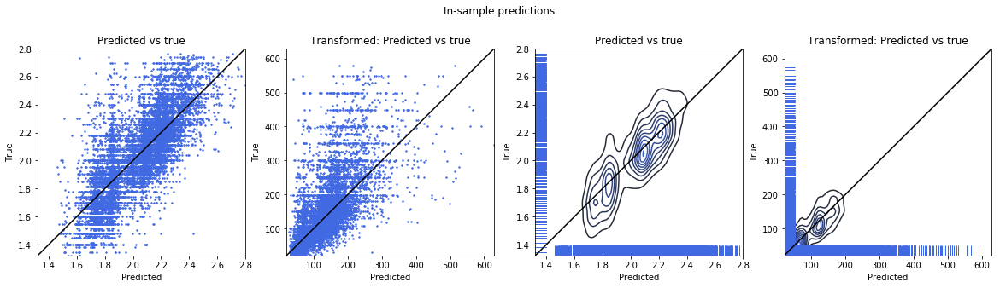

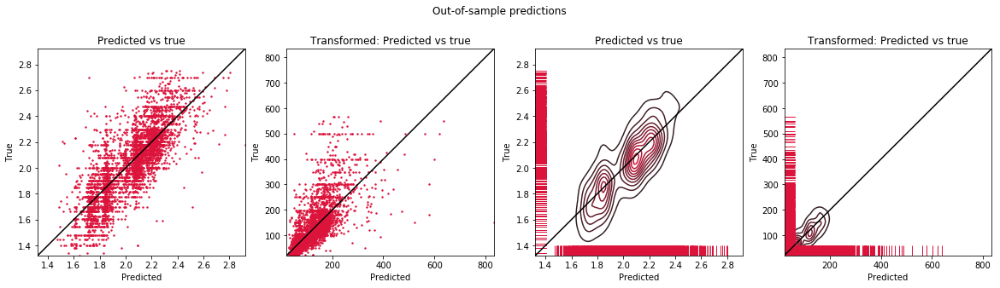

In [275]:
train_tpl = (X_train_base, y_train_base)
test_tpl = (X_test_base, y_test_base)
base = print_results('linear_regression_base.p', test_tpl, train_tpl, 'both', True)

In [276]:
df = pd.DataFrame(data={'Coefficient': list(base['fitted_model'].coef_)})
df.index = [c for c in list(train_base.columns) if c != 'Air_log_price']
df

,Coefficient
Air_calculated_host_listings_count,-0.000134
Air_bathrooms,0.041846
Air_beds,-0.003577
Air_bedrooms,0.071544
Air_accommodates,0.017561
Air_extra_people,0.000388
Air_guests_included,0.005790
Air_distance_to_CBD,-0.003803
Air_property_type_2_House_Cottage_Villa,0.009814
Air_property_type_2_Other,0.056793


To get a better overview over the relevance of the variables the model is also estimated with `statsmodels`. We see from the output that there might be an issue with muliticollinearity which can results in biased coefficients and uncorrect error estimations but this is not a huge problem in our case since we are mainly interested in predictions.

In [277]:
X, y = prepare_datasets(X_train_base, y_train_base)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_base.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
base_sm = sm.OLS(y, X).fit()
print(base_sm.summary())

                            OLS Regression Results                            
Dep. Variable:          Air_log_price   R-squared:                       0.607
Model:                            OLS   Adj. R-squared:                  0.606
Method:                 Least Squares   F-statistic:                     499.3
Date:                Wed, 08 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:09:56   Log-Likelihood:                 5137.2
No. Observations:               14266   AIC:                        -1.018e+04
Df Residuals:                   14221   BIC:                            -9844.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

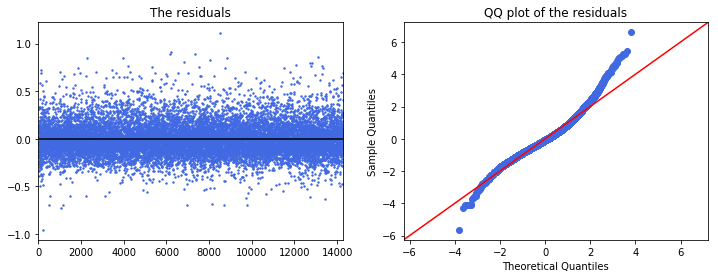

In [278]:
mean = np.mean(base_sm.resid)
fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].scatter(x=range(base_sm.resid.shape[0]), y=base_sm.resid, alpha=1, s=2, color=col1)
ax[0].set_title("The residuals")
ax[0].axhline(mean, color='black')
ax[0].set_xlim(0, base_sm.resid.shape[0])
stdized = (base_sm.resid - np.mean(base_sm.resid)) / np.std(base_sm.resid)
sm.qqplot(stdized, line='45', color=col1, ax=ax[1])
ax[1].set_title("QQ plot of the residuals");

**1. Linear regression**

*Aggregation by suburbs*

For this model we add `Air_log_price_suburb_same_room_type` to the baseline model. **All subsequent model are built by the same logic.**

Untransformed
-------------
R2 train: 0.61 / RMSE train 0.17 / MAE train 0.13 / Nobs: 14261
R2 test: 0.63 / RMSE test 0.16 / MAE test 0.12 / Nobs: 4451

Transformed
-----------
R2 train: 0.48 / RMSE train 62.05 / MAE train 37.72 / Nobs: 14261
R2 test: 0.49 / RMSE test 61.13 / MAE test 36.77 / Nobs: 4451



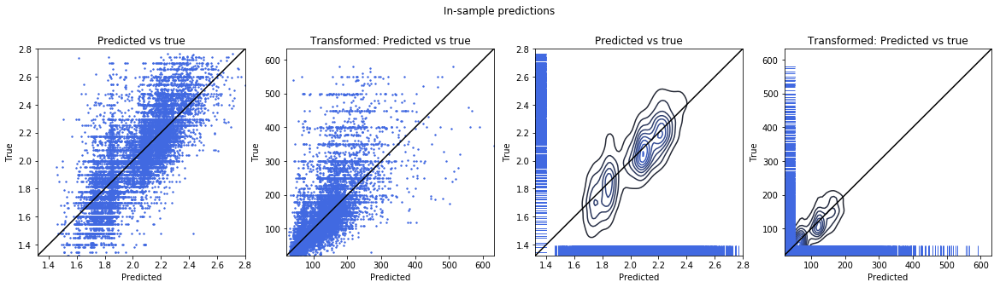

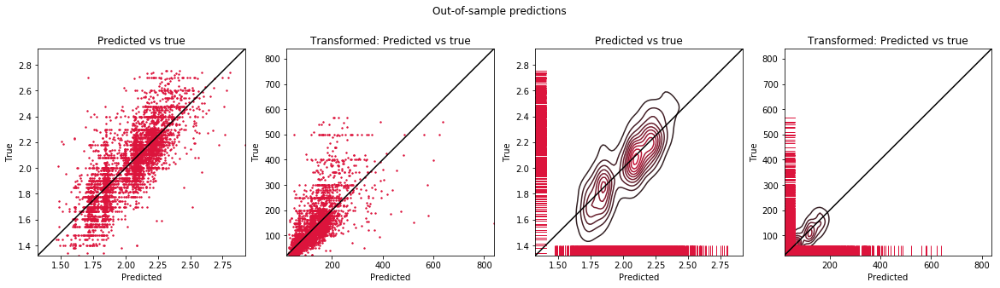

In [279]:
train_tpl = (X_train_suburb, y_train_suburb)
test_tpl = (X_test_suburb, y_test_suburb)
lin_reg_suburb = print_results('linear_regression_suburbs.p', test_tpl, train_tpl, 'both', True)

In [280]:
#lin_reg_suburb['fitted_model'].coef_
df = pd.DataFrame(data={'Coefficient': list(lin_reg_suburb['fitted_model'].coef_)})
df.index = [c for c in list(train_suburb.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_suburb_same_room_type,-0.013365
Air_calculated_host_listings_count,-0.000135
Air_bathrooms,0.041762
Air_beds,-0.003760
Air_bedrooms,0.071661
Air_accommodates,0.017751
Air_extra_people,0.000388
Air_guests_included,0.005731
Air_distance_to_CBD,-0.003750
Air_property_type_2_House_Cottage_Villa,0.009588


Again, we take a look at the results obtained from the `statsmodels` package. We see that the new variable `Air_log_price_suburb_same_room_type` is not significant. This is not surprising since all or at least a lot of information of this new variable is already covered by `Air_neighbourhood_cleansed` and `Air_room_type`.

<!--- However, `Air_room_type` is no longer significant and the coefficient of the intercept is smaller than in the baseline model. This is reasonable since most of the information of the intercept and of `Air_room_type` is now stored in `Air_log_price_suburb_same_room_type`. However, the new approach is different to the baseline by aggregating the log airbnb for the different suburbs w.r.t the different room types. This has a positive effect on the accuracy of the prediction. 
--->

`statsmodels` throws a again a warning that there might be a multicollinearity problem, which could lead to biased coefficient and error estimations. Therefore, coefficients and errors might be wrong and so the conclusion that the variable `Air_log_price_suburb_same_room_type` is not really relevant.

<!--- In the next cell, we solve this problem and one can see that coefficient of `Air_log_price_suburb_same_room_type` is only slightly affected. Thus, this new variable seems to be important.
--->

In [281]:
X, y = prepare_datasets(X_train_suburb, y_train_suburb)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_suburb.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
lin_reg_suburb_sm = sm.OLS(y, X).fit()
print(lin_reg_suburb_sm.summary())

                            OLS Regression Results                            
Dep. Variable:          Air_log_price   R-squared:                       0.607
Model:                            OLS   Adj. R-squared:                  0.606
Method:                 Least Squares   F-statistic:                     488.8
Date:                Wed, 08 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:10:33   Log-Likelihood:                 5144.2
No. Observations:               14261   AIC:                        -1.020e+04
Df Residuals:                   14215   BIC:                            -9848.
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

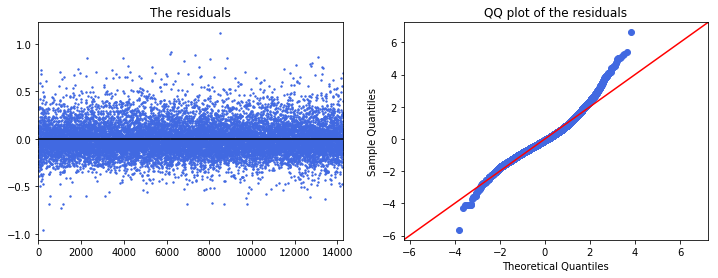

In [282]:
mean = np.mean(lin_reg_suburb_sm.resid)
fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].scatter(x=range(lin_reg_suburb_sm.resid.shape[0]), y=lin_reg_suburb_sm.resid, alpha=1, s=2, color=col1)
ax[0].set_title("The residuals")
ax[0].axhline(mean, color='black')
ax[0].set_xlim(0, lin_reg_suburb_sm.resid.shape[0])
stdized = (lin_reg_suburb_sm.resid - np.mean(lin_reg_suburb_sm.resid)) / np.std(lin_reg_suburb_sm.resid)
sm.qqplot(stdized, line='45', color=col1, ax=ax[1])
ax[1].set_title("QQ plot of the residuals");

*Constructed aggregation - 500m*

Untransformed
-------------
R2 train: 0.63 / RMSE train 0.16 / MAE train 0.12 / Nobs: 13230
R2 test: 0.64 / RMSE test 0.16 / MAE test 0.12 / Nobs: 3739

Transformed
-----------
R2 train: 0.50 / RMSE train 60.72 / MAE train 36.82 / Nobs: 13230
R2 test: 0.51 / RMSE test 60.33 / MAE test 36.13 / Nobs: 3739



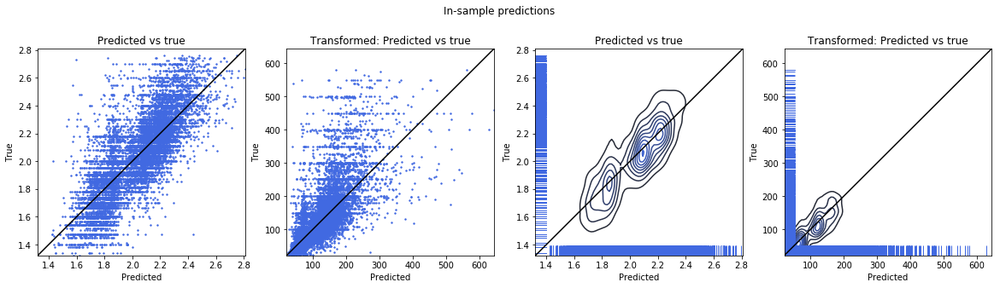

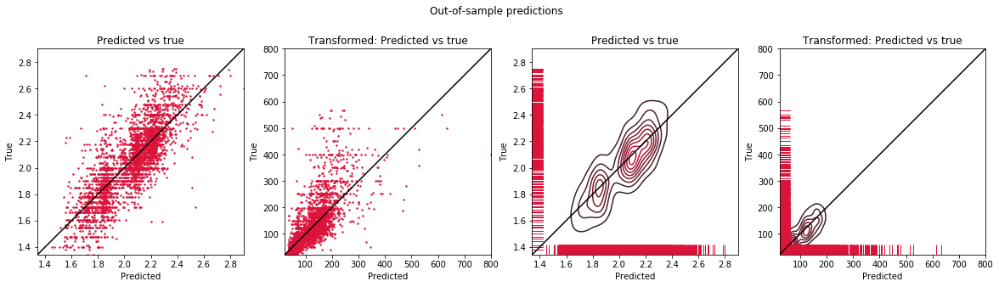

In [283]:
train_tpl = (X_train_500m, y_train_500m)
test_tpl = (X_test_500m, y_test_500m)
lin_reg_500m = print_results('linear_regression_500m.p', test_tpl, train_tpl, 'both', True)

In [284]:
df = pd.DataFrame(data={'Coefficient': list(lin_reg_500m['fitted_model'].coef_)})
df.index = [c for c in list(train_500m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_500m_same_room_type,0.347770
Air_calculated_host_listings_count,-0.000149
Air_bathrooms,0.039777
Air_beds,-0.002011
Air_bedrooms,0.071294
Air_accommodates,0.015253
Air_extra_people,0.000321
Air_guests_included,0.005978
Air_distance_to_CBD,-0.004445
Air_property_type_2_House_Cottage_Villa,0.018695


In contrast to `Air_log_price_suburb_same_room_type`, the variable `Air_log_price_500m_same_room_type` seems to add information to the model since it is highly signifcant. The sign of the coefficient is positive which perfectly fits to our expectation that airbnb prices are higher when neigbouring accommodations costs more and vice versa. `statsmodels` throws again a warning that there might be a multicollinearity problem.

In [285]:
X, y = prepare_datasets(X_train_500m, y_train_500m)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_500m.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
lin_reg_500m_sm = sm.OLS(y, X).fit()
print(lin_reg_500m_sm.summary())

                            OLS Regression Results                            
Dep. Variable:          Air_log_price   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     492.9
Date:                Wed, 08 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:11:04   Log-Likelihood:                 5286.5
No. Observations:               13230   AIC:                        -1.048e+04
Df Residuals:                   13184   BIC:                        -1.014e+04
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

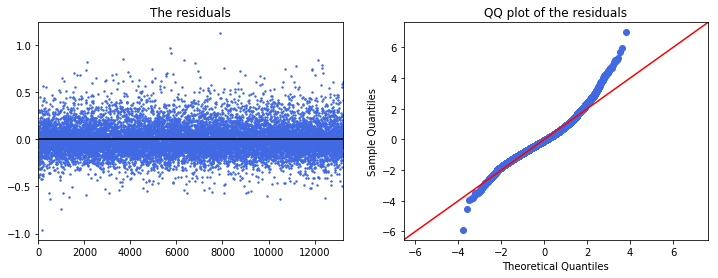

In [286]:
mean = np.mean(lin_reg_500m_sm.resid)
fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].scatter(x=range(lin_reg_500m_sm.resid.shape[0]), y=lin_reg_500m_sm.resid, alpha=1, s=2, color=col1)
ax[0].set_title("The residuals")
ax[0].axhline(mean, color='black')
ax[0].set_xlim(0, lin_reg_500m_sm.resid.shape[0])
stdized = (lin_reg_500m_sm.resid - np.mean(lin_reg_500m_sm.resid)) / np.std(lin_reg_500m_sm.resid)
sm.qqplot(stdized, line='45', color=col1, ax=ax[1])
ax[1].set_title("QQ plot of the residuals");

*Constructed aggregation - 100m*

Untransformed
-------------
R2 train: 0.61 / RMSE train 0.15 / MAE train 0.11 / Nobs: 9203
R2 test: 0.62 / RMSE test 0.14 / MAE test 0.11 / Nobs: 2177

Transformed
-----------
R2 train: 0.49 / RMSE train 59.29 / MAE train 36.10 / Nobs: 9203
R2 test: 0.52 / RMSE test 53.67 / MAE test 34.18 / Nobs: 2177



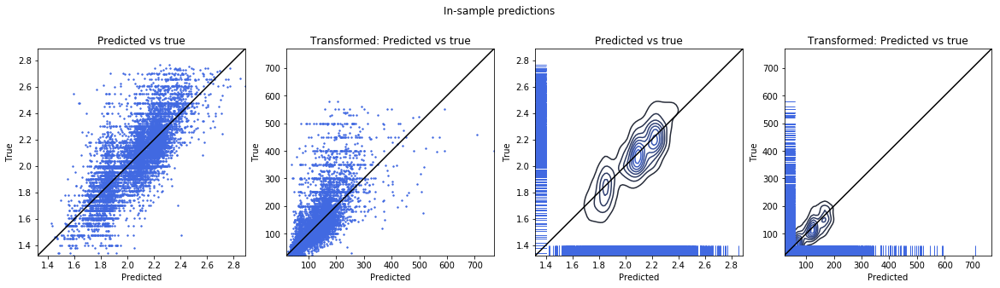

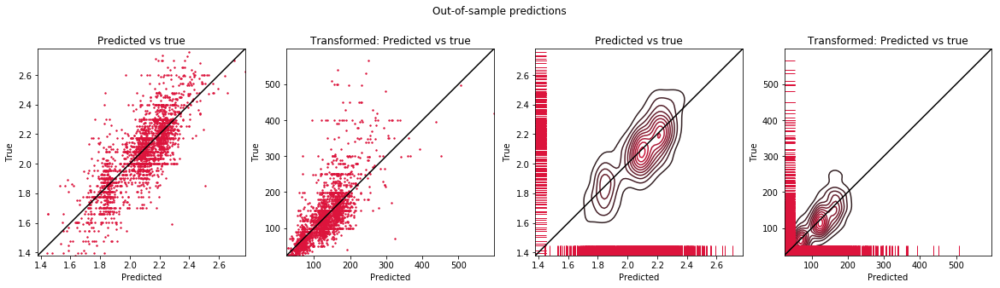

In [287]:
train_tpl = (X_train_100m, y_train_100m)
test_tpl = (X_test_100m, y_test_100m)
lin_reg_100m = print_results('linear_regression_100m.p', test_tpl, train_tpl, 'both', True)

In [288]:
lin_reg_100m['fitted_model'].coef_
df = pd.DataFrame(data={'Coefficient': list(lin_reg_100m['fitted_model'].coef_)})
df.index = [c for c in list(train_100m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_100m_same_room_type,0.242209
Air_calculated_host_listings_count,-0.000218
Air_bathrooms,0.041013
Air_beds,0.003598
Air_bedrooms,0.082786
Air_accommodates,0.009494
Air_extra_people,0.000354
Air_guests_included,0.004541
Air_distance_to_CBD,-0.007401
Air_property_type_2_House_Cottage_Villa,0.007908


In [289]:
X, y = prepare_datasets(X_train_100m, y_train_100m)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_100m.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
lin_reg_100m_sm = sm.OLS(y, X).fit()
print(lin_reg_100m_sm.summary())

                            OLS Regression Results                            
Dep. Variable:          Air_log_price   R-squared:                       0.614
Model:                            OLS   Adj. R-squared:                  0.612
Method:                 Least Squares   F-statistic:                     323.2
Date:                Wed, 08 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:11:29   Log-Likelihood:                 4186.1
No. Observations:                9203   AIC:                            -8280.
Df Residuals:                    9157   BIC:                            -7952.
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

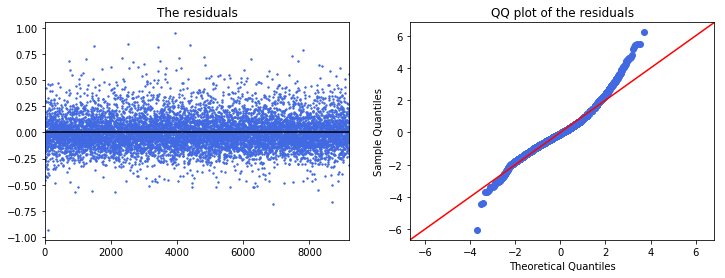

In [290]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].scatter(x=range(lin_reg_100m_sm.resid.shape[0]), y=lin_reg_100m_sm.resid, alpha=1, s=2, color=col1)
ax[0].set_title("The residuals")
ax[0].axhline(mean, color="black")
ax[0].set_xlim(0, lin_reg_100m_sm.resid.shape[0]) 
stdized = (lin_reg_100m_sm.resid - np.mean(lin_reg_100m_sm.resid)) / np.std(lin_reg_100m_sm.resid)
sm.qqplot(stdized, line='45', color=col1, ax=ax[1])
ax[1].set_title("QQ plot of the residuals");

*Constructed aggregation - 50m*

Untransformed
-------------
R2 train: 0.59 / RMSE train 0.15 / MAE train 0.11 / Nobs: 6522
R2 test: 0.62 / RMSE test 0.14 / MAE test 0.10 / Nobs: 1340

Transformed
-----------
R2 train: 0.47 / RMSE train 58.91 / MAE train 35.92 / Nobs: 6522
R2 test: 0.51 / RMSE test 50.96 / MAE test 32.90 / Nobs: 1340



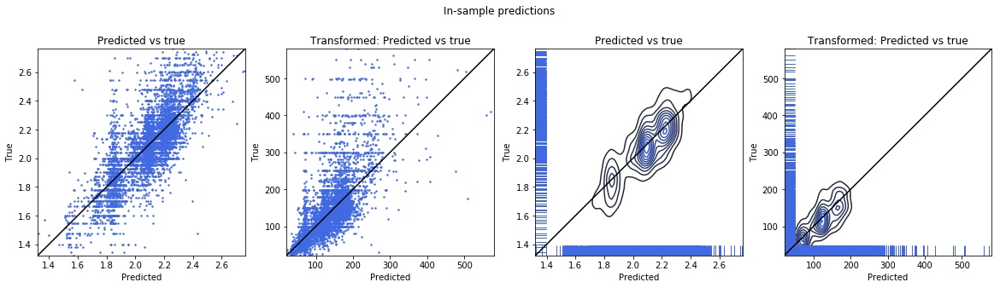

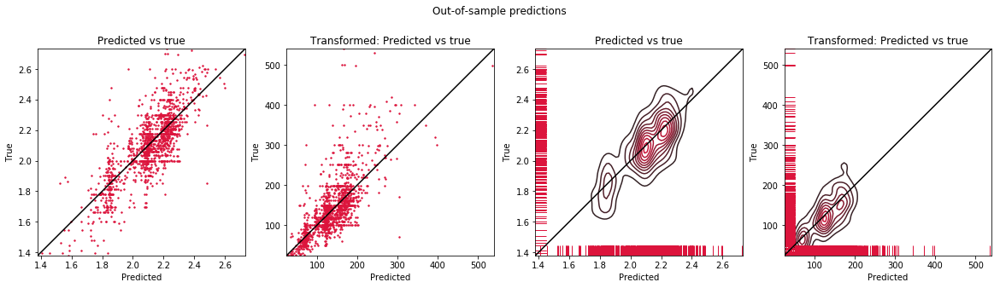

In [291]:
train_tpl = (X_train_50m, y_train_50m)
test_tpl = (X_test_50m, y_test_50m)
lin_reg_50m = print_results('linear_regression_50m.p', test_tpl, train_tpl, 'both', True)

In [292]:
lin_reg_50m['fitted_model'].coef_
df = pd.DataFrame(data={'Coefficient': list(lin_reg_50m['fitted_model'].coef_)})
df.index = [c for c in list(train_50m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_50m_same_room_type,0.129834
Air_calculated_host_listings_count,-0.000268
Air_bathrooms,0.043615
Air_beds,0.005969
Air_bedrooms,0.087004
Air_accommodates,0.005878
Air_extra_people,0.000401
Air_guests_included,0.005479
Air_distance_to_CBD,-0.009030
Air_property_type_2_House_Cottage_Villa,0.007927


In [293]:
X, y = prepare_datasets(X_train_50m, y_train_50m)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_50m.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
lin_reg_50m_sm = sm.OLS(y, X).fit()
print(lin_reg_50m_sm.summary())

                            OLS Regression Results                            
Dep. Variable:          Air_log_price   R-squared:                       0.593
Model:                            OLS   Adj. R-squared:                  0.590
Method:                 Least Squares   F-statistic:                     209.9
Date:                Wed, 08 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:11:47   Log-Likelihood:                 3186.8
No. Observations:                6522   AIC:                            -6282.
Df Residuals:                    6476   BIC:                            -5970.
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

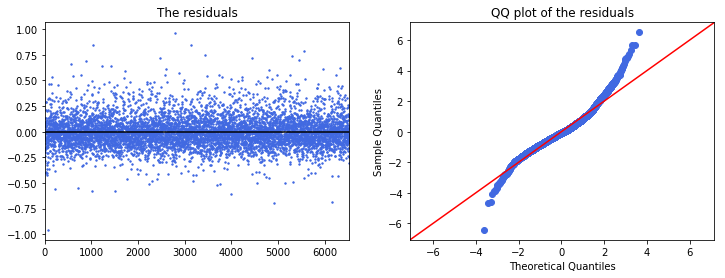

In [294]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
mean = np.mean(lin_reg_50m_sm.resid)
ax[0].scatter(x=range(lin_reg_50m_sm.resid.shape[0]), y=lin_reg_50m_sm.resid, alpha=1, s=2, color=col1)
ax[0].set_title("The residuals")
ax[0].axhline(mean, color="black")
ax[0].set_xlim(0, lin_reg_50m_sm.resid.shape[0])
stdized = (lin_reg_50m_sm.resid - np.mean(lin_reg_50m_sm.resid)) / np.std(lin_reg_50m_sm.resid)
sm.qqplot(stdized, line='45', color=col1, ax=ax[1])
ax[1].set_title("QQ plot of the residuals");

**2. Huber loss regression**

Huber regression has a regularization parameter $\alpha$ and a parameter $\epsilon$ that controls for the robustness. Since we use regularization the approach is usually to standardize the features to put equal weights on them (https://stats.stackexchange.com/questions/86434/is-standardisation-before-lasso-really-necessary). The data is therefore standardized before the estimation. A validation set is used to fine-tune the hyper-parameters.

*Aggregation by suburbs*

Untransformed
-------------
R2 train: 0.60 / RMSE train 0.17 / MAE train 0.13 / Nobs: 14261
R2 test: 0.62 / RMSE test 0.16 / MAE test 0.12 / Nobs: 4451

Transformed
-----------
R2 train: 0.47 / RMSE train 62.94 / MAE train 37.52 / Nobs: 14261
R2 test: 0.48 / RMSE test 61.85 / MAE test 36.66 / Nobs: 4451



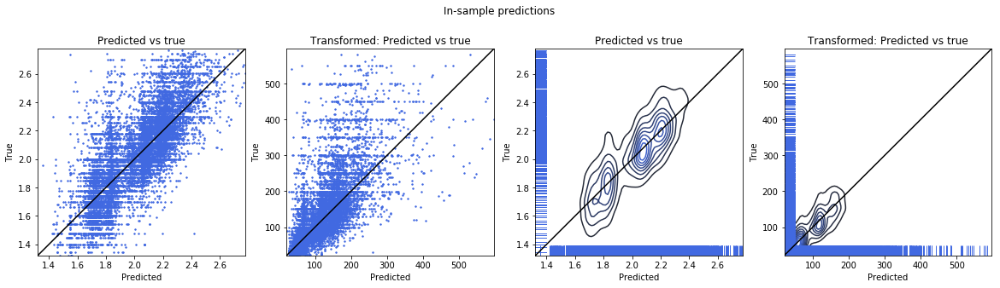

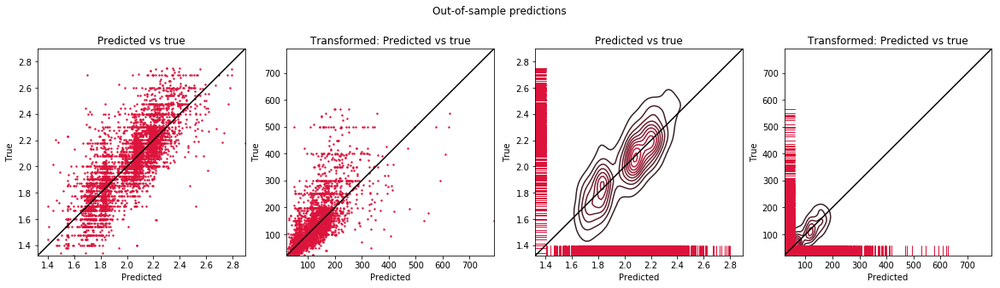

In [295]:
train_tpl = (X_train_suburb, y_train_suburb)
test_tpl = (X_test_suburb, y_test_suburb)
huber_suburb = print_results('Huber_regression_suburbs.p', test_tpl, train_tpl, 'both', True)

In [296]:
best_params = huber_suburb['fitted_model'].best_params_
best_params

{'huber__alpha': 0.0001, 'huber__epsilon': 1}

Next, we create a model with the best parameters and extract the model coefficients.

In [297]:
X_train, y_train = prepare_datasets(X_train_suburb, y_train_suburb)
regr = HuberRegressor(alpha=best_params['huber__alpha'], epsilon=best_params['huber__epsilon'])
model = Pipeline([('scaler', StandardScaler()), ('huber', regr)])
model.fit(X_train, y_train)
# https://stackoverflow.com/questions/28822756/getting-model-attributes-from-scikit-learn-pipeline/28837740
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_suburb.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_suburb_same_room_type,0.005027
Air_calculated_host_listings_count,-0.003200
Air_bathrooms,0.021617
Air_beds,-0.001166
Air_bedrooms,0.066234
Air_accommodates,0.035110
Air_extra_people,0.003516
Air_guests_included,0.006639
Air_distance_to_CBD,-0.048211
Air_property_type_2_House_Cottage_Villa,0.005307


`statsmodels`' Huber regression coefficients are **different** to `sklearn`'s. We also notice that there are no parameters like `alpha` and `epsilon`. 

In [298]:
X, y = prepare_datasets(X_train_suburb, y_train_suburb)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_suburb.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
huber_suburb_sm = sm.RLM(y, X, M=sm.robust.norms.HuberT()).fit()
print(huber_suburb_sm.summary())

                    Robust linear Model Regression Results                    
Dep. Variable:          Air_log_price   No. Observations:                14261
Model:                            RLM   Df Residuals:                    14215
Method:                          IRLS   Df Model:                           45
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 08 Jul 2020                                         
Time:                        19:12:29                                         
No. Iterations:                    24                                         
                                                   coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

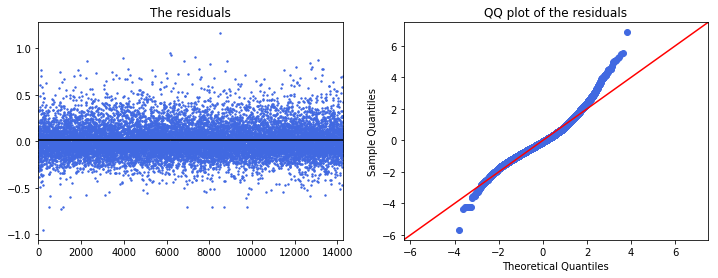

In [299]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
mean = np.mean(huber_suburb_sm.resid)
ax[0].scatter(x=range(huber_suburb_sm.resid.shape[0]), y=huber_suburb_sm.resid, alpha=1, s=2, color=col1)
ax[0].set_title("The residuals")
ax[0].axhline(mean, color="black")
ax[0].set_xlim(0, huber_suburb_sm.resid.shape[0])
stdized = (huber_suburb_sm.resid - np.mean(huber_suburb_sm.resid)) / np.std(huber_suburb_sm.resid)
sm.qqplot(stdized, line='45', color=col1, ax=ax[1])
ax[1].set_title("QQ plot of the residuals");

*Constructed aggregation - 500m*

Untransformed
-------------
R2 train: 0.62 / RMSE train 0.16 / MAE train 0.12 / Nobs: 13230
R2 test: 0.64 / RMSE test 0.16 / MAE test 0.12 / Nobs: 3739

Transformed
-----------
R2 train: 0.49 / RMSE train 61.46 / MAE train 36.65 / Nobs: 13230
R2 test: 0.50 / RMSE test 60.84 / MAE test 35.88 / Nobs: 3739



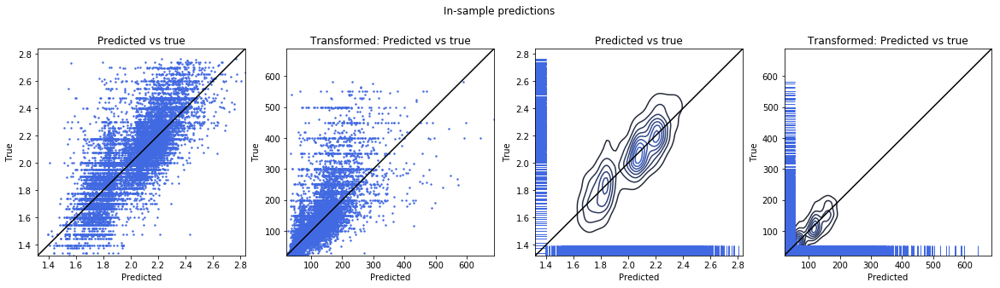

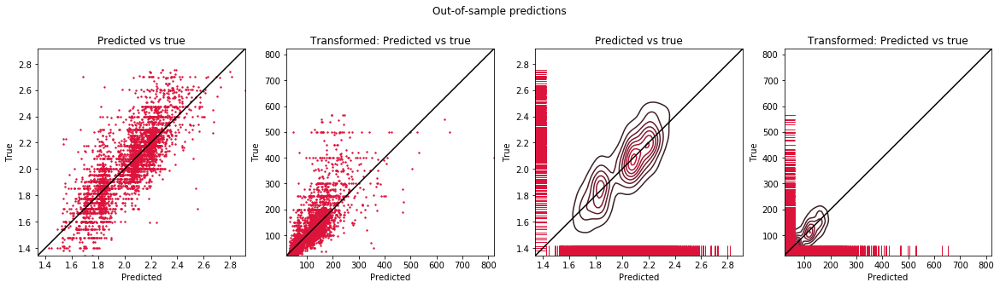

In [300]:
train_tpl = (X_train_500m, y_train_500m)
test_tpl = (X_test_500m, y_test_500m)
huber_500m = print_results('Huber_regression_500m.p', test_tpl, train_tpl, 'both', True)

In [301]:
best_params = huber_500m['fitted_model'].best_params_
best_params

{'huber__alpha': 0.001, 'huber__epsilon': 1}

Again, we extract the coefficients.

In [302]:
X_train, y_train = prepare_datasets(X_train_500m, y_train_500m)
regr = HuberRegressor(alpha=best_params['huber__alpha'], epsilon=best_params['huber__epsilon'])
model = Pipeline([('scaler', StandardScaler()), ('huber', regr)])
model.fit(X_train, y_train)
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_500m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_500m_same_room_type,0.071056
Air_calculated_host_listings_count,-0.003406
Air_bathrooms,0.020964
Air_beds,-0.000405
Air_bedrooms,0.065059
Air_accommodates,0.029266
Air_extra_people,0.003906
Air_guests_included,0.006065
Air_distance_to_CBD,-0.051336
Air_property_type_2_House_Cottage_Villa,0.009909


A comparison with `statsmodels`'s values is is shown below. **The values differ from the ones from sklearn.**

In [303]:
X, y = prepare_datasets(X_train_500m, y_train_500m)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_500m.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
huber_500m_sm = sm.RLM(y, X, M=sm.robust.norms.HuberT()).fit()
print(huber_500m_sm.summary())

                    Robust linear Model Regression Results                    
Dep. Variable:          Air_log_price   No. Observations:                13230
Model:                            RLM   Df Residuals:                    13184
Method:                          IRLS   Df Model:                           45
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 08 Jul 2020                                         
Time:                        19:13:27                                         
No. Iterations:                    25                                         
                                                   coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

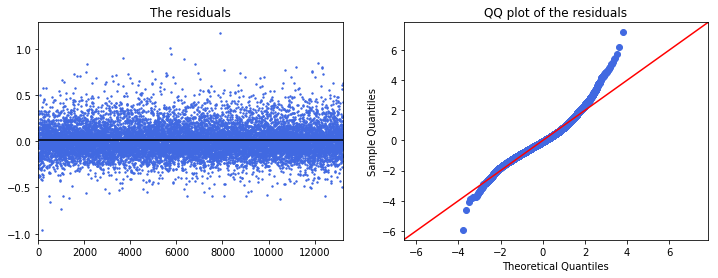

In [304]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
mean = np.mean(huber_500m_sm.resid)
ax[0].scatter(x=range(huber_500m_sm.resid.shape[0]), y=huber_500m_sm.resid, alpha=1, s=2, color=col1)
ax[0].set_title("The residuals")
ax[0].axhline(mean, color="black")
ax[0].set_xlim(0, huber_500m_sm.resid.shape[0])
stdized = (huber_500m_sm.resid - np.mean(huber_500m_sm.resid)) / np.std(huber_500m_sm.resid)
sm.qqplot(stdized, line='45', color=col1, ax=ax[1])
ax[1].set_title("QQ plot of the residuals");

*Constructed aggregation - 100m*

Untransformed
-------------
R2 train: 0.61 / RMSE train 0.15 / MAE train 0.11 / Nobs: 9203
R2 test: 0.62 / RMSE test 0.14 / MAE test 0.11 / Nobs: 2177

Transformed
-----------
R2 train: 0.48 / RMSE train 60.00 / MAE train 35.94 / Nobs: 9203
R2 test: 0.51 / RMSE test 54.12 / MAE test 34.01 / Nobs: 2177



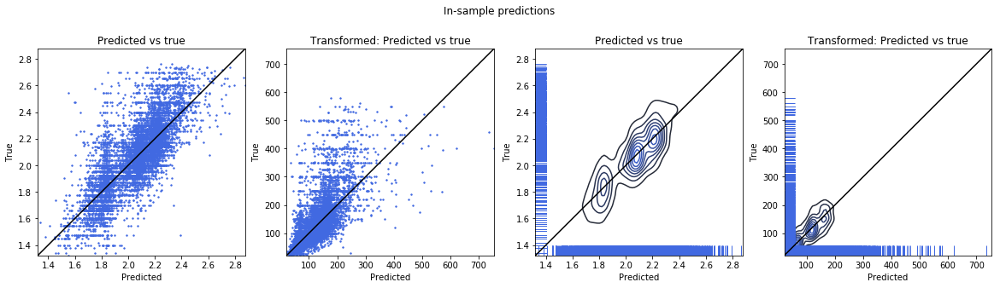

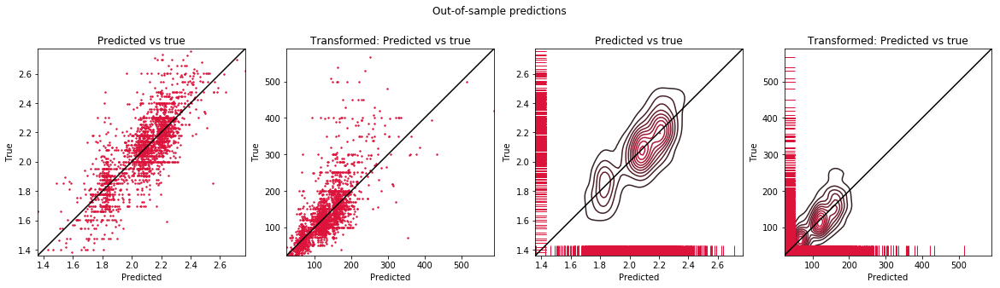

In [305]:
train_tpl = (X_train_100m, y_train_100m)
test_tpl = (X_test_100m, y_test_100m)
huber_100m = print_results('Huber_regression_100m.p', test_tpl, train_tpl, 'both', True)

In [306]:
best_params = huber_100m['fitted_model'].best_params_
best_params

{'huber__alpha': 0.0001, 'huber__epsilon': 1}

In [307]:
X_train, y_train = prepare_datasets(X_train_100m, y_train_100m)
regr = HuberRegressor(alpha=best_params['huber__alpha'], epsilon=best_params['huber__epsilon'])
model = Pipeline([('scaler', StandardScaler()), ('huber', regr)])
model.fit(X_train, y_train)
# https://stackoverflow.com/questions/28822756/getting-model-attributes-from-scikit-learn-pipeline/28837740
model.steps[1][1].coef_
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_100m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_100m_same_room_type,0.050610
Air_calculated_host_listings_count,-0.004550
Air_bathrooms,0.021518
Air_beds,0.004303
Air_bedrooms,0.063628
Air_accommodates,0.020474
Air_extra_people,0.002806
Air_guests_included,0.005354
Air_distance_to_CBD,-0.053251
Air_property_type_2_House_Cottage_Villa,0.004976


A comparison with `statsmodels`'s values is is shown below. **The values differ from the ones from sklearn.**

In [308]:
X, y = prepare_datasets(X_train_100m, y_train_100m)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_100m.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
huber_100m_sm = sm.RLM(y, X, M=sm.robust.norms.HuberT()).fit()
print(huber_100m_sm.summary())

                    Robust linear Model Regression Results                    
Dep. Variable:          Air_log_price   No. Observations:                 9203
Model:                            RLM   Df Residuals:                     9157
Method:                          IRLS   Df Model:                           45
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 08 Jul 2020                                         
Time:                        19:14:04                                         
No. Iterations:                    22                                         
                                                   coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

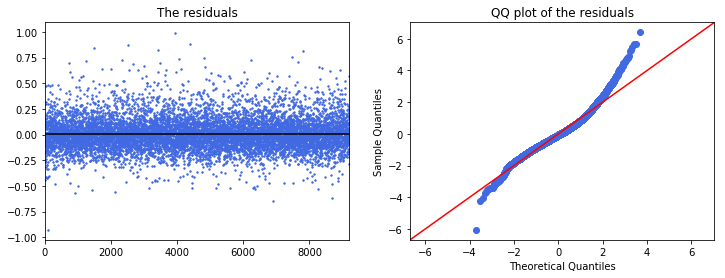

In [309]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
mean = np.mean(huber_100m_sm.resid)
ax[0].scatter(x=range(huber_100m_sm.resid.shape[0]), y=huber_100m_sm.resid, alpha=1, s=2, color=col1)
ax[0].set_title("The residuals")
ax[0].axhline(mean, color="black")
ax[0].set_xlim(0, huber_100m_sm.resid.shape[0])
stdized = (huber_100m_sm.resid - np.mean(huber_100m_sm.resid)) / np.std(huber_100m_sm.resid)
sm.qqplot(stdized, line='45', color=col1, ax=ax[1])
ax[1].set_title("QQ plot of the residuals");

*Constructed aggregation - 50m*

Untransformed
-------------
R2 train: 0.59 / RMSE train 0.15 / MAE train 0.11 / Nobs: 6522
R2 test: 0.62 / RMSE test 0.14 / MAE test 0.10 / Nobs: 1340

Transformed
-----------
R2 train: 0.45 / RMSE train 59.75 / MAE train 35.71 / Nobs: 6522
R2 test: 0.50 / RMSE test 51.53 / MAE test 32.66 / Nobs: 1340



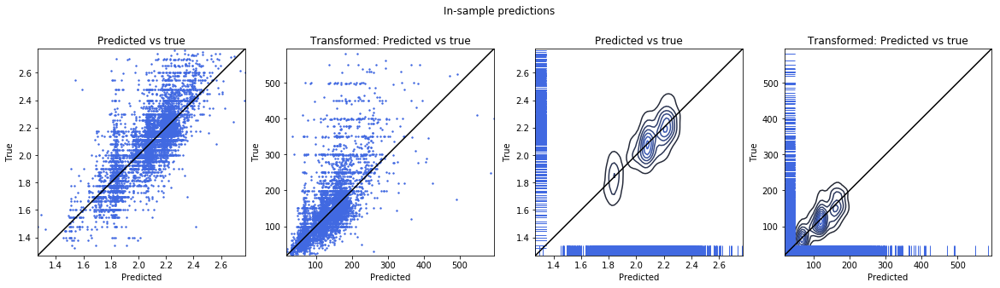

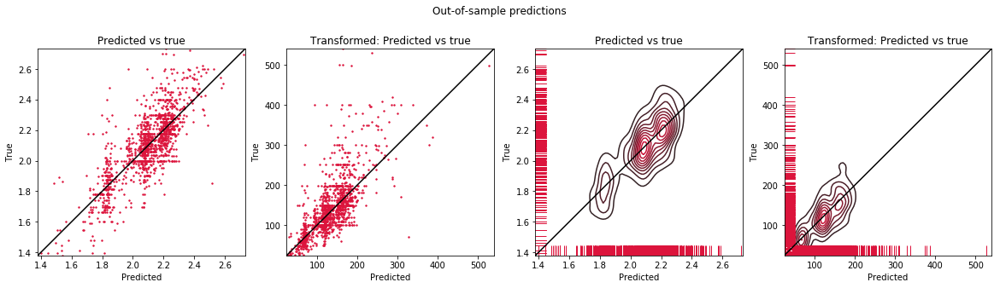

In [310]:
train_tpl = (X_train_50m, y_train_50m)
test_tpl = (X_test_50m, y_test_50m)
huber_50m = print_results('Huber_regression_50m.p', test_tpl, train_tpl, 'both', True)

In [311]:
best_params = huber_50m['fitted_model'].best_params_
best_params

{'huber__alpha': 1.0, 'huber__epsilon': 1}

In [312]:
X_train, y_train = prepare_datasets(X_train_50m, y_train_50m)
regr = HuberRegressor(alpha=best_params['huber__alpha'], epsilon=best_params['huber__epsilon'])
model = Pipeline([('scaler', StandardScaler()), ('huber', regr)])
model.fit(X_train, y_train)
# https://stackoverflow.com/questions/28822756/getting-model-attributes-from-scikit-learn-pipeline/28837740
model.steps[1][1].coef_
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_50m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_50m_same_room_type,0.025290
Air_calculated_host_listings_count,-0.004081
Air_bathrooms,0.024187
Air_beds,0.007393
Air_bedrooms,0.064319
Air_accommodates,0.015954
Air_extra_people,0.003901
Air_guests_included,0.005371
Air_distance_to_CBD,-0.043499
Air_property_type_2_House_Cottage_Villa,0.000837


A comparison with `statsmodels`'s values is is shown below. **The values differ from the ones from sklearn.**

In [313]:
X, y = prepare_datasets(X_train_50m, y_train_50m)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_50m.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
huber_50m_sm = sm.RLM(y, X, M=sm.robust.norms.HuberT()).fit()
print(huber_50m_sm.summary())

                    Robust linear Model Regression Results                    
Dep. Variable:          Air_log_price   No. Observations:                 6522
Model:                            RLM   Df Residuals:                     6476
Method:                          IRLS   Df Model:                           45
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 08 Jul 2020                                         
Time:                        19:14:27                                         
No. Iterations:                    31                                         
                                                   coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

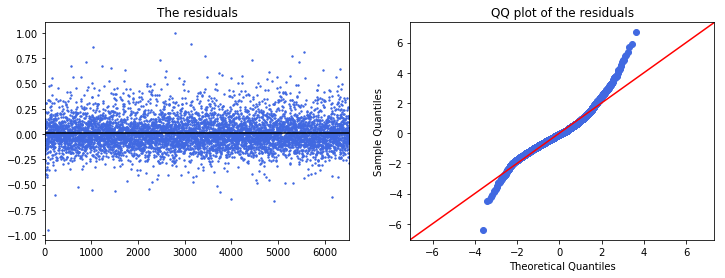

In [314]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
mean = np.mean(huber_50m_sm.resid)
ax[0].scatter(x=range(huber_50m_sm.resid.shape[0]), y=huber_50m_sm.resid, alpha=1, s=2, color=col1)
ax[0].set_title("The residuals")
ax[0].axhline(mean, color="black")
ax[0].set_xlim(0, huber_50m_sm.resid.shape[0])
stdized = (huber_50m_sm.resid - np.mean(huber_50m_sm.resid)) / np.std(huber_50m_sm.resid)
sm.qqplot(stdized, line='45', color=col1, ax=ax[1])
ax[1].set_title("QQ plot of the residuals");

**3. Lasso and Ridge regression**

As the Huber model, Ridge and Lasso have a regularization parameter $\alpha$. We therefore standardize the features and use a validation set to fine-tune the hyperparameter as in the Huber regression case.

*Aggregation by suburbs*

Lasso

Untransformed
-------------
R2 train: 0.61 / RMSE train 0.17 / MAE train 0.13 / Nobs: 14261
R2 test: 0.63 / RMSE test 0.16 / MAE test 0.12 / Nobs: 4451

Transformed
-----------
R2 train: 0.48 / RMSE train 62.20 / MAE train 37.77 / Nobs: 14261
R2 test: 0.49 / RMSE test 61.00 / MAE test 36.76 / Nobs: 4451



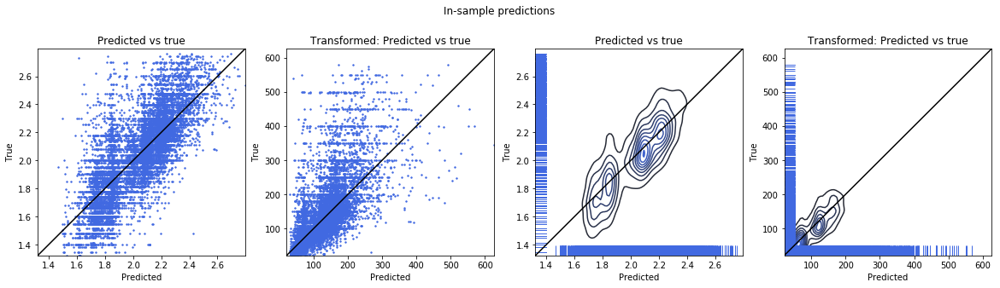

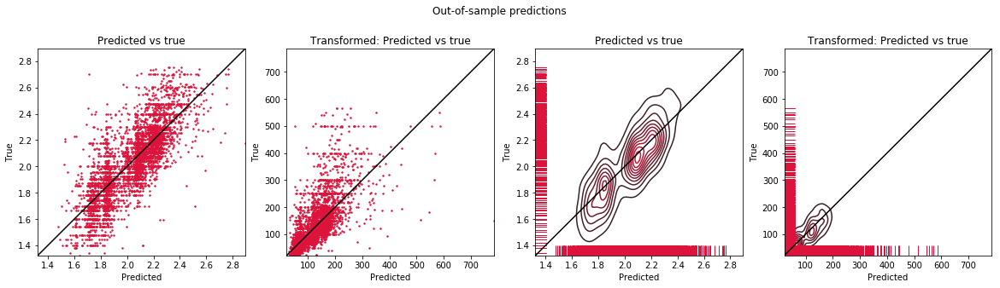

In [315]:
train_tpl = (X_train_suburb, y_train_suburb)
test_tpl = (X_test_suburb, y_test_suburb)
lasso_suburb = print_results('Lasso_suburbs.p', test_tpl, train_tpl, 'both', True)

In [316]:
best_params = lasso_suburb['fitted_model'].best_params_
best_params

{'lasso__alpha': 0.0001}

In [317]:
X_train, y_train = prepare_datasets(X_train_suburb, y_train_suburb)
regr = linear_model.Lasso(alpha=best_params['lasso__alpha'])
model = Pipeline([('scaler', StandardScaler()), ('lasso', regr)])
model.fit(X_train, y_train)
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_suburb.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_suburb_same_room_type,0.006579
Air_calculated_host_listings_count,-0.001897
Air_bathrooms,0.021886
Air_beds,-0.004917
Air_bedrooms,0.062399
Air_accommodates,0.037406
Air_extra_people,0.008077
Air_guests_included,0.007515
Air_distance_to_CBD,-0.038005
Air_property_type_2_House_Cottage_Villa,0.003841


We also take a look at the output of `statsmodels`. Currently no standard errors and p-values are returned (work in progress, https://github.com/statsmodels/statsmodels/issues/3670). The estimated coefficients are different to the `sklearn` implementation.

In [318]:
X, y = prepare_datasets(X_train_suburb, y_train_suburb)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X = pd.DataFrame(X)
y = pd.DataFrame(y)
X.columns = [c for c in train_suburb.columns if c != 'Air_log_price']
y.columns = ['Air_log_price']
X = sm.add_constant(X)
lasso_suburb_sm = sm.OLS(y,X).fit_regularized(alpha=best_params['lasso__alpha'])
print(lasso_suburb_sm.summary())

None


In [319]:
print(lasso_suburb_sm.params)

const                                           2.033149
Air_log_price_suburb_same_room_type             0.073589
Air_calculated_host_listings_count              0.000000
Air_bathrooms                                   0.021687
Air_beds                                       -0.005619
Air_bedrooms                                    0.061326
Air_accommodates                                0.037889
Air_extra_people                                0.008477
Air_guests_included                             0.007419
Air_distance_to_CBD                            -0.037609
Air_property_type_2_House_Cottage_Villa         0.003771
Air_property_type_2_Other                       0.014951
Air_property_type_2_Townhouse                   0.006146
Air_room_type_Private room                     -0.047096
Air_room_type_Shared room                      -0.027687
Air_cancellation_policy_2_moderate             -0.004658
Air_cancellation_policy_2_strict                0.000000
Air_neighbourhood_cleansed_Bays

The `resid` attribute seems to be also missing for the `RegularizedResults` object. Hence, the code below is not working to extract and plot the residuals (https://github.com/statsmodels/statsmodels/issues/3835).

Ridge

Untransformed
-------------
R2 train: 0.61 / RMSE train 0.17 / MAE train 0.13 / Nobs: 14261
R2 test: 0.63 / RMSE test 0.16 / MAE test 0.12 / Nobs: 4451

Transformed
-----------
R2 train: 0.48 / RMSE train 62.17 / MAE train 37.76 / Nobs: 14261
R2 test: 0.49 / RMSE test 60.92 / MAE test 36.74 / Nobs: 4451



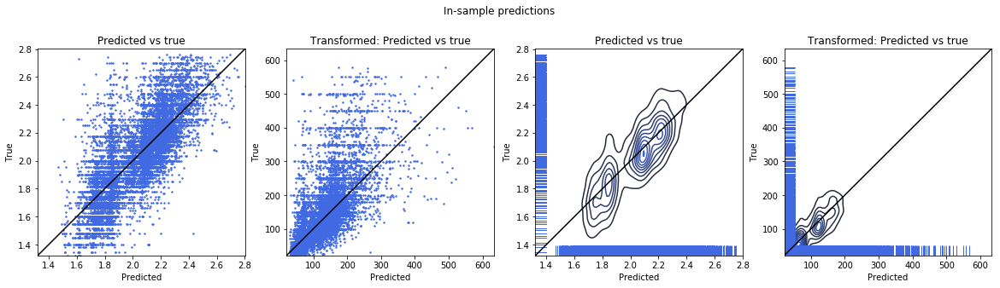

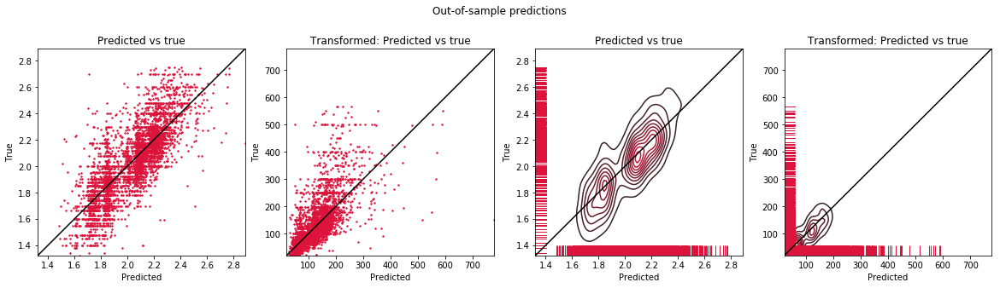

In [320]:
train_tpl = (X_train_suburb, y_train_suburb)
test_tpl = (X_test_suburb, y_test_suburb)
ridge_suburb = print_results('Ridge_suburbs.p', test_tpl, train_tpl, 'both', True)

In [321]:
best_params = ridge_suburb['fitted_model'].best_params_
best_params

{'ridge__alpha': 1.0}

In [322]:
X_train, y_train = prepare_datasets(X_train_suburb, y_train_suburb)
regr = linear_model.Ridge(alpha=best_params['ridge__alpha'])
model = Pipeline([('scaler', StandardScaler()), ('ridge', regr)])
model.fit(X_train, y_train)
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_suburb.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_suburb_same_room_type,-0.001947
Air_calculated_host_listings_count,-0.002088
Air_bathrooms,0.021927
Air_beds,-0.005435
Air_bedrooms,0.062691
Air_accommodates,0.037819
Air_extra_people,0.008120
Air_guests_included,0.007628
Air_distance_to_CBD,-0.040885
Air_property_type_2_House_Cottage_Villa,0.004286


*Constructed aggregation - 500m*

Lasso

Untransformed
-------------
R2 train: 0.63 / RMSE train 0.16 / MAE train 0.12 / Nobs: 13230
R2 test: 0.64 / RMSE test 0.16 / MAE test 0.12 / Nobs: 3739

Transformed
-----------
R2 train: 0.50 / RMSE train 60.78 / MAE train 36.83 / Nobs: 13230
R2 test: 0.51 / RMSE test 60.20 / MAE test 36.05 / Nobs: 3739



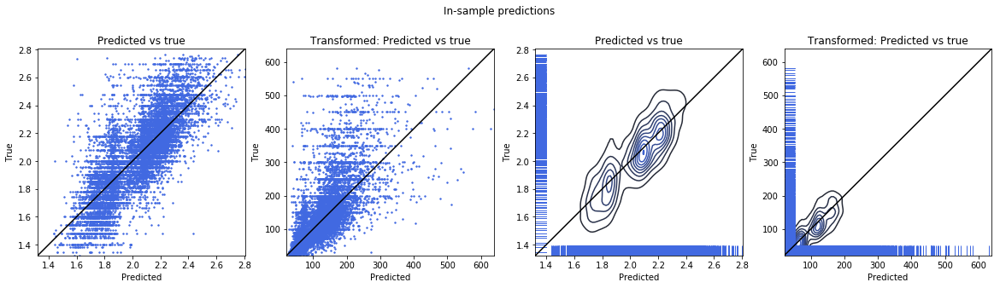

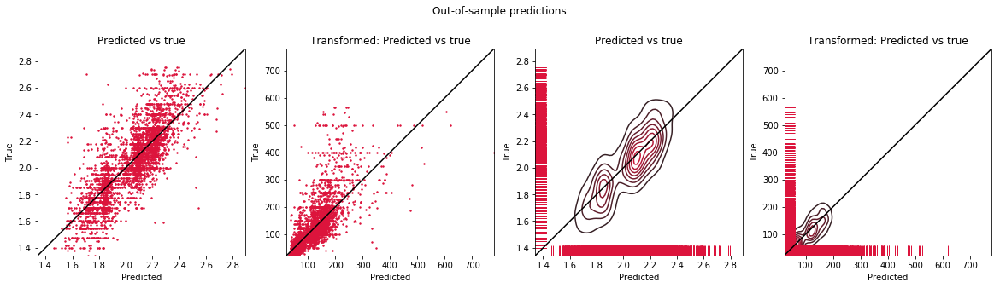

In [323]:
train_tpl = (X_train_500m, y_train_500m)
test_tpl = (X_test_500m, y_test_500m)
lasso_500m = print_results('Lasso_500m.p', test_tpl, train_tpl, 'both', True)

In [324]:
best_params = lasso_500m['fitted_model'].best_params_
best_params

{'lasso__alpha': 1e-10}

In [325]:
X_train, y_train = prepare_datasets(X_train_500m, y_train_500m)
regr = linear_model.Lasso(alpha=best_params['lasso__alpha'])
model = Pipeline([('scaler', StandardScaler()), ('lasso', regr)])
model.fit(X_train, y_train)
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_500m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_500m_same_room_type,0.072017
Air_calculated_host_listings_count,-0.002372
Air_bathrooms,0.020674
Air_beds,-0.002800
Air_bedrooms,0.059884
Air_accommodates,0.031469
Air_extra_people,0.006575
Air_guests_included,0.007827
Air_distance_to_CBD,-0.041492
Air_property_type_2_House_Cottage_Villa,0.008088


Ridge

Untransformed
-------------
R2 train: 0.63 / RMSE train 0.16 / MAE train 0.12 / Nobs: 13230
R2 test: 0.64 / RMSE test 0.16 / MAE test 0.12 / Nobs: 3739

Transformed
-----------
R2 train: 0.50 / RMSE train 60.78 / MAE train 36.83 / Nobs: 13230
R2 test: 0.51 / RMSE test 60.20 / MAE test 36.05 / Nobs: 3739



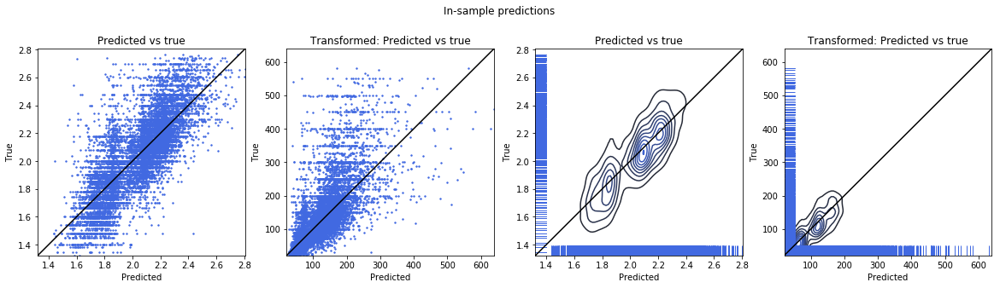

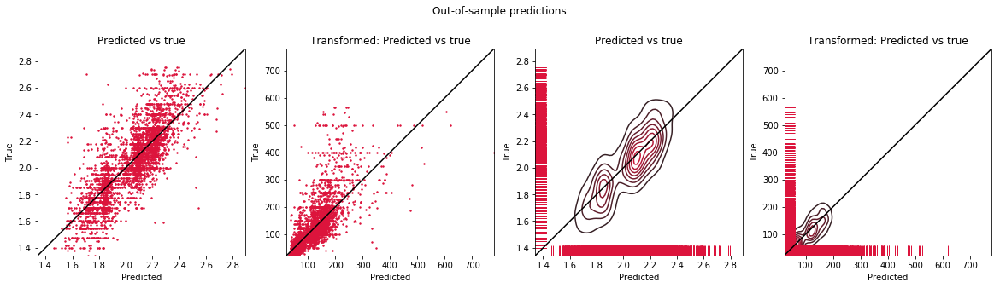

In [326]:
train_tpl = (X_train_500m, y_train_500m)
test_tpl = (X_test_500m, y_test_500m)
ridge_500m = print_results('Ridge_500m.p', test_tpl, train_tpl, 'both', True)

In [327]:
best_params = ridge_500m['fitted_model'].best_params_
best_params

{'ridge__alpha': 1e-10}

In [328]:
X_train, y_train = prepare_datasets(X_train_500m, y_train_500m)
regr = linear_model.Ridge(alpha=best_params['ridge__alpha'])
model = Pipeline([('scaler', StandardScaler()), ('ridge', regr)])
model.fit(X_train, y_train)
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_500m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_500m_same_room_type,0.072017
Air_calculated_host_listings_count,-0.002372
Air_bathrooms,0.020674
Air_beds,-0.002800
Air_bedrooms,0.059884
Air_accommodates,0.031469
Air_extra_people,0.006575
Air_guests_included,0.007827
Air_distance_to_CBD,-0.041492
Air_property_type_2_House_Cottage_Villa,0.008088


*Constructed aggregation - 100m*

Lasso

Untransformed
-------------
R2 train: 0.61 / RMSE train 0.15 / MAE train 0.11 / Nobs: 9203
R2 test: 0.62 / RMSE test 0.14 / MAE test 0.11 / Nobs: 2177

Transformed
-----------
R2 train: 0.49 / RMSE train 59.28 / MAE train 36.07 / Nobs: 9203
R2 test: 0.52 / RMSE test 53.54 / MAE test 34.09 / Nobs: 2177



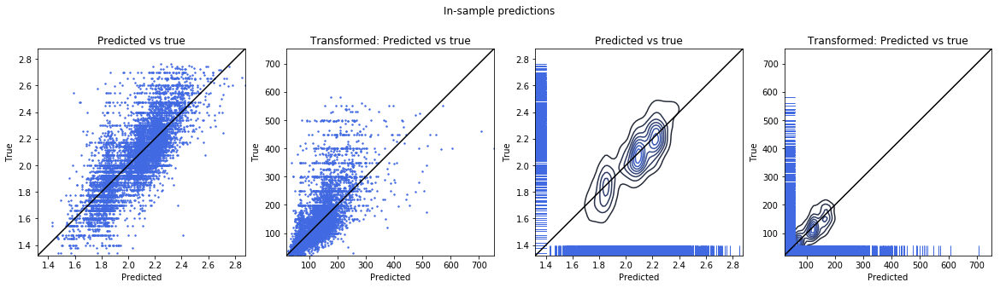

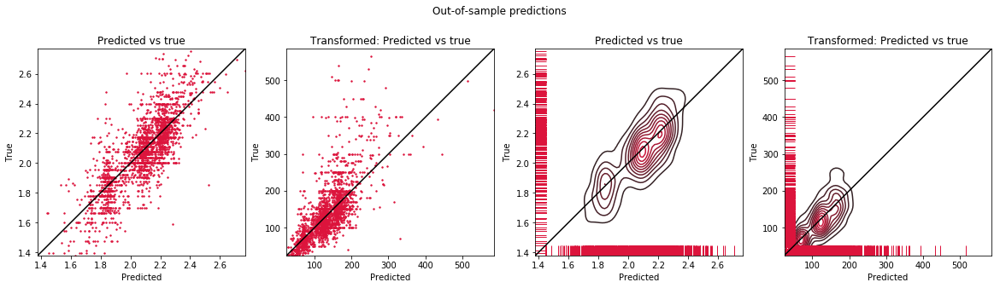

In [329]:
train_tpl = (X_train_100m, y_train_100m)
test_tpl = (X_test_100m, y_test_100m)
lasso_100m = print_results('Lasso_100m.p', test_tpl, train_tpl, 'both', True)

In [330]:
best_params = lasso_100m['fitted_model'].best_params_
best_params

{'lasso__alpha': 1e-10}

In [331]:
X_train, y_train = prepare_datasets(X_train_100m, y_train_100m)
regr = linear_model.Lasso(alpha=best_params['lasso__alpha'])
model = Pipeline([('scaler', StandardScaler()), ('lasso', regr)])
model.fit(X_train, y_train)
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_100m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_100m_same_room_type,0.050536
Air_calculated_host_listings_count,-0.003934
Air_bathrooms,0.020505
Air_beds,0.004655
Air_bedrooms,0.062902
Air_accommodates,0.018612
Air_extra_people,0.007173
Air_guests_included,0.005975
Air_distance_to_CBD,-0.047910
Air_property_type_2_House_Cottage_Villa,0.002827


Ridge

Untransformed
-------------
R2 train: 0.61 / RMSE train 0.15 / MAE train 0.11 / Nobs: 9203
R2 test: 0.62 / RMSE test 0.14 / MAE test 0.11 / Nobs: 2177

Transformed
-----------
R2 train: 0.49 / RMSE train 59.28 / MAE train 36.07 / Nobs: 9203
R2 test: 0.52 / RMSE test 53.54 / MAE test 34.09 / Nobs: 2177



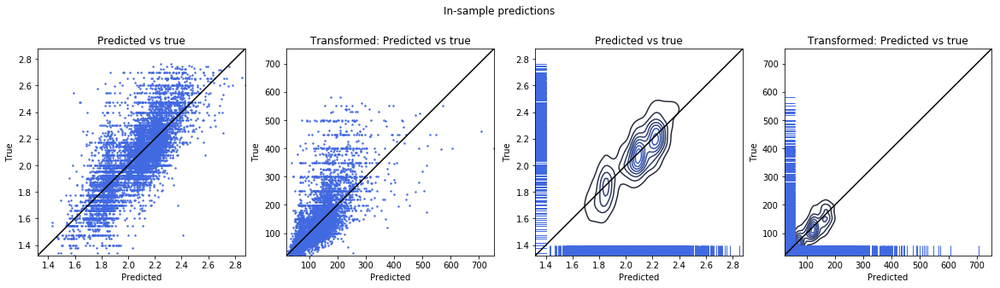

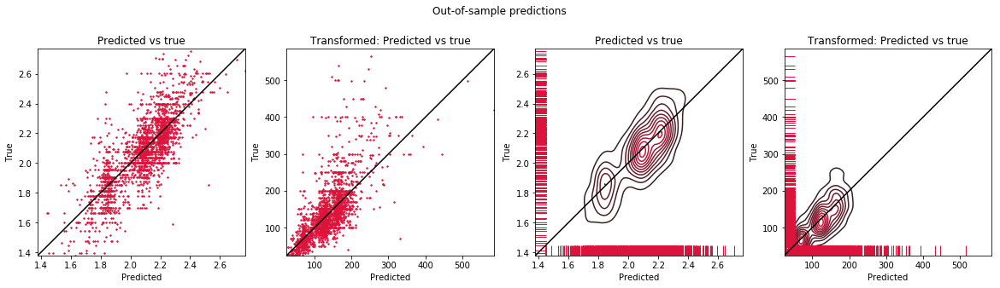

In [332]:
train_tpl = (X_train_100m, y_train_100m)
test_tpl = (X_test_100m, y_test_100m)
ridge_100m = print_results('Ridge_100m.p', test_tpl, train_tpl, 'both', True)

In [333]:
best_params = ridge_100m['fitted_model'].best_params_
best_params

{'ridge__alpha': 1e-10}

In [334]:
X_train, y_train = prepare_datasets(X_train_100m, y_train_100m)
regr = linear_model.Ridge(alpha=best_params['ridge__alpha'])
model = Pipeline([('scaler', StandardScaler()), ('ridge', regr)])
model.fit(X_train, y_train)
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_100m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_100m_same_room_type,0.050536
Air_calculated_host_listings_count,-0.003934
Air_bathrooms,0.020505
Air_beds,0.004655
Air_bedrooms,0.062902
Air_accommodates,0.018612
Air_extra_people,0.007173
Air_guests_included,0.005975
Air_distance_to_CBD,-0.047909
Air_property_type_2_House_Cottage_Villa,0.002827


*Constructed aggregation - 50m*

Lasso

Untransformed
-------------
R2 train: 0.59 / RMSE train 0.15 / MAE train 0.11 / Nobs: 6522
R2 test: 0.62 / RMSE test 0.14 / MAE test 0.10 / Nobs: 1340

Transformed
-----------
R2 train: 0.47 / RMSE train 58.91 / MAE train 35.91 / Nobs: 6522
R2 test: 0.51 / RMSE test 51.07 / MAE test 32.92 / Nobs: 1340



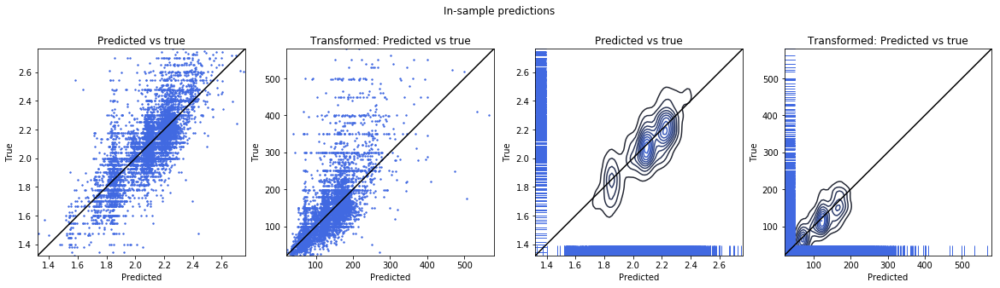

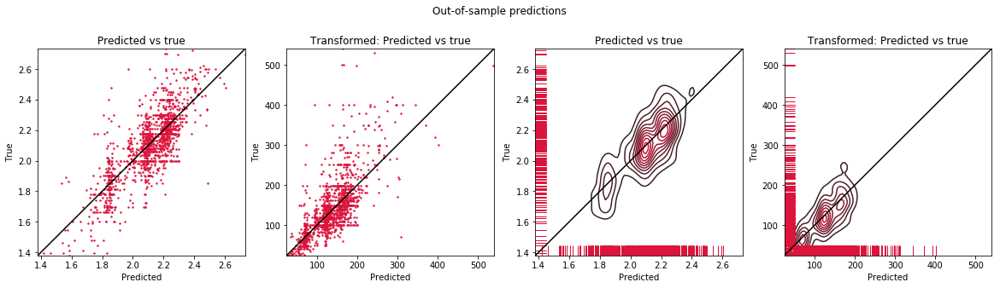

In [335]:
train_tpl = (X_train_50m, y_train_50m)
test_tpl = (X_test_50m, y_test_50m)
lasso_50m = print_results('Lasso_50m.p', test_tpl, train_tpl, 'both', True)

In [336]:
best_params = lasso_50m['fitted_model'].best_params_
best_params

{'lasso__alpha': 0.0001}

In [337]:
X_train, y_train = prepare_datasets(X_train_50m, y_train_50m)
regr = linear_model.Lasso(alpha=best_params['lasso__alpha'])
model = Pipeline([('scaler', StandardScaler()), ('lasso', regr)])
model.fit(X_train, y_train)
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_50m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_50m_same_room_type,0.026636
Air_calculated_host_listings_count,-0.005140
Air_bathrooms,0.021342
Air_beds,0.007403
Air_bedrooms,0.064463
Air_accommodates,0.011711
Air_extra_people,0.007733
Air_guests_included,0.007199
Air_distance_to_CBD,-0.045437
Air_property_type_2_House_Cottage_Villa,0.001931


Ridge

Untransformed
-------------
R2 train: 0.59 / RMSE train 0.15 / MAE train 0.11 / Nobs: 6522
R2 test: 0.62 / RMSE test 0.14 / MAE test 0.10 / Nobs: 1340

Transformed
-----------
R2 train: 0.47 / RMSE train 58.91 / MAE train 35.93 / Nobs: 6522
R2 test: 0.51 / RMSE test 50.99 / MAE test 32.87 / Nobs: 1340



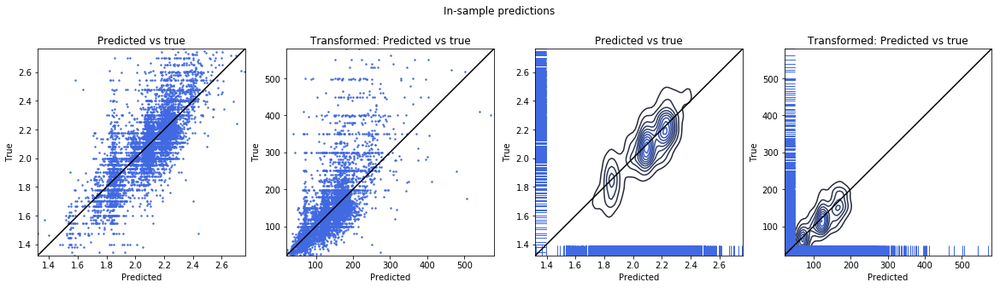

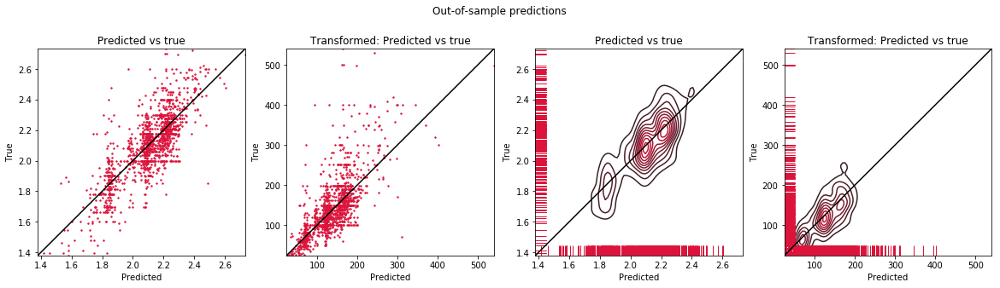

In [338]:
train_tpl = (X_train_50m, y_train_50m)
test_tpl = (X_test_50m, y_test_50m)
ridge_50m = print_results('Ridge_50m.p', test_tpl, train_tpl, 'both', True)

In [339]:
best_params =ridge_50m['fitted_model'].best_params_ 
best_params

{'ridge__alpha': 1e-10}

In [340]:
X_train, y_train = prepare_datasets(X_train_50m, y_train_50m)
regr = linear_model.Ridge(alpha=best_params['ridge__alpha'])
model = Pipeline([('scaler', StandardScaler()), ('ridge', regr)])
model.fit(X_train, y_train)
df = pd.DataFrame(data={'Coefficient': list(model.steps[1][1].coef_)})
df.index = [c for c in list(train_50m.columns) if c != 'Air_log_price']
df

,Coefficient
Air_log_price_50m_same_room_type,0.026285
Air_calculated_host_listings_count,-0.005202
Air_bathrooms,0.021357
Air_beds,0.007545
Air_bedrooms,0.064507
Air_accommodates,0.011460
Air_extra_people,0.007802
Air_guests_included,0.007316
Air_distance_to_CBD,-0.047772
Air_property_type_2_House_Cottage_Villa,0.002274


**4. Bagging**

Random Forest is a bagging method. Many weak learners - in this case regression trees - are learned and the results are aggregated. No standardization of the features is necessary for this algorithm so we left it out. To speed up the optimization `RandomizedSearchCV()` is used instead of `GridSearchCV()`.

Random Forest v1

In [341]:
# Source: https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 20, stop = 200, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

In [342]:
param_grid_rf_v1 = {'n_estimators': n_estimators,
                    'max_features': max_features,
                    'max_depth': max_depth,
                    'min_samples_split': min_samples_split,
                    'min_samples_leaf': min_samples_leaf}

print(param_grid_rf_v1)

{'n_estimators': [20, 40, 60, 80, 100, 120, 140, 160, 180, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


*Aggregation by suburbs*

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.71 / RMSE train 0.15 / MAE train 0.11 / Nobs: 14261
R2 test: 0.67 / RMSE test 0.15 / MAE test 0.12 / Nobs: 4451

Transformed
-----------
R2 train: 0.59 / RMSE train 55.24 / MAE train 32.12 / Nobs: 14261
R2 test: 0.55 / RMSE test 57.24 / MAE test 34.66 / Nobs: 4451



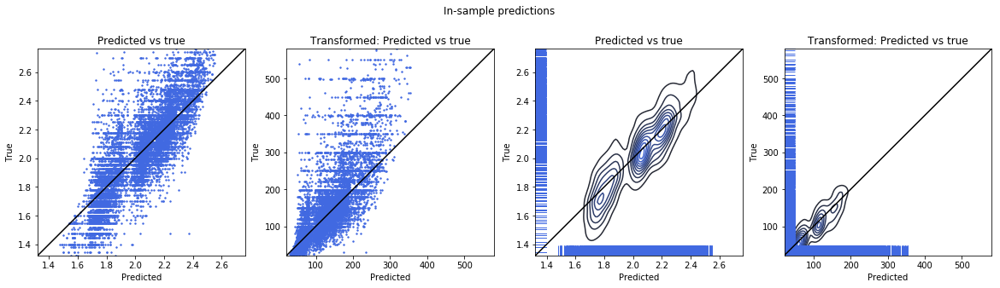

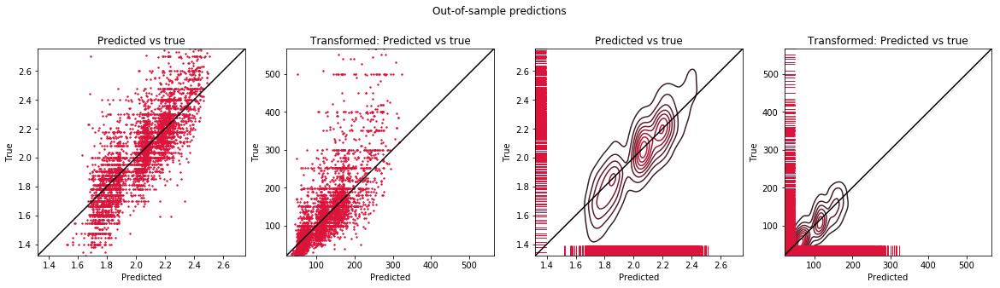

In [343]:
train_tpl = (X_train_suburb, y_train_suburb)
test_tpl = (X_test_suburb, y_test_suburb)
rf_suburb = print_results('RF_suburbs.p', test_tpl, train_tpl, 'both', True)

In [344]:
best_params = rf_suburb['fitted_model'].best_params_
best_params

{'n_estimators': 120,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 10}

Feature importance

In [345]:
names = tuple(np.delete(train_suburb.columns.values, 0))
values = tuple(rf_suburb['fitted_model'].best_estimator_.feature_importances_)

fi_suburb = pd.DataFrame(zip(names,values))
fi_suburb.columns = ('Variable', 'Importance')
fi_suburb

,Variable,Importance
0,Air_log_price_suburb_same_room_type,0.233019
1,Air_calculated_host_listings_count,0.015235
2,Air_bathrooms,0.044644
3,Air_beds,0.077019
4,Air_bedrooms,0.147770
5,Air_accommodates,0.144688
6,Air_extra_people,0.021330
7,Air_guests_included,0.042929
8,Air_distance_to_CBD,0.028742
9,Air_property_type_2_House_Cottage_Villa,0.016916


Hyper-parameter patterns

In [346]:
n_estimators = np.array(rf_suburb['fitted_model'].cv_results_['param_n_estimators'])
max_features = np.array(rf_suburb['fitted_model'].cv_results_['param_max_features'])
max_depth = np.array(rf_suburb['fitted_model'].cv_results_['param_max_depth'])
min_samples_split = np.array(rf_suburb['fitted_model'].cv_results_['param_min_samples_split'])
min_samples_leaf = np.array(rf_suburb['fitted_model'].cv_results_['param_min_samples_leaf'])
mean_test_score = np.array(rf_suburb['fitted_model'].cv_results_['mean_test_score'])

df = pd.DataFrame(data={'n_estimators': n_estimators,
                        'max_features': max_features,
                        'max_depth': max_depth,
                        'min_samples_split': min_samples_split,
                        'min_samples_leaf': min_samples_leaf,
                        'mean_test_score': mean_test_score})
df = df.sort_values(by='mean_test_score', ascending=False)

The `mean_test_score` is the score on the validation test. Since there is no cross validation no mean is actually computed. The scores on the validation set are lower than on the test set.

In [347]:
df.head(10)

,n_estimators,max_features,max_depth,min_samples_split,min_samples_leaf,mean_test_score
42,120,sqrt,10,5,4,0.629192
16,40,sqrt,10,10,1,0.625705
3,100,sqrt,10,5,2,0.624303
36,160,sqrt,None,10,4,0.591857
49,120,sqrt,30,10,4,0.591758
27,160,sqrt,30,5,4,0.590892
25,60,sqrt,110,10,4,0.590569
4,60,sqrt,40,10,4,0.590569
19,180,sqrt,100,2,4,0.590168
15,160,sqrt,40,2,4,0.589283


In [348]:
df.tail(10)

,n_estimators,max_features,max_depth,min_samples_split,min_samples_leaf,mean_test_score
18,180,auto,60,5,1,-0.736671
23,160,auto,50,5,1,-0.745722
12,100,auto,110,5,1,-0.752102
47,120,auto,40,5,2,-0.759208
22,80,auto,50,5,1,-0.762301
33,40,auto,100,5,2,-0.796160
46,20,auto,30,5,1,-0.814335
30,180,auto,None,2,1,-0.814537
7,180,auto,110,2,1,-0.814537
24,60,auto,None,2,1,-0.890496


Random Forest v2

From the output we see that `auto` leads to poor results.

In [349]:
# Source: https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 20, stop = 200, num = 10)]

# Number of features to consider at every split
max_features = ['sqrt', 'log2']

# Maximum number of levels in tree
#max_depth = [int(x) for x in np.linspace(1, 110, num = 11)]
max_depth = [int(x) for x in np.linspace(5, 20, num = 4)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4, 6, 10]

In [350]:
param_grid_rf_v2 = {'n_estimators': n_estimators,
                    'max_features': max_features,
                    'max_depth': max_depth,
                    'min_samples_split': min_samples_split,
                    'min_samples_leaf': min_samples_leaf}

print(param_grid_rf_v2)

{'n_estimators': [20, 40, 60, 80, 100, 120, 140, 160, 180, 200], 'max_features': ['sqrt', 'log2'], 'max_depth': [5, 10, 15, 20, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4, 6, 10]}


*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.72 / RMSE train 0.14 / MAE train 0.10 / Nobs: 14261
R2 test: 0.67 / RMSE test 0.15 / MAE test 0.12 / Nobs: 4451

Transformed
-----------
R2 train: 0.61 / RMSE train 54.07 / MAE train 31.49 / Nobs: 14261
R2 test: 0.56 / RMSE test 57.01 / MAE test 34.55 / Nobs: 4451



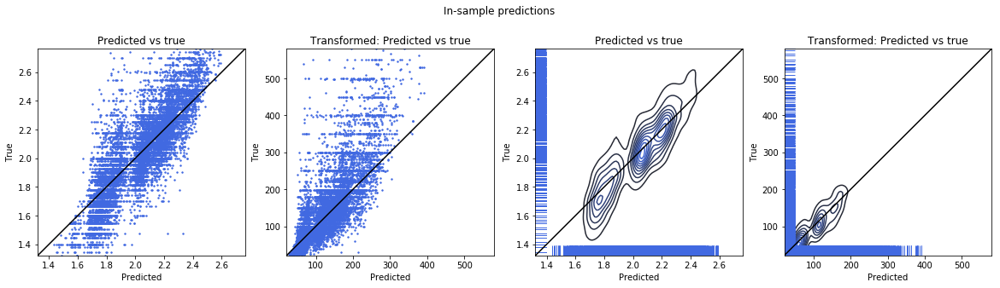

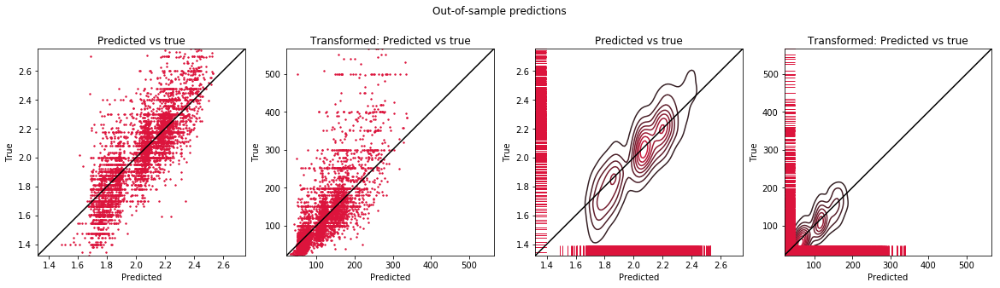

In [351]:
train_tpl = (X_train_suburb, y_train_suburb)
test_tpl = (X_test_suburb, y_test_suburb)
rf_suburb_v2 = print_results('RF_suburbs_v2.p', test_tpl, train_tpl, 'both', True)

In [352]:
best_params = rf_suburb_v2['fitted_model'].best_params_
best_params

{'n_estimators': 120,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 10}

Feature importance

In [353]:
names = tuple(np.delete(train_suburb.columns.values, 0))
values = tuple(rf_suburb_v2['fitted_model'].best_estimator_.feature_importances_)

fi_suburb = pd.DataFrame(zip(names,values))
fi_suburb.columns = ('Variable', 'Importance')
fi_suburb

,Variable,Importance
0,Air_log_price_suburb_same_room_type,0.241896
1,Air_calculated_host_listings_count,0.015393
2,Air_bathrooms,0.043770
3,Air_beds,0.078926
4,Air_bedrooms,0.142347
5,Air_accommodates,0.138603
6,Air_extra_people,0.020929
7,Air_guests_included,0.045600
8,Air_distance_to_CBD,0.029462
9,Air_property_type_2_House_Cottage_Villa,0.016584


Hyper-parameter patterns 

In [354]:
n_estimators = np.array(rf_suburb_v2['fitted_model'].cv_results_['param_n_estimators'])
max_features = np.array(rf_suburb_v2['fitted_model'].cv_results_['param_max_features'])
max_depth = np.array(rf_suburb_v2['fitted_model'].cv_results_['param_max_depth'])
min_samples_split = np.array(rf_suburb_v2['fitted_model'].cv_results_['param_min_samples_split'])
min_samples_leaf = np.array(rf_suburb_v2['fitted_model'].cv_results_['param_min_samples_leaf'])
mean_test_score = np.array(rf_suburb_v2['fitted_model'].cv_results_['mean_test_score'])

df = pd.DataFrame(data={'n_estimators': n_estimators,
                        'max_features': max_features,
                        'max_depth': max_depth,
                        'min_samples_split': min_samples_split,
                        'min_samples_leaf': min_samples_leaf,
                        'mean_test_score': mean_test_score})
df = df.sort_values(by='mean_test_score', ascending=False)

In [355]:
df.head(10)

,n_estimators,max_features,max_depth,min_samples_split,min_samples_leaf,mean_test_score
9,120,sqrt,10,2,2,0.632367
19,100,sqrt,10,10,6,0.628509
41,40,log2,10,10,6,0.627645
3,20,sqrt,10,2,2,0.627554
43,200,log2,10,5,10,0.626010
47,120,log2,15,10,10,0.622606
44,100,log2,15,10,10,0.622228
23,180,log2,15,10,2,0.619132
14,60,sqrt,15,2,6,0.618556
45,160,sqrt,15,2,6,0.618343


In [356]:
df.tail(10)

,n_estimators,max_features,max_depth,min_samples_split,min_samples_leaf,mean_test_score
34,40,log2,5,10,4,0.586147
31,60,log2,5,10,10,0.584609
2,100,sqrt,None,2,4,0.582612
25,200,log2,None,5,2,0.567639
17,140,sqrt,20,10,1,0.552705
40,120,sqrt,20,10,1,0.548198
26,80,sqrt,None,5,2,0.543004
27,60,sqrt,20,10,1,0.536130
46,40,sqrt,None,5,1,0.462435
12,20,sqrt,None,10,1,0.451988


Since the variables are correlated, a multivariate regression is considered to investigate the effect of the different parameters. The fit is better when `max_features` and `min_samples_leaf` are high. However, a lot of variation cannot be explained by the model. The fit is poor.

<!---We see that the score is smaller the larger `min_samples_split` is. As opposed to this, the score seems to be increasing with `min_samples_leaf`. However, the effects are contradicting since higher values in the two variables correspond to a smaller model. Furthermore, a lot of variation cannot be explained by the model.
--->

In [357]:
X = df.loc[:, ['n_estimators', 'max_features', 'max_depth', 'min_samples_split', 'min_samples_leaf']]
X['max_features'] = pd.factorize(X['max_features'])[0]
X['max_depth'] = pd.factorize(X['max_depth'])[0]
#X['n_estimators_sq'] = X['n_estimators']**2
#X['max_features_sq'] = X['max_features']**2
#X['min_samples_split_sq'] = X['min_samples_split']**2
#X['min_samples_leaf_sq'] = X['min_samples_leaf']**2
y = df.loc[:, ['mean_test_score']]
X = sm.add_constant(X)
rf_results = sm.OLS(y, X.astype(float)).fit()
print(rf_results.summary())

                            OLS Regression Results                            
Dep. Variable:        mean_test_score   R-squared:                       0.375
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     5.270
Date:                Wed, 08 Jul 2020   Prob (F-statistic):           0.000705
Time:                        19:19:21   Log-Likelihood:                 107.81
No. Observations:                  50   AIC:                            -203.6
Df Residuals:                      44   BIC:                            -192.1
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.5606      0.01

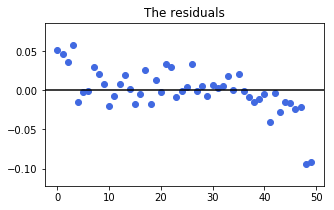

In [358]:
mean = np.mean(rf_results.resid)
fig, ax = plt.subplots(1,1, figsize=(5,3))
ax.scatter(x=range(rf_results.resid.shape[0]), y=rf_results.resid, alpha=1, color=col1)
ax.axhline(mean, color="black")
ax.set_title("The residuals");

*Constructed aggregation - 500m*

`param_grid_rf_v2` is used for hyper-parameter optimization.

*This set is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.80 / RMSE train 0.12 / MAE train 0.09 / Nobs: 13230
R2 test: 0.70 / RMSE test 0.14 / MAE test 0.10 / Nobs: 3739

Transformed
-----------
R2 train: 0.73 / RMSE train 44.96 / MAE train 26.36 / Nobs: 13230
R2 test: 0.60 / RMSE test 54.05 / MAE test 31.85 / Nobs: 3739



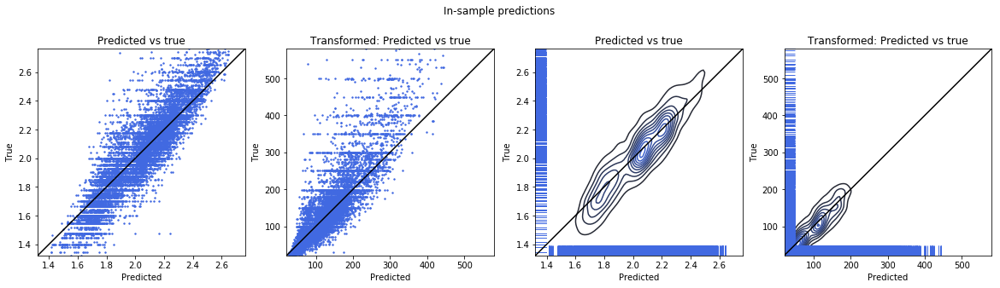

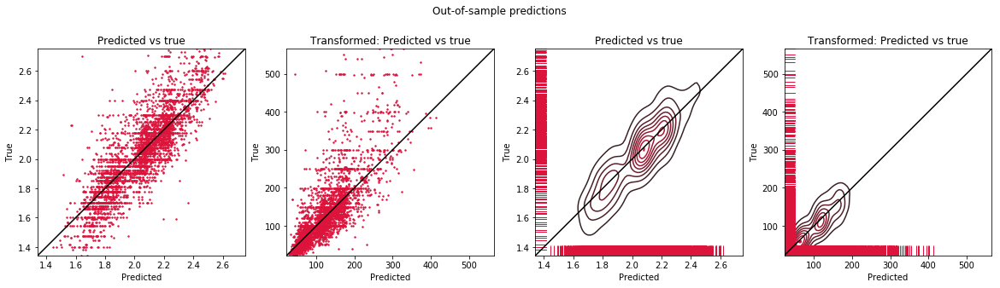

In [359]:
train_tpl = (X_train_500m, y_train_500m)
test_tpl = (X_test_500m, y_test_500m)
rf_500m = print_results('RF_500m.p', test_tpl, train_tpl, 'both', True)

In [360]:
best_params = rf_500m['fitted_model'].best_params_
best_params

{'n_estimators': 120,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 20}

Feature importance

In [361]:
names = tuple(np.delete(train_500m.columns.values, 0))
values = tuple(rf_500m['fitted_model'].best_estimator_.feature_importances_)

fi_500m = pd.DataFrame(zip(names,values))
fi_500m.columns = ('Variable', 'Importance')
fi_500m

,Variable,Importance
0,Air_log_price_500m_same_room_type,0.215327
1,Air_calculated_host_listings_count,0.025822
2,Air_bathrooms,0.046467
3,Air_beds,0.070695
4,Air_bedrooms,0.139753
5,Air_accommodates,0.125851
6,Air_extra_people,0.030904
7,Air_guests_included,0.041669
8,Air_distance_to_CBD,0.051778
9,Air_property_type_2_House_Cottage_Villa,0.017673


*Consructed aggregation - 100m*

`param_grid_rf_v2` is used for hyper-parameter optimization.

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.80 / RMSE train 0.11 / MAE train 0.08 / Nobs: 9203
R2 test: 0.69 / RMSE test 0.13 / MAE test 0.10 / Nobs: 2177

Transformed
-----------
R2 train: 0.72 / RMSE train 44.20 / MAE train 26.11 / Nobs: 9203
R2 test: 0.60 / RMSE test 49.07 / MAE test 30.12 / Nobs: 2177



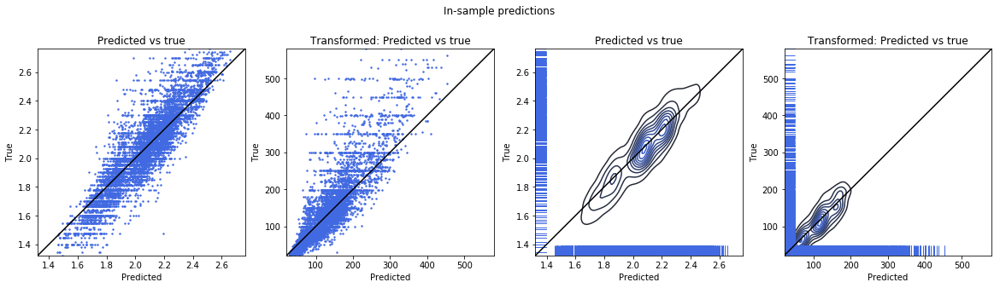

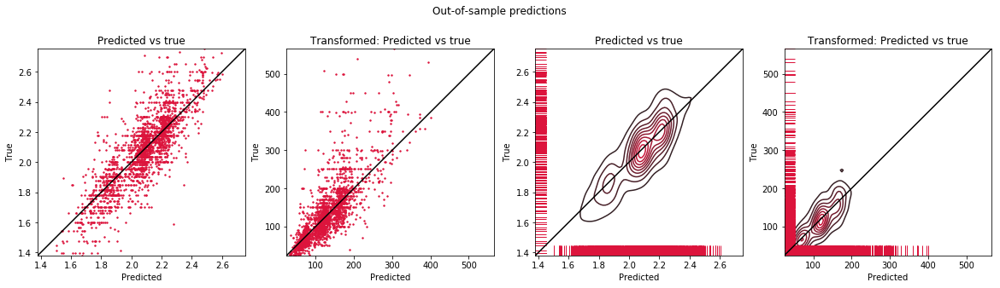

In [362]:
train_tpl = (X_train_100m, y_train_100m)
test_tpl = (X_test_100m, y_test_100m)
rf_100m = print_results('RF_100m.p', test_tpl, train_tpl, 'both', True)

In [363]:
best_params = rf_100m['fitted_model'].best_params_
best_params

{'n_estimators': 140,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 20}

Feature importance

In [364]:
names = tuple(np.delete(train_100m.columns.values, 0))
values = tuple(rf_100m['fitted_model'].best_estimator_.feature_importances_)

fi_100m = pd.DataFrame(zip(names,values))
fi_100m.columns = ('Variable', 'Importance')
fi_100m

,Variable,Importance
0,Air_log_price_100m_same_room_type,0.195930
1,Air_calculated_host_listings_count,0.027431
2,Air_bathrooms,0.049560
3,Air_beds,0.068292
4,Air_bedrooms,0.150884
5,Air_accommodates,0.126911
6,Air_extra_people,0.034544
7,Air_guests_included,0.050526
8,Air_distance_to_CBD,0.051392
9,Air_property_type_2_House_Cottage_Villa,0.016114


*Constructed aggregation - 50m*

`param_grid_rf_v2` is used for hyper-parameter optimization.

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.79 / RMSE train 0.11 / MAE train 0.08 / Nobs: 6522
R2 test: 0.68 / RMSE test 0.12 / MAE test 0.09 / Nobs: 1340

Transformed
-----------
R2 train: 0.70 / RMSE train 44.13 / MAE train 25.79 / Nobs: 6522
R2 test: 0.59 / RMSE test 46.71 / MAE test 29.16 / Nobs: 1340



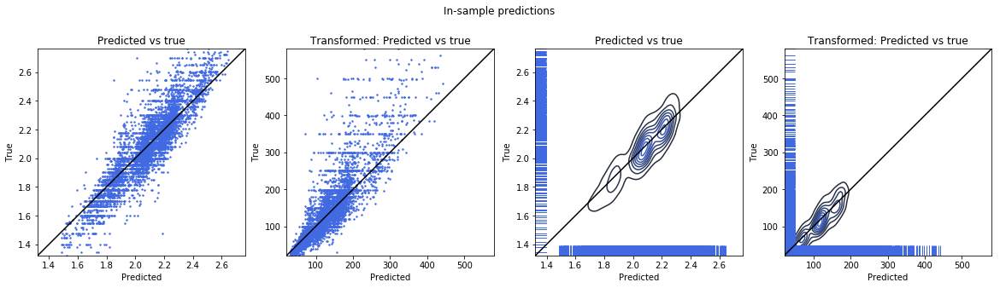

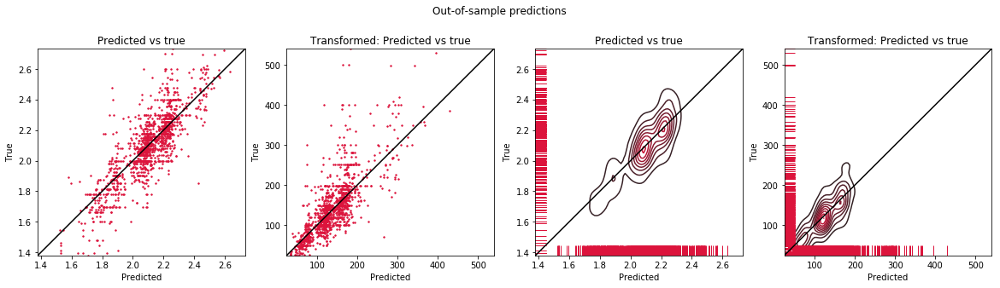

In [365]:
train_tpl = (X_train_50m, y_train_50m)
test_tpl = (X_test_50m, y_test_50m)
rf_50m = print_results('RF_50m.p', test_tpl, train_tpl, 'both', True)

In [366]:
best_params = rf_50m['fitted_model'].best_params_
best_params

{'n_estimators': 120,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 20}

Feature importance

In [367]:
names = tuple(np.delete(train_50m.columns.values, 0))
values = tuple(rf_50m['fitted_model'].best_estimator_.feature_importances_)

fi_50m = pd.DataFrame(zip(names,values))
fi_50m.columns = ('Variable', 'Importance')
fi_50m

,Variable,Importance
0,Air_log_price_50m_same_room_type,0.147638
1,Air_calculated_host_listings_count,0.030989
2,Air_bathrooms,0.050224
3,Air_beds,0.073479
4,Air_bedrooms,0.169894
5,Air_accommodates,0.118003
6,Air_extra_people,0.042272
7,Air_guests_included,0.060633
8,Air_distance_to_CBD,0.052835
9,Air_property_type_2_House_Cottage_Villa,0.017746


**5. Boosting**

In this section the two boosting algorithmns `AdaBoost` and `XGBoost` are investigated. Sklearn's `GradientBoostingRegressor` does not seem to perform well and is slow. It is only applied for the suburb example as a test. `StandardScaler()` is used upfront with the aim to speed up the optimization.

For `XGBoost` we use sklearn's wrappper interface. `eta` is in this set-up the learning rate. Building the trees can be randomized by the several parameters (https://stackoverflow.com/questions/51022822/subsample-colsample-bytree-colsample-bylevel-in-xgbclassifier-python-3-x, https://xgboost.readthedocs.io/en/latest/parameter.html):
- `subsample`: is the fraction of obervations that are used to train the model,
- `colsample_bytree`: is the fraction of features that are used to build each tree.
- `colsample_bynode`: is the fraction of features that are in each node.

There is also the parameter `colsample_bylevel`.

To speed up the optimization `RandomizedSearchCV()` is used instead of `GridSearchCV()`.

*Remark*: Retrieving the feature importance does not seem to work for `XGBoost` (https://datascience.stackexchange.com/questions/16008/how-to-determine-feature-importance-while-using-xgboost-in-pipeline).

The following grids are used:

In [368]:
# AdaBoost
# --------
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 20, stop = 200, num = 10)]
# Loss function
loss = ['linear', 'square', 'exponential']
# Learinign rate
learning_rate = np.logspace(start = -3, stop = 3, num = 7)

param_grid_ada = {'ada__n_estimators': n_estimators,
                  'ada__loss': loss,
                  'ada__learning_rate': learning_rate}
print(param_grid_ada)

# XGBoost
# -------
#'xgb__learning_rate': [0.01, 0.02, 0.05, 0.1 ],
param_grid_xgb = {'xgb__eta': [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ],
                  'xgb__max_depth' : [ 3, 4, 5, 6, 8, 10, 12, 15],
                  'xgb__min_child_weight' : [ 1, 3, 5, 7 ],
                  'xgb__gamma': [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
                  'xgb__colsample_bytree': [0.3, 0.5, 0.7, 1]}
print(param_grid_xgb)

# Gradient Boosting
# -----------------
# Loss function
loss = ['ls', 'lad', 'huber', 'quantile']

# Learinign rate
learning_rate = np.logspace(start = -3, stop = 3, num = 7)

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 20, stop = 200, num = 10)]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10] 

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Number of features to consider at every split
max_features = ['auto', 'sqrt', 'log2']

param_grid_gb = {'gb__loss': loss,
                 'gb__learning_rate': learning_rate,
                 'gb__n_estimators': n_estimators,
                 'gb__min_samples_split': min_samples_split,
                 'gb__max_depth': max_depth,
                 'gb__max_features': max_features}
param_grid_gb

{'ada__n_estimators': [20, 40, 60, 80, 100, 120, 140, 160, 180, 200], 'ada__loss': ['linear', 'square', 'exponential'], 'ada__learning_rate': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03])}
{'xgb__eta': [0.05, 0.1, 0.15, 0.2, 0.25, 0.3], 'xgb__max_depth': [3, 4, 5, 6, 8, 10, 12, 15], 'xgb__min_child_weight': [1, 3, 5, 7], 'xgb__gamma': [0.0, 0.1, 0.2, 0.3, 0.4], 'xgb__colsample_bytree': [0.3, 0.5, 0.7, 1]}


{'gb__loss': ['ls', 'lad', 'huber', 'quantile'],
 'gb__learning_rate': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
 'gb__n_estimators': [20, 40, 60, 80, 100, 120, 140, 160, 180, 200],
 'gb__min_samples_split': [2, 5, 10],
 'gb__max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'gb__max_features': ['auto', 'sqrt', 'log2']}

*Aggregation by Suburbs*

AdaBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.58 / RMSE train 0.17 / MAE train 0.13 / Nobs: 14261
R2 test: 0.59 / RMSE test 0.17 / MAE test 0.13 / Nobs: 4451

Transformed
-----------
R2 train: 0.47 / RMSE train 63.08 / MAE train 39.14 / Nobs: 14261
R2 test: 0.49 / RMSE test 61.15 / MAE test 38.45 / Nobs: 4451



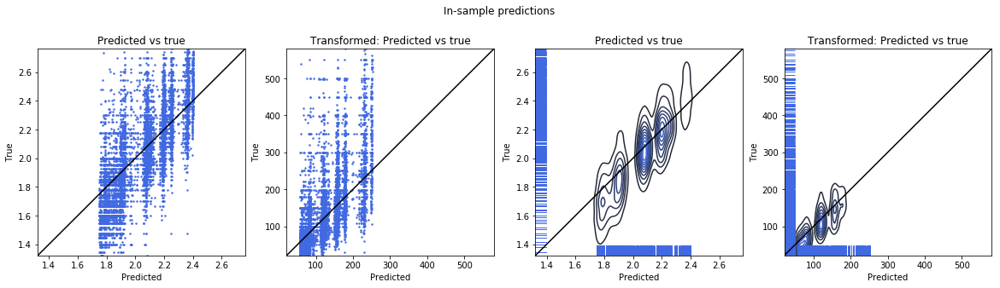

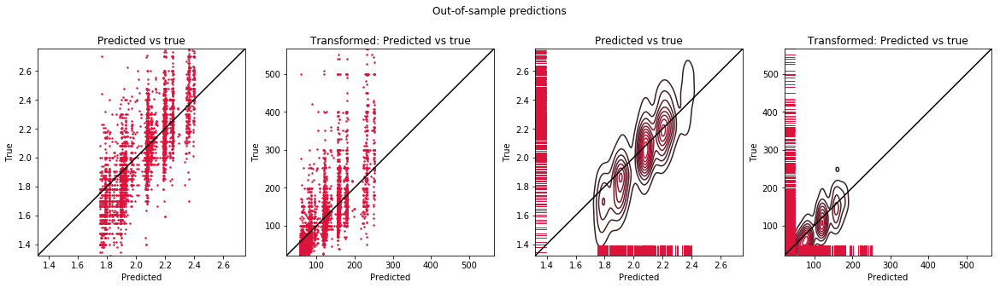

In [369]:
train_tpl = (X_train_suburb, y_train_suburb)
test_tpl = (X_test_suburb, y_test_suburb)
ada_suburb = print_results('Ada_suburbs.p', test_tpl, train_tpl, 'both', True)

In [370]:
best_params = ada_suburb['fitted_model'].best_params_
best_params

{'ada__n_estimators': 100,
 'ada__loss': 'exponential',
 'ada__learning_rate': 0.1}

Feature importance

In [371]:
names = tuple(np.delete(train_suburb.columns.values, 0))
values = tuple(ada_suburb['fitted_model'].best_estimator_.named_steps['ada'].feature_importances_)

fi_suburb = pd.DataFrame(zip(names,values))
fi_suburb.columns = ('Variable', 'Importance')
fi_suburb

,Variable,Importance
0,Air_log_price_suburb_same_room_type,0.652078
1,Air_calculated_host_listings_count,0.011896
2,Air_bathrooms,0.049620
3,Air_beds,0.009021
4,Air_bedrooms,0.101116
5,Air_accommodates,0.078223
6,Air_extra_people,0.040450
7,Air_guests_included,0.010855
8,Air_distance_to_CBD,0.027919
9,Air_property_type_2_House_Cottage_Villa,0.000374


*XGBoost*

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.73 / RMSE train 0.14 / MAE train 0.10 / Nobs: 14261
R2 test: 0.66 / RMSE test 0.16 / MAE test 0.12 / Nobs: 4451

Transformed
-----------
R2 train: 0.64 / RMSE train 51.55 / MAE train 30.32 / Nobs: 14261
R2 test: 0.55 / RMSE test 57.69 / MAE test 34.86 / Nobs: 4451



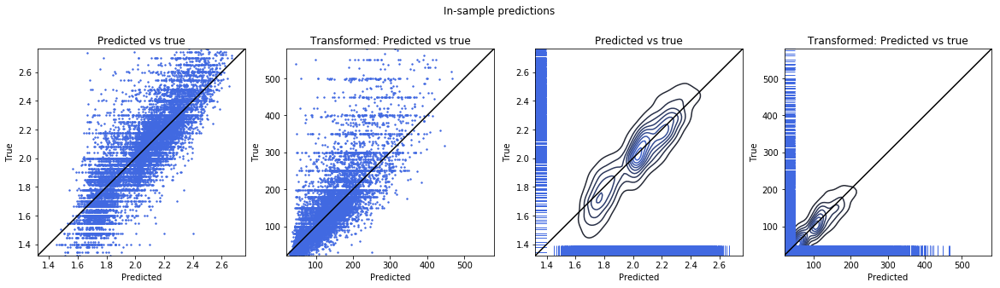

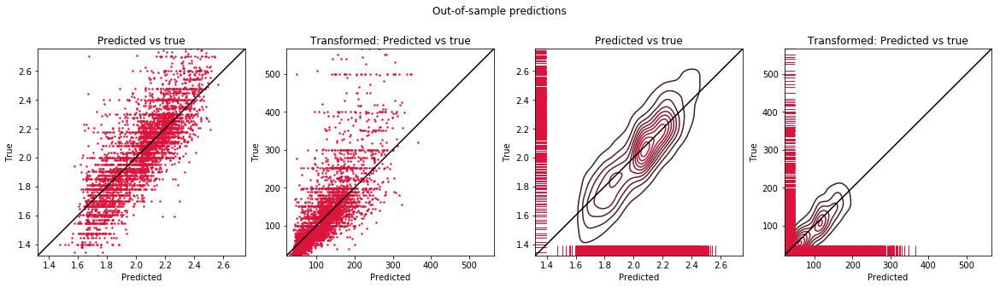

In [372]:
train_tpl = (X_train_suburb, y_train_suburb)
test_tpl = (X_test_suburb, y_test_suburb)
xgb_suburb = print_results('XGB_suburbs.p', test_tpl, train_tpl, 'both', True)

In [373]:
best_params = xgb_suburb['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 7,
 'xgb__max_depth': 3,
 'xgb__gamma': 0.3,
 'xgb__eta': 0.25,
 'xgb__colsample_bytree': 0.3}

Feature importance (not working)

Hyper-parameter patterns

In [374]:
min_child_weight = np.array(xgb_suburb['fitted_model'].cv_results_['param_xgb__min_child_weight'])
max_depth = np.array(xgb_suburb['fitted_model'].cv_results_['param_xgb__max_depth'])
gamma = np.array(xgb_suburb['fitted_model'].cv_results_['param_xgb__gamma'])
eta = np.array(xgb_suburb['fitted_model'].cv_results_['param_xgb__eta'])
colsample_bytree = np.array(xgb_suburb['fitted_model'].cv_results_['param_xgb__colsample_bytree'])
mean_test_score = np.array(xgb_suburb['fitted_model'].cv_results_['mean_test_score'])

df = pd.DataFrame(data={'min_child_weight': min_child_weight,
                        'max_depth': max_depth,
                        #'learning_rate': learning_rate,
                        'gamma': gamma,
                        'eta': eta,
                        'colsample_bytree': colsample_bytree,
                        'mean_test_score': mean_test_score})
df = df.sort_values(by='mean_test_score', ascending=False)

In [375]:
df.head(10)

,min_child_weight,max_depth,gamma,eta,colsample_bytree,mean_test_score
21,7,3,0.3,0.25,0.3,0.609758
9,1,4,0.3,0.15,0.3,0.607183
10,5,4,0.2,0.25,0.3,0.606978
19,5,3,0.1,0.1,0.3,0.603239
20,3,4,0.4,0.25,0.3,0.599728
1,1,3,0,0.3,0.5,0.587441
37,3,4,0,0.1,0.5,0.577438
7,3,5,0.1,0.1,0.3,0.576363
31,1,4,0.3,0.15,0.5,0.563904
8,3,6,0.3,0.2,0.3,0.551558


In [376]:
df.tail(10)

,min_child_weight,max_depth,gamma,eta,colsample_bytree,mean_test_score
26,7,5,0.1,0.3,1,0.162229
6,1,12,0.1,0.1,0.5,0.153108
46,1,15,0.4,0.3,1,0.140034
47,7,15,0.3,0.3,1,0.101599
35,5,12,0.2,0.1,1,0.083019
29,5,12,0,0.05,0.5,0.019498
41,5,12,0.1,0.15,0.7,-0.017318
4,7,10,0.1,0.15,1,-0.037604
17,3,15,0.1,0.3,0.7,-0.106239
33,5,15,0,0.05,0.7,-0.344520


The fit is worse when `max_depth` and `colsample_bytree` is large. A high learning rate `eta` increases the fit.

In [377]:
X = df.loc[:, ['min_child_weight', 'max_depth', 'gamma', 'eta', 'colsample_bytree']]
y = df.loc[:, ['mean_test_score']]
X = sm.add_constant(X)
xgb_results = sm.OLS(y, X.astype(float)).fit()
print(xgb_results.summary())

                            OLS Regression Results                            
Dep. Variable:        mean_test_score   R-squared:                       0.851
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     50.35
Date:                Wed, 08 Jul 2020   Prob (F-statistic):           4.18e-17
Time:                        19:22:35   Log-Likelihood:                 54.735
No. Observations:                  50   AIC:                            -97.47
Df Residuals:                      44   BIC:                            -86.00
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.7350      0.048  

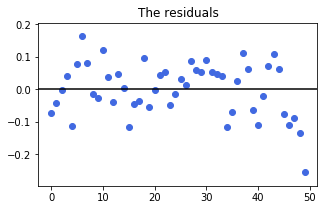

In [378]:
mean = np.mean(xgb_results.resid)
fig, ax = plt.subplots(1,1, figsize=(5,3))
ax.scatter(x=range(xgb_results.resid.shape[0]), y=xgb_results.resid, alpha=1, color=col1)
ax.axhline(mean, color="black")
ax.set_title("The residuals");

Gradient Boosting (bad performance, not considered for the other aggregations)

The algorithm is very slow so that only 10 random samples of hyper-parameter combinations are considered.

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.65 / RMSE train 0.16 / MAE train 0.13 / Nobs: 14261
R2 test: 0.43 / RMSE test 0.20 / MAE test 0.16 / Nobs: 4451

Transformed
-----------
R2 train: 0.47 / RMSE train 62.96 / MAE train 37.92 / Nobs: 14261
R2 test: 0.30 / RMSE test 71.57 / MAE test 45.60 / Nobs: 4451



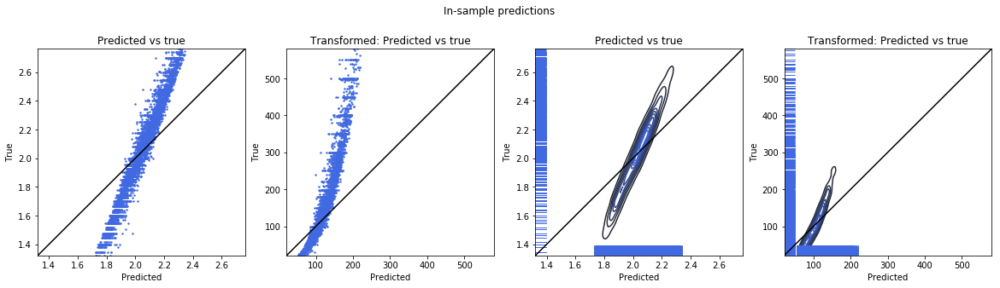

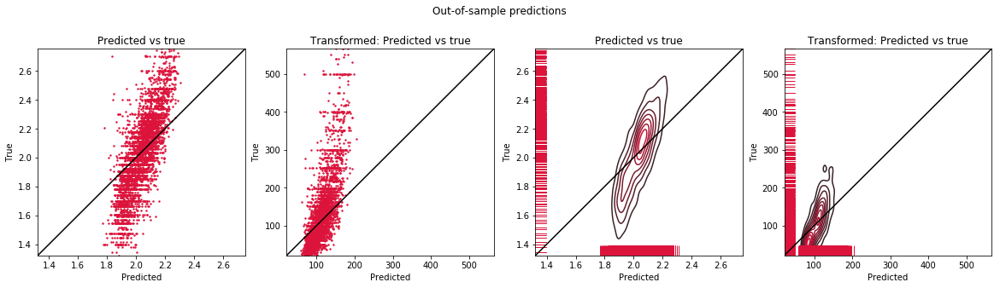

In [379]:
train_tpl = (X_train_suburb, y_train_suburb)
test_tpl = (X_test_suburb, y_test_suburb)
gb_suburb = print_results('GB_suburbs.p', test_tpl, train_tpl, 'both', True)

In [380]:
best_params = gb_suburb['fitted_model'].best_params_
best_params

{'gb__n_estimators': 60,
 'gb__min_samples_split': 2,
 'gb__max_features': 'log2',
 'gb__max_depth': 100,
 'gb__loss': 'ls',
 'gb__learning_rate': 0.01}

Feature importance

In [381]:
names = tuple(np.delete(train_suburb.columns.values, 0))
values = tuple(gb_suburb['fitted_model'].best_estimator_.named_steps['gb'].feature_importances_)

fi_suburb = pd.DataFrame(zip(names,values))
fi_suburb.columns = ('Variable', 'Importance')
fi_suburb

,Variable,Importance
0,Air_log_price_suburb_same_room_type,0.244436
1,Air_calculated_host_listings_count,0.032123
2,Air_bathrooms,0.039486
3,Air_beds,0.056874
4,Air_bedrooms,0.110083
5,Air_accommodates,0.106749
6,Air_extra_people,0.039766
7,Air_guests_included,0.040263
8,Air_distance_to_CBD,0.092482
9,Air_property_type_2_House_Cottage_Villa,0.015434


*Constructed aggregation - 500m*

AdaBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.59 / RMSE train 0.17 / MAE train 0.13 / Nobs: 13230
R2 test: 0.59 / RMSE test 0.17 / MAE test 0.13 / Nobs: 3739

Transformed
-----------
R2 train: 0.47 / RMSE train 62.45 / MAE train 38.84 / Nobs: 13230
R2 test: 0.47 / RMSE test 62.25 / MAE test 38.42 / Nobs: 3739



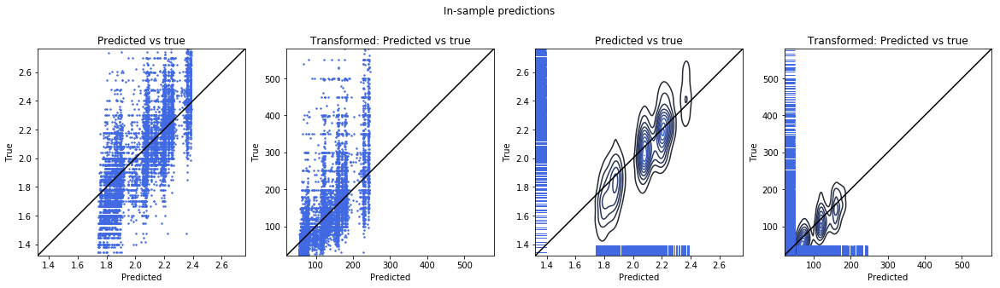

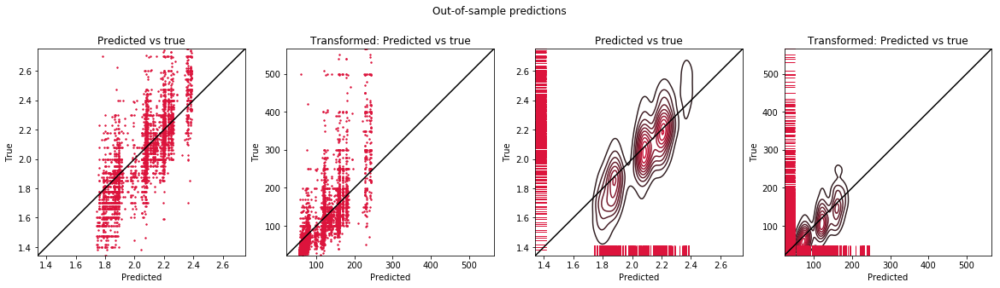

In [382]:
train_tpl = (X_train_500m, y_train_500m)
test_tpl = (X_test_500m, y_test_500m)
ada_500m = print_results('Ada_500m.p', test_tpl, train_tpl, 'both', True)

In [383]:
best_params = ada_500m['fitted_model'].best_params_
best_params

{'ada__n_estimators': 100,
 'ada__loss': 'exponential',
 'ada__learning_rate': 0.1}

In [384]:
names = tuple(np.delete(train_500m.columns.values, 0))
values = tuple(ada_500m['fitted_model'].best_estimator_.named_steps['ada'].feature_importances_)

fi_500m = pd.DataFrame(zip(names,values))
fi_500m.columns = ('Variable', 'Importance')
fi_500m

,Variable,Importance
0,Air_log_price_500m_same_room_type,0.595365
1,Air_calculated_host_listings_count,0.019116
2,Air_bathrooms,0.041588
3,Air_beds,0.006979
4,Air_bedrooms,0.103644
5,Air_accommodates,0.128927
6,Air_extra_people,0.020875
7,Air_guests_included,0.013145
8,Air_distance_to_CBD,0.044578
9,Air_property_type_2_House_Cottage_Villa,0.000231


XGBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.77 / RMSE train 0.13 / MAE train 0.09 / Nobs: 13230
R2 test: 0.71 / RMSE test 0.14 / MAE test 0.10 / Nobs: 3739

Transformed
-----------
R2 train: 0.70 / RMSE train 47.36 / MAE train 28.31 / Nobs: 13230
R2 test: 0.63 / RMSE test 52.10 / MAE test 31.18 / Nobs: 3739



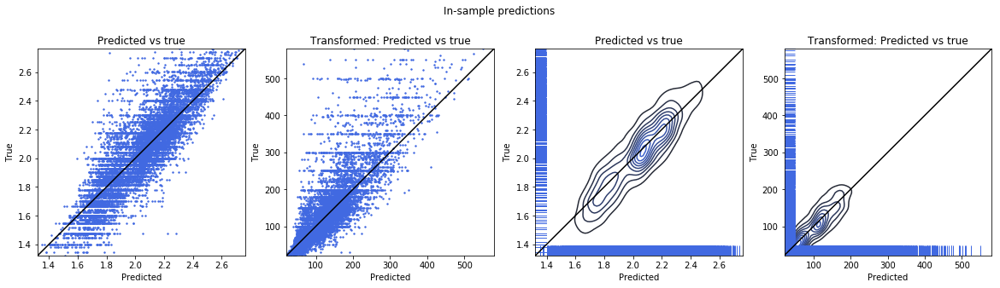

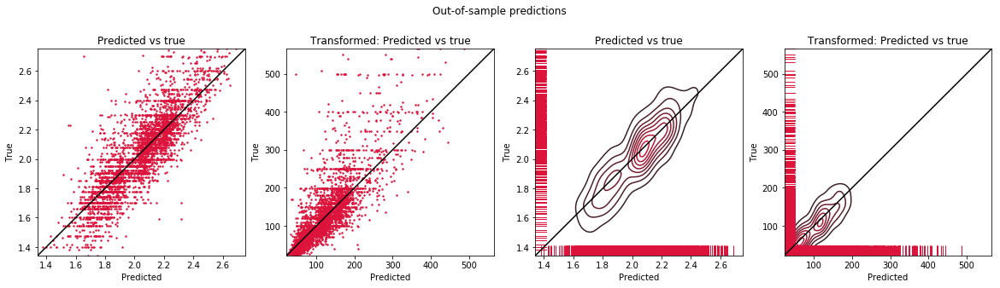

In [385]:
train_tpl = (X_train_500m, y_train_500m)
test_tpl = (X_test_500m, y_test_500m)
xgb_500m = print_results('XGB_500m.p', test_tpl, train_tpl, 'both', True)

In [386]:
best_params = xgb_500m['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 7,
 'xgb__max_depth': 8,
 'xgb__gamma': 0.0,
 'xgb__eta': 0.05,
 'xgb__colsample_bytree': 0.3}

*Constructed aggregation - 100m*

Ada Boost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.58 / RMSE train 0.16 / MAE train 0.12 / Nobs: 9203
R2 test: 0.60 / RMSE test 0.15 / MAE test 0.11 / Nobs: 2177

Transformed
-----------
R2 train: 0.45 / RMSE train 61.71 / MAE train 37.56 / Nobs: 9203
R2 test: 0.48 / RMSE test 55.59 / MAE test 35.24 / Nobs: 2177



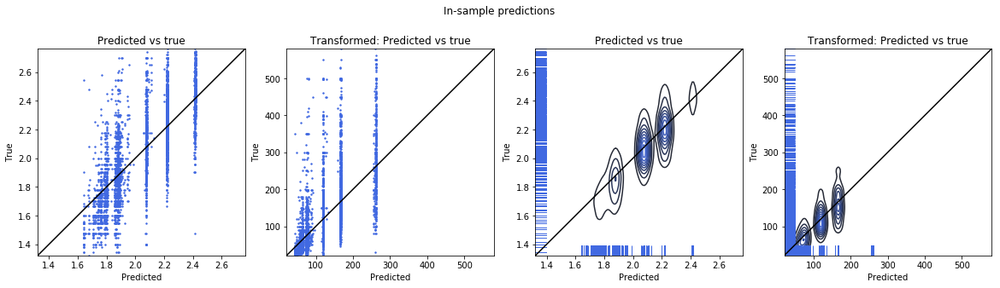

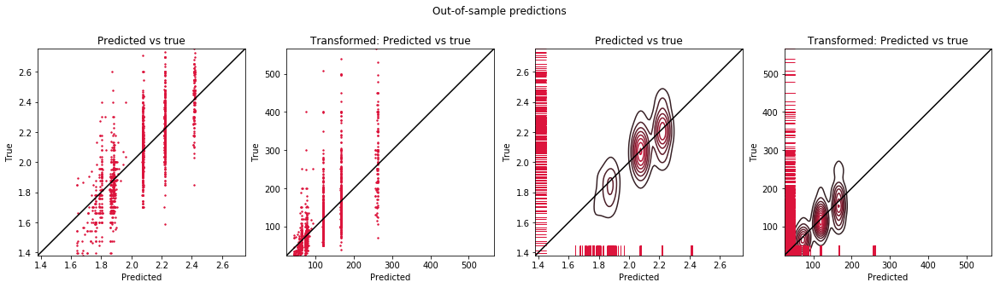

In [387]:
train_tpl = (X_train_100m, y_train_100m)
test_tpl = (X_test_100m, y_test_100m)
ada_100m = print_results('Ada_100m.p', test_tpl, train_tpl, 'both', True)

In [388]:
best_params = ada_100m['fitted_model'].best_params_
best_params

{'ada__n_estimators': 180, 'ada__loss': 'linear', 'ada__learning_rate': 0.01}

Feature importance

In [389]:
names = tuple(np.delete(train_100m.columns.values, 0))
values = tuple(ada_suburb['fitted_model'].best_estimator_.named_steps['ada'].feature_importances_)

fi_100m = pd.DataFrame(zip(names,values))
fi_100m.columns = ('Variable', 'Importance')
fi_100m

,Variable,Importance
0,Air_log_price_100m_same_room_type,0.652078
1,Air_calculated_host_listings_count,0.011896
2,Air_bathrooms,0.049620
3,Air_beds,0.009021
4,Air_bedrooms,0.101116
5,Air_accommodates,0.078223
6,Air_extra_people,0.040450
7,Air_guests_included,0.010855
8,Air_distance_to_CBD,0.027919
9,Air_property_type_2_House_Cottage_Villa,0.000374


XGBoost

Untransformed
-------------
R2 train: 0.78 / RMSE train 0.12 / MAE train 0.09 / Nobs: 9203
R2 test: 0.68 / RMSE test 0.13 / MAE test 0.10 / Nobs: 2177

Transformed
-----------
R2 train: 0.70 / RMSE train 45.04 / MAE train 27.37 / Nobs: 9203
R2 test: 0.60 / RMSE test 48.65 / MAE test 30.13 / Nobs: 2177



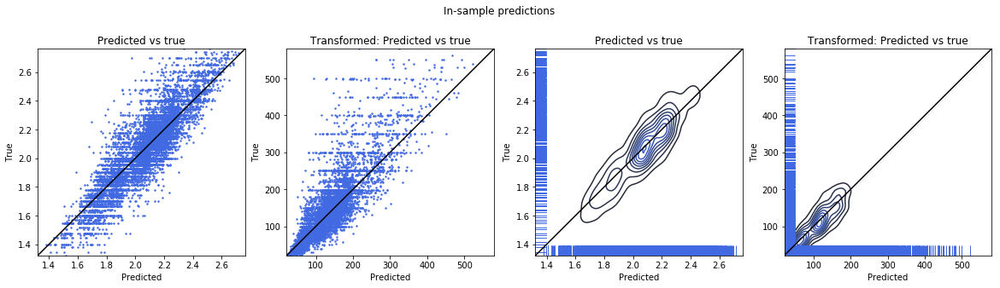

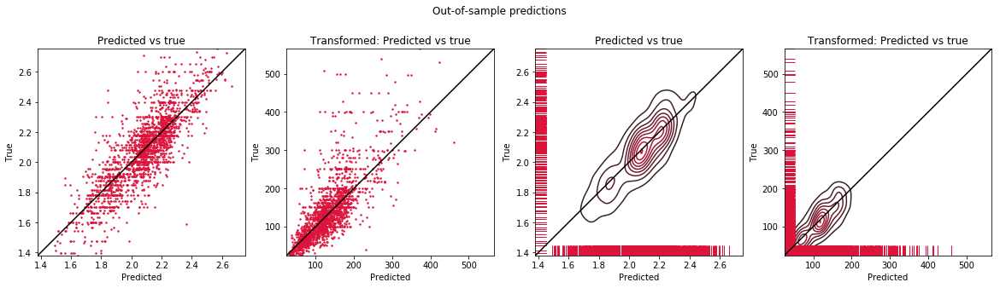

In [390]:
train_tpl = (X_train_100m, y_train_100m)
test_tpl = (X_test_100m, y_test_100m)
xgb_100m = print_results('XGB_100m.p', test_tpl, train_tpl, 'both', True)

In [391]:
best_params = xgb_100m['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 1,
 'xgb__max_depth': 12,
 'xgb__gamma': 0.1,
 'xgb__eta': 0.1,
 'xgb__colsample_bytree': 0.5}

*Constructed aggregation - 50m*

Ada Boost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.56 / RMSE train 0.15 / MAE train 0.11 / Nobs: 6522
R2 test: 0.60 / RMSE test 0.14 / MAE test 0.10 / Nobs: 1340

Transformed
-----------
R2 train: 0.42 / RMSE train 61.38 / MAE train 37.04 / Nobs: 6522
R2 test: 0.47 / RMSE test 52.96 / MAE test 33.70 / Nobs: 1340



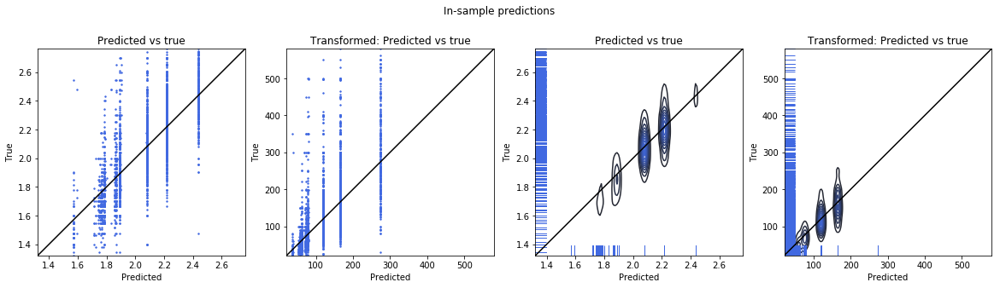

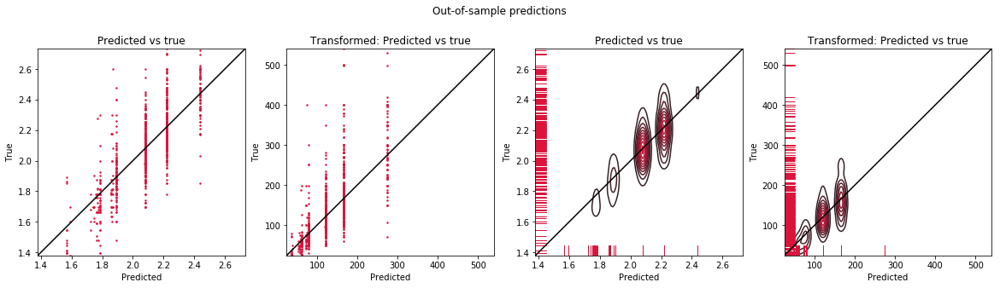

In [392]:
train_tpl = (X_train_50m, y_train_50m)
test_tpl = (X_test_50m, y_test_50m)
ada_50m = print_results('Ada_50m.p', test_tpl, train_tpl, 'both', True)

In [393]:
best_params = ada_50m['fitted_model'].best_params_
best_params

{'ada__n_estimators': 20, 'ada__loss': 'square', 'ada__learning_rate': 0.01}

Feature importance

In [394]:
names = tuple(np.delete(train_50m.columns.values, 0))
values = tuple(ada_50m['fitted_model'].best_estimator_.named_steps['ada'].feature_importances_)

fi_50m = pd.DataFrame(zip(names,values))
fi_50m.columns = ('Variable', 'Importance')
fi_50m

,Variable,Importance
0,Air_log_price_50m_same_room_type,0.026413
1,Air_calculated_host_listings_count,0.000124
2,Air_bathrooms,0.000000
3,Air_beds,0.000577
4,Air_bedrooms,0.303180
5,Air_accommodates,0.014366
6,Air_extra_people,0.005709
7,Air_guests_included,0.000547
8,Air_distance_to_CBD,0.007910
9,Air_property_type_2_House_Cottage_Villa,0.006255


XGBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.76 / RMSE train 0.11 / MAE train 0.08 / Nobs: 6522
R2 test: 0.68 / RMSE test 0.12 / MAE test 0.09 / Nobs: 1340

Transformed
-----------
R2 train: 0.69 / RMSE train 45.05 / MAE train 26.65 / Nobs: 6522
R2 test: 0.60 / RMSE test 46.15 / MAE test 28.56 / Nobs: 1340



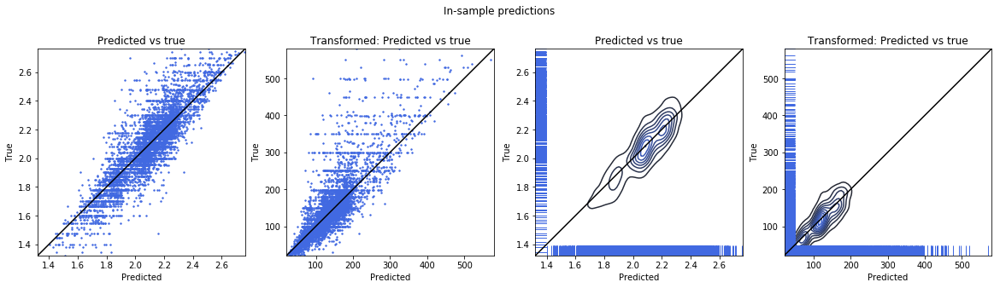

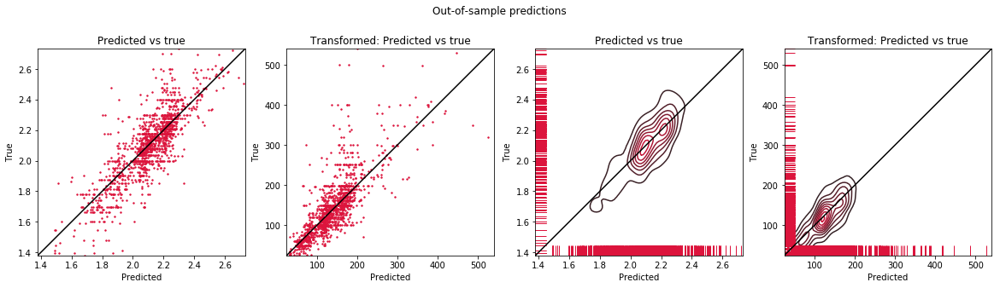

In [395]:
train_tpl = (X_train_50m, y_train_50m)
test_tpl = (X_test_50m, y_test_50m)
xgb_50m = print_results('XGB_50m.p', test_tpl, train_tpl, 'both', True)

In [396]:
best_params = xgb_50m['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 7,
 'xgb__max_depth': 8,
 'xgb__gamma': 0.0,
 'xgb__eta': 0.05,
 'xgb__colsample_bytree': 0.3}

### Summary

Let's plot the $R^2$-scores RMSE and MAE of the different model. For all of the models log airbnb prices are used as target and predictions are back transformed to airbnb prices to measure the performance.  We see that `RandomForest` and `xgboost` perform better than the other models. The constructed aggregations as `Air_log_price_500m_same_room_type`, `Air_log_price_100m_same_room_type` and `Air_log_price_50m_same_room_type` also increase the predictive power of the models. The code for the plots is adapted from https://matplotlib.org/3.2.1/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py

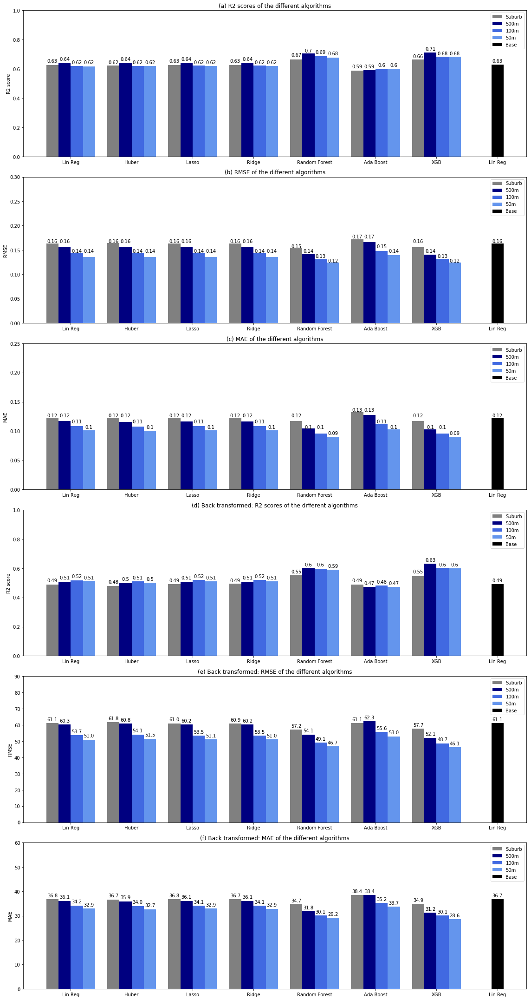

In [397]:
# Source: https://matplotlib.org/3.2.1/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py

#base['test_r2']

c1 = 'gray'
c2 = 'navy'
c3 = 'royalblue'
c4 = 'cornflowerblue'

# TRANSFORMED
#############

# R2 score
# --------
r2_suburb = [lin_reg_suburb['test_r2'], 
                huber_suburb['test_r2'],
                lasso_suburb['test_r2'],
                ridge_suburb['test_r2'],
                rf_suburb['test_r2'], 
                ada_suburb['test_r2'],
                xgb_suburb['test_r2']]

r2_500m = [lin_reg_500m['test_r2'],
              huber_500m['test_r2'],
              lasso_500m['test_r2'],
              ridge_500m['test_r2'],
              rf_500m['test_r2'],
              ada_500m['test_r2'],
              xgb_500m['test_r2']]

r2_100m = [lin_reg_100m['test_r2'],
              huber_100m['test_r2'],
              lasso_100m['test_r2'],
              ridge_100m['test_r2'],
              rf_100m['test_r2'],
              ada_100m['test_r2'],
              xgb_100m['test_r2']]

r2_50m = [lin_reg_50m['test_r2'],
              huber_50m['test_r2'],
              lasso_50m['test_r2'],
              ridge_50m['test_r2'],
              rf_50m['test_r2'],
              ada_50m['test_r2'],
              xgb_50m['test_r2']]

r2_base = base['test_r2']

# RMSE
# --------
rmse_suburb = [lin_reg_suburb['test_rmse'], 
                huber_suburb['test_rmse'],
                lasso_suburb['test_rmse'],
                ridge_suburb['test_rmse'],
                rf_suburb['test_rmse'], 
                ada_suburb['test_rmse'],
                xgb_suburb['test_rmse']]

rmse_500m = [lin_reg_500m['test_rmse'],
              huber_500m['test_rmse'],
              lasso_500m['test_rmse'],
              ridge_500m['test_rmse'],
              rf_500m['test_rmse'],
              ada_500m['test_rmse'],
              xgb_500m['test_rmse']]

rmse_100m = [lin_reg_100m['test_rmse'],
              huber_100m['test_rmse'],
              lasso_100m['test_rmse'],
              ridge_100m['test_rmse'],
              rf_100m['test_rmse'],
              ada_100m['test_rmse'],
              xgb_100m['test_rmse']]

rmse_50m = [lin_reg_50m['test_rmse'],
              huber_50m['test_rmse'],
              lasso_50m['test_rmse'],
              ridge_50m['test_rmse'],
              rf_50m['test_rmse'],
              ada_50m['test_rmse'],
              xgb_50m['test_rmse']]

rmse_base = base['test_rmse']

# MAE score
# --------
mae_suburb = [lin_reg_suburb['test_mae'], 
                huber_suburb['test_mae'],
                lasso_suburb['test_mae'],
                ridge_suburb['test_mae'],
                rf_suburb['test_mae'], 
                ada_suburb['test_mae'],
                xgb_suburb['test_mae']]

mae_500m = [lin_reg_500m['test_mae'],
              huber_500m['test_mae'],
              lasso_500m['test_mae'],
              ridge_500m['test_mae'],
              rf_500m['test_mae'],
              ada_500m['test_mae'],
              xgb_500m['test_mae']]

mae_100m = [lin_reg_100m['test_mae'],
              huber_100m['test_mae'],
              lasso_100m['test_mae'],
              ridge_100m['test_mae'],
              rf_100m['test_mae'],
              ada_100m['test_mae'],
              xgb_100m['test_mae']]

mae_50m = [lin_reg_50m['test_mae'],
              huber_50m['test_mae'],
              lasso_50m['test_mae'],
              ridge_50m['test_mae'],
              rf_50m['test_mae'],
              ada_50m['test_mae'],
              xgb_50m['test_mae']]

mae_base = base['test_mae']

# BACK TRANSFORMED
####################

# R2 score
# --------
r2_suburb_back = [lin_reg_suburb['test_r2_transformed'], 
                huber_suburb['test_r2_transformed'],
                lasso_suburb['test_r2_transformed'],
                ridge_suburb['test_r2_transformed'],
                rf_suburb['test_r2_transformed'], 
                ada_suburb['test_r2_transformed'],
                xgb_suburb['test_r2_transformed']]

r2_500m_back = [lin_reg_500m['test_r2_transformed'],
              huber_500m['test_r2_transformed'],
              lasso_500m['test_r2_transformed'],
              ridge_500m['test_r2_transformed'],
              rf_500m['test_r2_transformed'],
              ada_500m['test_r2_transformed'],
              xgb_500m['test_r2_transformed']]

r2_100m_back = [lin_reg_100m['test_r2_transformed'],
              huber_100m['test_r2_transformed'],
              lasso_100m['test_r2_transformed'],
              ridge_100m['test_r2_transformed'],
              rf_100m['test_r2_transformed'],
              ada_100m['test_r2_transformed'],
              xgb_100m['test_r2_transformed']]

r2_50m_back = [lin_reg_50m['test_r2_transformed'],
              huber_50m['test_r2_transformed'],
              lasso_50m['test_r2_transformed'],
              ridge_50m['test_r2_transformed'],
              rf_50m['test_r2_transformed'],
              ada_50m['test_r2_transformed'],
              xgb_50m['test_r2_transformed']]

r2_base_back = base['test_r2_transformed']

# RMSE
# --------
rmse_suburb_back = [lin_reg_suburb['test_rmse_transformed'], 
                huber_suburb['test_rmse_transformed'],
                lasso_suburb['test_rmse_transformed'],
                ridge_suburb['test_rmse_transformed'],
                rf_suburb['test_rmse_transformed'], 
                ada_suburb['test_rmse_transformed'],
                xgb_suburb['test_rmse_transformed']]

rmse_500m_back = [lin_reg_500m['test_rmse_transformed'],
              huber_500m['test_rmse_transformed'],
              lasso_500m['test_rmse_transformed'],
              ridge_500m['test_rmse_transformed'],
              rf_500m['test_rmse_transformed'],
              ada_500m['test_rmse_transformed'],
              xgb_500m['test_rmse_transformed']]

rmse_100m_back = [lin_reg_100m['test_rmse_transformed'],
              huber_100m['test_rmse_transformed'],
              lasso_100m['test_rmse_transformed'],
              ridge_100m['test_rmse_transformed'],
              rf_100m['test_rmse_transformed'],
              ada_100m['test_rmse_transformed'],
              xgb_100m['test_rmse_transformed']]

rmse_50m_back = [lin_reg_50m['test_rmse_transformed'],
              huber_50m['test_rmse_transformed'],
              lasso_50m['test_rmse_transformed'],
              ridge_50m['test_rmse_transformed'],
              rf_50m['test_rmse_transformed'],
              ada_50m['test_rmse_transformed'],
              xgb_50m['test_rmse_transformed']]

rmse_base_back = base['test_rmse_transformed']

# MAE score
# --------
mae_suburb_back = [lin_reg_suburb['test_mae_transformed'], 
                huber_suburb['test_mae_transformed'],
                lasso_suburb['test_mae_transformed'],
                ridge_suburb['test_mae_transformed'],
                rf_suburb['test_mae_transformed'], 
                ada_suburb['test_mae_transformed'],
                xgb_suburb['test_mae_transformed']]

mae_500m_back = [lin_reg_500m['test_mae_transformed'],
              huber_500m['test_mae_transformed'],
              lasso_500m['test_mae_transformed'],
              ridge_500m['test_mae_transformed'],
              rf_500m['test_mae_transformed'],
              ada_500m['test_mae_transformed'],
              xgb_500m['test_mae_transformed']]

mae_100m_back = [lin_reg_100m['test_mae_transformed'],
              huber_100m['test_mae_transformed'],
              lasso_100m['test_mae_transformed'],
              ridge_100m['test_mae_transformed'],
              rf_100m['test_mae_transformed'],
              ada_100m['test_mae_transformed'],
              xgb_100m['test_mae_transformed']]

mae_50m_back = [lin_reg_50m['test_mae_transformed'],
              huber_50m['test_mae_transformed'],
              lasso_50m['test_mae_transformed'],
              ridge_50m['test_mae_transformed'],
              rf_50m['test_mae_transformed'],
              ada_50m['test_mae_transformed'],
              xgb_50m['test_mae_transformed']]

mae_base_back = base['test_mae_transformed']


labels = ['Lin Reg', 'Huber', 'Lasso', 'Ridge', 'Random Forest',
         'Ada Boost', 'XGB']

factor = 2
x = np.arange(len(labels))*factor  # the label locations
x_add = len(labels)*factor
width = 0.40  # the width of the bars

fig, ax = plt.subplots(6,1, figsize=(16, 30))

# Transformed
#############

# R2 score
# --------
rects_r2_1 = ax[0].bar(x - 1.5*width, r2_suburb, width, label='Suburb', color=c1)
rects_r2_2 = ax[0].bar(x - 0.5*width, r2_500m, width, label='500m', color=c2)
rects_r2_3 = ax[0].bar(x + 0.5*width, r2_100m, width, label='100m', color=c3)
rects_r2_4 = ax[0].bar(x + 1.5*width, r2_50m, width, label='50m', color=c4)
rect_r2_base = ax[0].bar(x_add, r2_base, width, label='Base', color='black')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[0].set_ylabel('R2 score')
ax[0].set_title('(a) R2 scores of the different algorithms')
ax[0].set_xticks(np.append(x, x_add))
ax[0].set_xticklabels(labels + ['Lin Reg'])
ax[0].legend()
ax[0].set_ylim([0.0,1])

# RMSE
# ----
rects_rmse_1 = ax[1].bar(x - 1.5*width, rmse_suburb, width, label='Suburb', color=c1)
rects_rmse_2 = ax[1].bar(x - 0.5*width, rmse_500m, width, label='500m', color=c2)
rects_rmse_3 = ax[1].bar(x + 0.5*width, rmse_100m, width, label='100m', color=c3)
rects_rmse_4 = ax[1].bar(x + 1.5*width, rmse_50m, width, label='50m', color=c4)
rect_rmse_base = ax[1].bar(x_add, rmse_base, width, label='Base', color='black')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[1].set_ylabel('RMSE')
ax[1].set_title('(b) RMSE of the different algorithms')
ax[1].set_xticks(np.append(x, x_add))
ax[1].set_xticklabels(labels + ['Lin Reg'])
ax[1].legend()
ax[1].set_ylim([0.0,0.3])

# MAE
# ---
rects_mae_1 = ax[2].bar(x - 1.5*width, mae_suburb, width, label='Suburb', color=c1)
rects_mae_2 = ax[2].bar(x - 0.5*width, mae_500m, width, label='500m', color=c2)
rects_mae_3 = ax[2].bar(x + 0.5*width, mae_100m, width, label='100m', color=c3)
rects_mae_4 = ax[2].bar(x + 1.5*width, mae_50m, width, label='50m', color=c4)
rect_mae_base = ax[2].bar(x_add, mae_base, width, label='Base', color='black')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[2].set_ylabel('MAE')
ax[2].set_title('(c) MAE of the different algorithms')
ax[2].set_xticks(np.append(x, x_add))
ax[2].set_xticklabels(labels + ['Lin Reg'])
ax[2].legend()
ax[2].set_ylim([0.0,0.25])


# Back transformed
##################

# R2 score
# --------
rects_r2_1_back = ax[3].bar(x - 1.5*width, r2_suburb_back, width, label='Suburb', color=c1)
rects_r2_2_back = ax[3].bar(x - 0.5*width, r2_500m_back, width, label='500m', color=c2)
rects_r2_3_back = ax[3].bar(x + 0.5*width, r2_100m_back, width, label='100m', color=c3)
rects_r2_4_back = ax[3].bar(x + 1.5*width, r2_50m_back, width, label='50m', color=c4)
rect_r2_base_back = ax[3].bar(x_add, r2_base_back, width, label='Base', color='black')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[3].set_ylabel('R2 score')
ax[3].set_title('(d) Back transformed: R2 scores of the different algorithms')
ax[3].set_xticks(np.append(x, x_add))
ax[3].set_xticklabels(labels + ['Lin Reg'])
ax[3].legend()
ax[3].set_ylim([0.0,1])

# RMSE
# ----
rects_rmse_1_back = ax[4].bar(x - 1.5*width, rmse_suburb_back, width, label='Suburb', color=c1)
rects_rmse_2_back = ax[4].bar(x - 0.5*width, rmse_500m_back, width, label='500m', color=c2)
rects_rmse_3_back = ax[4].bar(x + 0.5*width, rmse_100m_back, width, label='100m', color=c3)
rects_rmse_4_back = ax[4].bar(x + 1.5*width, rmse_50m_back, width, label='50m', color=c4)
rect_rmse_base_back = ax[4].bar(x_add, rmse_base_back, width, label='Base', color='black')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[4].set_ylabel('RMSE')
ax[4].set_title('(e) Back transformed: RMSE of the different algorithms')
ax[4].set_xticks(np.append(x, x_add))
ax[4].set_xticklabels(labels + ['Lin Reg'])
ax[4].legend()
ax[4].set_ylim([0.0,90])

# MAE
# ---
rects_mae_1_back = ax[5].bar(x - 1.5*width, mae_suburb_back, width, label='Suburb', color=c1)
rects_mae_2_back = ax[5].bar(x - 0.5*width, mae_500m_back, width, label='500m', color=c2)
rects_mae_3_back = ax[5].bar(x + 0.5*width, mae_100m_back, width, label='100m', color=c3)
rects_mae_4_back = ax[5].bar(x + 1.5*width, mae_50m_back, width, label='50m', color=c4)
rect_mae_base_back = ax[5].bar(x_add, mae_base_back, width, label='Base', color='black')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[5].set_ylabel('MAE')
ax[5].set_title('(f) Back transformed: MAE of the different algorithms')
ax[5].set_xticks(np.append(x, x_add))
ax[5].set_xticklabels(labels + ['Lin Reg'])
ax[5].legend()
ax[5].set_ylim([0.0,60])


def autolabel(rects, pos):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        if pos in [0,1,2,3]:
            height = np.round(rect.get_height(),2)
        else:
            height = np.round(rect.get_height(),1)
        ax[pos].annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


# Transformed
autolabel(rects_r2_1, 0)
autolabel(rects_r2_2, 0)
autolabel(rects_r2_3, 0)
autolabel(rects_r2_4, 0)
autolabel(rect_r2_base, 0)

autolabel(rects_rmse_1, 1)
autolabel(rects_rmse_2, 1)
autolabel(rects_rmse_3, 1)
autolabel(rects_rmse_4, 1)
autolabel(rect_rmse_base, 1)

autolabel(rects_mae_1, 2)
autolabel(rects_mae_2, 2)
autolabel(rects_mae_3, 2)
autolabel(rects_mae_4, 2)
autolabel(rect_mae_base, 2)

# Back transformed
autolabel(rects_r2_1_back, 3)
autolabel(rects_r2_2_back, 3)
autolabel(rects_r2_3_back, 3)
autolabel(rects_r2_4_back, 3)
autolabel(rect_r2_base_back, 3)

autolabel(rects_rmse_1_back, 4)
autolabel(rects_rmse_2_back, 4)
autolabel(rects_rmse_3_back, 4)
autolabel(rects_rmse_4_back, 4)
autolabel(rect_rmse_base_back, 4)

autolabel(rects_mae_1_back, 5)
autolabel(rects_mae_2_back, 5)
autolabel(rects_mae_3_back, 5)
autolabel(rects_mae_4_back, 5)
autolabel(rect_mae_base_back, 5)

fig.tight_layout()

plt.show()

### Adaptions

In the previous sections, the models were learned on log airbnb prices. The question is whether we can increase the prediction accuracy if we directly use airbnb prices. The adaptions are tested only on Random Forest and XGBoost, the two best models from the previous part.

#### Airbnb price instead of log airbnb price

The idea is to use airbnb prices instead of log airbnb prices. From Statistics we know that a random variable $X$ is said to follow a log-normal distribution if:

$$ X = e^{\mu + \sigma Z} $$

where $Z$ is standard normally distributed and $\mu$ and $\sigma$ are the mean and the standard deviation on the log-transformed values. The definition also holds for other bases since it holds:

$$ ln(x) = \frac{log_{10}(x)}{log_{10}(e)} $$

and thus:

\begin{align}
\mu^{\ast} & = \int log_{10}(x) f(x) dx = log_{10}(e) \int ln(x) f(x) dx = log_{10}(e) \mu \\
\sigma^{\ast} & = \Big(\int (log_{10}(x)-\mu^{\ast})^2 f(x) dx \Big)^{0.5} = log_{10}(e) \Big( \int (ln(x)-\mu)^2 f(x) dx \Big)^{0.5} = log_{10}(e) \sigma
\end{align}        

Finally, we get:

$$ X = e^{\mu + \sigma Z} = e^{1/log_{10}(e)(\mu^{\ast} + \sigma^{\ast} Z)} = 10^{\mu^{\ast} + \sigma^{\ast} Z} $$

because:

$$ \Big(e^{1/log_{10}(e)}\Big)^{log_{10}(e)} = e = 10^{log_{10}(e)}$$.

A well-known result is that the mean is:

$$ E[X] = e^{\mu + \frac{1}{2}\sigma^2}$$

The median is:

$$ Med[X] = e^{\mu} = 10^{\mu^{\ast}} $$

because of $\mu^{\ast} = log_{10}(e) \mu$. We use the last result to transform the means of the log prices of the constructed aggregations to get the medians. The so transformed features are then used to directly model airbnb prices.

We now implement the adaptions on our datasets.

In [398]:
# Remark: ut stands for untransformed

# Train
#######

# Suburb
train_suburb_ut = train_suburb.copy()
train_suburb_ut['Air_log_price_suburb_same_room_type'] = \
    train_suburb.Air_log_price_suburb_same_room_type.apply(lambda x: 10**x)
train_suburb_ut['Air_log_price'] = train_suburb.Air_log_price.apply(lambda x: 10**x)
train_suburb_ut.rename(columns={'Air_log_price_suburb_same_room_type': 'Air_price_suburb_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# 500 m
train_500m_ut = train_500m.copy()
train_500m_ut['Air_log_price_500m_same_room_type'] = \
    train_500m.Air_log_price_500m_same_room_type.apply(lambda x: 10**x)
train_500m_ut['Air_log_price'] = train_500m.Air_log_price.apply(lambda x: 10**x)
train_500m_ut.rename(columns={'Air_log_price_500m_same_room_type': 'Air_price_500m_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# 100 m
train_100m_ut = train_100m.copy()
train_100m_ut['Air_log_price_100m_same_room_type'] = \
    train_100m.Air_log_price_100m_same_room_type.apply(lambda x: 10**x)
train_100m_ut['Air_log_price'] = train_100m.Air_log_price.apply(lambda x: 10**x)
train_100m_ut.rename(columns={'Air_log_price_100m_same_room_type': 'Air_price_100m_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# 50 m
train_50m_ut = train_50m.copy()
train_50m_ut['Air_log_price_50m_same_room_type'] = \
    train_50m.Air_log_price_50m_same_room_type.apply(lambda x: 10**x)
train_50m_ut['Air_log_price'] = train_50m.Air_log_price.apply(lambda x: 10**x)
train_50m_ut.rename(columns={'Air_log_price_50m_same_room_type': 'Air_price_50m_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# Baseline
train_base_ut = train_base.copy()
train_base_ut['Air_log_price'] = train_base.Air_log_price.apply(lambda x: 10**x)
train_base_ut.rename(columns={'Air_log_price': 'Air_price'}, inplace = True)

# Validation
############

# Suburb
valid_suburb_ut = valid_suburb.copy()
valid_suburb_ut['Air_log_price_suburb_same_room_type'] = \
    valid_suburb.Air_log_price_suburb_same_room_type.apply(lambda x: 10**x)
valid_suburb_ut['Air_log_price'] = valid_suburb.Air_log_price.apply(lambda x: 10**x)
valid_suburb_ut.rename(columns={'Air_log_price_suburb_same_room_type': 'Air_price_suburb_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# 500 m
valid_500m_ut = valid_500m.copy()
valid_500m_ut['Air_log_price_500m_same_room_type'] = \
    valid_500m.Air_log_price_500m_same_room_type.apply(lambda x: 10**x)
valid_500m_ut['Air_log_price'] = valid_500m.Air_log_price.apply(lambda x: 10**x)
valid_500m_ut.rename(columns={'Air_log_price_500m_same_room_type': 'Air_price_500m_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# 100 m
valid_100m_ut = valid_100m.copy()
valid_100m_ut['Air_log_price_100m_same_room_type'] = \
    valid_100m.Air_log_price_100m_same_room_type.apply(lambda x: 10**x)
valid_100m_ut['Air_log_price'] = valid_100m.Air_log_price.apply(lambda x: 10**x)
valid_100m_ut.rename(columns={'Air_log_price_100m_same_room_type': 'Air_price_100m_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# 50 m
valid_50m_ut = valid_50m.copy()
valid_50m_ut['Air_log_price_50m_same_room_type'] = \
    valid_50m.Air_log_price_50m_same_room_type.apply(lambda x: 10**x)
valid_50m_ut['Air_log_price'] = valid_50m.Air_log_price.apply(lambda x: 10**x)
valid_50m_ut.rename(columns={'Air_log_price_50m_same_room_type': 'Air_price_50m_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# Baseline
valid_base_ut = valid_base.copy()
valid_base_ut['Air_log_price'] = valid_base.Air_log_price.apply(lambda x: 10**x)
valid_base_ut.rename(columns={'Air_log_price': 'Air_price'}, inplace = True)

# Test
######

# Suburb
test_suburb_ut = test_suburb.copy()
test_suburb_ut['Air_log_price_suburb_same_room_type'] = \
    test_suburb.Air_log_price_suburb_same_room_type.apply(lambda x: 10**x)
test_suburb_ut['Air_log_price'] = test_suburb.Air_log_price.apply(lambda x: 10**x)
test_suburb_ut.rename(columns={'Air_log_price_suburb_same_room_type': 'Air_price_suburb_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# 500 m
test_500m_ut = test_500m.copy()
test_500m_ut['Air_log_price_500m_same_room_type'] = \
    test_500m.Air_log_price_500m_same_room_type.apply(lambda x: 10**x)
test_500m_ut['Air_log_price'] = test_500m.Air_log_price.apply(lambda x: 10**x)
test_500m_ut.rename(columns={'Air_log_price_500m_same_room_type': 'Air_price_500m_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# 100 m
test_100m_ut = test_100m.copy()
test_100m_ut['Air_log_price_100m_same_room_type'] = \
    test_100m.Air_log_price_100m_same_room_type.apply(lambda x: 10**x)
test_100m_ut['Air_log_price'] = test_100m.Air_log_price.apply(lambda x: 10**x)
test_100m_ut.rename(columns={'Air_log_price_100m_same_room_type': 'Air_price_100m_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# 50 m
test_50m_ut = test_50m.copy()
test_50m_ut['Air_log_price_50m_same_room_type'] = \
    test_50m.Air_log_price_50m_same_room_type.apply(lambda x: 10**x)
test_50m_ut['Air_log_price'] = test_50m.Air_log_price.apply(lambda x: 10**x)
test_50m_ut.rename(columns={'Air_log_price_50m_same_room_type': 'Air_price_50m_same_room_type',
                                'Air_log_price': 'Air_price'}, inplace = True)

# Baseline
test_base_ut = test_base.copy()
test_base_ut['Air_log_price'] = test_base.Air_log_price.apply(lambda x: 10**x)
test_base_ut.rename(columns={'Air_log_price': 'Air_price'}, inplace = True)

In [399]:
# Suburb
X_train_suburb_ut = train_suburb_ut.loc[:, ~train_suburb_ut.columns.isin(['Air_price'])].values
y_train_suburb_ut = train_suburb_ut.loc[:, 'Air_price'].values

X_valid_suburb_ut = valid_suburb_ut.loc[:, ~valid_suburb_ut.columns.isin(['Air_price'])].values
y_valid_suburb_ut = valid_suburb_ut.loc[:, 'Air_price'].values

X_test_suburb_ut = test_suburb_ut.loc[:, ~test_suburb_ut.columns.isin(['Air_price'])].values
y_test_suburb_ut = test_suburb_ut.loc[:, 'Air_price'].values

# 500m
X_train_500m_ut = train_500m_ut.loc[:, ~train_500m_ut.columns.isin(['Air_price'])].values
y_train_500m_ut = train_500m_ut.loc[:, 'Air_price'].values

X_valid_500m_ut = valid_500m_ut.loc[:, ~valid_500m_ut.columns.isin(['Air_price'])].values
y_valid_500m_ut = valid_500m_ut.loc[:, 'Air_price'].values

X_test_500m_ut = test_500m_ut.loc[:, ~test_500m_ut.columns.isin(['Air_price'])].values
y_test_500m_ut = test_500m_ut.loc[:, 'Air_price'].values

# 100m
X_train_100m_ut = train_100m_ut.loc[:, ~train_100m_ut.columns.isin(['Air_price'])].values
y_train_100m_ut = train_100m_ut.loc[:, 'Air_price'].values

X_valid_100m_ut = valid_100m_ut.loc[:, ~valid_100m_ut.columns.isin(['Air_price'])].values
y_valid_100m_ut = valid_100m_ut.loc[:, 'Air_price'].values

X_test_100m_ut = test_100m_ut.loc[:, ~test_100m_ut.columns.isin(['Air_price'])].values
y_test_100m_ut = test_100m_ut.loc[:, 'Air_price'].values

# 50m
X_train_50m_ut = train_50m_ut.loc[:, ~train_50m_ut.columns.isin(['Air_price'])].values
y_train_50m_ut = train_50m_ut.loc[:, 'Air_price'].values

X_valid_50m_ut = valid_50m_ut.loc[:, ~valid_50m_ut.columns.isin(['Air_price'])].values
y_valid_50m_ut = valid_50m_ut.loc[:, 'Air_price'].values

X_test_50m_ut = test_50m_ut.loc[:, ~test_50m_ut.columns.isin(['Air_price'])].values
y_test_50m_ut = test_50m_ut.loc[:, 'Air_price'].values

# baseline
X_train_base_ut = train_base_ut.loc[:, ~train_base_ut.columns.isin(['Air_price'])].values
y_train_base_ut = train_base_ut.loc[:, 'Air_price'].values

X_valid_base_ut = valid_base_ut.loc[:, ~valid_base_ut.columns.isin(['Air_price'])].values
y_valid_base_ut = valid_base_ut.loc[:, 'Air_price'].values

X_test_base_ut = test_base_ut.loc[:, ~test_base_ut.columns.isin(['Air_price'])].values
y_test_base_ut = test_base_ut.loc[:, 'Air_price'].values

Next, we estimate the models and plot the results. 
<!--- The prices are falsely labeled as log prices in the plots. --->

*Aggregation by suburbs*

Random Forest

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.66 / RMSE train 50.53 / MAE train 32.44 / Nobs: 14261
R2 test: 0.59 / RMSE test 55.05 / MAE test 36.17 / Nobs: 4451


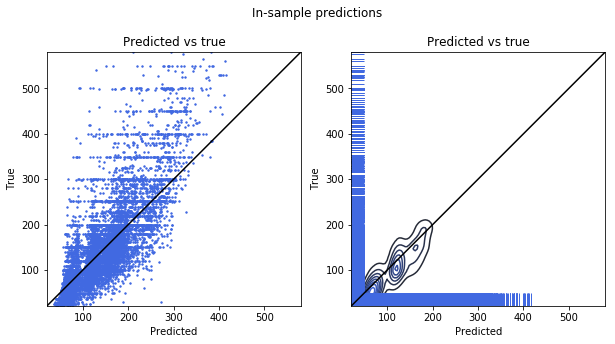

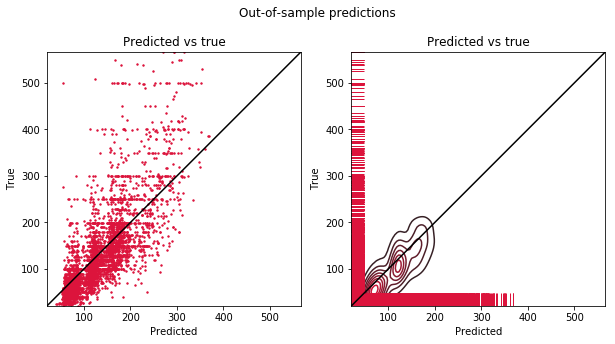

In [400]:
train_tpl = (X_train_suburb_ut, y_train_suburb_ut)
test_tpl = (X_test_suburb_ut, y_test_suburb_ut)
rf_suburb_ut = print_results('RF_suburbs_ut.p', test_tpl, train_tpl, None, True)

XGBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.69 / RMSE train 48.10 / MAE train 31.28 / Nobs: 14261
R2 test: 0.56 / RMSE test 56.52 / MAE test 36.76 / Nobs: 4451


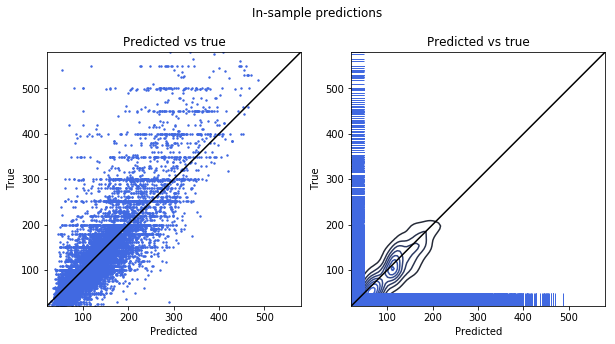

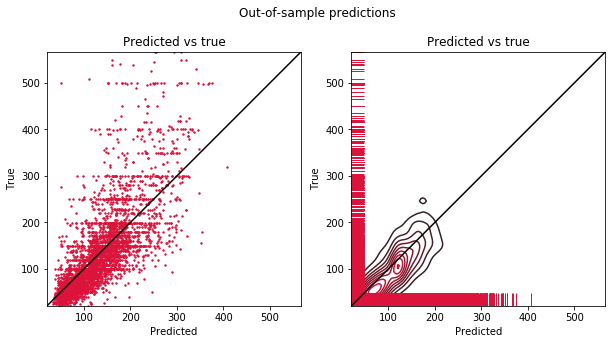

In [401]:
train_tpl = (X_train_suburb_ut, y_train_suburb_ut)
test_tpl = (X_test_suburb_ut, y_test_suburb_ut)
xgb_suburb_ut = print_results('XGB_suburbs_ut.p', test_tpl, train_tpl, None, True)

*Constructed aggregation - 500m*

Random Forest

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.78 / RMSE train 40.16 / MAE train 25.46 / Nobs: 13230
R2 test: 0.63 / RMSE test 52.38 / MAE test 33.17 / Nobs: 3739


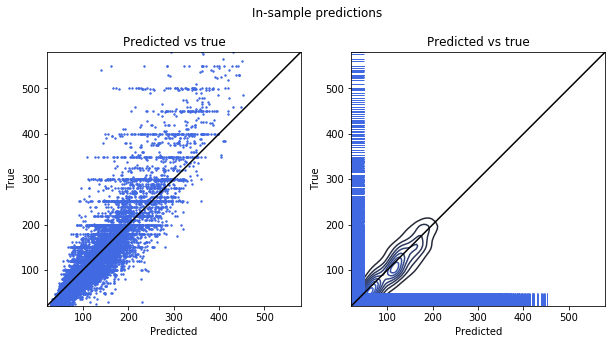

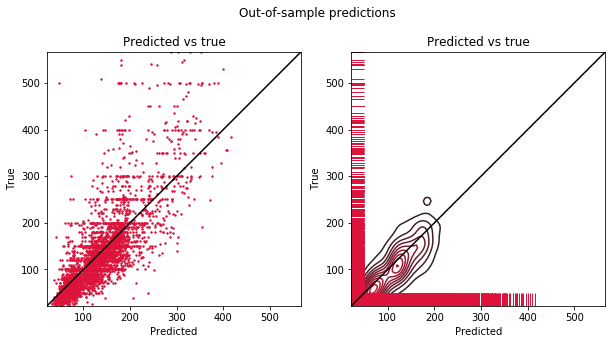

In [402]:
train_tpl = (X_train_500m_ut, y_train_500m_ut)
test_tpl = (X_test_500m_ut, y_test_500m_ut)
rf_500m_ut = print_results('RF_500m_ut.p', test_tpl, train_tpl, None, True)

XGBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.77 / RMSE train 41.13 / MAE train 26.87 / Nobs: 13230
R2 test: 0.65 / RMSE test 50.94 / MAE test 32.48 / Nobs: 3739


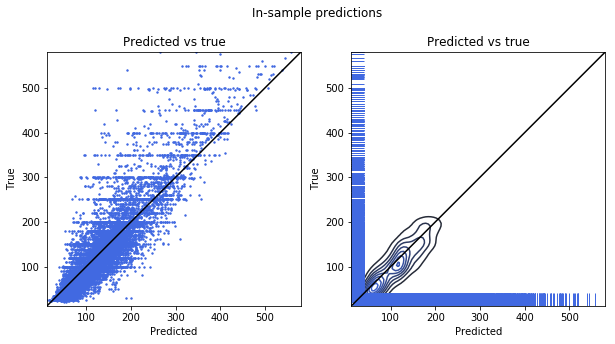

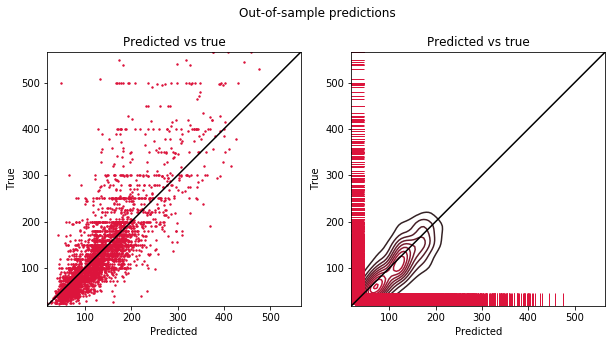

In [403]:
train_tpl = (X_train_500m_ut, y_train_500m_ut)
test_tpl = (X_test_500m_ut, y_test_500m_ut)
xgb_500m_ut = print_results('XGB_500m_ut.p', test_tpl, train_tpl, None, True)

*Constructed aggregation - 100m*

Random Forest

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.75 / RMSE train 41.09 / MAE train 26.73 / Nobs: 9203
R2 test: 0.61 / RMSE test 48.18 / MAE test 31.39 / Nobs: 2177


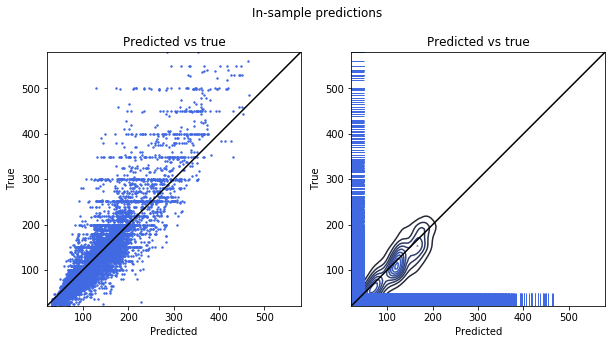

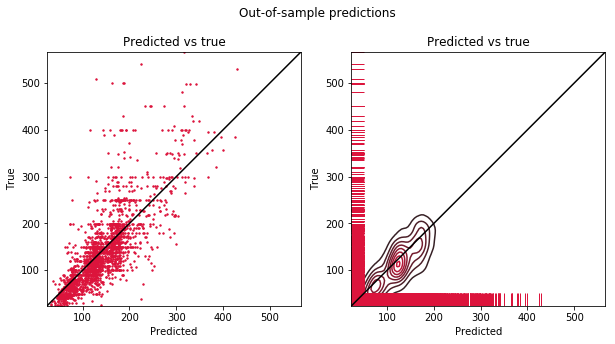

In [404]:
train_tpl = (X_train_100m_ut, y_train_100m_ut)
test_tpl = (X_test_100m_ut, y_test_100m_ut)
rf_100m_ut = print_results('RF_100m_ut.p', test_tpl, train_tpl, None, True)

XGBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.78 / RMSE train 39.12 / MAE train 25.46 / Nobs: 9203
R2 test: 0.63 / RMSE test 47.22 / MAE test 30.72 / Nobs: 2177


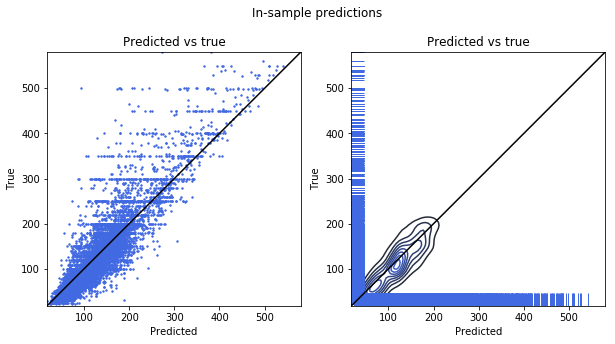

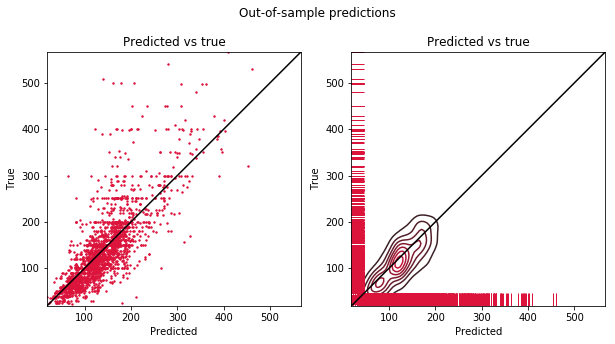

In [405]:
train_tpl = (X_train_100m_ut, y_train_100m_ut)
test_tpl = (X_test_100m_ut, y_test_100m_ut)
xgb_100m_ut = print_results('XGB_100m_ut.p', test_tpl, train_tpl, None, True)

*Constructed aggregation - 50m*

Random Forest

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.73 / RMSE train 42.35 / MAE train 27.61 / Nobs: 6522
R2 test: 0.60 / RMSE test 46.35 / MAE test 30.69 / Nobs: 1340


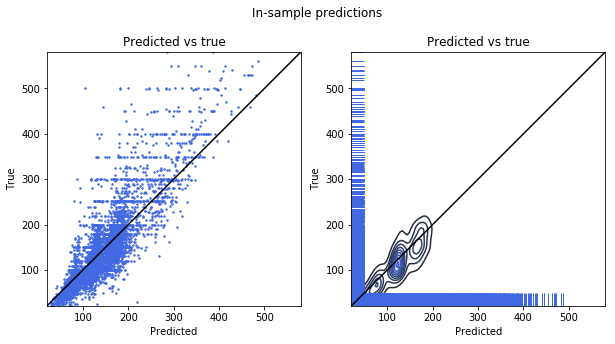

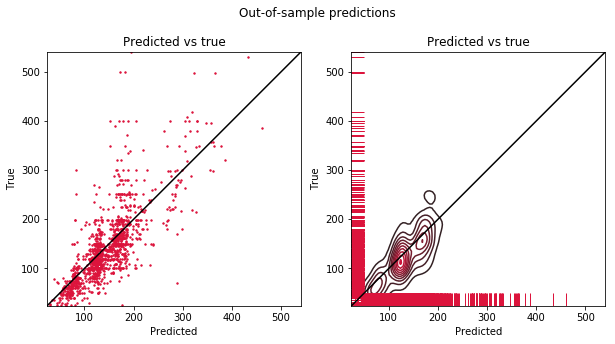

In [406]:
train_tpl = (X_train_50m_ut, y_train_50m_ut)
test_tpl = (X_test_50m_ut, y_test_50m_ut)
rf_50m_ut = print_results('RF_50m_ut.p', test_tpl, train_tpl, None, True)

XGBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.80 / RMSE train 36.55 / MAE train 23.37 / Nobs: 6522
R2 test: 0.61 / RMSE test 45.51 / MAE test 30.27 / Nobs: 1340


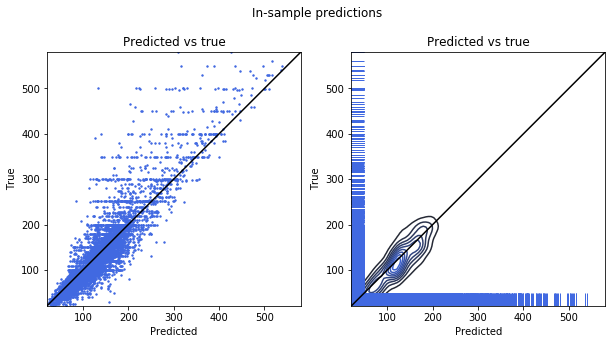

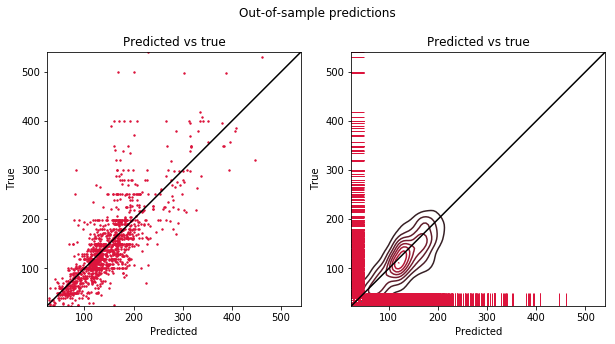

In [407]:
train_tpl = (X_train_50m_ut, y_train_50m_ut)
test_tpl = (X_test_50m_ut, y_test_50m_ut)
xgb_50m_ut = print_results('XGB_50m_ut.p', test_tpl, train_tpl, None, True)

The following plot summarizes the results. To directly estimate the models with untransformed airbnb prices slightly improves the predictions. The code for the plots is adapted from https://matplotlib.org/3.2.1/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py.

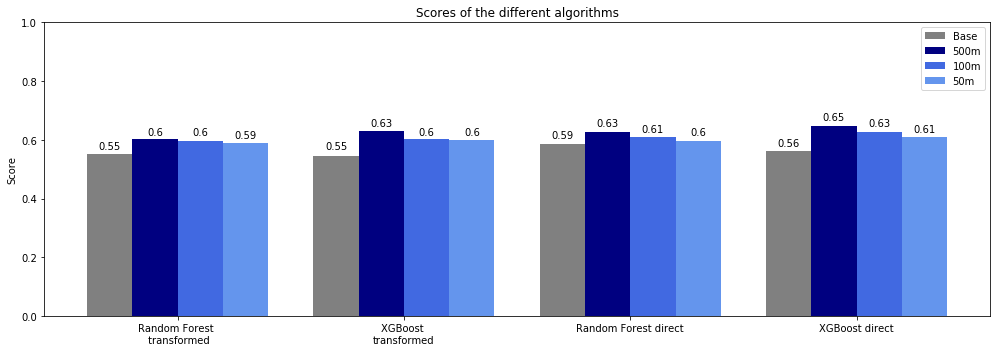

In [408]:
# Source: https://matplotlib.org/3.2.1/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py

scores_suburb = [rf_suburb['test_r2_transformed'],
                 xgb_suburb['test_r2_transformed'],
                 rf_suburb_ut['test_r2'],
                 xgb_suburb_ut['test_r2']]

scores_500m = [rf_500m['test_r2_transformed'],
               xgb_500m['test_r2_transformed'],
               rf_500m_ut['test_r2'],
               xgb_500m_ut['test_r2']]

scores_100m = [rf_100m['test_r2_transformed'],
               xgb_100m['test_r2_transformed'],
               rf_100m_ut['test_r2'],
               xgb_100m_ut['test_r2']]

scores_50m = [rf_50m['test_r2_transformed'],
               xgb_50m['test_r2_transformed'],
               rf_50m_ut['test_r2'],
               xgb_50m_ut['test_r2']]


labels = ['Random Forest \n transformed', 'XGBoost \ntransformed', 'Random Forest direct', 'XGBoost direct']

factor = 1.5
x = np.arange(len(labels))*factor  # the label locations
width = 0.30  # the width of the bars

fig, ax = plt.subplots(figsize=(14, 5))
rects1 = ax.bar(x - 1.5*width, scores_suburb, width, label='Base', color='grey')
rects2 = ax.bar(x - 0.5*width, scores_500m, width, label='500m', color='navy')
rects3 = ax.bar(x + 0.5*width, scores_100m, width, label='100m', color='royalblue')
rects4 = ax.bar(x + 1.5*width, scores_50m, width, label='50m', color='cornflowerblue')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Score')
ax.set_title('Scores of the different algorithms')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
ax.set_ylim([0.0,1])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = np.round(rect.get_height(),2)
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)

fig.tight_layout()

plt.show()

### Cross validation

We haven't used cross validation because we would mix up information from the cross validation training and test sets. Nevertheless, we use cross validation here to see if we can improve the model despite of the mentioned problem.

*Aggregation by suburbs*

In [409]:
# Concatenation of training and validation set
X_train_cv = np.concatenate([X_train_suburb, X_valid_suburb])
y_train_cv = np.concatenate([y_train_suburb, y_valid_suburb])

train_cv_tpl = (X_train_cv, y_train_cv)

Random Forest

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.93 / RMSE train 0.07 / MAE train 0.05 / Nobs: 17818
R2 test: 0.62 / RMSE test 0.16 / MAE test 0.12 / Nobs: 4451


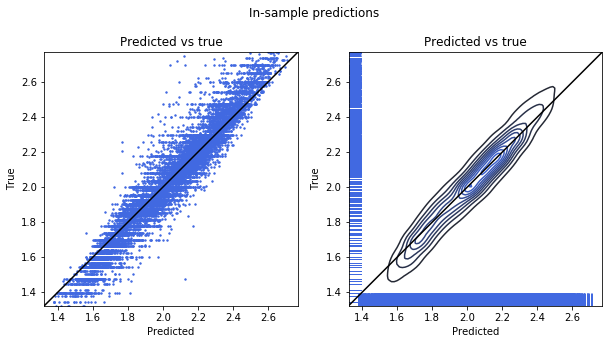

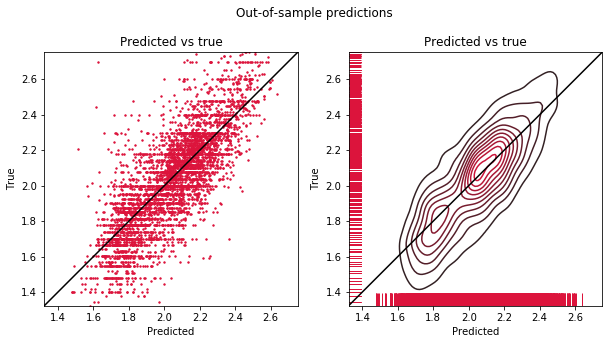

In [410]:
test_tpl = (X_test_suburb, y_test_suburb)
rf_suburb_cv = print_results('RF_suburbs_cv.p', test_tpl, train_cv_tpl, None, True)

XGBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.90 / RMSE train 0.09 / MAE train 0.06 / Nobs: 17818
R2 test: 0.37 / RMSE test 0.21 / MAE test 0.17 / Nobs: 4451


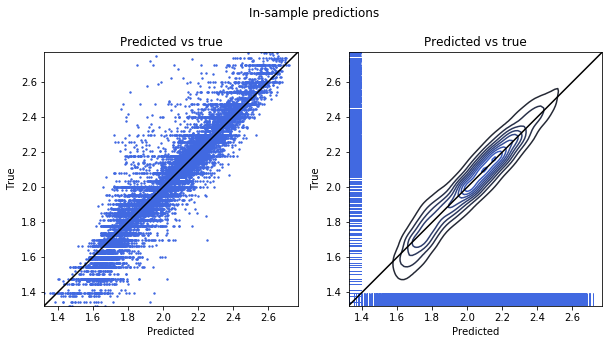

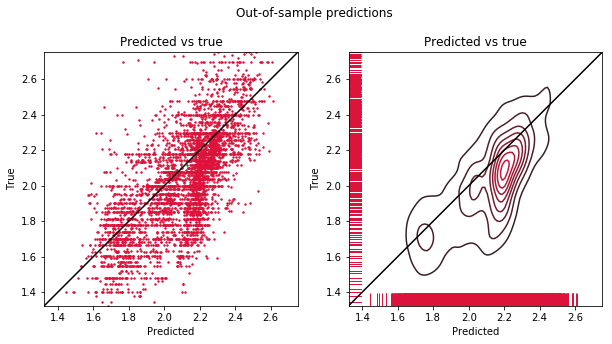

In [411]:
test_tpl = (X_test_suburb, y_test_suburb)
xgb_suburb_cv = print_results('XGB_suburbs_cv.p', test_tpl, train_cv_tpl, None, True)

*Constructed aggregations - 500m*

In [412]:
# Concatenation of training and validation set
X_train_cv = np.concatenate([X_train_500m, X_valid_500m])
y_train_cv = np.concatenate([y_train_500m, y_valid_500m])

train_cv_tpl = (X_train_cv, y_train_cv)

Random Forest

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.80 / RMSE train 0.12 / MAE train 0.09 / Nobs: 16091
R2 test: 0.70 / RMSE test 0.14 / MAE test 0.10 / Nobs: 3739


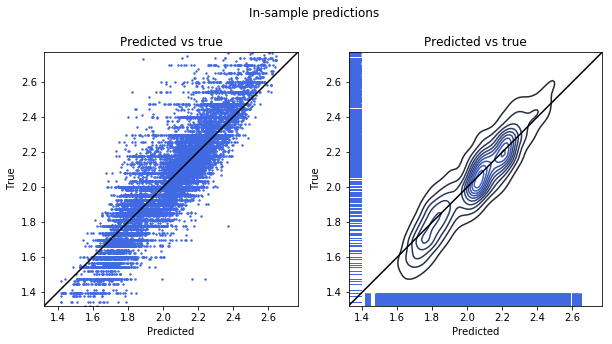

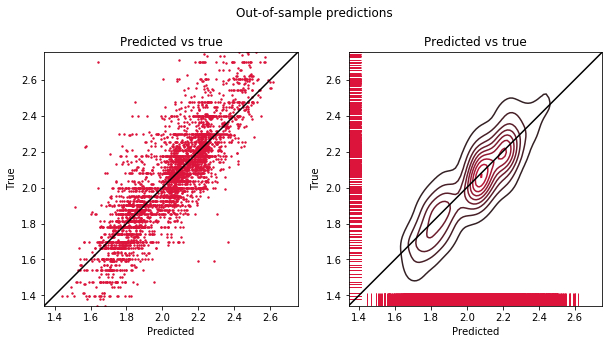

In [413]:
test_tpl = (X_test_500m, y_test_500m)
rf_500m_cv = print_results('RF_500m_cv.p', test_tpl, train_cv_tpl, None, True)

XGBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.77 / RMSE train 0.13 / MAE train 0.09 / Nobs: 16091
R2 test: 0.71 / RMSE test 0.14 / MAE test 0.10 / Nobs: 3739


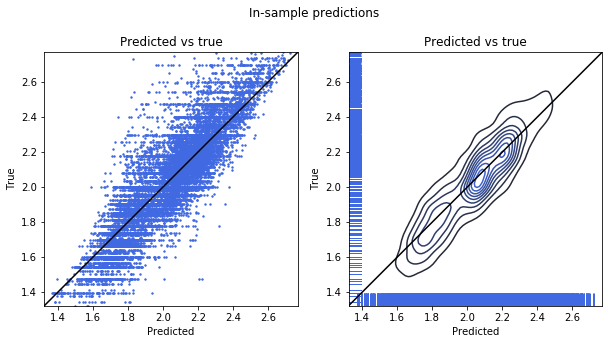

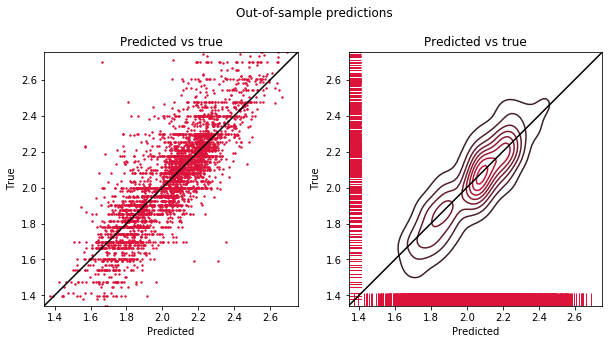

In [414]:
test_tpl = (X_test_500m, y_test_500m)
xgb_500m_cv = print_results('XGB_500m_cv.p', test_tpl, train_cv_tpl, None, True)

Again, we plot the performance measures. The code for the plots is adapted from https://matplotlib.org/3.2.1/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py.

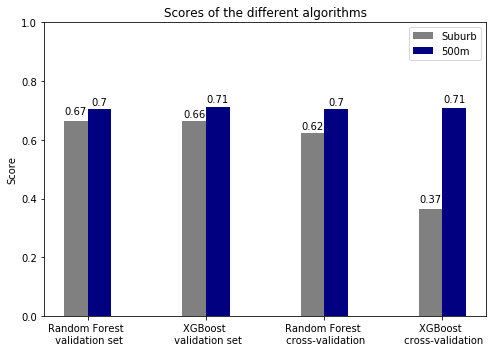

In [415]:
# Source: https://matplotlib.org/3.2.1/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py

scores_suburb = [rf_suburb['test_r2'],
                 xgb_suburb['test_r2'],
                 rf_suburb_cv['test_r2'],
                 xgb_suburb_cv['test_r2']]

scores_500m = [rf_500m['test_r2'],
               xgb_500m['test_r2'],
               rf_500m_cv['test_r2'],
               xgb_500m_cv['test_r2']]


labels = ['Random Forest \n validation set', 'XGBoost \n validation set', 'Random Forest \n cross-validation', 'XGBoost \n cross-validation']

factor = 1.5
x = np.arange(len(labels))*factor  # the label locations
width = 0.30  # the width of the bars

fig, ax = plt.subplots(figsize=(7, 5))
rects1 = ax.bar(x - 0.5*width, scores_suburb, width, label='Suburb', color='grey')
rects2 = ax.bar(x + 0.5*width, scores_500m, width, label='500m', color='navy')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Score')
ax.set_title('Scores of the different algorithms')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
ax.set_ylim([0.0,1])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = np.round(rect.get_height(),2)
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

#### Additional variables

From the EDA part we  know that it might be useful to include `Air_cleaning_fee` and `Air_review_scores_location`. Whether we can improve our models this way is investigated next. We predict airbnb prices directly and indirectly via log airbnb prices and a back transformation.

In [416]:
train_one_hot = pd.get_dummies(train.loc[:, ['Air_property_type_2', 'Air_room_type', 
                                      'Air_cancellation_policy_2', 
                                      'Air_neighbourhood_cleansed']],
                              drop_first=True)
train_one_hot.head(5)

valid_one_hot = pd.get_dummies(valid.loc[:, ['Air_property_type_2', 'Air_room_type', 
                                      'Air_cancellation_policy_2', 
                                      'Air_neighbourhood_cleansed']],
                              drop_first=True)
valid_one_hot.head(5)

test_one_hot = pd.get_dummies(test.loc[:, ['Air_property_type_2', 'Air_room_type', 
                                      'Air_cancellation_policy_2',
                                      'Air_neighbourhood_cleansed']],
                             drop_first=True)
test_one_hot.head(5)

,Air_property_type_2_House_Cottage_Villa,Air_property_type_2_Other,Air_property_type_2_Townhouse,Air_room_type_Private room,Air_room_type_Shared room,Air_cancellation_policy_2_moderate,Air_cancellation_policy_2_strict,Air_neighbourhood_cleansed_Bayside,Air_neighbourhood_cleansed_Boroondara,Air_neighbourhood_cleansed_Brimbank,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [417]:
# Train
train_add = pd.concat([merged_train.loc[:, ['Air_log_price',
                                            'Air_log_price_500m_same_room_type', # 0
                                            'Air_calculated_host_listings_count', # 1
                                            'Air_cleaning_fee', # 2
                                            'Air_bathrooms', # 3
                                            'Air_beds', # 4
                                            'Air_bedrooms', # 5
                                            'Air_accommodates', # 6
                                            'Air_extra_people', # 7
                                            'Air_guests_included', # 8
                                            'Air_distance_to_CBD', # 9
                                            'Air_review_scores_location' # 10
                                           ]],
                                       train_one_hot], axis=1)

# Valid
valid_add = pd.concat([merged_train.loc[:, ['Air_log_price', 
                                            'Air_log_price_500m_same_room_type', # 0
                                            'Air_calculated_host_listings_count', # 1
                                            'Air_cleaning_fee', # 2
                                            'Air_bathrooms', # 3
                                            'Air_beds', # 4
                                            'Air_bedrooms', # 5
                                            'Air_accommodates', # 6
                                            'Air_extra_people', # 7
                                            'Air_guests_included', # 8
                                            'Air_distance_to_CBD', # 9
                                            'Air_review_scores_location' # 10
                                           ]],
                                      valid_one_hot], axis=1)

# Test
test_add = pd.concat([merged_test.loc[:, ['Air_log_price', 
                                          'Air_log_price_500m_same_room_type', # 0
                                          'Air_calculated_host_listings_count', # 1
                                          'Air_cleaning_fee', # 2
                                          'Air_bathrooms', # 3
                                          'Air_beds', # 4
                                          'Air_bedrooms', # 5
                                          'Air_accommodates', # 6
                                          'Air_extra_people', # 7
                                          'Air_guests_included', # 8
                                          'Air_distance_to_CBD', # 9
                                          'Air_review_scores_location' # 10
                                         ]],
                                      test_one_hot], axis=1)

In [418]:
train_add.head(5)

,Air_log_price,Air_log_price_500m_same_room_type,Air_calculated_host_listings_count,Air_cleaning_fee,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,1.954243,1.887373,1.0,0.0,1.0,1.0,1.0,2.0,0.0,1.0,...,0,0,0,0,0,0,0,0,0,0
1,1.812913,1.774898,3.0,20.0,NaN,1.0,1.0,1.0,0.0,1.0,...,0,0,0,0,0,1,0,0,0,0
2,2.176091,2.327473,1.0,60.0,2.0,2.0,2.0,4.0,0.0,1.0,...,0,0,0,0,0,0,0,0,0,0
3,1.662758,1.887697,1.0,NaN,1.0,1.0,1.0,2.0,0.0,1.0,...,0,0,0,0,0,0,0,0,0,0
4,1.949390,1.700186,1.0,20.0,1.0,1.0,2.0,2.0,0.0,1.0,...,0,1,0,0,0,0,0,0,0,0


In [419]:
train_add_log = train_add.copy()
valid_add_log = valid_add.copy()
test_add_log = test_add.copy()

In [420]:
# Transformation
# --------------

# Train
#######

train_add['Air_log_price_500m_same_room_type'] = \
    train_add.Air_log_price_500m_same_room_type.apply(lambda x: 10**x)
train_add['Air_log_price'] = train_add.Air_log_price.apply(lambda x: 10**x)
train_add.rename(columns={'Air_log_price_500m_same_room_type': 'Air_price_500m_same_room_type',
                          'Air_log_price': 'Air_price'}, inplace = True)


# Validation
############

valid_add['Air_log_price_500m_same_room_type'] = \
    valid_add.Air_log_price_500m_same_room_type.apply(lambda x: 10**x)
valid_add['Air_log_price'] = valid_add.Air_log_price.apply(lambda x: 10**x)
valid_add.rename(columns={'Air_log_price_500m_same_room_type': 'Air_price_500m_same_room_type',
                          'Air_log_price': 'Air_price'}, inplace = True)

# Test
######

test_add['Air_log_price_500m_same_room_type'] = \
    test_add.Air_log_price_500m_same_room_type.apply(lambda x: 10**x)
test_add['Air_log_price'] = test_add.Air_log_price.apply(lambda x: 10**x)
test_add.rename(columns={'Air_log_price_500m_same_room_type': 'Air_price_500m_same_room_type',
                          'Air_log_price': 'Air_price'}, inplace = True)

In [421]:
train_add.head()

,Air_price,Air_price_500m_same_room_type,Air_calculated_host_listings_count,Air_cleaning_fee,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,90.0,77.156558,1.0,0.0,1.0,1.0,1.0,2.0,0.0,1.0,...,0,0,0,0,0,0,0,0,0,0
1,65.0,59.552222,3.0,20.0,NaN,1.0,1.0,1.0,0.0,1.0,...,0,0,0,0,0,1,0,0,0,0
2,150.0,212.555875,1.0,60.0,2.0,2.0,2.0,4.0,0.0,1.0,...,0,0,0,0,0,0,0,0,0,0
3,46.0,77.214240,1.0,NaN,1.0,1.0,1.0,2.0,0.0,1.0,...,0,0,0,0,0,0,0,0,0,0
4,89.0,50.140159,1.0,20.0,1.0,1.0,2.0,2.0,0.0,1.0,...,0,1,0,0,0,0,0,0,0,0


In [422]:
valid_add.head()

,Air_price,Air_price_500m_same_room_type,Air_calculated_host_listings_count,Air_cleaning_fee,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,90.0,77.156558,1.0,0.0,1.0,1.0,1.0,2.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,65.0,59.552222,3.0,20.0,NaN,1.0,1.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,150.0,212.555875,1.0,60.0,2.0,2.0,2.0,4.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,46.0,77.214240,1.0,NaN,1.0,1.0,1.0,2.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,89.0,50.140159,1.0,20.0,1.0,1.0,2.0,2.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [423]:
test_add.head()

,Air_price,Air_price_500m_same_room_type,Air_calculated_host_listings_count,Air_cleaning_fee,Air_bathrooms,Air_beds,Air_bedrooms,Air_accommodates,Air_extra_people,Air_guests_included,...,Air_neighbourhood_cleansed_Moonee Valley,Air_neighbourhood_cleansed_Moreland,Air_neighbourhood_cleansed_Nillumbik,Air_neighbourhood_cleansed_Port Phillip,Air_neighbourhood_cleansed_Stonnington,Air_neighbourhood_cleansed_Whitehorse,Air_neighbourhood_cleansed_Whittlesea,Air_neighbourhood_cleansed_Wyndham,Air_neighbourhood_cleansed_Yarra,Air_neighbourhood_cleansed_Yarra Ranges
0,136.0,133.789691,62.0,60.0,1.0,1.0,0.0,2.0,0.0,1.0,...,0,0,0,0,1,0,0,0,0,0
1,35.0,50.000000,1.0,NaN,1.0,1.0,1.0,2.0,0.0,1.0,...,0,0,0,0,0,1,0,0,0,0
2,100.0,170.574044,1.0,45.0,1.0,1.0,1.0,2.0,0.0,1.0,...,0,0,0,0,0,0,0,0,0,0
3,150.0,NaN,1.0,50.0,2.0,3.0,3.0,6.0,10.0,2.0,...,0,0,0,0,0,1,0,0,0,0
4,145.0,128.177536,5.0,160.0,1.0,3.0,2.0,6.0,15.0,1.0,...,0,0,0,0,0,0,0,0,0,0


In [424]:
# Direct
X_train_add = train_add.loc[:, ~train_add.columns.isin(['Air_price'])] #.values
y_train_add = train_add.loc[:, 'Air_price'] #.values

X_valid_add = valid_add.loc[:, ~valid_add.columns.isin(['Air_price'])] #.values
y_valid_add = valid_add.loc[:, 'Air_price'] #.values

X_test_add = test_add.loc[:, ~test_add.columns.isin(['Air_price'])] #.values
y_test_add = test_add.loc[:, 'Air_price'] #.values

# Log transformed
X_train_add_log = train_add_log.loc[:, ~train_add_log.columns.isin(['Air_log_price'])] #.values
y_train_add_log = train_add_log.loc[:, 'Air_log_price'] #.values

X_valid_add_log = valid_add_log.loc[:, ~valid_add_log.columns.isin(['Air_log_price'])] #.values
y_valid_add_log = valid_add_log.loc[:, 'Air_log_price'] #.values

X_test_add_log = test_add_log.loc[:, ~test_add_log.columns.isin(['Air_log_price'])] #.values
y_test_add_log = test_add_log.loc[:, 'Air_log_price'] #.values

**Direct**

In [425]:
train_tpl = (X_train_add, y_train_add)
valid_tpl = (X_valid_add, y_valid_add)

*Constructed aggregation - 500m*

Random Forest

*This stepis time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.89 / RMSE train 26.18 / MAE train 16.42 / Nobs: 8448
R2 test: 0.65 / RMSE test 48.92 / MAE test 30.16 / Nobs: 2453


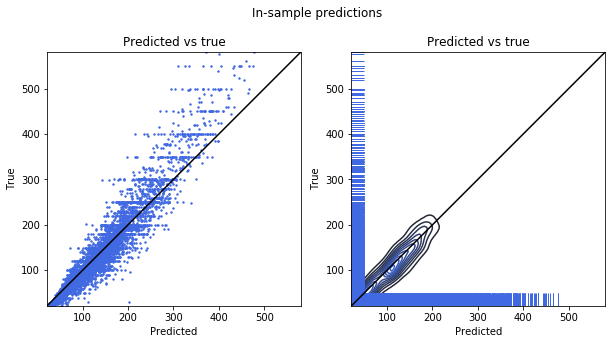

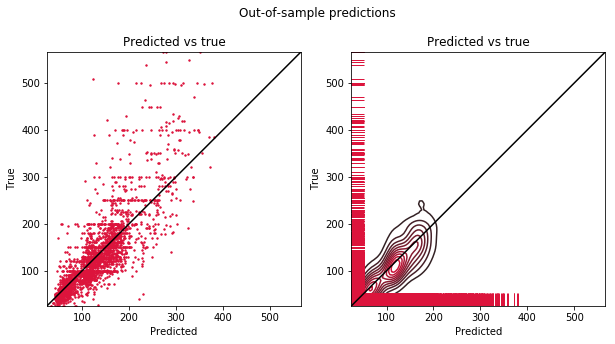

In [426]:
test_tpl = (X_test_add, y_test_add)
rf_add = print_results('RF_add.p', test_tpl, train_tpl, None, True)

In [427]:
best_params = rf_add['fitted_model'].best_params_
best_params

{'n_estimators': 40,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': None}

XGBoost

Untransformed
-------------
R2 train: 0.99 / RMSE train 5.69 / MAE train 3.39 / Nobs: 8448
R2 test: 0.63 / RMSE test 50.16 / MAE test 31.12 / Nobs: 2453


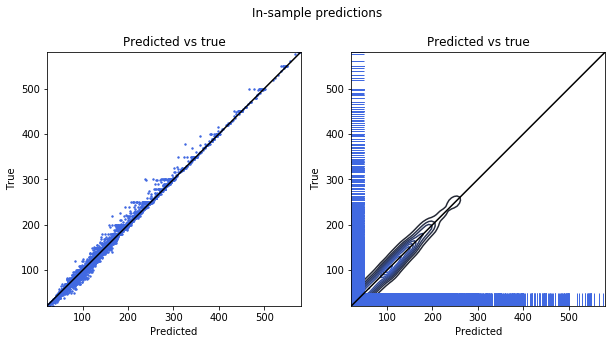

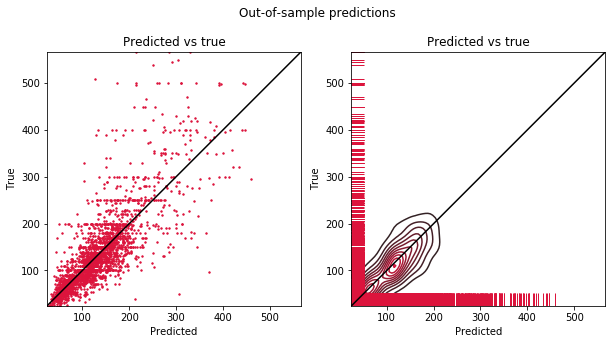

In [428]:
test_tpl = (X_test_add, y_test_add)
xgb_add = print_results('XGB_add.p', test_tpl, train_tpl, None, True)

In [429]:
best_params = xgb_add['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 1,
 'xgb__max_depth': 15,
 'xgb__gamma': 0.4,
 'xgb__eta': 0.3,
 'xgb__colsample_bytree': 1}

**Log-transformation**

In [430]:
train_tpl = (X_train_add_log, y_train_add_log)
valid_tpl = (X_valid_add_log, y_valid_add_log)

*Constructed aggregation - 500m*

Random Forest

Untransformed
-------------
R2 train: 0.92 / RMSE train 0.07 / MAE train 0.05 / Nobs: 8448
R2 test: 0.73 / RMSE test 0.13 / MAE test 0.09 / Nobs: 2453

Transformed
-----------
R2 train: 0.87 / RMSE train 28.67 / MAE train 16.35 / Nobs: 8448
R2 test: 0.63 / RMSE test 50.34 / MAE test 29.42 / Nobs: 2453



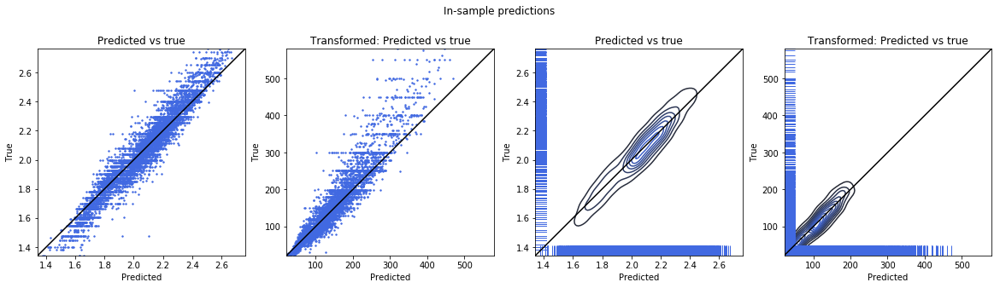

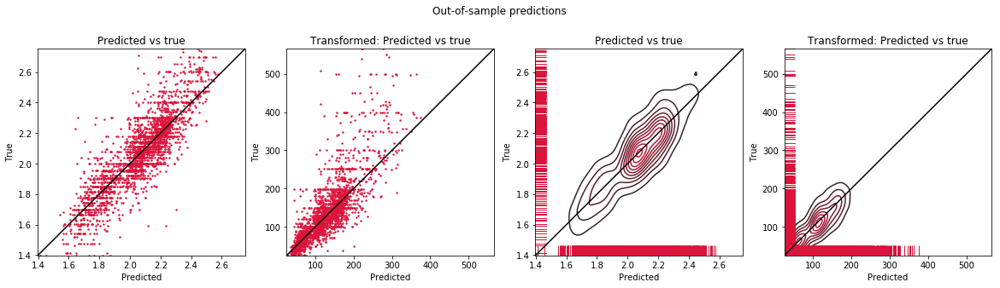

In [431]:
test_tpl = (X_test_add_log, y_test_add_log)
rf_add_log = print_results('RF_add_log.p', test_tpl, train_tpl, 'both', True)

In [432]:
best_params = rf_add_log['fitted_model'].best_params_
best_params

{'n_estimators': 40,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': None}

XGBoost

Untransformed
-------------
R2 train: 0.96 / RMSE train 0.05 / MAE train 0.03 / Nobs: 8448
R2 test: 0.73 / RMSE test 0.13 / MAE test 0.09 / Nobs: 2453

Transformed
-----------
R2 train: 0.94 / RMSE train 18.98 / MAE train 10.63 / Nobs: 8448
R2 test: 0.65 / RMSE test 48.78 / MAE test 29.35 / Nobs: 2453



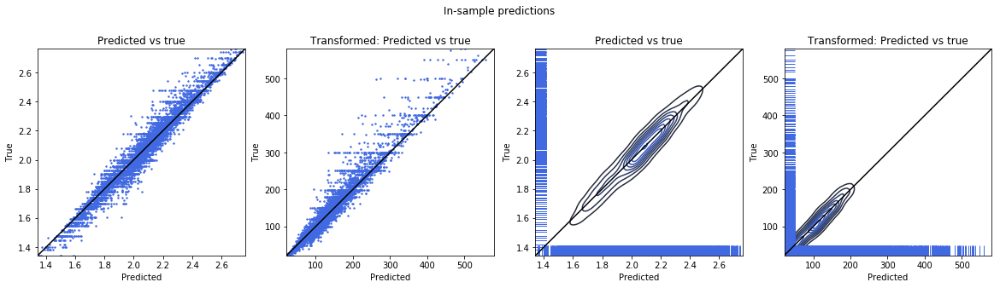

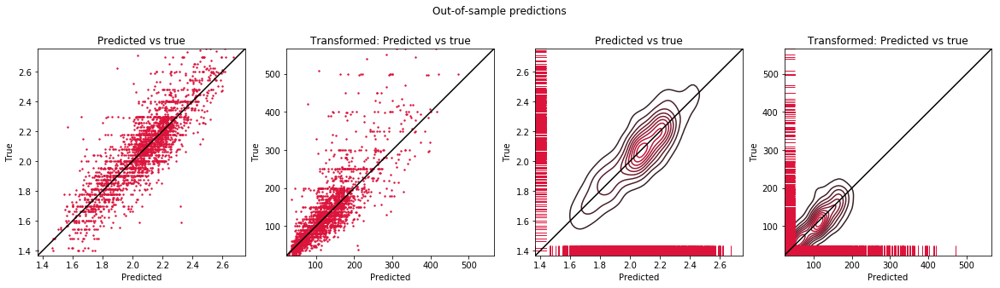

In [433]:
test_tpl = (X_test_add_log, y_test_add_log)
xgb_add_log = print_results('XGB_add_log.p', test_tpl, train_tpl, 'both', True)

In [434]:
best_params = xgb_add_log['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 5,
 'xgb__max_depth': 15,
 'xgb__gamma': 0.0,
 'xgb__eta': 0.05,
 'xgb__colsample_bytree': 0.7}

#### PCA on specific variables

The idea of this section is to apply PCA (principal components analysis) on specific variables as e.g. the variables about the size of the accommodations or the neighbourhoods. This can be done by applying `FeatureUnion`and `FunctionTransformer`.`StandardScaler` is used upfront. A less error prone implementation of the transformation function (see the next cell) might be achieved by using `sklearn-pandas`. Again, airbnb prices are predicted directly and indirectly.

**Literature** <br>
https://stackoverflow.com/questions/53561598/sklearn-pipeline-with-pca-on-feature-subset-using-functiontransformer <br>
https://github.com/scikit-learn-contrib/sklearn-pandas

In [435]:
# A less error prone approache would be based on subsetting the data by variable names. 
# This might be achieved by `sklearn-pandas`. 
d2 = X_train_add.shape[1]
set_acc = set(np.arange(3,9))
set_neigh = set(np.arange(11,d2))
set_all = set(np.arange(d2))
set_rest = set_all.difference(set_acc)
set_rest = set_rest.difference(set_neigh)

def accommodation_info(X):
    return X[:, list(set_all)]

def neighbourhood(X):
    return X[:, list(set_neigh)]

def exclude(X):
    return X[:, list(set_rest)]

In [436]:
# Source: https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 20, stop = 200, num = 10)]

# Number of features to consider at every split
max_features = ['sqrt', 'log2']

# Maximum number of levels in tree (there are 47 features in total in this example)
max_depth = [int(x) for x in np.linspace(5, 20, num = 4)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4, 6, 10]

param_grid_rf_pca = {'rf__n_estimators': n_estimators,
                     'rf__max_features': max_features,
                     'rf__max_depth': max_depth,
                     'rf__min_samples_split': min_samples_split,
                     'rf__min_samples_leaf': min_samples_leaf,
                     'feats__pipe1__pca1__n_components': [1,2,3,4,5,6],
                     'feats__pipe2__pca2__n_components': [1,2,3,4,5,6]
                    }

print(param_grid_rf_pca)

{'rf__n_estimators': [20, 40, 60, 80, 100, 120, 140, 160, 180, 200], 'rf__max_features': ['sqrt', 'log2'], 'rf__max_depth': [5, 10, 15, 20, None], 'rf__min_samples_split': [2, 5, 10], 'rf__min_samples_leaf': [1, 2, 4, 6, 10], 'feats__pipe1__pca1__n_components': [1, 2, 3, 4, 5, 6], 'feats__pipe2__pca2__n_components': [1, 2, 3, 4, 5, 6]}


In [437]:
param_grid_xgb_pca = {'xgb__eta': [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ],
                      'xgb__max_depth' : [ 3, 4, 5, 6, 8, 10, 12, 15],
                      'xgb__min_child_weight' : [ 1, 3, 5, 7 ],
                      'xgb__gamma': [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
                      'feats__pipe1__pca1__n_components': [1,2,3,4,5,6],
                      'feats__pipe2__pca2__n_components': [1,2,3,4,5,6]
             }

**Direct**

In [438]:
train_tpl = (X_train_add, y_train_add)
valid_tpl = (X_valid_add, y_valid_add)

*Constructed aggregation - 500m*

Random Forest

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.89 / RMSE train 25.82 / MAE train 16.68 / Nobs: 8448
R2 test: 0.59 / RMSE test 52.88 / MAE test 33.30 / Nobs: 2453


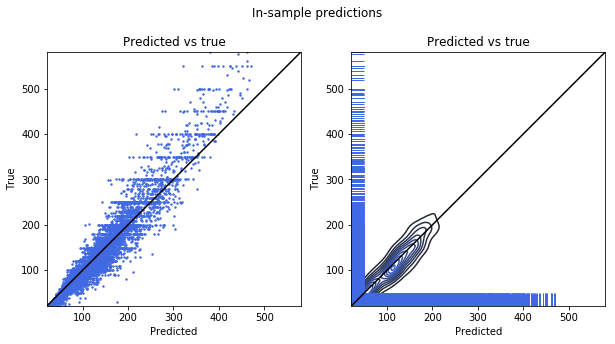

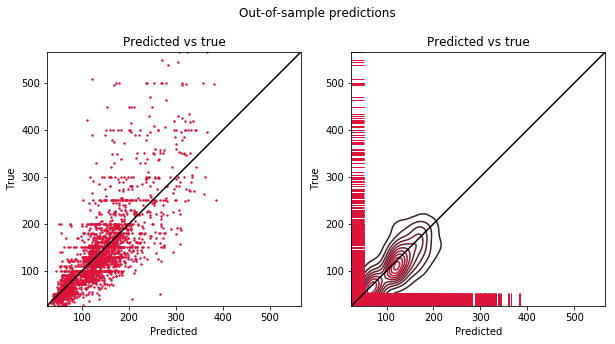

In [439]:
test_tpl = (X_test_add, y_test_add)
rf_add_pca_sub = print_results('RF_add_pca_sub.p', test_tpl, train_tpl, None, True)

In [440]:
best_params = rf_add_pca_sub['fitted_model'].best_params_
best_params

{'rf__n_estimators': 40,
 'rf__min_samples_split': 5,
 'rf__min_samples_leaf': 1,
 'rf__max_features': 'log2',
 'rf__max_depth': 20,
 'feats__pipe2__pca2__n_components': 2,
 'feats__pipe1__pca1__n_components': 1}

XGBoost

Untransformed
-------------
R2 train: 0.91 / RMSE train 23.54 / MAE train 15.48 / Nobs: 8448
R2 test: 0.55 / RMSE test 55.21 / MAE test 35.02 / Nobs: 2453


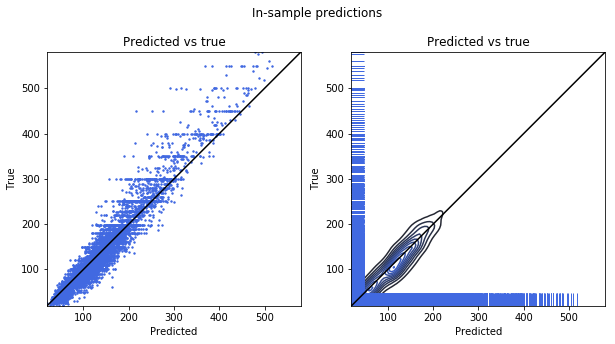

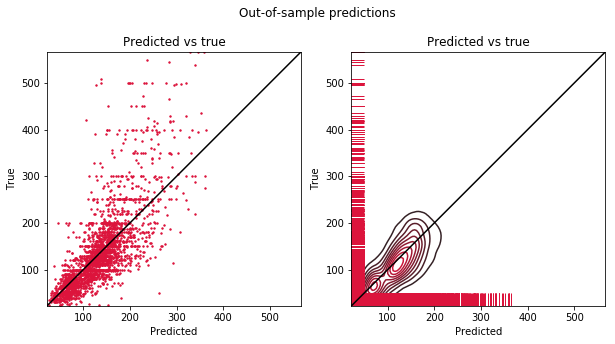

In [441]:
test_tpl = (X_test_add, y_test_add)
xgb_add_pca_sub = print_results('XGB_add_pca_sub.p', test_tpl, train_tpl, None, True)

In [442]:
best_params = xgb_add_pca_sub['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 3,
 'xgb__max_depth': 12,
 'xgb__gamma': 0.4,
 'xgb__eta': 0.25,
 'feats__pipe2__pca2__n_components': 1,
 'feats__pipe1__pca1__n_components': 3}

**Log-transformation**

In [443]:
train_tpl = (X_train_add_log, y_train_add_log)
valid_tpl = (X_valid_add_log, y_valid_add_log)

*Constructed aggregation - 500m*

Random Forest

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.92 / RMSE train 0.07 / MAE train 0.05 / Nobs: 8448
R2 test: 0.68 / RMSE test 0.14 / MAE test 0.10 / Nobs: 2453

Transformed
-----------
R2 train: 0.87 / RMSE train 28.23 / MAE train 16.63 / Nobs: 8448
R2 test: 0.57 / RMSE test 54.43 / MAE test 32.71 / Nobs: 2453



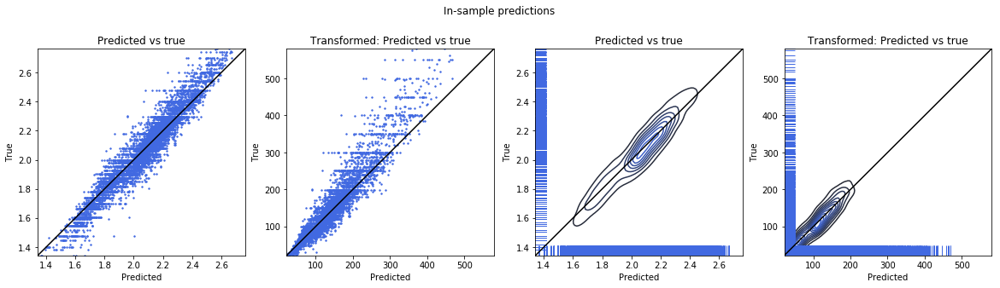

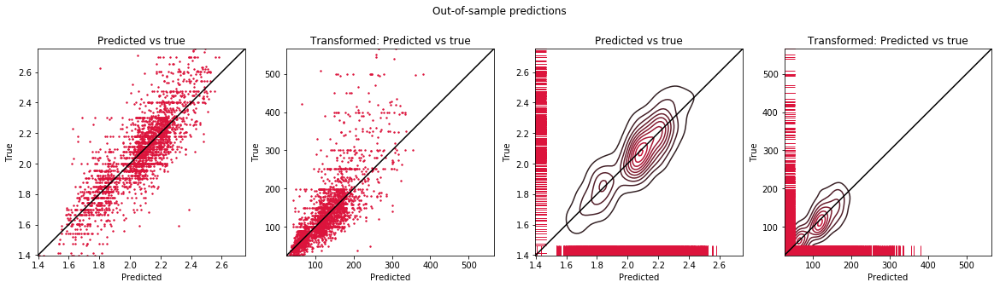

In [444]:
test_tpl = (X_test_add_log, y_test_add_log)
rf_add_pca_sub_log = print_results('RF_add_pca_sub_log.p', test_tpl, train_tpl, 'both', True)

In [445]:
best_params = rf_add_pca_sub_log['fitted_model'].best_params_
best_params

{'rf__n_estimators': 40,
 'rf__min_samples_split': 5,
 'rf__min_samples_leaf': 1,
 'rf__max_features': 'log2',
 'rf__max_depth': 20,
 'feats__pipe2__pca2__n_components': 2,
 'feats__pipe1__pca1__n_components': 1}

XGBoost

*This step is time consuming and thus set to Raw*

Untransformed
-------------
R2 train: 0.77 / RMSE train 0.12 / MAE train 0.09 / Nobs: 8448
R2 test: 0.68 / RMSE test 0.14 / MAE test 0.10 / Nobs: 2453

Transformed
-----------
R2 train: 0.69 / RMSE train 44.56 / MAE train 27.78 / Nobs: 8448
R2 test: 0.56 / RMSE test 54.76 / MAE test 33.22 / Nobs: 2453



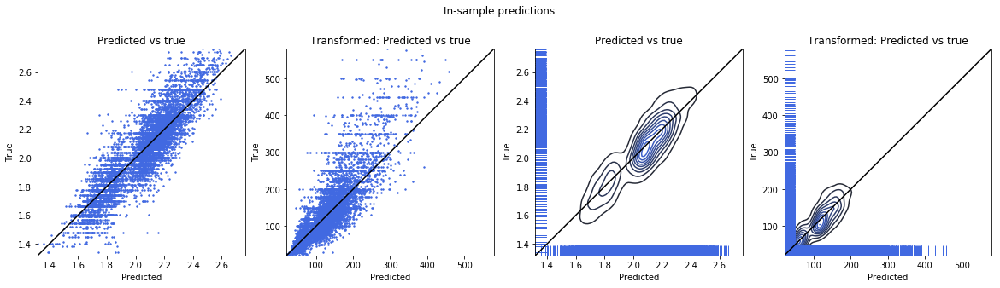

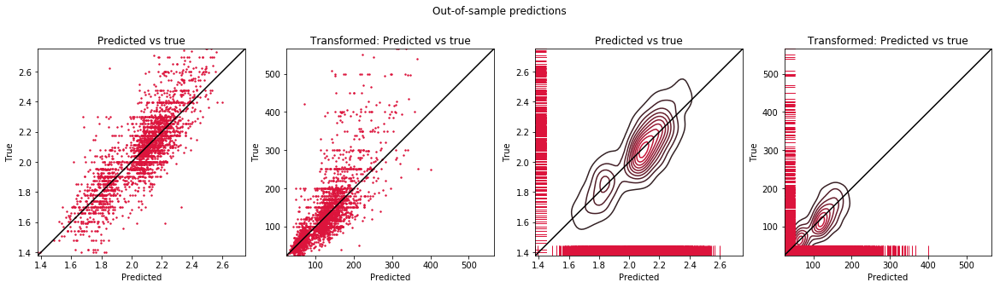

In [446]:
test_tpl = (X_test_add_log, y_test_add_log)
xgb_add_pca_sub_log = print_results('XGB_add_pca_sub_log.p', test_tpl, train_tpl, 'both', True)

In [447]:
best_params = xgb_add_pca_sub_log['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 7,
 'xgb__max_depth': 6,
 'xgb__gamma': 0.0,
 'xgb__eta': 0.05,
 'feats__pipe2__pca2__n_components': 1,
 'feats__pipe1__pca1__n_components': 1}

#### PCA on all variables

To finish, let's apply pca on all of the variables. Again, airbnb prices are predicted directly and indirectly.

In [448]:
# Source: https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 20, stop = 200, num = 10)]

# Number of features to consider at every split
max_features = ['sqrt', 'log2']

# Maximum number of levels in tree (there are 47 features in total in this example)
max_depth = [int(x) for x in np.linspace(5, 20, num = 4)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4, 6, 10]

param_grid_rf_pca_all = {'rf__n_estimators': n_estimators,
                         'rf__max_features': max_features,
                         'rf__max_depth': max_depth,
                         'rf__min_samples_split': min_samples_split,
                         'rf__min_samples_leaf': min_samples_leaf,
                         'pca__n_components': [1,2,3,4,5,6,7,8,9,10]
                        }

print(param_grid_rf_pca_all)

{'rf__n_estimators': [20, 40, 60, 80, 100, 120, 140, 160, 180, 200], 'rf__max_features': ['sqrt', 'log2'], 'rf__max_depth': [5, 10, 15, 20, None], 'rf__min_samples_split': [2, 5, 10], 'rf__min_samples_leaf': [1, 2, 4, 6, 10], 'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}


In [449]:
param_grid_xgb_pca_all = {'xgb__eta': [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ],
                          'xgb__max_depth' : [ 3, 4, 5, 6, 8, 10, 12, 15],
                          'xgb__min_child_weight' : [ 1, 3, 5, 7 ],
                          'xgb__gamma': [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
                          'pca__n_components': [1,2,3,4,5,6,7,8,9,10]
                         }
param_grid_xgb_pca_all

{'xgb__eta': [0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
 'xgb__max_depth': [3, 4, 5, 6, 8, 10, 12, 15],
 'xgb__min_child_weight': [1, 3, 5, 7],
 'xgb__gamma': [0.0, 0.1, 0.2, 0.3, 0.4],
 'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}

**Direct**

In [450]:
train_tpl = (X_train_add, y_train_add)
valid_tpl = (X_valid_add, y_valid_add)

*Constructed aggregation - 500m*

Random Forest

*This step is time consuming and thus set to Raw* 

Untransformed
-------------
R2 train: 0.80 / RMSE train 35.80 / MAE train 24.31 / Nobs: 8448
R2 test: 0.58 / RMSE test 53.77 / MAE test 33.65 / Nobs: 2453


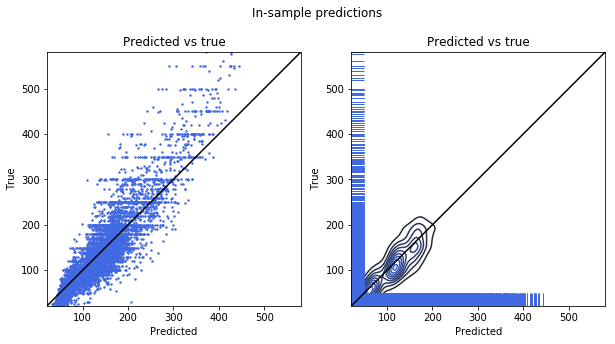

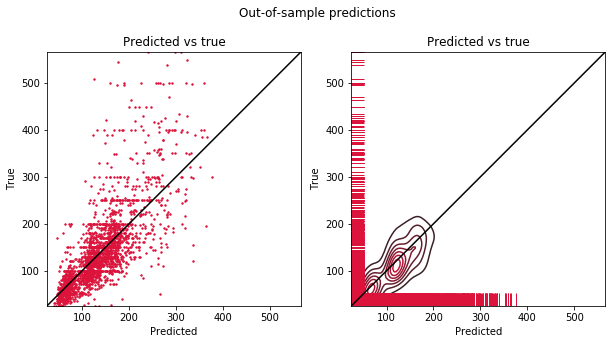

In [451]:
test_tpl = (X_test_add, y_test_add)
rf_add_pca_all = print_results('RF_add_pca_all.p', test_tpl, train_tpl, None, True)

In [452]:
best_params = rf_add_pca_all['fitted_model'].best_params_
best_params

{'rf__n_estimators': 100,
 'rf__min_samples_split': 2,
 'rf__min_samples_leaf': 1,
 'rf__max_features': 'sqrt',
 'rf__max_depth': 15,
 'pca__n_components': 9}

XGBoost

Untransformed
-------------
R2 train: 0.55 / RMSE train 53.28 / MAE train 35.41 / Nobs: 8448
R2 test: 0.51 / RMSE test 58.16 / MAE test 37.51 / Nobs: 2453


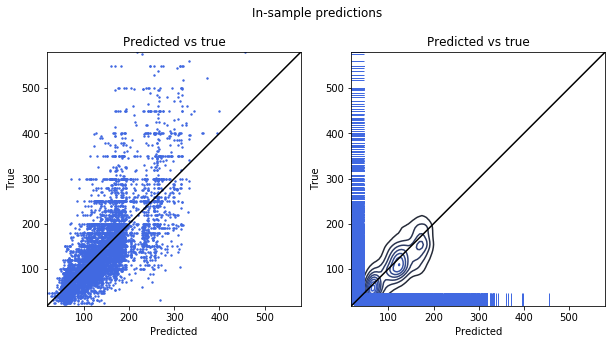

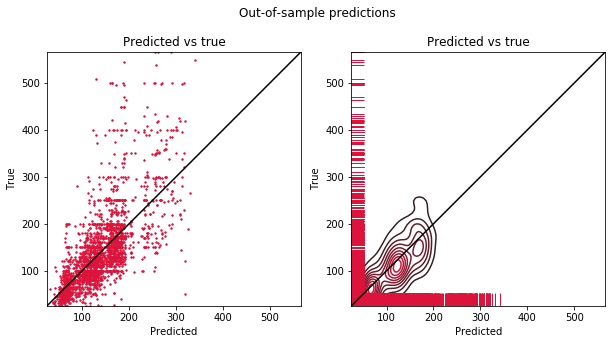

In [453]:
test_tpl = (X_test_add, y_test_add)
xgb_add_pca_all = print_results('XGB_add_pca_all.p', test_tpl, train_tpl, None, True)

In [454]:
best_params = xgb_add_pca_all['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 1,
 'xgb__max_depth': 3,
 'xgb__gamma': 0.4,
 'xgb__eta': 0.3,
 'pca__n_components': 2}

**Log-transformation**

In [455]:
train_tpl = (X_train_add_log, y_train_add_log)
valid_tpl = (X_valid_add_log, y_valid_add_log)

*Constructed aggregation - 500m*

Random Forest

Untransformed
-------------
R2 train: 0.73 / RMSE train 0.13 / MAE train 0.09 / Nobs: 8448
R2 test: 0.67 / RMSE test 0.14 / MAE test 0.10 / Nobs: 2453

Transformed
-----------
R2 train: 0.62 / RMSE train 48.90 / MAE train 30.18 / Nobs: 8448
R2 test: 0.54 / RMSE test 55.96 / MAE test 33.69 / Nobs: 2453



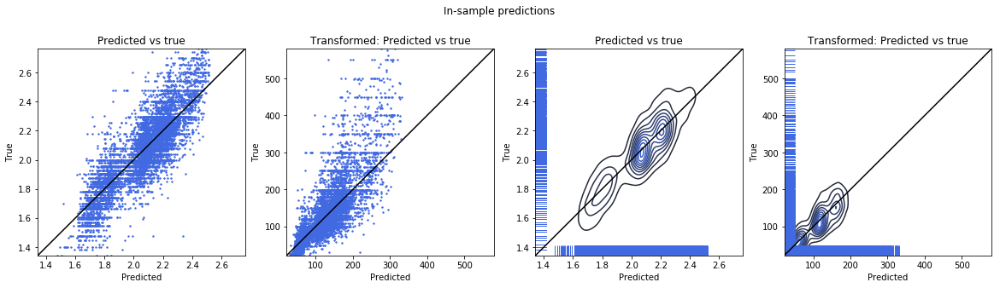

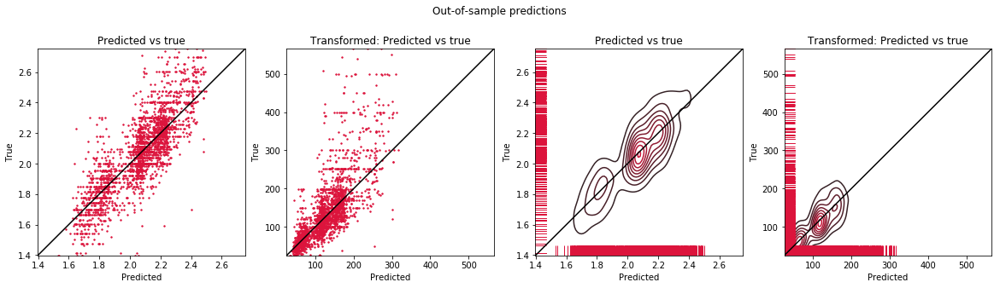

In [456]:
test_tpl = (X_test_add_log, y_test_add_log)
rf_add_pca_all_log = print_results('RF_add_pca_all_log.p', test_tpl, train_tpl, 'both', True)

In [457]:
best_params = rf_add_pca_all_log['fitted_model'].best_params_
best_params

{'rf__n_estimators': 60,
 'rf__min_samples_split': 2,
 'rf__min_samples_leaf': 6,
 'rf__max_features': 'log2',
 'rf__max_depth': 10,
 'pca__n_components': 5}

XGBoost

Untransformed
-------------
R2 train: 0.67 / RMSE train 0.14 / MAE train 0.11 / Nobs: 8448
R2 test: 0.63 / RMSE test 0.15 / MAE test 0.11 / Nobs: 2453

Transformed
-----------
R2 train: 0.54 / RMSE train 54.06 / MAE train 33.72 / Nobs: 8448
R2 test: 0.49 / RMSE test 59.05 / MAE test 35.82 / Nobs: 2453



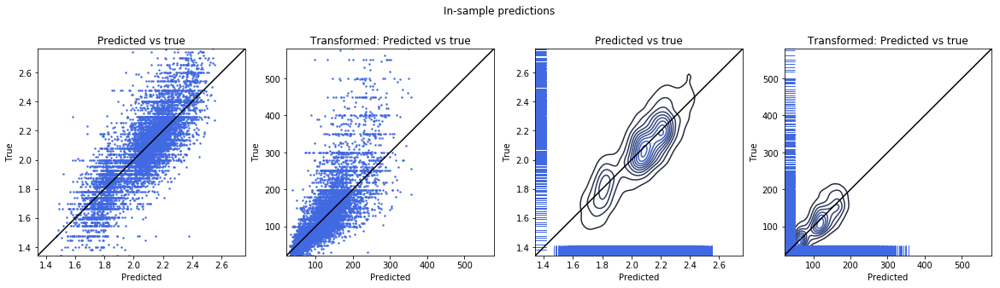

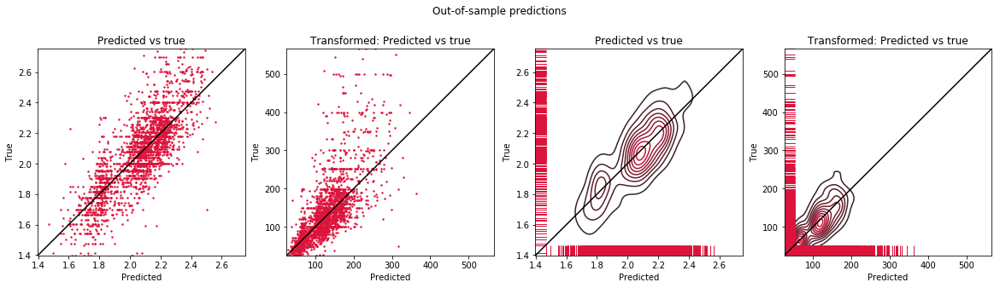

In [458]:
test_tpl = (X_test_add_log, y_test_add_log)
xgb_add_pca_all_log = print_results('XGB_add_pca_all_log.p', test_tpl, train_tpl, 'both', True)

In [459]:
best_params = xgb_add_pca_all_log['fitted_model'].best_params_
best_params

{'xgb__min_child_weight': 3,
 'xgb__max_depth': 3,
 'xgb__gamma': 0.0,
 'xgb__eta': 0.25,
 'pca__n_components': 3}

#### Summary

In the following plots the results from the `Random Forest` and `XGBoost` algorithms are run on the datasets with the additional variables `Air_cleaning_fee` and `Air_review_score_location` are shown. The results of the same algorithms applied on the smaller dataset from previous sections are plotted as a reference. The additional variables does not help to improve the predictions. Applying pca even lowers the performance substantially.

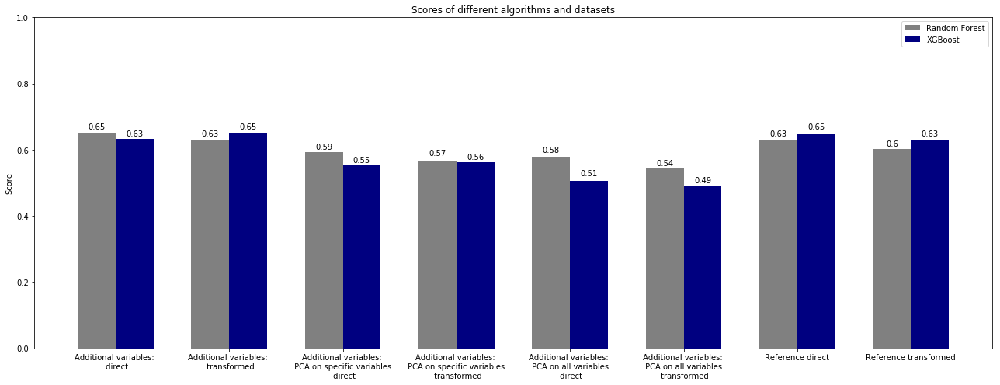

In [460]:
# Source: https://matplotlib.org/3.2.1/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py

scores_rf = [rf_add['test_r2'],
             rf_add_log['test_r2_transformed'],
             rf_add_pca_sub['test_r2'],
             rf_add_pca_sub_log['test_r2_transformed'],
             rf_add_pca_all['test_r2'],
             rf_add_pca_all_log['test_r2_transformed'],
             rf_500m_ut['test_r2'],
             rf_500m['test_r2_transformed']]

scores_xgb = [xgb_add['test_r2'],
              xgb_add_log['test_r2_transformed'],
              xgb_add_pca_sub['test_r2'],
              xgb_add_pca_sub_log['test_r2_transformed'],
              xgb_add_pca_all['test_r2'],
              xgb_add_pca_all_log['test_r2_transformed'],
              xgb_500m_ut['test_r2'],
              xgb_500m['test_r2_transformed']]

labels = ['Additional variables: \n direct', 
          'Additional variables: \n transformed', 
          'Additional variables: \n PCA on specific variables \n direct', 
          'Additional variables: \n PCA on specific variables \n transformed',
          'Additional variables: \n PCA on all variables \n direct', 
          'Additional variables: \n PCA on all variables \n transformed',
          'Reference direct',
          'Reference transformed']

factor = 1.5
x = np.arange(len(labels))*factor  # the label locations
width = 0.50  # the width of the bars

fig, ax = plt.subplots(figsize=(18, 7))
rects1 = ax.bar(x - 0.5*width, scores_rf, width, label='Random Forest', color='grey')
rects2 = ax.bar(x + 0.5*width, scores_xgb, width, label='XGBoost', color='navy')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Score')
ax.set_title('Scores of different algorithms and datasets')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
ax.set_ylim([0.0,1])

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = np.round(rect.get_height(),2)
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

## 5) Conclusion

We have tested different models on different datasets. `Random Forest` and `XGBoost` show the best results on all of the datasets tested. Furthermore, the performance of the models improves when the constructed aggregations of neighbouring airbnb prices as `Air_log_prices_500m_same_room_type`, `Air_log_prices_100m_same_room_type` or `Air_log_prices_50m_same_room_type` are considered in the models. One  finding is that it is much easier to predict log transformed airbnb prices than airbnb prices - presumably due to outliers in the data. <br>

We left out an analysis of the textual description of the accommodations. Furthermore, pictures of accommodations may also play an important role in the decision process of the users. It is thus not surprising that predicting airbnb prices remains difficult and more research needs to be done. 


<!---
Done:

- validation set
- other models
- hyperparameter optimization
- nicer/better plots in 3a
- PCA for variables about the size of the apartment and for the different review scores

To Do / questions:

- outliers (z-scores ...)
- processing textual information ("nice apartment" ...) -> 2, 3 or more categories: positve, neutral, negative (if existing) 
- variable importance: How reasonable for continuous variables? Neighbouring airbnb prices are very important, but likely biased
- others score. Should I also play with the metrics in grid search?
- is it okay to use randomized grid search.
- standard scaler is used in case of lin models with regularization and for xgb (also to speed up) and in one case for RF. Perhaps I should also use ist for AdaBoost.
--->
